# Using Data to Analyse Elite Running Performance

## 1. Introduction
### 1.1. Overview
This project analyses the performances of elite runners primarily in the modern Olympic running events through history. The aim is to find out if there is a relationship between the performances of the athletes and their characteristics (height, weight, age), and if there is, then to find out if this could be used to help coaches train better athletes in future.

First, the project will explore how running performances have changed over time, and attempt to predict how running times might evolve in future.

Next, it will examine how changes in performance correlate to characteristics of the athletes like height, weight and age. It will attempt to predict how the characterisitics of top athletes might change in future.

Finally, this project will look at how seemingly different sports might have more in common than it would first seem - information which could be useful in training athletes.

### 1.2. Plan
The big picture is to look at how results have changed over time (especially in running), to see if this correlates with athlete heights and weights (merge the track and field results with the Olympic results), use linear regression (or other technique?) to predict running times and to do some unsupervised clustering to see if top athletes (medal winners) fall into specific groups based on height, weight and age (and possibly year of competition).

The plan is to:

1) Use the top 1000 running performances to look at how times have changed in groups: sprinters, middle distance, long distance and road running.

2) Create a model to predict times.

3) Standardise the labels for the events.

4) Use fuzzy matching to merge the olympic track and field results into the olympic data set.

5) Then we can look at how height, weight, age correlate with results.

6) Clustering model based on medal winners. Take population of all athletes and do unsupervised clustering. Use PCA. Then take particular disciplines and find what clusters they fall into. What can different disciplines learn from each other?

In [1]:
# Import libraries
import pandas as pd
# Character encoding
import chardet
# For fixing encoding issues
import ftfy
from matplotlib import pyplot as plt
from datetime import datetime, time
import numpy as np
import math
# For inexact ("fuzzy") string matching
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
# For future compatibility when plotting with datetime
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

## 2. Data Preparation
### 2.1. Load Data and Initial Analysis
Three data sets are used in this project. First, load the data sets and briefly examine them.

#### 2.1.1. Olympic Games Results and Athletes, 1896-2016 
The first data set is the Olympic Games results and athlete data, 1896-2016.

Source:

https://www.kaggle.com/heesoo37/120-years-of-olympic-history-athletes-and-results/downloads/120-years-of-olympic-history-athletes-and-results.zip/2

In [2]:
# Results data is in the first file:
all_olympics = pd.read_csv('datasets/athlete_events.csv')
# Three-letter country codes are in the second file:
countrycode = pd.read_csv('datasets/noc_regions.csv')
all_olympics.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [3]:
all_olympics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
ID        271116 non-null int64
Name      271116 non-null object
Sex       271116 non-null object
Age       261642 non-null float64
Height    210945 non-null float64
Weight    208241 non-null float64
Team      271116 non-null object
NOC       271116 non-null object
Games     271116 non-null object
Year      271116 non-null int64
Season    271116 non-null object
City      271116 non-null object
Sport     271116 non-null object
Event     271116 non-null object
Medal     39783 non-null object
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


**Summary**

The full Olympic Games data set contains useful information over a 120 year period about the competitiors (height, weight, age, country of origin, and medal, if they won one.

#### 2.1.2. - Olympic track and field times and results
The second data set contains the Olympic track and field times and results. Note it only includes data for medal winners.
Source:

https://www.kaggle.com/jayrav13/olympic-track-field-results/downloads/olympic-track-field-results.zip/1

In [4]:
# Data set 2 - Olympic track and field times and results. Source:
# https://www.kaggle.com/jayrav13/olympic-track-field-results/downloads/olympic-track-field-results.zip/1
# There is an additional column in a few of the rows. This is unlabelled so not useful in this analysis.
# Therefore, read explicitly labelled columns and disgard the unlabelled column.
ol_tf = pd.read_csv('datasets/results.csv', names=['Gender', 
                                                    'Event', 
                                                    'Location', 
                                                    'Year', 
                                                    'Medal', 
                                                    'Name', 
                                                    'Nationality', 
                                                    'Result'])
ol_tf.drop(index=0, inplace=True)
ol_tf.head()

,Gender,Event,Location,Year,Medal,Name,Nationality,Result
1,M,10000M Men,Rio,2016,G,Mohamed FARAH,USA,25:05.17
2,M,10000M Men,Rio,2016,S,Paul Kipngetich TANUI,KEN,27:05.64
3,M,10000M Men,Rio,2016,B,Tamirat TOLA,ETH,27:06.26
4,M,10000M Men,Beijing,2008,G,Kenenisa BEKELE,ETH,27:01.17
5,M,10000M Men,Beijing,2008,S,Sileshi SIHINE,ETH,27:02.77


In [5]:
ol_tf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2394 entries, 1 to 2394
Data columns (total 8 columns):
Gender         2394 non-null object
Event          2394 non-null object
Location       2394 non-null object
Year           2394 non-null object
Medal          2394 non-null object
Name           2164 non-null object
Nationality    2394 non-null object
Result         2394 non-null object
dtypes: object(8)
memory usage: 168.3+ KB


**Summary**

The most useful feature of the track and field results is the detailed running times and event results. This will be linked to the full Olympic data (including its information on the athletes' characteristics) later in the analysis. The one feature that has some missing values is the name.

#### 2.1.3. Top 1000 Running Performances for all Olympic Distances and the Half Marathon
The third data set contains the top 1000 running performances for each running event.

Source:

https://www.kaggle.com/jguerreiro/running/downloads/running.zip/2

In [6]:
top_running = pd.read_csv('datasets/data.csv')
top_running.head()

,Rank,Time,Name,Country,Date of Birth,Place,City,Date,Gender,Event
0,1,00:01:40.910000,David Rudisha,KEN,1988-12-17,1.0,London,2012-09-08,Men,800 m
1,2,00:01:41.010000,David Rudisha,KEN,1988-12-17,1.0,Rieti,2010-08-29,Men,800 m
2,3,00:01:41.090000,David Rudisha,KEN,1988-12-17,1.0,Berlin,2010-08-22,Men,800 m
3,4,00:01:41.110000,Wilson Kipketer,DEN,1970-12-12,1.0,Köln,1997-08-24,Men,800 m
4,5,00:01:41.240000,Wilson Kipketer,DEN,1970-12-12,1.0,Zürich,1997-08-13,Men,800 m


In [7]:
top_running.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18244 entries, 0 to 18243
Data columns (total 10 columns):
Rank             18244 non-null int64
Time             18244 non-null object
Name             18244 non-null object
Country          18244 non-null object
Date of Birth    18244 non-null object
Place            18236 non-null float64
City             18244 non-null object
Date             18244 non-null object
Gender           18244 non-null object
Event            18244 non-null object
dtypes: float64(1), int64(1), object(8)
memory usage: 1.4+ MB


**Summary**

This data set is good because it contains a large number of data points (1000) including finish times for every running discipline. It is not limited to Olympic performances, but all the events are Olympic distances, with the exception of the half marathon. This data set really gives a lot of information specifically about running.

### 2.2. Data Wrangling

### 2.2.1. Olympic Results Data

#### 2.2.1.1. Events

In [8]:
print("Number of unique events is {}".format(len(all_olympics['Event'].unique())))

Number of unique events is 765


765 events is far too many to analyse. It also includes some events which have not taken place in the Olympics for a long time. This analysis is focussed on modern events, and mostly on track and field events, so we will extract a subset of the results.

In [9]:
olympic_sports_groups = all_olympics.groupby('Sport')
athletics = olympic_sports_groups.get_group('Athletics')
all_athletics_events = athletics['Event'].unique()
all_athletics_events

array(["Athletics Women's 100 metres",
       "Athletics Women's 4 x 100 metres Relay",
       "Athletics Men's Shot Put", "Athletics Men's Pole Vault",
       "Athletics Men's High Jump", "Athletics Men's 1,500 metres",
       "Athletics Men's 4 x 100 metres Relay",
       "Athletics Men's Long Jump", "Athletics Women's Javelin Throw",
       "Athletics Men's 5,000 metres", "Athletics Women's Shot Put",
       "Athletics Men's 110 metres Hurdles", "Athletics Women's Marathon",
       "Athletics Men's 100 metres", "Athletics Men's 400 metres Hurdles",
       "Athletics Men's 400 metres", "Athletics Men's Hammer Throw",
       "Athletics Men's 800 metres", "Athletics Men's Marathon",
       "Athletics Men's 4 x 400 metres Relay",
       "Athletics Men's 10,000 metres", "Athletics Women's 3,000 metres",
       "Athletics Men's 200 metres", "Athletics Men's Javelin Throw",
       "Athletics Men's 3,000 metres Steeplechase",
       "Athletics Women's 200 metres", "Athletics Men's Triple Ju

This is a more manageable list of events. There are still some events here that don't exist in the modern Games. The next step is to remove any events that didn't take place in the most recent summer Games (2016).

In [10]:
modern_athletics_events = athletics[athletics['Year']==2016]['Event'].unique()
modern_athletics_events

array(["Athletics Men's 5,000 metres", "Athletics Men's 400 metres",
       "Athletics Men's 10,000 metres", "Athletics Women's 200 metres",
       "Athletics Men's Decathlon", "Athletics Men's Marathon",
       "Athletics Women's Shot Put", "Athletics Women's 400 metres",
       "Athletics Men's Shot Put", "Athletics Women's Marathon",
       "Athletics Men's 100 metres", "Athletics Women's 100 metres",
       "Athletics Women's 4 x 100 metres Relay",
       "Athletics Men's 200 metres",
       "Athletics Men's 4 x 100 metres Relay",
       "Athletics Men's High Jump", "Athletics Men's Triple Jump",
       "Athletics Women's Heptathlon", "Athletics Women's Javelin Throw",
       "Athletics Women's Pole Vault",
       "Athletics Women's 20 kilometres Walk",
       "Athletics Women's 3,000 metres Steeplechase",
       "Athletics Men's 3,000 metres Steeplechase",
       "Athletics Women's 800 metres", "Athletics Women's 1,500 metres",
       "Athletics Men's Discus Throw", "Athletics Men

In [11]:
removed_events = set(all_athletics_events).difference(modern_athletics_events)
removed_events

{"Athletics Men's 1,500 metres Walk",
 "Athletics Men's 1,600 metres Medley Relay",
 "Athletics Men's 10 kilometres Walk",
 "Athletics Men's 10 mile Walk",
 "Athletics Men's 2,500 metres Steeplechase",
 "Athletics Men's 2,590 metres Steeplechase",
 "Athletics Men's 200 metres Hurdles",
 "Athletics Men's 3 mile, Team",
 "Athletics Men's 3,000 metres Walk",
 "Athletics Men's 3,000 metres, Team",
 "Athletics Men's 3,200 metres Steeplechase",
 "Athletics Men's 3,500 metres Walk",
 "Athletics Men's 4 mile, Team",
 "Athletics Men's 4,000 metres Steeplechase",
 "Athletics Men's 5 mile",
 "Athletics Men's 5,000 metres, Team",
 "Athletics Men's 56-pound Weight Throw",
 "Athletics Men's 60 metres",
 "Athletics Men's All-Around Championship",
 "Athletics Men's Cross-Country, Individual",
 "Athletics Men's Cross-Country, Team",
 "Athletics Men's Discus Throw, Both Hands",
 "Athletics Men's Discus Throw, Greek Style",
 "Athletics Men's Javelin Throw, Both Hands",
 "Athletics Men's Javelin Throw, Fr

In [12]:
indices_to_remove = [athletics.index[i] for i in range(len(athletics)) if athletics['Event'].iloc[i] in removed_events]
modern_athletics = athletics.drop(index=indices_to_remove)
modern_athletics['Event'].unique()

array(["Athletics Women's 100 metres",
       "Athletics Women's 4 x 100 metres Relay",
       "Athletics Men's Shot Put", "Athletics Men's Pole Vault",
       "Athletics Men's High Jump", "Athletics Men's 1,500 metres",
       "Athletics Men's 4 x 100 metres Relay",
       "Athletics Men's Long Jump", "Athletics Women's Javelin Throw",
       "Athletics Men's 5,000 metres", "Athletics Women's Shot Put",
       "Athletics Men's 110 metres Hurdles", "Athletics Women's Marathon",
       "Athletics Men's 100 metres", "Athletics Men's 400 metres Hurdles",
       "Athletics Men's 400 metres", "Athletics Men's Hammer Throw",
       "Athletics Men's 800 metres", "Athletics Men's Marathon",
       "Athletics Men's 4 x 400 metres Relay",
       "Athletics Men's 10,000 metres", "Athletics Men's 200 metres",
       "Athletics Men's Javelin Throw",
       "Athletics Men's 3,000 metres Steeplechase",
       "Athletics Women's 200 metres", "Athletics Men's Triple Jump",
       "Athletics Women's Lon

This analysis will focus on individual running events. So, now remove the field events and non-running events.

In [13]:
# These are the events to keep for the analysis.
modern_individual_running_events = {"Athletics Women's 100 metres",
                            "Athletics Men's 1,500 metres",
                            "Athletics Men's 5,000 metres",
                            "Athletics Men's 110 metres Hurdles",
                            "Athletics Women's Marathon",
                            "Athletics Men's 100 metres", 
                            "Athletics Men's 400 metres Hurdles",
                            "Athletics Men's 400 metres", 
                            "Athletics Men's 800 metres",
                            "Athletics Men's Marathon",
                            "Athletics Men's 10,000 metres", 
                            "Athletics Men's 200 metres",
                            "Athletics Men's 3,000 metres Steeplechase",
                            "Athletics Women's 200 metres", 
                            "Athletics Women's 5,000 metres",
                            "Athletics Women's 10,000 metres",
                            "Athletics Women's 1,500 metres",
                            "Athletics Women's 800 metres", 
                            "Athletics Women's 400 metres",
                            "Athletics Women's 400 metres Hurdles",
                            "Athletics Women's 100 metres Hurdles",
                            "Athletics Women's 3,000 metres Steeplechase"}

In [14]:
removed_events = set(modern_athletics_events).difference(modern_individual_running_events)
removed_events

{"Athletics Men's 20 kilometres Walk",
 "Athletics Men's 4 x 100 metres Relay",
 "Athletics Men's 4 x 400 metres Relay",
 "Athletics Men's 50 kilometres Walk",
 "Athletics Men's Decathlon",
 "Athletics Men's Discus Throw",
 "Athletics Men's Hammer Throw",
 "Athletics Men's High Jump",
 "Athletics Men's Javelin Throw",
 "Athletics Men's Long Jump",
 "Athletics Men's Pole Vault",
 "Athletics Men's Shot Put",
 "Athletics Men's Triple Jump",
 "Athletics Women's 20 kilometres Walk",
 "Athletics Women's 4 x 100 metres Relay",
 "Athletics Women's 4 x 400 metres Relay",
 "Athletics Women's Discus Throw",
 "Athletics Women's Hammer Throw",
 "Athletics Women's Heptathlon",
 "Athletics Women's High Jump",
 "Athletics Women's Javelin Throw",
 "Athletics Women's Long Jump",
 "Athletics Women's Pole Vault",
 "Athletics Women's Shot Put",
 "Athletics Women's Triple Jump"}

In [15]:
indices_to_remove = [modern_athletics.index[i] for i in range(len(modern_athletics)) if modern_athletics['Event'].iloc[i] in removed_events]
ol_running = modern_athletics.drop(index=indices_to_remove)
ol_running.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN
98,34,Jamale (Djamel-) Aarrass (Ahrass-),M,30.0,187.0,76.0,France,FRA,2012 Summer,2012,Summer,London,Athletics,"Athletics Men's 1,500 metres",NaN
148,55,Antonio Abadia Beci,M,26.0,170.0,65.0,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,"Athletics Men's 5,000 metres",NaN
190,86,Jos Manuel Abascal Gmez,M,22.0,182.0,67.0,Spain,ESP,1980 Summer,1980,Summer,Moskva,Athletics,"Athletics Men's 1,500 metres",NaN
191,86,Jos Manuel Abascal Gmez,M,26.0,182.0,67.0,Spain,ESP,1984 Summer,1984,Summer,Los Angeles,Athletics,"Athletics Men's 1,500 metres",Bronze


#### 2.2.1.2. Missing Values

In [16]:
# Check for missing values in each column.
ol_running.isnull().sum()

ID            0
Name          0
Sex           0
Age         667
Height     2987
Weight     3131
Team          0
NOC           0
Games         0
Year          0
Season        0
City          0
Sport         0
Event         0
Medal     17951
dtype: int64

Many rows have no entry for a medal, and this is expected - many competitors do not win a medal, so there is no special treatment needed for missing values in the Medal feature. There are also a lot of missing values for height, weight and age, these will be examined now.

In [17]:
age_missing = ol_running[ol_running['Age'].isnull()]
weight_missing = ol_running[ol_running['Weight'].isnull()]
height_missing = ol_running[ol_running['Height'].isnull()]

In [18]:
age_missing.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
314,167,Ould Lamine Abdallah,M,NaN,NaN,NaN,France,FRA,1952 Summer,1952,Summer,Helsinki,Athletics,"Athletics Men's 10,000 metres",NaN
327,179,Ibrahim Saad Abdel Galil,M,NaN,176.0,73.0,Sudan,SUD,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's 200 metres,NaN
353,194,Moustafa Mounib Abdel Kader,M,NaN,176.0,67.0,United Arab Republic,UAR,1960 Summer,1960,Summer,Roma,Athletics,Athletics Men's 100 metres,NaN
505,281,S. Abdul Hamid,M,NaN,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's 110 metres Hurdles,NaN
506,281,S. Abdul Hamid,M,NaN,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's 400 metres Hurdles,NaN


In [19]:
weight_missing.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN
215,104,Gana Abba Kimet,M,26.0,NaN,NaN,Chad,CHA,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's 100 metres,NaN
314,167,Ould Lamine Abdallah,M,NaN,NaN,NaN,France,FRA,1952 Summer,1952,Summer,Helsinki,Athletics,"Athletics Men's 10,000 metres",NaN
322,175,Abdelgani Hassan Abdel Fattah,M,31.0,NaN,NaN,Egypt,EGY,1952 Summer,1952,Summer,Helsinki,Athletics,Athletics Men's Marathon,NaN
429,237,Ben Ahmed Abdelkrim,M,20.0,NaN,NaN,France,FRA,1952 Summer,1952,Summer,Helsinki,Athletics,"Athletics Men's 5,000 metres",NaN


In [20]:
height_missing.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
215,104,Gana Abba Kimet,M,26.0,NaN,NaN,Chad,CHA,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's 100 metres,NaN
314,167,Ould Lamine Abdallah,M,NaN,NaN,NaN,France,FRA,1952 Summer,1952,Summer,Helsinki,Athletics,"Athletics Men's 10,000 metres",NaN
322,175,Abdelgani Hassan Abdel Fattah,M,31.0,NaN,NaN,Egypt,EGY,1952 Summer,1952,Summer,Helsinki,Athletics,Athletics Men's Marathon,NaN
429,237,Ben Ahmed Abdelkrim,M,20.0,NaN,NaN,France,FRA,1952 Summer,1952,Summer,Helsinki,Athletics,"Athletics Men's 5,000 metres",NaN
488,268,Brahim Daoud Abdoulaye,M,25.0,NaN,71.0,Chad,CHA,1996 Summer,1996,Summer,Atlanta,Athletics,Athletics Men's 200 metres,NaN


We now have three groups of rows that have at least one missing value. Now find out if they overlap by using sets:

In [21]:
age_missing_indices = set(age_missing.index)
weight_missing_indices = set(weight_missing.index)
height_missing_indices= set(height_missing.index)
print("The number of rows where both height and weight are missing is {}".format(
                        len(weight_missing_indices.intersection(height_missing_indices))))
print("The number of rows where both age and weight are missing is {}".format(
                        len(age_missing_indices.intersection(weight_missing_indices))))
print("The number of rows where both age and height are missing is {}".format(
                        len(age_missing_indices.intersection(height_missing_indices))))
print("The number of rows where age, height and weight are missing is {}".format(
                        len(age_missing_indices.intersection(height_missing_indices, weight_missing_indices))))

The number of rows where both height and weight are missing is 2961
The number of rows where both age and weight are missing is 537
The number of rows where both age and height are missing is 504
The number of rows where age, height and weight are missing is 504


Of the rows where either height (2987) or weight (3131) are missing, most (2961) of them are missing both height and weight. Of the rows where age is missing (667), most (at least 504) are also missing either weight, height or both. The overlap between the missing data sets is large, which is good news, because it means more of the rows are fully populated, so more of this data is usable without dropping data or imputation.

#### 2.2.1.3. Event Labels

The Event feature is a categorical variable. This will be encoded as follows:
 - Strip off the part of the string related to sport (== 'Athletics') - this is not useful anymore.
 - Strip off the gender ("Men's" or "Women's" - because this is already encoded in a separate feature
 - Define a feature 'Track_Flat'. This will cover all the flat (i.e. non-hurdles) track events. It will contain the integer distance of the race in metres, i.e. the 100 m will have a 'Track_Flat' value of 100. Events that are not flat track type will have a 'Track_Flat' value of 0.
 - Define a feature 'Hurdles'. This will be similar to the 'Track_Flat' feature, and will contain the integer distance of the race, or 0 for non-hurdles events.
 - Define a feature 'Road'. This will be the race distance in metrs (42195 m for a marathon, 21098 for a half marathon)
 - Define a feature 'Steeplechase'. This will be 3000 for steeplechase, 0 otherwise.

In [22]:
# Simple string processing in Event column
ol_running['Event'] = ol_running['Event'].str.replace("Athletics Women's ", "")
ol_running['Event'] = ol_running['Event'].str.replace("Athletics Men's ", "")
ol_running['Event'] = ol_running['Event'].str.replace(" metres", "")
ol_running['Event'] = ol_running['Event'].str.replace(",", "")

In [23]:
ol_running.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,100,NaN
98,34,Jamale (Djamel-) Aarrass (Ahrass-),M,30.0,187.0,76.0,France,FRA,2012 Summer,2012,Summer,London,Athletics,1500,NaN
148,55,Antonio Abadia Beci,M,26.0,170.0,65.0,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,5000,NaN
190,86,Jos Manuel Abascal Gmez,M,22.0,182.0,67.0,Spain,ESP,1980 Summer,1980,Summer,Moskva,Athletics,1500,NaN
191,86,Jos Manuel Abascal Gmez,M,26.0,182.0,67.0,Spain,ESP,1984 Summer,1984,Summer,Los Angeles,Athletics,1500,Bronze


Adding the new columns, copying the values between columns and removing duplicates is repetetive so write a function for this:

In [24]:
def encode_events(df, col, to_replace, replacement):
    """
    Helper function to insert new columns, copy and convert values to the correct column
    """
    # Insert new column
    df.insert(df.columns.get_loc('Event'), col, 0)
    # Copy values across to new column
    df.loc[df['Event'].str.contains(to_replace), col] = df['Event'].str.replace(to_replace, replacement)
    # Remove values from original column
    df.loc[df[col] != 0, 'Event'] = '0'

In [25]:
def string_to_int(df, features):
    """
    Helper function to cast string values to integers.
    """
    for feature in features:
        df[feature] = pd.to_numeric(df[feature], downcast='integer')

In [26]:
new_columns = ['Hurdles', 'Road', 'Steeplechase']
to_replace = [' Hurdles', 'Marathon', ' Steeplechase']
replacement = ['', '42195', '']


for i in range(len(new_columns)):
    encode_events(ol_running, new_columns[i], to_replace[i], replacement[i])
    
ol_running.rename(columns={'Event': 'Track_Flat'}, inplace=True)


#### 2.2.1.4. Other Processing

##### Cast Strings to Integers

In [27]:
# Several features now contain strings that would be easier to use as integers.
# Convert these to integers now.
columns_to_int = ['Track_Flat', 'Hurdles', 'Steeplechase', 'Road', 'Year']
string_to_int(ol_running, columns_to_int)

##### Sex
The other two data sets refer to this as 'Gender'. For ease of comparison, change the name of this feature from 'Sex' to ''Gender'.

In [28]:
ol_running.rename(columns={'Sex': 'Gender'}, inplace=True)

###### Medal
For ease of comparison with the other data sets, convert 'Gold' to 'G', 'Silver' to 'S', and 'Bronze to 'B'

In [29]:
medals = ['Gold', 'Silver', 'Bronze']
short_medals = ['G', 'S', 'B']

for i in range(len(medals)):
    ol_running.loc[ol_running['Medal'] == medals[i], 'Medal'] = ol_running[ol_running['Medal'] == medals[i]
                                                                       ]['Medal'].str.replace(medals[i], short_medals[i])

##### Name
The 'Name' column also looks like it could be difficult to use:

In [30]:
ol_running['Name'].head()

26     Cornelia "Cor" Aalten (-Strannood)
98     Jamale (Djamel-) Aarrass (Ahrass-)
148                   Antonio Abadia Beci
190               Jos Manuel Abascal Gmez
191               Jos Manuel Abascal Gmez
Name: Name, dtype: object

There are alternative names/nicknames in parentheses and double quotes. The intention is to use the names later on, so to make this easier, remove sections in parentheses and double uotes, and convert the name string to lowercase. Make this a function so it can be used on the other data sets later on.

In [31]:
def process_names(df):
    df.rename(columns={'Name': 'RawName'}, inplace=True)
    df.insert(loc = df.columns.get_loc('RawName'), column = 'Name', value=np.NaN)
    df['Name'] = df['RawName'].str.replace('\"(.*?)\"', '')
    df['Name'] = df['Name'].str.replace('\((.*?)\)', '')
    df['Name'] = df['Name'].str.lower()

In [32]:
process_names(ol_running)

In [33]:
ol_running.head()

,ID,Name,RawName,Gender,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Hurdles,Road,Steeplechase,Track_Flat,Medal
26,8,cornelia aalten,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,0,0,0,100,NaN
98,34,jamale aarrass,Jamale (Djamel-) Aarrass (Ahrass-),M,30.0,187.0,76.0,France,FRA,2012 Summer,2012,Summer,London,Athletics,0,0,0,1500,NaN
148,55,antonio abadia beci,Antonio Abadia Beci,M,26.0,170.0,65.0,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,0,0,0,5000,NaN
190,86,jos manuel abascal gmez,Jos Manuel Abascal Gmez,M,22.0,182.0,67.0,Spain,ESP,1980 Summer,1980,Summer,Moskva,Athletics,0,0,0,1500,NaN
191,86,jos manuel abascal gmez,Jos Manuel Abascal Gmez,M,26.0,182.0,67.0,Spain,ESP,1984 Summer,1984,Summer,Los Angeles,Athletics,0,0,0,1500,B


### 2.2.2. Olympic Track and Field Data

#### 2.2.2.1. Events

In [34]:
print("Number of unique events is {}".format(len(ol_tf['Event'].unique())))

Number of unique events is 47


In [35]:
ol_tf.head()

,Gender,Event,Location,Year,Medal,Name,Nationality,Result
1,M,10000M Men,Rio,2016,G,Mohamed FARAH,USA,25:05.17
2,M,10000M Men,Rio,2016,S,Paul Kipngetich TANUI,KEN,27:05.64
3,M,10000M Men,Rio,2016,B,Tamirat TOLA,ETH,27:06.26
4,M,10000M Men,Beijing,2008,G,Kenenisa BEKELE,ETH,27:01.17
5,M,10000M Men,Beijing,2008,S,Sileshi SIHINE,ETH,27:02.77


In [36]:
all_ol_tf_events = ol_tf['Event'].unique()
all_ol_tf_events

array(['10000M Men', '100M Men', '110M Hurdles Men', '1500M Men',
       '200M Men', '20Km Race Walk Men', '3000M Steeplechase Men',
       '400M Hurdles Men', '400M Men', '4X100M Relay Men',
       '4X400M Relay Men', '5000M Men', '50Km Race Walk Men', '800M Men',
       'Decathlon Men', 'Discus Throw Men', 'Hammer Throw Men',
       'High Jump Men', 'Javelin Throw Men', 'Long Jump Men',
       'Marathon Men', 'Pole Vault Men', 'Shot Put Men',
       'Triple Jump Men', '10000M Women', '100M Hurdles Women',
       '100M Women', '1500M Women', '200M Women', '20Km Race Walk Women',
       '3000M Steeplechase Women', '400M Hurdles Women', '400M Women',
       '4X100M Relay Women', '4X400M Relay Women', '5000M Women',
       '800M Women', 'Discus Throw Women', 'Hammer Throw Women',
       'Heptathlon Women', 'High Jump Women', 'Javelin Throw Women',
       'Long Jump Women', 'Marathon Women', 'Pole Vault Women',
       'Shot Put Women', 'Triple Jump Women'], dtype=object)

As in the previous section, this analysis will keep the individual running events and drop the remainder.

In [37]:
ol_tf_running_events = {'10000M Men', '100M Men', '110M Hurdles Men', '1500M Men',
       '200M Men', '3000M Steeplechase Men',
       '400M Hurdles Men', '400M Men', '5000M Men',
       '800M Men', 'Marathon Men', '10000M Women', '100M Hurdles Women',
       '100M Women', '1500M Women', '200M Women',
       '3000M Steeplechase Women', '400M Hurdles Women', '400M Women',
       '5000M Women', '800M Women', 'Marathon Women'}

In [38]:
indices_to_remove = [ol_tf.index[i] for i in range(len(ol_tf)) 
                    if not ol_tf['Event'].iloc[i] in ol_tf_running_events]
ol_tf_running = ol_tf.drop(index=indices_to_remove)
ol_tf_running.head()

,Gender,Event,Location,Year,Medal,Name,Nationality,Result
1,M,10000M Men,Rio,2016,G,Mohamed FARAH,USA,25:05.17
2,M,10000M Men,Rio,2016,S,Paul Kipngetich TANUI,KEN,27:05.64
3,M,10000M Men,Rio,2016,B,Tamirat TOLA,ETH,27:06.26
4,M,10000M Men,Beijing,2008,G,Kenenisa BEKELE,ETH,27:01.17
5,M,10000M Men,Beijing,2008,S,Sileshi SIHINE,ETH,27:02.77


In [39]:
ol_tf_running['Event'].unique()

array(['10000M Men', '100M Men', '110M Hurdles Men', '1500M Men',
       '200M Men', '3000M Steeplechase Men', '400M Hurdles Men',
       '400M Men', '5000M Men', '800M Men', 'Marathon Men',
       '10000M Women', '100M Hurdles Women', '100M Women', '1500M Women',
       '200M Women', '3000M Steeplechase Women', '400M Hurdles Women',
       '400M Women', '5000M Women', '800M Women', 'Marathon Women'],
      dtype=object)

This now contains the data of interest.

#### 2.2.2.2. Missing Values

In [40]:
# Check for missing values in each column.
ol_tf_running.isnull().sum()

Gender         0
Event          0
Location       0
Year           0
Medal          0
Name           0
Nationality    0
Result         0
dtype: int64

No missing values are shown but this is deceptive, since some of the 'Result' fields conatin the string 'None'.

In [41]:
ol_tf_running[ol_tf_running['Result'] == 'None'].head()

,Gender,Event,Location,Year,Medal,Name,Nationality,Result
107,M,100M Men,London,1908,S,John RECTOR,USA,None
108,M,100M Men,London,1908,B,Robert KERR,CAN,None
190,M,110M Hurdles Men,London,1908,B,Arthur SHAW,USA,None
300,M,1500M Men,Los Angeles,1932,B,Philip EDWARDS,CAN,None
309,M,1500M Men,St Louis,1904,B,Lacey HEARN,USA,None


In [42]:
ol_tf_running.loc[ol_tf_running['Result'] == 'None', 'Result'] = pd.NaT
ol_tf_running.dropna(subset=['Result'], inplace=True)

#### 2.2.2.3. Event Labels
The same approach will be used as in [the previous section](#2.2.1.3.-Event-Labels) so that the data sets end up with a consistent set of labels for each event.

In [43]:
# Simple string processing in Event column
ol_tf_running['Event'] = ol_tf_running['Event'].str.replace("Women", "")
ol_tf_running['Event'] = ol_tf_running['Event'].str.replace("Men", "")
ol_tf_running['Event'] = ol_tf_running['Event'].str.replace("M ", "")
ol_tf_running['Event'] = ol_tf_running['Event'].str.replace(",", "")

new_columns = ['Hurdles', 'Road', 'Steeplechase']
to_replace = ['Hurdles', 'Marathon', 'Steeplechase']
replacement = ['', '42195', '']

for i in range(len(new_columns)):
    encode_events(ol_tf_running, new_columns[i], to_replace[i], replacement[i])
    
ol_tf_running.rename(columns={'Event': 'Track_Flat'}, inplace=True)

##### Results
The aim is to convert the Results string to a datetime object, extract the time from this and store it in a feature called 'Time'. The time formats vary a lot in this data set so some cleaning is needed.

It's possible to create general groups of events that share similar formats. 

In [44]:
# Hurdle events
ol_tf_running_hurdles_groups = ol_tf_running.groupby('Hurdles')
# Road running events
ol_tf_running_road_groups = ol_tf_running.groupby('Road')
# Steeplechase
ol_tf_running_steeplechase_groups = ol_tf_running.groupby('Steeplechase')
# Track (flat) events
ol_tf_running_trackf_groups = ol_tf_running.groupby('Track_Flat')

event_groups = [ol_tf_running_hurdles_groups, 
          ol_tf_running_road_groups, 
          ol_tf_running_steeplechase_groups, 
          ol_tf_running_trackf_groups]

for group in event_groups:
    for event in list(group.groups.keys())[1:]: # Ignore the first event in each category where distance=0
        print("Event: {}".format(event))
        print(group.get_group(event)['Result'].head(3))


Event: 100 
1654    12.48
1655    12.59
1656    12.61
Name: Result, dtype: object
Event: 110 
152    13.05
153    13.17
154    13.24
Name: Result, dtype: object
Event: 400 
511    47.73
512    47.78
513    47.92
Name: Result, dtype: object
Event: 42195 
1376    02:08:44
1377     2:09:54
1378     2:10:05
Name: Result, dtype: object
Event: 3000 
439    8:03.28
440    8:04.28
441    8:11.52
Name: Result, dtype: object
Event: 100
70    9.81
71    9.89
72    9.91
Name: Result, dtype: object
Event: 10000
1    25:05.17
2    27:05.64
3    27:06.26
Name: Result, dtype: object
Event: 1500
232    3:50.00
233    3:50.11
234    3:50.24
Name: Result, dtype: object
Event: 200
313    19.78
314    20.02
315    20.12
Name: Result, dtype: object
Event: 400
586    43.03
587    43.76
588    43.85
Name: Result, dtype: object
Event: 5000
804    13:03.30
805    13:03.90
806    13:04.35
Name: Result, dtype: object
Event: 800
930    1:42.15
931    1:42.61
932    1:42.93
Name: Result, dtype: object


This shows it's possible to define three time formats in this result set:

In [45]:
# Time format for the sprint events
time_format_sprints = '%S.%f'

# Time format for middle distance events
time_format_middle = '%M:%S.%f'

# Time format for long distance events
time_format_long = '%H:%M:%S'

Examining each event in more detail shows that some further processing is needed.

**Steeplechase**

In [46]:
ol_tf_running_steeplechase_groups.get_group('3000 ')['Result']

439      8:03.28
440      8:04.28
441      8:11.52
442      8:10.34
443      8:10.49
444      8:11.01
445     08:21.43
446     08:21.77
447     08:22.15
448      8:08.84
449      8:09.55
450      8:10.74
451      8:11.80
452      8:13.31
453      8:14.06
454      8:08.02
455      8:09.11
456      8:10.36
457       8:51.0
458       8:51.6
459       8:51.8
460       8:34.2
461       8:36.4
462       8:42.2
463      08:45.4
464      08:51.6
465      08:51.8
466       9:03.8
467       9:06.8
468       9:07.2
          ...   
488      08:12.5
489      08:13.6
490      8:23.64
491      8:24.62
492      8:24.66
493       8:30.8
494       8:32.4
495       8:33.8
496       8:41.2
497       8:43.6
498       8:44.0
499       9:04.6
500       9:08.2
501       9:11.8
502      10:33.4
503      10:46.0
504      10:46.2
505       9:33.6
506       9:44.0
507       9:45.2
508       7:39.6
509       7:40.6
1846     8:59.75
1847     9:07.12
1848     9:07.63
1849     8:58.81
1850     9:07.41
1851     9:08.

In [47]:
# Convert to datetime and extract the time part only.
ol_tf_running.loc[ol_tf_running['Steeplechase'] == '3000 ', 'Time'] = pd.to_datetime(
    ol_tf_running[ol_tf_running['Steeplechase'] == '3000 ']['Result'], format=time_format_middle).apply(datetime.time)

**Hurdles**

In [48]:
ol_tf_running_hurdles_groups.get_group('100 ')['Result']

1654    12.48
1655    12.59
1656    12.61
1657    12.54
1658    12.64
1659    12.64
1660    12.65
1661    12.68
1662    12.76
1663    12.64
1664    12.69
1665     12.7
1666    12.84
1667    12.88
1668    13.06
1669    13.06
1670    12.77
1671    12.78
1672     12.8
1673    12.35
1674    12.37
1675    12.48
1676    12.37
1677    12.45
1678    12.56
1679    12.58
1680    12.59
1681    12.65
1682    12.56
1683    12.63
1684    12.65
1685    12.59
1686    12.84
1687     12.9
Name: Result, dtype: object

In [49]:
ol_tf_running_hurdles_groups.get_group('110 ')['Result']

152    13.05
153    13.17
154    13.24
155    12.93
156    13.17
157    13.18
158     13.0
159    13.16
160    13.22
161    13.12
162    13.24
163    13.26
164     13.2
165    13.23
166     13.4
167     13.3
168    13.33
169    13.38
170     13.3
171     13.4
172     13.4
173     13.8
174     13.8
175     14.0
176     13.7
177     13.7
178     14.1
179     14.2
180     14.4
181     14.4
       ...  
202    13.17
203    13.39
204     13.4
205    13.44
206    13.24
207    13.34
208    13.48
209     13.6
210     13.7
211     13.7
212     13.5
213     13.5
214     14.1
215     13.9
216     14.1
217     14.1
218     14.6
219     14.7
220     14.8
221     15.0
222     15.0
223     15.4
224     15.1
225     15.2
226     15.3
227     16.0
228     16.3
229     16.4
230     17.6
231     17.7
Name: Result, Length: 79, dtype: object

In [50]:
ol_tf_running_hurdles_groups.get_group('400 ')['Result']

511     47.73
512     47.78
513     47.92
514     47.25
515     47.98
516     48.06
517      47.5
518     47.53
519     47.81
520     46.78
521     47.66
522     47.82
523     47.75
524     48.13
525     48.19
526     47.64
527     48.69
528     49.45
529      48.1
530      49.0
531      49.0
532      49.3
533      49.6
534      49.7
535      50.8
536      51.3
537      52.2
538      52.4
539      52.7
540      52.8
        ...  
577      52.6
578      53.8
579      54.2
580      55.0
583      57.6
584      58.3
1854    53.13
1855    53.55
1856    53.72
1857    52.64
1858     53.7
1859    53.84
1860    53.02
1861    53.45
1862    53.57
1863    53.23
1864    53.69
1865    54.31
1866    54.61
1867     55.2
1868    55.41
1869     52.7
1870    52.77
1871    53.38
1872    52.82
1873    53.38
1874    53.44
1875    52.82
1876    53.08
1877    53.22
Name: Result, Length: 95, dtype: object

In addition, some of the time strings have a leading '0:':

In [51]:
ol_tf_running[ol_tf_running['Result'] == '0:54.0']

,Gender,Hurdles,Road,Steeplechase,Track_Flat,Location,Year,Medal,Name,Nationality,Result,Time
544,M,400,0,0,0,Antwerp,1920,G,Frank LOOMIS,USA,0:54.0,NaN


In [52]:
# Remove leading '0:':
ol_tf_running.loc[ol_tf_running['Hurdles'] == '400 ', 'Result'] = ol_tf_running[ol_tf_running['Hurdles'] == '400 ']['Result'].str.replace('0:', '')

In [53]:
# For all the Hurdles distances - convert to datetime and extract the time part only.
events = list(ol_tf_running_hurdles_groups.groups.keys())
events.remove(0) # Ignore the fist event in each category where distance=0
for event in events:
    ol_tf_running.loc[ol_tf_running['Hurdles'] == event, 'Time'] = pd.to_datetime(
        ol_tf_running[ol_tf_running['Hurdles'] == event]['Result'], format=time_format_sprints).apply(datetime.time)

**Track (Flat)**

In [54]:
ol_tf_running_trackf_groups.get_group('100')['Result']

70       9.81
71       9.89
72       9.91
73       9.69
74       9.89
75       9.91
76       9.87
77       9.99
78      10.04
79       9.96
80      10.02
81      10.04
82       9.99
83      10.19
84      10.22
85      10.06
86      10.08
87      10.14
88        9.9
89       10.0
90       10.0
91       10.2
92       10.2
93       10.3
94       10.4
95       10.4
96       10.4
97       10.3
98       10.4
99       10.5
        ...  
1716     11.7
1717     11.9
1718     12.2
1721    10.75
1722    10.78
1723    10.81
1724    10.93
1725    10.96
1726    10.97
1727    10.94
1728    10.94
1729    10.96
1730    11.06
1731    11.07
1732    11.14
1733    11.07
1734    11.23
1735    11.24
1736     11.4
1737     11.6
1738     11.6
1739     11.5
1740     11.7
1741     11.7
1742     11.9
1743     12.2
1744     12.2
1745     11.9
1746     11.9
1747     12.0
Name: Result, Length: 138, dtype: object

In [55]:
ol_tf_running_trackf_groups.get_group('200')['Result']

313     19.78
314     20.02
315     20.12
316     19.30
317     19.96
318     19.98
319     20.09
320     20.14
321      20.2
322     20.01
323     20.13
324     20.38
325      19.8
326     19.96
327     20.26
328     20.23
329     20.29
330     20.43
331      19.8
332      20.0
333      20.0
334      20.5
335      20.6
336      20.7
337      20.7
338      20.8
339      20.8
340      20.7
341      21.1
342      21.3
        ...  
1801     24.0
1802     24.4
1803     24.7
1804     23.7
1805     24.2
1806     24.2
1807    21.88
1808    22.09
1809    22.14
1810    22.05
1811    22.18
1812     22.3
1813    22.12
1814    22.24
1815    22.38
1816    22.03
1817    22.19
1818     22.2
1819     22.4
1820    22.45
1821    22.74
1822     23.0
1823     23.1
1824     23.1
1825     23.4
1826     23.7
1827     23.8
1828     24.4
1829     25.1
1830     25.2
Name: Result, Length: 126, dtype: object

In [56]:
ol_tf_running_trackf_groups.get_group('400')['Result']

586     43.03
587     43.76
588     43.85
589     43.75
590     44.74
591      44.8
592     43.84
593      44.4
594      44.7
595      43.5
596     44.21
597     44.24
598     44.27
599     44.54
600     44.71
601     44.26
602      44.4
603     44.95
604      43.8
605      43.9
606      44.4
607      44.9
608      44.9
609      45.5
610      45.9
611      45.9
612      46.8
613      46.5
614      46.7
615      46.8
        ...  
1887    48.83
1888    49.05
1889    49.64
1890    48.83
1891    49.05
1892    49.42
1893    49.29
1894    50.51
1895    50.55
1896     52.0
1897     52.1
1898     52.2
1899    49.55
1900     49.7
1901    49.72
1902    49.41
1903    49.56
1904    49.89
1905    48.25
1906    48.63
1907     49.1
1908    48.88
1909    49.46
1910    49.66
1911    51.08
1912    51.21
1913    51.64
1914     52.0
1915     52.2
1916     53.4
Name: Result, Length: 118, dtype: object

In [57]:
ol_tf_running_trackf_groups.get_group('800')['Result']

930      1:42.15
931      1:42.61
932      1:42.93
933      1:44.65
934      1:44.70
935      1:44.82
936     01:45.08
937     01:45.14
938     01:45.16
939      1:43.66
940      1:43.70
941      1:43.97
942      1:43.00
943      1:43.64
944      1:43.83
945      1:43.50
946      1:43.86
947      1:44.12
948       1:44.3
949       1:44.5
950       1:45.4
951       1:46.3
952       1:46.5
953       1:47.1
954       1:49.2
955       1:49.4
956       1:49.7
957       1:52.9
958       1:53.3
959       1:53.6
          ...   
2040     1:58.63
2041     1:58.83
2042     1:54.94
2043     1:55.42
2044     1:55.60
2045      2:00.9
2046      2:02.5
2047      2:02.6
2048      2:04.3
2049      2:04.4
2050      2:05.6
2051     1:56.19
2052     1:57.23
2053     1:57.53
2054     1:56.38
2055     1:56.43
2056     1:56.43
2057     1:57.73
2058     1:58.11
2059     1:58.71
2060      1:53.5
2061      1:54.9
2062      1:55.5
2063     1:58.55
2064     1:58.65
2065     1:59.19
2066      2:01.1
2067      2:01

In [58]:
ol_tf_running_trackf_groups.get_group('1500')['Result']

232      3:50.00
233      3:50.11
234      3:50.24
235      3:33.11
236      3:34.16
237      3:34.21
238     03:32.07
239     03:32.32
240     03:32.44
241      3:40.12
242      3:40.62
243      3:40.69
244      3:32.53
245      3:33.40
246      3:34.30
247      3:39.17
248      3:39.27
249      3:39.33
250       3:34.9
251       3:37.8
252       3:39.0
253       3:35.6
254       3:38.4
255       3:39.2
256       3:45.2
257       3:45.2
258       3:45.4
259       3:47.8
260       3:48.4
261       3:49.2
          ...   
1750     4:10.53
1751     4:00.23
1752     4:01.63
1753     4:01.78
1754    04:05.10
1755    04:05.15
1756    04:05.27
1757     3:55.30
1758     3:56.91
1759     3:57.08
1760     4:03.25
1761     4:03.76
1762     4:04.15
1763     4:05.48
1764     4:06.02
1765     4:06.09
1766     4:10.40
1767     4:10.74
1768     3:57.90
1769     3:58.12
1770     3:58.39
1771     4:00.83
1772     4:01.54
1773     4:03.02
1774      3:56.6
1775      3:57.8
1776      3:59.6
1777     4:01.

In [59]:
ol_tf_running_trackf_groups.get_group('5000')['Result']

804     13:03.30
805     13:03.90
806     13:04.35
807     12:57.82
808     13:02.80
809     13:06.22
810     13:35.49
811     13:36.20
812     13:36.47
813     13:12.52
814     13:12.71
815     13:13.03
816     13:05.59
817     13:07.54
818     13:09.20
819     13:24.76
820     13:25.16
821     13:25.38
822      14:05.0
823      14:05.2
824      14:06.4
825      13:43.4
826      13:44.6
827      13:44.8
828      14:06.6
829      14:07.4
830      14:08.6
831      14:22.2
832      14:25.8
833      14:29.0
          ...   
861      14:17.6
862      14:17.8
863      14:26.8
864      14:30.0
865      14:30.0
866      14:44.0
867      14:31.2
868      14:31.4
869      15:01.8
870      14:36.6
871      14:36.7
872      15:07.6
2009    14:26.17
2010    14:29.77
2011    14:33.59
2012    15:41.40
2013    15:42.74
2014    15:44.12
2015    14:40.79
2016    14:41.02
2017    14:42.23
2018    15:04.25
2019    15:04.73
2020    15:05.15
2021    14:45.65
2022    14:48.19
2023    14:51.83
2024    14:59.

In [60]:
ol_tf_running_trackf_groups.get_group('10000')['Result']

1       25:05.17
2       27:05.64
3       27:06.26
4       27:01.17
5       27:02.77
6       27:04.11
7       27:18.20
8       27:18.29
9       27:19.75
10      27:46.70
11      27:47.72
12      28:00.07
13      27:47.54
14      28:06.22
15      28:06.46
16      27:40.38
17      27:45.17
18      27:54.92
19       29:27.4
20       29:28.0
21       29:34.2
22       28:32.2
23       28:37.0
24       28:38.2
25       29:17.0
26       29:32.8
27       29:48.2
28       30:15.4
29       30:15.6
30       30:20.2
          ...   
61       30:11.4
62       30:12.6
63       30:35.0
64       30:23.2
65       30:55.2
66       31:43.0
67       31:20.8
68       32:06.6
69       32:21.8
1633    29:17.45
1634    29:32.53
1635    29:42.56
1636    29:54.66
1637    29:56.34
1638    30:22.22
1639    30:17.49
1640    30:22.48
1641    30:22.88
1642    31:06.02
1643    31:11.75
1644    31:19.89
1645    30:20.75
1646    30:26.37
1647    30:30.44
1648    30:24.36
1649    30:24.98
1650    30:26.42
1651    31:01.

Track events for distances less than 800m all have times written in the format defined in time_format_sprints. 800m and above use the format defined in time_format_middle.

In [61]:
sprint_distances = ['100', '200', '400']
middle_distances = ['800', '1500', '5000', '10000']

As with the hurdles distances above, remove any leading '0:':

In [62]:
# Remove leading '0:':
for event in sprint_distances:
    ol_tf_running.loc[ol_tf_running['Track_Flat'] == event, 'Result'] = ol_tf_running[ol_tf_running['Track_Flat'] == event]['Result'].str.replace('0:', '')

In [63]:
# For the track sprint events - convert to datetime and extract the time part only.
for event in sprint_distances:
    ol_tf_running.loc[ol_tf_running['Track_Flat'] == event, 'Time'] = pd.to_datetime(
        ol_tf_running[ol_tf_running['Track_Flat'] == event]['Result'], format=time_format_sprints).apply(datetime.time)

In [64]:
# For the track middle distance events - convert to datetime and extract the time part only.
for event in middle_distances:
    ol_tf_running.loc[ol_tf_running['Track_Flat'] == event, 'Time'] = pd.to_datetime(
        ol_tf_running[ol_tf_running['Track_Flat'] == event]['Result'], format=time_format_middle).apply(datetime.time)

**Road**

In [65]:
ol_tf_running_road_groups.get_group('42195 ')

,Gender,Hurdles,Road,Steeplechase,Track_Flat,Location,Year,Medal,Name,Nationality,Result,Time
1376,M,0,42195,0,0,Rio,2016,G,Eliud Kipchoge ROTICH,KEN,02:08:44,NaN
1377,M,0,42195,0,0,Rio,2016,S,Feyisa LILESA,ETH,2:09:54,NaN
1378,M,0,42195,0,0,Rio,2016,B,Galen RUPP,USA,2:10:05,NaN
1379,M,0,42195,0,0,Beijing,2008,G,Samuel Kamau WANJIRU,KEN,2h06:32,NaN
1380,M,0,42195,0,0,Beijing,2008,S,Jaouad GHARIB,MAR,2h07:16,NaN
1381,M,0,42195,0,0,Beijing,2008,B,Tsegay KEBEDE,ETH,2h10:00,NaN
1382,M,0,42195,0,0,Sydney,2000,G,Gezahegne ABERA,ETH,02h10:11,NaN
1383,M,0,42195,0,0,Sydney,2000,S,Erick WAINAINA,KEN,02h10:31,NaN
1384,M,0,42195,0,0,Sydney,2000,B,Tesfaye TOLA,ETH,02h11:10,NaN
1385,M,0,42195,0,0,Barcelona,1992,G,Young-Cho HWANG,KOR,2:13:23,NaN


This shows several formatting problems:
- First, some of the values for marathon times include an 'h' for hours instead of a ':' Remove these and replace with a colon:
- sometimes there is a milliseconds value, sometimes not
- sometimes '-' is used instead of ':'

Taking these in turn:

In [66]:
# Remove 'h'
ol_tf_running.loc[ol_tf_running['Road'] == '42195 ', 'Result'] = ol_tf_running[ol_tf_running['Road'] == '42195 ']['Result'].str.replace('h', ':')

In [67]:
# Remove milliseconds:
ol_tf_running.loc[ol_tf_running['Road'] == '42195 ', 'Result'] = ol_tf_running[ol_tf_running['Road'] == '42195 ']['Result'].str.replace('\..*', '')

In [68]:
# Replace '-' with ':'
ol_tf_running.loc[ol_tf_running['Road'] == '42195 ', 'Result'] = ol_tf_running[ol_tf_running['Road'] == '42195 ']['Result'].str.replace('-', ':')

In [69]:
ol_tf_running[ol_tf_running['Road'] == '42195 ']['Result']

1376    02:08:44
1377     2:09:54
1378     2:10:05
1379     2:06:32
1380     2:07:16
1381     2:10:00
1382    02:10:11
1383    02:10:31
1384    02:11:10
1385     2:13:23
1386     2:13:45
1387     2:14:00
1388     2:09:21
1389     2:09:56
1390     2:09:58
1391     2:09:55
1392     2:10:45
1393     2:11:12
1394     2:20:26
1395     2:23:31
1396     2:23:45
1397     2:15:16
1398     2:15:41
1399     2:17:18
1400     2:23:03
1401     2:25:35
1402     2:26:07
1403     2:29:19
1404     2:31:23
1405     2:31:42
          ...   
1457     2:58:50
1458     3:06:03
1459     3:06:35
2296     2:24:04
2297     2:24:13
2298     2:24:30
2299     2:26:44
2300     2:27:06
2301     2:27:07
2302    02:23:14
2303    02:23:22
2304    02:24:45
2305     2:32:41
2306     2:32:49
2307     2:33:59
2308     2:24:52
2309     2:26:18
2310     2:26:57
2311     2:23:07
2312     2:23:12
2313     2:23:29
2314     2:26:20
2315     2:26:32
2316     2:27:20
2317     2:26:05
2318     2:28:05
2319     2:28:39
2320     2:25:

There are also some values that only include hours and minutes:

In [70]:
ol_tf_running[ol_tf_running['Result'] == '2:32']

,Gender,Hurdles,Road,Steeplechase,Track_Flat,Location,Year,Medal,Name,Nationality,Result,Time
1406,M,0,42195,0,0,Amsterdam,1928,G,BoughÃ¨ra EL OUAFI,FRA,2:32,NaN


In [71]:
for i in ol_tf_running[ol_tf_running['Road'] == '42195 '].index:
    #print(ol_tf_running['Result'].loc[i])
    if len(ol_tf_running['Result'].loc[i].split(':')) < 3:
        ol_tf_running['Result'].loc[i] = ol_tf_running['Result'].loc[i] + ':00'


In [72]:
# Convert to datetime and extract the time part only.
ol_tf_running.loc[ol_tf_running['Road'] == '42195 ', 'Time'] = pd.to_datetime(
    ol_tf_running[ol_tf_running['Road'] == '42195 ']['Result'], format=time_format_long).apply(datetime.time)

#### 2.2.2.4. Other Processing

##### Cast Strings to Integers

In [73]:
# Several features now contain strings that would be easier to use as integers.
# Convert these to integers now.
columns_to_int = ['Track_Flat', 'Hurdles', 'Steeplechase', 'Road', 'Year']
string_to_int(ol_tf_running, columns_to_int)

##### Name
Some names include nicknames in double quotes. There is also a string encoding problem causing some characters to be displayed wrongly. For example, 'Emil ZÃTOPEK' and 'Katrin DÃRRE' below:

In [74]:
ol_tf_running['Name']

1                   Mohamed FARAH
2           Paul Kipngetich TANUI
3                    Tamirat TOLA
4                 Kenenisa BEKELE
5                  Sileshi SIHINE
6                      Micah KOGO
7              Haile GEBRSELASSIE
8                     Paul TERGAT
9                  Assefa MEZGEBU
10                    Khalid SKAH
11                Richard CHELIMO
12                    Addis ABEBE
13                   Alberto COVA
14                 Michael MCLEOD
15                Michael MUSYOKI
16                    Lasse VIREN
17                   Carlos LOPES
18                 Brendan FOSTER
19                   Naftali TEMU
20                     Mamo WOLDE
21               Mohamed GAMMOUDI
22               Pyotr BOLOTNIKOV
23                 Hans GRODOTZKI
24                    David POWER
25                  Emil ZÃTOPEK
26                   Alain MIMOUN
27            Aleksandr ANUFRIYEV
28                Ilmari SALMINEN
29                    Arvo ASKOLA
30            

In [75]:
# Check encoding of the file
with open("datasets/results.csv", 'rb') as file:
    print(chardet.detect(file.read()))

{'encoding': 'utf-8', 'confidence': 0.99, 'language': ''}


So chardet still suggests the file is utf-8 encoded. So we can try to clean this up by using the ftfy package to fix the bad encodings
(Reference for ftfy: https://ftfy.readthedocs.io/en/latest/)

In [76]:
ol_tf_running['Name'] = ol_tf_running['Name'].apply(ftfy.fix_encoding)

In [77]:
ol_tf_running['Name'].loc[25]

'Emil ZÁTOPEK'

In [78]:
ol_tf_running['Name'].loc[2322]

'Katrin DÖRRE'

This shows the bad encodings have disappeared:
- 'Emil ZÃTOPEK' -> 'Emil ZÁTOPEK'
- 'Katrin DÃRRE' -> 'Katrin DÖRRE'

Other name text processing is the same as [the previous section](#2.2.1.4.-Other-Processing)

In [79]:
# Use the processing function defined previously
process_names(ol_tf_running)

In [80]:
ol_tf_running['Name']

1                   mohamed farah
2           paul kipngetich tanui
3                    tamirat tola
4                 kenenisa bekele
5                  sileshi sihine
6                      micah kogo
7              haile gebrselassie
8                     paul tergat
9                  assefa mezgebu
10                    khalid skah
11                richard chelimo
12                    addis abebe
13                   alberto cova
14                 michael mcleod
15                michael musyoki
16                    lasse viren
17                   carlos lopes
18                 brendan foster
19                   naftali temu
20                     mamo wolde
21               mohamed gammoudi
22               pyotr bolotnikov
23                 hans grodotzki
24                    david power
25                   emil zátopek
26                   alain mimoun
27            aleksandr anufriyev
28                ilmari salminen
29                    arvo askola
30            

##### **Gender**
Female athletes are categorised as 'W' in the 'Gender' column. Change this to be 'F' for consistency with the other data sets.

In [81]:
ol_tf_running['Gender'] = ol_tf_running['Gender'].str.replace('W', 'F')

### 2.2.3. Top 1000 Running Times

#### 2.2.3.1. Events

Select individual running events as with the previous two data sets.

In [82]:
print("Number of unique events is {}".format(len(top_running['Event'].unique())))
top_running['Event'].unique()

Number of unique events is 9


array(['800 m', '400 m', '10,000 m', 'Marathon', '100 m', 'Half marathon',
       '200 m', '1500 m', '5000 m'], dtype=object)

These are all valid events for this analysis. No need to remove any.

#### 2.2.3.2. Missing Values

In [83]:
top_running.isnull().sum()

Rank             0
Time             0
Name             0
Country          0
Date of Birth    0
Place            8
City             0
Date             0
Gender           0
Event            0
dtype: int64

There are a few missing 'Place' values. This anlysis will not use this feature and it will not be included any further analysis anyway. No further action on this for now.

In [84]:
top_running.head()

,Rank,Time,Name,Country,Date of Birth,Place,City,Date,Gender,Event
0,1,00:01:40.910000,David Rudisha,KEN,1988-12-17,1.0,London,2012-09-08,Men,800 m
1,2,00:01:41.010000,David Rudisha,KEN,1988-12-17,1.0,Rieti,2010-08-29,Men,800 m
2,3,00:01:41.090000,David Rudisha,KEN,1988-12-17,1.0,Berlin,2010-08-22,Men,800 m
3,4,00:01:41.110000,Wilson Kipketer,DEN,1970-12-12,1.0,Köln,1997-08-24,Men,800 m
4,5,00:01:41.240000,Wilson Kipketer,DEN,1970-12-12,1.0,Zürich,1997-08-13,Men,800 m


#### 2.2.3.3. Event Labels
The same approach will be used as in [the previous section](#2.2.1.3.-Event-Labels) so that the data sets end up with a consistent set of labels for each event.

In [85]:
# Simple string processing in Event column

# Replace the race type strings ('Marathon', 'Half marathon') with their distance in metres:
racetype = ['Marathon', 'Half marathon']
distance = ['42195 Road', '21098 Road']

for i in range(len(racetype)):
    top_running.loc[top_running['Event'] == racetype[i], 'Event'] = top_running[
        top_running['Event'] == racetype[i]]['Event'].str.replace(racetype[i], distance[i])                                                     
                                                                                
top_running['Event'] = top_running['Event'].str.replace(",", "")
new_columns = ['Road']
to_replace = [' Road']
replacement = ['']

for i in range(len(new_columns)):
    encode_events(top_running, new_columns[i], to_replace[i], replacement[i])

top_running['Event'] = top_running['Event'].str.replace(" m", "")

top_running.rename(columns={'Event': 'Track_Flat'}, inplace=True)

In [86]:
top_running.head()

,Rank,Time,Name,Country,Date of Birth,Place,City,Date,Gender,Road,Track_Flat
0,1,00:01:40.910000,David Rudisha,KEN,1988-12-17,1.0,London,2012-09-08,Men,0,800
1,2,00:01:41.010000,David Rudisha,KEN,1988-12-17,1.0,Rieti,2010-08-29,Men,0,800
2,3,00:01:41.090000,David Rudisha,KEN,1988-12-17,1.0,Berlin,2010-08-22,Men,0,800
3,4,00:01:41.110000,Wilson Kipketer,DEN,1970-12-12,1.0,Köln,1997-08-24,Men,0,800
4,5,00:01:41.240000,Wilson Kipketer,DEN,1970-12-12,1.0,Zürich,1997-08-13,Men,0,800


#### 2.2.3.4. Other Processing

##### Date

In [87]:
# In the 'Date' column, the year will be used as one of the keys to merge the data sets.
# Therefore, create a separate 'Year' column and populate it.
top_running.insert(top_running.columns.get_loc('Date'), 'Year', 0)
top_running['Year'] = top_running['Date'].str.split("-", expand=True)[0]
#top_running.rename(columns={'Date': 'Year'}, inplace=True)

##### Cast Strings to Integers

In [88]:
# Several features now contain strings that would be easier to use as integers.
# Convert these to integers now.
columns_to_int = ['Track_Flat', 'Road', 'Year']
string_to_int(top_running, columns_to_int)

##### Time
Convert the string into a datetime object. First look at what the different time formats used in each event are:

In [89]:
# Road running events
top_running_road_groups = top_running.groupby('Road')
# Track (flat) events
top_running_trackf_groups = top_running.groupby('Track_Flat')

event_groups = [top_running_road_groups,
                top_running_trackf_groups]

for group in event_groups:
    for event in list(group.groups.keys())[1:]: # Ignore the first event in each category where distance=0
        print("Event: {}".format(event))
        print(group.get_group(event)['Time'].head(20))

Event: 21098
8182    00:58:23
8183    00:58:31
8184    00:58:33
8185    00:58:44
8186    00:58:46
8187    00:58:47
8188    00:58:48
8189    00:58:48
8190    00:58:52
8191    00:58:53
8192    00:58:54
8193    00:58:54
8194    00:58:55
8195    00:58:56
8196    00:58:56
8197    00:58:56
8198    00:58:58
8199    00:58:58
8200    00:58:59
8201    00:58:59
Name: Time, dtype: object
Event: 42195
3001    02:02:57
3002    02:03:02
3003    02:03:03
3004    02:03:05
3005    02:03:06
3006    02:03:13
3007    02:03:13
3008    02:03:23
3009    02:03:38
3010    02:03:42
3011    02:03:45
3012    02:03:51
3013    02:03:52
3014    02:03:58
3015    02:03:59
3016    02:04:00
3017    02:04:05
3018    02:04:11
3019    02:04:11
3020    02:04:15
Name: Time, dtype: object
Event: 100
4000    00:00:10.490000
4001    00:00:10.610000
4002    00:00:10.620000
4003    00:00:10.640000
4004    00:00:10.650000
4005    00:00:10.670000
4006    00:00:10.700000
4007    00:00:10.700000
4008    00:00:10.700000
4009    00:00:1

For the road running events, the time format is the same as already defined in time_format_long above. For the track events, most of the times have the same format ('%H:%M:%S.%f'), but there are occassional cases where the milliseconds field is missing. For these cases it's possible to use the infer_datetime_format feature of pandas.to_datetime().

In [90]:
# Convert strings in the Time column to datetime objects for the road running events.
# Convert to datetime and extract the time part only.
events = top_running['Road'].unique().tolist()
events.remove(0)
for event in events:
    top_running.loc[top_running['Road'] == event, 'Time'] = pd.to_datetime(
        top_running[top_running['Road'] == event]['Time'], format=time_format_long).apply(datetime.time)

In [91]:
# Convert strings in the Time column to datetime objects for the track running events.
# Convert to datetime and extract the time part only.
events = top_running['Track_Flat'].unique().tolist()
events.remove(0)
for event in events:
    top_running.loc[top_running['Track_Flat'] == event, 'Time'] = pd.to_datetime(
        top_running[top_running['Track_Flat'] == event]['Time'], infer_datetime_format=True).apply(datetime.time)

##### Name
Looking at the names in this data set - they seem straightforward:

In [92]:
top_running['Name']

0                 David Rudisha
1                 David Rudisha
2                 David Rudisha
3               Wilson Kipketer
4               Wilson Kipketer
5                 David Rudisha
6                 David Rudisha
7                 David Rudisha
8                 Sebastian Coe
9               Wilson Kipketer
10                   Nijel Amos
11                David Rudisha
12                 Joaquim Cruz
13              Wilson Kipketer
14                David Rudisha
15                David Rudisha
16                David Rudisha
17                David Rudisha
18              Wilson Kipketer
19              Wilson Kipketer
20         Abubaker Kaki Khamis
21              Wilson Kipketer
22                 Sammy Koskei
23              Wilson Kipketer
24                Sebastian Coe
25                 Joaquim Cruz
26               Wilfred Bungei
27                Mohammed Aman
28                 Joaquim Cruz
29                   Nijel Amos
                  ...          
18214   

Other name text processing is the same as [the previous section](#2.2.1.4.-Other-Processing)

In [93]:
# Use the processing function defined previously
process_names(top_running)

##### Gender

To be consistent with the other data sets, change the possible values of the 'Gender' feature to be either 'M' or 'F' instead of 'Men' or 'Women'.

In [94]:
top_running['Gender'] = ['M' if top_running['Gender'].iloc[i]=='Men' else 'F' for i in top_running.index]

In [95]:
top_running.head(15)

,Rank,Time,Name,RawName,Country,Date of Birth,Place,City,Year,Date,Gender,Road,Track_Flat
0,1,00:01:40.910000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,London,2012,2012-09-08,M,0,800
1,2,00:01:41.010000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Rieti,2010,2010-08-29,M,0,800
2,3,00:01:41.090000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Berlin,2010,2010-08-22,M,0,800
3,4,00:01:41.110000,wilson kipketer,Wilson Kipketer,DEN,1970-12-12,1.0,Köln,1997,1997-08-24,M,0,800
4,5,00:01:41.240000,wilson kipketer,Wilson Kipketer,DEN,1970-12-12,1.0,Zürich,1997,1997-08-13,M,0,800
5,6,00:01:41.330000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Rieti,2011,2011-10-09,M,0,800
6,7,00:01:41.510000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Heusden-Zolder,2010,2010-10-07,M,0,800
7,8,00:01:41.540000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Saint-Denis,2012,2012-06-07,M,0,800
8,9,00:01:41.730000,sebastian coe,Sebastian Coe,GBR,1956-09-29,1.0,Firenze,1981,1981-10-06,M,0,800
9,9,00:01:41.730000,wilson kipketer,Wilson Kipketer,DEN,1970-12-12,1.0,Stockholm,1997,1997-07-07,M,0,800


##### Olympic Label
Later in this analysis, times from this data set will be merged into the Oolympic data set. To facilitate this, it is necessary to label which rows correspond to an Olympic Games. This will be done by comparing the 'Date' field of the result to the known dates of the Olympic Games.

In [96]:
# Convert dates to datetime format
top_running['Date'] = pd.to_datetime(top_running['Date'], infer_datetime_format=True)

In [97]:
# What's the earliest year in the top_running data set?
min(top_running['Year'].tolist())

1962

So there is no need to look at years before 1962.

In [98]:
# List of dates of Olympic summer games
# Source: https://en.wikipedia.org/wiki/Summer_Olympic_Games
# Use format Year-month-day
olympic_dates = [
                ['1964-10-10', '1964-10-24'],
                ['1968-10-12', '1968-10-27'],
                ['1972-08-26', '1972-09-10'],
                ['1976-07-17', '1976-08-01'],
                ['1980-07-19', '1980-08-03'],
                ['1984-07-28', '1984-08-12'],
                ['1988-09-17', '1988-10-02'],
                ['1992-07-25', '1992-08-09'],
                ['1996-07-19', '1996-08-04'],
                ['2000-09-15', '2000-10-01'],
                ['2004-08-13', '2004-08-29'],
                ['2008-08-08', '2008-08-24'],
                ['2012-07-27', '2012-08-12'],
                ['2016-08-05', '2016-08-21']
                ]

olympic_dates_df = pd.DataFrame(olympic_dates, columns=['Start', 'End'], 
                                index=[1964,
                                       1968,
                                       1972,
                                       1976,
                                       1980,
                                       1984,
                                       1988,
                                       1992,
                                       1996, 
                                       2000, 
                                       2004, 
                                       2008, 
                                       2012, 
                                       2016])
olympic_dates_df['Start'] = pd.to_datetime(olympic_dates_df['Start'], format='%Y-%m-%d')
olympic_dates_df['End'] = pd.to_datetime(olympic_dates_df['End'], format='%Y-%m-%d')


In [99]:
top_running.insert(loc=top_running.columns.get_loc('Date'), column='Olympics', value=False)

In [100]:
for y in olympic_dates_df.index:
    top_running.loc[top_running['Year'] == y, 'Olympics'] = (top_running['Year'] == y) & (top_running['Date'] >= olympic_dates_df.loc[y, 'Start']) & (top_running['Date'] <= olympic_dates_df.loc[y, 'End'])

In [101]:
top_running[top_running['Olympics']== True]

,Rank,Time,Name,RawName,Country,Date of Birth,Place,City,Year,Olympics,Date,Gender,Road,Track_Flat
17,18,00:01:42.150000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Rio de Janeiro,2016,True,2016-08-15,M,0,800
41,42,00:01:42.580000,vebjørn rodal,Vebjørn Rodal,NOR,1972-09-16,1.0,Atlanta,1996,True,1996-07-31,M,0,800
47,45,00:01:42.610000,taoufik makhloufi,Taoufik Makhloufi,ALG,1988-04-29,2.0,Rio de Janeiro,2016,True,2016-08-15,M,0,800
55,56,00:01:42.740000,hezekiél sepeng,Hezekiél Sepeng,RSA,1974-06-30,2.0,Atlanta,1996,True,1996-07-31,M,0,800
62,63,00:01:42.790000,frederick onyancha,Frederick Onyancha,KEN,1969-12-25,3.0,Atlanta,1996,True,1996-07-31,M,0,800
73,74,00:01:42.850000,norberto téllez,Norberto Téllez,CUB,1972-01-22,4.0,Atlanta,1996,True,1996-07-31,M,0,800
86,87,00:01:42.930000,clayton murphy,Clayton Murphy,USA,1995-02-26,3.0,Rio de Janeiro,2016,True,2016-08-15,M,0,800
134,131,00:01:43.150000,abraham rotich,Abraham Rotich,KEN,1993-06-26,1.0,Heusden-Zolder,2012,True,2012-08-07,M,0,800
220,220,00:01:43.410000,pierre-ambroise bosse,Pierre-Ambroise Bosse,FRA,1992-05-11,4.0,Rio de Janeiro,2016,True,2016-08-15,M,0,800
230,231,00:01:43.450000,paul ereng,Paul Ereng,KEN,1967-08-22,1.0,Seoul,1988,True,1988-09-26,M,0,800


##### Top 10 Label
It is useful to label the top 10 performances in each event, for each gender, and for every year.

In [102]:
top_running.insert(loc=top_running.columns.get_loc('Time'), column='Top 10', value=False)

event_categories = ['Track_Flat', 'Road']

for gender in top_running['Gender'].unique().tolist():
    for category in event_categories:
        events = top_running[category].unique().tolist()
        events.remove(0)
        events.sort()
        for event in events:
            for year in top_running[top_running[category] == event]['Year'].unique().tolist():
                print("Category {}, Event {}, Year {}, Gender {}".format(category, event, year, gender))
                best_times_per_year = top_running[(top_running[category] == event) & 
                                         (top_running['Year'] == year) &
                                         (top_running['Gender'] == gender)]['Time'].tolist()
                if len(best_times_per_year) > 0:
                    if len(best_times_per_year) >= 10:
                        cutoff = sorted(best_times_per_year)[9]
                        print(cutoff)
                    else:
                        cutoff = sorted(best_times_per_year)[len(best_times_per_year)-1]
                        print(sorted(best_times_per_year)[len(best_times_per_year)-1])
                    top_running.loc[(top_running[category] == event) & 
                                    (top_running['Year'] == year) & (top_running['Gender'] == gender),
                                    'Top 10'] = top_running.loc[(top_running[category] == event) & 
                                    (top_running['Year'] == year) &
                                    (top_running['Gender'] == gender)]['Time'] < cutoff
                else:
                    continue

top_running[(top_running['Road'] == 42195) & (top_running['Top 10'] == True) & (top_running['Year'] == 2012)]

Category Track_Flat, Event 100, Year 1988, Gender M
00:00:09.990000
Category Track_Flat, Event 100, Year 2009, Gender M
00:00:09.860000
Category Track_Flat, Event 100, Year 1998, Gender M
00:00:09.930000
Category Track_Flat, Event 100, Year 1999, Gender M
00:00:09.920000
Category Track_Flat, Event 100, Year 2011, Gender M
00:00:09.860000
Category Track_Flat, Event 100, Year 2012, Gender M
00:00:09.820000
Category Track_Flat, Event 100, Year 2016, Gender M
00:00:09.890000
Category Track_Flat, Event 100, Year 2013, Gender M
00:00:09.900000
Category Track_Flat, Event 100, Year 1996, Gender M
00:00:09.930000
Category Track_Flat, Event 100, Year 2015, Gender M
00:00:09.840000
Category Track_Flat, Event 100, Year 1984, Gender M
00:00:10
Category Track_Flat, Event 100, Year 1997, Gender M
00:00:09.910000
Category Track_Flat, Event 100, Year 1994, Gender M
00:00:09.980000
Category Track_Flat, Event 100, Year 2004, Gender M
00:00:09.910000
Category Track_Flat, Event 100, Year 1989, Gender M
00:

00:00:44.450000
Category Track_Flat, Event 400, Year 1971, Gender M
00:00:44.600000
Category Track_Flat, Event 400, Year 1972, Gender M
00:00:44.700000
Category Track_Flat, Event 400, Year 1969, Gender M
00:00:44.670000
Category Track_Flat, Event 800, Year 2012, Gender M
00:01:42.950000
Category Track_Flat, Event 800, Year 2010, Gender M
00:01:43.150000
Category Track_Flat, Event 800, Year 1997, Gender M
00:01:43.190000
Category Track_Flat, Event 800, Year 2011, Gender M
00:01:43.570000
Category Track_Flat, Event 800, Year 1981, Gender M
00:01:44.310000
Category Track_Flat, Event 800, Year 1984, Gender M
00:01:43.510000
Category Track_Flat, Event 800, Year 1996, Gender M
00:01:42.790000
Category Track_Flat, Event 800, Year 2009, Gender M
00:01:43.520000
Category Track_Flat, Event 800, Year 2016, Gender M
00:01:43.400000
Category Track_Flat, Event 800, Year 1999, Gender M
00:01:43.090000
Category Track_Flat, Event 800, Year 2002, Gender M
00:01:43.640000
Category Track_Flat, Event 800, 

00:13:07.700000
Category Track_Flat, Event 5000, Year 1986, Gender M
00:13:00.860000
Category Track_Flat, Event 5000, Year 1992, Gender M
00:13:03.580000
Category Track_Flat, Event 5000, Year 1991, Gender M
00:13:01.820000
Category Track_Flat, Event 5000, Year 1993, Gender M
00:13:06.710000
Category Track_Flat, Event 5000, Year 1989, Gender M
00:13:06.360000
Category Track_Flat, Event 5000, Year 1984, Gender M
00:13:07.540000
Category Track_Flat, Event 5000, Year 1990, Gender M
00:13:05.600000
Category Track_Flat, Event 5000, Year 1981, Gender M
00:13:06.200000
Category Track_Flat, Event 5000, Year 2017, Gender M
Category Track_Flat, Event 10000, Year 2005, Gender M
00:27:02.620000
Category Track_Flat, Event 10000, Year 2004, Gender M
00:27:05.100000
Category Track_Flat, Event 10000, Year 1998, Gender M
00:27:21.140000
Category Track_Flat, Event 10000, Year 2008, Gender M
00:27:05.110000
Category Track_Flat, Event 10000, Year 1997, Gender M
00:27:25.620000
Category Track_Flat, Event 10

Category Track_Flat, Event 100, Year 1983, Gender F
00:00:11
Category Track_Flat, Event 100, Year 1991, Gender F
00:00:10.910000
Category Track_Flat, Event 100, Year 1992, Gender F
00:00:10.890000
Category Track_Flat, Event 100, Year 2014, Gender F
00:00:10.960000
Category Track_Flat, Event 100, Year 1993, Gender F
00:00:10.940000
Category Track_Flat, Event 100, Year 2001, Gender F
00:00:10.980000
Category Track_Flat, Event 100, Year 2006, Gender F
00:00:11
Category Track_Flat, Event 100, Year 2002, Gender F
00:00:10.950000
Category Track_Flat, Event 100, Year 1995, Gender F
00:00:11
Category Track_Flat, Event 100, Year 2005, Gender F
00:00:10.950000
Category Track_Flat, Event 100, Year 1985, Gender F
00:00:10.980000
Category Track_Flat, Event 100, Year 1987, Gender F
00:00:10.930000
Category Track_Flat, Event 100, Year 2003, Gender F
00:00:10.980000
Category Track_Flat, Event 100, Year 1977, Gender F
00:00:10.880000
Category Track_Flat, Event 100, Year 1982, Gender F
00:00:11.010000
C

Category Track_Flat, Event 800, Year 1988, Gender F
00:01:56.820000
Category Track_Flat, Event 800, Year 2008, Gender F
00:01:56.070000
Category Track_Flat, Event 800, Year 1998, Gender F
00:01:57.680000
Category Track_Flat, Event 800, Year 1992, Gender F
00:01:57.390000
Category Track_Flat, Event 800, Year 1995, Gender F
00:01:57.040000
Category Track_Flat, Event 800, Year 1990, Gender F
00:01:57.410000
Category Track_Flat, Event 800, Year 1987, Gender F
00:01:56.800000
Category Track_Flat, Event 800, Year 2004, Gender F
00:01:57.470000
Category Track_Flat, Event 800, Year 1991, Gender F
00:01:58.100000
Category Track_Flat, Event 800, Year 2006, Gender F
00:01:57.280000
Category Track_Flat, Event 800, Year 2000, Gender F
00:01:57.490000
Category Track_Flat, Event 800, Year 1989, Gender F
00:01:57.900000
Category Track_Flat, Event 800, Year 1994, Gender F
00:01:58.270000
Category Track_Flat, Event 800, Year 1986, Gender F
00:01:57.860000
Category Track_Flat, Event 800, Year 1977, Gende

Category Track_Flat, Event 10000, Year 2013, Gender F
00:30:55.500000
Category Track_Flat, Event 10000, Year 2016, Gender F
00:30:26.940000
Category Track_Flat, Event 10000, Year 2012, Gender F
00:30:50.160000
Category Track_Flat, Event 10000, Year 1999, Gender F
00:31:32.510000
Category Track_Flat, Event 10000, Year 1994, Gender F
00:31:38.170000
Category Track_Flat, Event 10000, Year 2010, Gender F
00:31:26.550000
Category Track_Flat, Event 10000, Year 1993, Gender F
00:31:21.200000
Category Track_Flat, Event 10000, Year 2000, Gender F
00:30:59.920000
Category Track_Flat, Event 10000, Year 2001, Gender F
00:31:38.180000
Category Track_Flat, Event 10000, Year 1989, Gender F
00:31:46.430000
Category Track_Flat, Event 10000, Year 1991, Gender F
00:31:38.960000
Category Track_Flat, Event 10000, Year 1984, Gender F
00:31:15
Category Track_Flat, Event 10000, Year 1992, Gender F
00:31:28.060000
Category Track_Flat, Event 10000, Year 1990, Gender F
00:31:47.700000
Category Track_Flat, Event 

,Rank,Top 10,Time,Name,RawName,Country,Date of Birth,Place,City,Year,Olympics,Date,Gender,Road,Track_Flat
3020,20,True,02:04:15,geoffrey mutai,Geoffrey Mutai,KEN,1981-10-07,1.0,Berlin,2012,False,2012-09-30,M,42195,0
3021,21,True,02:04:16,dennis kimetto,Dennis Kimetto,KEN,1984-04-22,2.0,Berlin,2012,False,2012-09-30,M,42195,0
3022,22,True,02:04:23,ayele absehero,Ayele Absehero,ETH,1990-12-28,1.0,Dubai,2012,False,2012-01-27,M,42195,0
3032,32,True,02:04:38,tsegay kebede,Tsegay Kebede,ETH,1987-01-15,1.0,Chicago,2012,False,2012-10-07,M,42195,0
3035,35,True,02:04:44,wilson kipsang kiprotich,Wilson Kipsang Kiprotich,KEN,1982-03-15,1.0,London,2012,False,2012-04-22,M,42195,0
3040,39,True,02:04:48,yemane adhane,Yemane Adhane,ETH,1985-04-08,1.0,Rotterdam,2012,False,2012-04-15,M,42195,0
3043,43,True,02:04:50,dino sefer,Dino Sefer,ETH,1988-05-28,2.0,Dubai,2012,False,2012-01-27,M,42195,0
3044,43,True,02:04:50,getu feleke,Getu Feleke,ETH,1986-11-28,2.0,Rotterdam,2012,False,2012-04-15,M,42195,0
3045,45,True,02:04:52,feyisa lelisa,Feyisa Lelisa,ETH,1990-02-01,2.0,Chicago,2012,False,2012-10-07,M,42195,0
15249,6,True,02:18:37,mary keitany,Mary Keitany,KEN,1982-01-18,1.0,London,2012,False,2012-04-22,F,42195,0


In [103]:
top_running[(top_running['Road'] == 42195) & (top_running['Year'] == 2012)]

,Rank,Top 10,Time,Name,RawName,Country,Date of Birth,Place,City,Year,Olympics,Date,Gender,Road,Track_Flat
3020,20,True,02:04:15,geoffrey mutai,Geoffrey Mutai,KEN,1981-10-07,1.0,Berlin,2012,False,2012-09-30,M,42195,0
3021,21,True,02:04:16,dennis kimetto,Dennis Kimetto,KEN,1984-04-22,2.0,Berlin,2012,False,2012-09-30,M,42195,0
3022,22,True,02:04:23,ayele absehero,Ayele Absehero,ETH,1990-12-28,1.0,Dubai,2012,False,2012-01-27,M,42195,0
3032,32,True,02:04:38,tsegay kebede,Tsegay Kebede,ETH,1987-01-15,1.0,Chicago,2012,False,2012-10-07,M,42195,0
3035,35,True,02:04:44,wilson kipsang kiprotich,Wilson Kipsang Kiprotich,KEN,1982-03-15,1.0,London,2012,False,2012-04-22,M,42195,0
3040,39,True,02:04:48,yemane adhane,Yemane Adhane,ETH,1985-04-08,1.0,Rotterdam,2012,False,2012-04-15,M,42195,0
3043,43,True,02:04:50,dino sefer,Dino Sefer,ETH,1988-05-28,2.0,Dubai,2012,False,2012-01-27,M,42195,0
3044,43,True,02:04:50,getu feleke,Getu Feleke,ETH,1986-11-28,2.0,Rotterdam,2012,False,2012-04-15,M,42195,0
3045,45,True,02:04:52,feyisa lelisa,Feyisa Lelisa,ETH,1990-02-01,2.0,Chicago,2012,False,2012-10-07,M,42195,0
3050,50,False,02:04:54,markos geneti,Markos Geneti,ETH,1984-05-30,3.0,Dubai,2012,False,2012-01-27,M,42195,0


### 2.2.4. Merging Data Sets

The full Olympic data set has information about athlete characteristics but no times or results. Both the track and field data set and the top running times data set have times and results, but no athlete data. So to answer questions about how results and athlete characteristics are related it is necessary to merge these data sets. Athletes often compete in multiple Olympic Games and in different events, so it will be necessary to find a match based on the year, the event, and the athlete's name. It will be straightforward to match the year across both data sets, and also the event, because the labels are already standardised. The name presents an additional challenge because it is written differently in each data set for some athletes appearing in both. For example, here is how Mo Farah's performance in the 10000 m in 2016 looks in the Olympic track and field data set:

In [104]:
ol_tf.head()

,Gender,Event,Location,Year,Medal,Name,Nationality,Result
1,M,10000M Men,Rio,2016,G,Mohamed FARAH,USA,25:05.17
2,M,10000M Men,Rio,2016,S,Paul Kipngetich TANUI,KEN,27:05.64
3,M,10000M Men,Rio,2016,B,Tamirat TOLA,ETH,27:06.26
4,M,10000M Men,Beijing,2008,G,Kenenisa BEKELE,ETH,27:01.17
5,M,10000M Men,Beijing,2008,S,Sileshi SIHINE,ETH,27:02.77


Compare the way his name is written to the way it appears for the same performance in the full Olympic data set:

In [105]:
grouped = all_olympics.groupby('Sport')
all_athletics = grouped.get_group('Athletics')
all_athletics[all_athletics['Name'].str.contains('Farah')]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
66480,34010,Dafallah Sultan Farah,M,NaN,172.0,66.0,Sudan,SUD,1972 Summer,1972,Summer,Munich,Athletics,"Athletics Men's 1,500 metres",NaN
66481,34010,Dafallah Sultan Farah,M,NaN,172.0,66.0,Sudan,SUD,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's 4 x 400 metres Relay,NaN
66482,34011,Mahamoud Farah,M,19.0,NaN,NaN,Djibouti,DJI,2008 Summer,2008,Summer,Beijing,Athletics,"Athletics Men's 1,500 metres",NaN
66483,34012,"Mohamed Muktar Jama ""Mo"" Farah",M,25.0,175.0,58.0,Great Britain,GBR,2008 Summer,2008,Summer,Beijing,Athletics,"Athletics Men's 5,000 metres",NaN
66484,34012,"Mohamed Muktar Jama ""Mo"" Farah",M,29.0,175.0,58.0,Great Britain,GBR,2012 Summer,2012,Summer,London,Athletics,"Athletics Men's 5,000 metres",Gold
66485,34012,"Mohamed Muktar Jama ""Mo"" Farah",M,29.0,175.0,58.0,Great Britain,GBR,2012 Summer,2012,Summer,London,Athletics,"Athletics Men's 10,000 metres",Gold
66486,34012,"Mohamed Muktar Jama ""Mo"" Farah",M,33.0,175.0,58.0,Great Britain,GBR,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,"Athletics Men's 5,000 metres",Gold
66487,34012,"Mohamed Muktar Jama ""Mo"" Farah",M,33.0,175.0,58.0,Great Britain,GBR,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,"Athletics Men's 10,000 metres",Gold
66489,34014,Zamzam Mohamed Farah,F,21.0,NaN,NaN,Somalia,SOM,2012 Summer,2012,Summer,London,Athletics,Athletics Women's 400 metres,NaN
105268,53256,Farah Jacques,F,26.0,174.0,59.0,Canada,CAN,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's 4 x 100 metres Relay,NaN


Row 66487 contains Mo Farah's performance matching the one in the Olympic track and field data, but the name is written very differently. To overcome this, a method called fuzzy matching will be used.

**References for Fuzzy Matching**

1. http://jonathansoma.com/lede/algorithms-2017/classes/fuzziness-matplotlib/fuzzing-matching-in-pandas-with-fuzzywuzzy/

2. https://www.kaggle.com/rtatman/data-cleaning-challenge-inconsistent-data-entry#Use-fuzzy-matching-to-correct-inconsistent-data-entry

3. https://medium.com/@rtjeannier/combining-data-sets-with-fuzzy-matching-17efcb510ab2

4. https://github.com/seatgeek/fuzzywuzzy

5. https://www.datacamp.com/community/tutorials/fuzzy-string-python

The aim is to merge the time data into the ol_running data frame, where it is available.

In [106]:
ol_running.head()

,ID,Name,RawName,Gender,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Hurdles,Road,Steeplechase,Track_Flat,Medal
26,8,cornelia aalten,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,0,0,0,100,NaN
98,34,jamale aarrass,Jamale (Djamel-) Aarrass (Ahrass-),M,30.0,187.0,76.0,France,FRA,2012 Summer,2012,Summer,London,Athletics,0,0,0,1500,NaN
148,55,antonio abadia beci,Antonio Abadia Beci,M,26.0,170.0,65.0,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,0,0,0,5000,NaN
190,86,jos manuel abascal gmez,Jos Manuel Abascal Gmez,M,22.0,182.0,67.0,Spain,ESP,1980 Summer,1980,Summer,Moskva,Athletics,0,0,0,1500,NaN
191,86,jos manuel abascal gmez,Jos Manuel Abascal Gmez,M,26.0,182.0,67.0,Spain,ESP,1984 Summer,1984,Summer,Los Angeles,Athletics,0,0,0,1500,B


Add two columns to ol_running, one for the time and one for the merged-in name, which can be used as a sanity check for the data merging process.

In [107]:
ol_running.insert(loc=len(ol_running.columns), column='Time', value=pd.NaT)
ol_running.insert(loc=ol_running.columns.get_loc('RawName'), column='Merged_name', value=np.NaN)
ol_running.insert(loc=ol_running.columns.get_loc('RawName'), column='Ratio', value=np.NaN)

Now define a function to merge the times from the ol_tf_running data set into the ol_running data set. This function splits the results in each data set into groups by event, year, gender and medal awarded. This cuts the full results set into much smaller and more manageable groups. Every pass of the loop examines a pair of corresponding groups, one from each data set. Each group of results is for the same set of event, year, gender and medal awarded. The function then compares the names in each. If the strings don't match in a simple way (using str.find(), then it applies the fuzzy matching algorithm to find the best match (process.extractOne()). If the match ratio between the two strings being compared is above a threshold (chosen arbitrarily as 50) then use the two rows being compared as a match, and save the time, name and ratio in the ol_running dataset.

In [108]:
def merge_times(df, event_categories):
    for category in event_categories:
        print(category)
        ol_running_groups = ol_running.groupby([category, 'Year', 'Gender', 'Medal'])
        df_groups = df.groupby([category, 'Year', 'Gender', 'Medal'])
        events = ol_running[category].unique().tolist()
        events.remove(0)
        for event in events:
            print(event)
            for gender in ol_running['Gender'].unique().tolist():
                print(gender)
                for year in ol_running['Year'].unique().tolist():
                    print(year)
                    for medal in ol_running['Medal'].unique().tolist():
                        print(medal)
                        try:
                            group_1 = ol_running_groups.get_group((event, year, gender, medal))
                        except KeyError:
                            print("No results for this combination in ol_running_groups")
                            continue
                        try:
                            group_2 = df_groups.get_group((event, year, gender, medal))
                        except KeyError:
                            print("No results for this combination in df_groups")
                            continue
                        name_options = group_1['Name'].tolist()
                        for name in group_2['Name']:
                            find_result = group_1['Name'].str.find(name)
                            i = find_result[find_result>-1].index
                            print(i)
                            if(i.any()):
                                print("str.find found a match: {}".format(name))
                                # Don't replace a time if one has already been found for this row
                                if pd.isnull(ol_running.loc[i]['Time'].tolist()):
                                    ol_running.loc[i, 'Time'] = group_2.loc[group_2['Name']==name]['Time'].tolist()
                            else:
                                print("str.find did NOT find a match:")   
                                best_match = process.extractOne(name, name_options)
                                print(best_match)
                                print("Best name: {}".format(best_match[0]))
                                print("Match confidence: {}".format(best_match[1]))
                                print("index={}".format(group_1[group_1['Name']==best_match[0]].index))
                                if best_match[1] > 50:
                                    i=group_1[group_1['Name']==best_match[0]].index
                                    # Don't replace a time if one has already been found for this row
                                    if pd.isnull(ol_running.loc[i]['Time'].tolist()):
                                        ol_running.loc[i, 'Merged_name'] = name
                                        ol_running.loc[i, 'Ratio'] = best_match[1]
                                        ol_running.loc[i, 'Time'] = group_2.loc[group_2['Name']==name]['Time'].tolist()

In [109]:
event_categories = ['Track_Flat', 'Hurdles', 'Road', 'Steeplechase']
merge_times(ol_tf_running, event_categories)

Track_Flat
100
F
1932
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('wilhelmina catherine  von bremen ', 86)
Best name: wilhelmina catherine  von bremen 
Match confidence: 86
index=Int64Index([254228], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('stanisawa walasiewicz ', 98)
Best name: stanisawa walasiewicz 
Match confidence: 98
index=Int64Index([255711], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('hilda gwendolyn strike ', 86)
Best name: hilda gwendolyn strike 
Match confidence: 86
index=Int64Index([230670], dtype='int64')
2012
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('veronica angella campbell-brown', 95)
Best name: veronica angella campbell-brown
Match confidence: 95
index=Int64Index([34452], dtype='int64')
G
Int64Index([72483], dtype='int64')
str.find found a 

G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('elizabeth alyse  cuthbert', 86)
Best name: elizabeth alyse  cuthbert
Match confidence: 86
index=Int64Index([47428], dtype='int64')
S
Int64Index([231043], dtype='int64')
str.find found a match: christa stubnick
1908
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
1896
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
1904
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
1900
nan
No results for this combination in 

G
Int64Index([83952], dtype='int64')
str.find found a match: maurice greene
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('ato jabari boldon', 86)
Best name: ato jabari boldon
Match confidence: 86
index=Int64Index([24713], dtype='int64')
1968
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('charles edward  greene', 86)
Best name: charles edward  greene
Match confidence: 86
index=Int64Index([83939], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('james ray  hines', 86)
Best name: james ray  hines
Match confidence: 86
index=Int64Index([96175], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('lennox valencia miller', 86)
Best name: lennox valencia miller
Match confidence: 86
index=Int64Index([159218], dtype='int64')
1920
nan
No results for this combination in ol_running_groups
B
Int64Index([61439], dtype='int64')
str.find found a match: 

S
Int64Index([233916], dtype='int64')
str.find found a match: gabriela szabo
2000
nan
No results for this combination in ol_running_groups
B
Int64Index([233918], dtype='int64')
str.find found a match: gabriela szabo
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('nouria mrah-benida', 97)
Best name: nouria mrah-benida
Match confidence: 97
index=Int64Index([156892], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('violeta beclea-szekely', 95)
Best name: violeta beclea-szekely
Match confidence: 95
index=Int64Index([17360], dtype='int64')
1968
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
1920
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results

2000
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('bernard kipchirchir lagat', 86)
Best name: bernard kipchirchir lagat
Match confidence: 86
index=Int64Index([130806], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('noah kiprono ngeny', 97)
Best name: noah kiprono ngeny
Match confidence: 97
index=Int64Index([170488], dtype='int64')
S
Int64Index([62294], dtype='int64')
str.find found a match: hicham el guerrouj
1968
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('bodo tmmler', 100)
Best name: bodo tmmler
Match confidence: 100
index=Int64Index([244865], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('kipchoge hezekieh  keino', 86)
Best name: kipchoge hezekieh  keino
Match confidence: 86
index=Int64Index([115303], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT f

S
Int64Index([77431], dtype='int64')
str.find found a match: dejen gebremeskel
2016
nan
No results for this combination in ol_running_groups
B
Int64Index([77435], dtype='int64')
str.find found a match: hagos gebrhiwet
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('mohamed muktar jama  farah', 86)
Best name: mohamed muktar jama  farah
Match confidence: 86
index=Int64Index([66486], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('paul kipkemboi chelimo', 98)
Best name: paul kipkemboi chelimo
Match confidence: 98
index=Int64Index([39162], dtype='int64')
1980
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('kaarlo hannes maaninka', 95)
Best name: kaarlo hannes maaninka
Match confidence: 95
index=Int64Index([144992], dtype='int64')
G
Int64Index([265729], dtype='int64')
str.find found a match: miruts yifter
S
Int64Index([174081], dtype='int64')
str.find found a match: sul

G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
400
F
1932
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
2012
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
("de'hashia tonnek  trotter", 86)
Best name: de'hashia tonnek  trotter
Match confidence: 86
index=Int64Index([243763], dtype='int64')
G
Int64Index([200137], dtype='int64')
str.find found a match: sanya richards-ross
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('christine ijeoma chika ohuruogu', 86)
Best name: christine ijeoma chika ohuruogu
Match confidence: 86
index=Int64Index([175700], dtype='int64')
2016
nan
No results for this combination in ol_running_groups
B
Int64Index([104998], dtype='int64')
str.fin

G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('jeremy matthew wariner', 86)
Best name: jeremy matthew wariner
Match confidence: 86
index=Int64Index([257128], dtype='int64')
S
Int64Index([91113], dtype='int64')
str.find found a match: otis harris
1972
nan
No results for this combination in ol_running_groups
B
Int64Index([210021], dtype='int64')
str.find found a match: julius sang
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('vincent edward  matthews', 86)
Best name: vincent edward  matthews
Match confidence: 86
index=Int64Index([152814], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('wayne curtis collett', 86)
Best name: wayne curtis collett
Match confidence: 86
index=Int64Index([43479], dtype='int64')
1976
nan
No results for this combination in ol_running_groups
B
Int64Index([72572], dtype='int64')
str.find found a match: herman ronald frazier
G
Int64Index([111015], dtype='int64')
str.find found a match: alberto juan

800
F
1932
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
2012
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('yekaterina ivanovna poistogova ', 86)
Best name: yekaterina ivanovna poistogova 
Match confidence: 86
index=Int64Index([190639], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('mariya sergeyevna savinova ', 86)
Best name: mariya sergeyevna savinova 
Match confidence: 86
index=Int64Index([211622], dtype='int64')
S
Int64Index([216210], dtype='int64')
str.find found a match: caster semenya
2016
nan
No results for this combination in ol_running_groups
B
Int64Index([256361], dtype='int64')
str.find found a match: margaret nyairera wambui
G
Int64Index([216211], dtype='int64')
str.find found a match: caster 

S
Int64Index([103914], dtype='int64')
str.find found a match: ismail ahmed ismail
1928
nan
No results for this combination in ol_running_groups
B
Int64Index([63697], dtype='int64')
str.find found a match: hermann engelhard
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('douglas gordon arthur lowe', 86)
Best name: douglas gordon arthur lowe
Match confidence: 86
index=Int64Index([143059], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('bror erik bylhn', 90)
Best name: bror erik bylhn
Match confidence: 90
index=Int64Index([33151], dtype='int64')
1964
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('wilson arap chuma kiprugut', 86)
Best name: wilson arap chuma kiprugut
Match confidence: 86
index=Int64Index([119730], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('peter george snell', 86)
Best name: peter george snell
Match confidence: 86


G
Int64Index([244832], dtype='int64')
str.find found a match: derartu tulu
S
Int64Index([157770], dtype='int64')
str.find found a match: elana meyer
1988
nan
No results for this combination in ol_running_groups
B
No results for this combination in df_groups
G
No results for this combination in df_groups
S
No results for this combination in df_groups
2008
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('linet chepkwemoi masai', 32)
Best name: linet chepkwemoi masai
Match confidence: 32
index=Int64Index([151541], dtype='int64')
G
Int64Index([55204], dtype='int64')
str.find found a match: tirunesh dibaba
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('shalane flanagan ', 36)
Best name: shalane flanagan 
Match confidence: 36
index=Int64Index([70146], dtype='int64')
1928
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this

nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('micah kemboi kogo', 86)
Best name: micah kemboi kogo
Match confidence: 86
index=Int64Index([122522], dtype='int64')
G
Int64Index([17854], dtype='int64')
str.find found a match: kenenisa bekele
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('sileshi mekuria sihine', 86)
Best name: sileshi mekuria sihine
Match confidence: 86
index=Int64Index([219742], dtype='int64')
1928
nan
No results for this combination in ol_running_groups
B
Int64Index([260035], dtype='int64')
str.find found a match: edvin wide
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('paavo johannes nurmi', 86)
Best name: paavo johannes nurmi
Match confidence: 86
index=Int64Index([173969], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('viljo eino  ritola ', 86)
Best name: viljo eino  ritola 
Match confidence: 86
index=Int64Index([201159], dt

G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('gwendolyn lenna  torrence ', 86)
Best name: gwendolyn lenna  torrence 
Match confidence: 86
index=Int64Index([242037], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('juliet jean cuthbert', 95)
Best name: juliet jean cuthbert
Match confidence: 95
index=Int64Index([47439], dtype='int64')
1988
nan
No results for this combination in ol_running_groups
B
No results for this combination in df_groups
G
No results for this combination in df_groups
S
No results for this combination in df_groups
2008
nan
No results for this combination in ol_running_groups
B
Int64Index([229349], dtype='int64')
str.find found a match: kerron stewart
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('veronica angella campbell-brown', 95)
Best name: veronica angella campbell-brown
Match confidence: 95
index=Int64Index([34450], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('

S
Int64Index([22992], dtype='int64')
str.find found a match: yohan blake
2016
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('christophe alexandre christian lematre', 86)
Best name: christophe alexandre christian lematre
Match confidence: 86
index=Int64Index([136432], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('usain st. leo bolt', 86)
Best name: usain st. leo bolt
Match confidence: 86
index=Int64Index([24884], dtype='int64')
S
Int64Index([50820], dtype='int64')
str.find found a match: andre de grasse
1980
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
("donald o'reilly  quarrie", 86)
Best name: donald o'reilly  quarrie
Match confidence: 86
index=Int64Index([194926], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('pietro paolo mennea', 95)
Best name: pietro paolo mennea
Matc

str.find did NOT find a match:
('walter beardsley tewksbury', 86)
Best name: walter beardsley tewksbury
Match confidence: 86
index=Int64Index([238169], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('norman gilbert pritchard ', 86)
Best name: norman gilbert pritchard 
Match confidence: 86
index=Int64Index([193366], dtype='int64')
Hurdles
110
F
1932
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
2012
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
2016
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_gro

nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('john sheldon collier', 86)
Best name: john sheldon collier
Match confidence: 86
index=Int64Index([43501], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('sidney james montford  atkinson', 86)
Best name: sidney james montford  atkinson
Match confidence: 86
index=Int64Index([10668], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('stephen eugene  anderson', 86)
Best name: stephen eugene  anderson
Match confidence: 86
index=Int64Index([6876], dtype='int64')
1964
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('anatoly arkadyevich mikhaylov', 86)
Best name: anatoly arkadyevich mikhaylov
Match confidence: 86
index=Int64Index([158634], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('hayes wendell jones', 86

G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
1976
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
1992
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('janeene hope vickers ', 95)
Best name: janeene hope vickers 
Match confidence: 95
index=Int64Index([252283], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('sally jane janet gunnell ', 86)
Best name: sally jane janet gunnell 
Match confidence: 86
index=Int64Index([86606], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('sandra marie farmer-patrick ', 95)
Best name: sandra marie farmer-patrick 
Match confidence: 95
index=Int64Index([66679], dtype='int64')
1988
nan
No re

Int64Index([], dtype='int64')
str.find did NOT find a match:
('bershawn d. jackson', 95)
Best name: bershawn d. jackson
Match confidence: 95
index=Int64Index([104896], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('angelo f. taylor, jr.', 86)
Best name: angelo f. taylor, jr.
Match confidence: 86
index=Int64Index([237020], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('kerron stephon clement', 86)
Best name: kerron stephon clement
Match confidence: 86
index=Int64Index([42623], dtype='int64')
1928
nan
No results for this combination in ol_running_groups
B
Int64Index([237144], dtype='int64')
str.find found a match: morgan taylor
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('david george brownlow cecil burghley', 86)
Best name: david george brownlow cecil burghley
Match confidence: 86
index=Int64Index([32208], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('frank josef cuhel

S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('frank laird waller', 86)
Best name: frank laird waller
Match confidence: 86
index=Int64Index([256032], dtype='int64')
1900
nan
No results for this combination in ol_running_groups
B
No results for this combination in df_groups
G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('walter beardsley tewksbury', 86)
Best name: walter beardsley tewksbury
Match confidence: 86
index=Int64Index([238171], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('henri alexis tauzin', 86)
Best name: henri alexis tauzin
Match confidence: 86
index=Int64Index([236911], dtype='int64')
100
F
1932
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination in ol_running_groups
S
No results for this combination in ol_running_groups
2012
nan
No results for this combination in ol_running_groups
B
Int64Index([258734], dtype=

('rosa mara correia dos santos mota', 86)
Best name: rosa mara correia dos santos mota
Match confidence: 86
index=Int64Index([164332], dtype='int64')
G
Int64Index([19260], dtype='int64')
str.find found a match: joan benoit
S
Int64Index([6757], dtype='int64')
str.find found a match: grete andersen
2004
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('deena michelle drossin-kastor', 86)
Best name: deena michelle drossin-kastor
Match confidence: 86
index=Int64Index([58799], dtype='int64')
G
Int64Index([172670], dtype='int64')
str.find found a match: mizuki noguchi
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('wincatherine nyambura  ndereba', 86)
Best name: wincatherine nyambura  ndereba
Match confidence: 86
index=Int64Index([168955], dtype='int64')
1972
nan
No results for this combination in ol_running_groups
B
No results for this combination in ol_running_groups
G
No results for this combination i

G
Int64Index([], dtype='int64')
str.find did NOT find a match:
('ahmed muhammad boughera el ouafi', 86)
Best name: ahmed muhammad boughera el ouafi
Match confidence: 86
index=Int64Index([62308], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('manuel jess plaza reyes', 86)
Best name: manuel jess plaza reyes
Match confidence: 86
index=Int64Index([190002], dtype='int64')
1964
nan
No results for this combination in ol_running_groups
B
Int64Index([244353], dtype='int64')
str.find found a match: kokichi tsuburaya
G
Int64Index([21707], dtype='int64')
str.find found a match: abebe bikila
S
Int64Index([92776], dtype='int64')
str.find found a match: basil heatley
1952
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('gustaf nils jansson', 95)
Best name: gustaf nils jansson
Match confidence: 95
index=Int64Index([106389], dtype='int64')
G
Int64Index([], dtype='int64')
str.find did NOT find a mat

index=Int64Index([142872], dtype='int64')
S
Int64Index([], dtype='int64')
str.find did NOT find a match:
('paavo johannes nurmi', 86)
Best name: paavo johannes nurmi
Match confidence: 86
index=Int64Index([173970], dtype='int64')
1964
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('ivan pavlovych bieliaiev', 86)
Best name: ivan pavlovych bieliaiev
Match confidence: 86
index=Int64Index([21568], dtype='int64')
G
Int64Index([202829], dtype='int64')
str.find found a match: gaston roelants
S
Int64Index([95121], dtype='int64')
str.find found a match: maurice herriott
1952
nan
No results for this combination in ol_running_groups
B
Int64Index([], dtype='int64')
str.find did NOT find a match:
('john ivor disley', 95)
Best name: john ivor disley
Match confidence: 95
index=Int64Index([56117], dtype='int64')
G
Int64Index([10129], dtype='int64')
str.find found a match: horace ashenfelter
S
Int64Index([], dtype='int64')
str.fin

Check how well the fuzzy matching algorithm is doing:

In [110]:
ol_running.loc[~ol_running['Time'].isnull()]

,ID,Name,Merged_name,Ratio,RawName,Gender,Age,Height,Weight,Team,...,Year,Season,City,Sport,Hurdles,Road,Steeplechase,Track_Flat,Medal,Time
191,86,jos manuel abascal gmez,josé manuel abascal,95.0,Jos Manuel Abascal Gmez,M,26.0,182.0,67.0,Spain,...,1984,Summer,Los Angeles,Athletics,0,0,0,1500,B,00:03:34.300000
655,379,addis abebe,NaN,NaN,Addis Abebe,M,21.0,160.0,50.0,Ethiopia,...,1992,Summer,Barcelona,Athletics,0,0,0,10000,B,00:28:00.070000
720,411,gezahgne abera,gezahegne abera,97.0,Gezahgne Abera,M,22.0,166.0,58.0,Ethiopia,...,2000,Summer,Sydney,Athletics,0,42195,0,0,G,02:10:11
747,428,elvan abeylegesse,NaN,NaN,Elvan Abeylegesse,F,25.0,159.0,40.0,Turkey,...,2008,Summer,Beijing,Athletics,0,0,0,5000,S,00:15:42.740000
915,519,harold maurice abrahams,harold abrahams,86.0,Harold Maurice Abrahams,M,24.0,183.0,75.0,Great Britain,...,1924,Summer,Paris,Athletics,0,0,0,100,G,00:00:10.600000
1728,963,derrick ralph adkins,derrick adkins,95.0,Derrick Ralph Adkins,M,26.0,188.0,80.0,United States,...,1996,Summer,Atlanta,Athletics,400,0,0,0,G,00:00:47.540000
2829,1569,kriss kezie uche chukwu duru akabusi,kriss akabusi,86.0,Kriss Kezie Uche Chukwu Duru Akabusi,M,33.0,185.0,81.0,Great Britain,...,1992,Summer,Barcelona,Athletics,400,0,0,0,B,00:00:47.820000
3005,1673,john akii-bua,NaN,NaN,John Akii-Bua,M,22.0,188.0,77.0,Uganda,...,1972,Summer,Munich,Athletics,400,0,0,0,G,00:00:47.820000
3772,2170,hadi soua'an al-somaily jaadan,hadi soua an al somaily,95.0,Hadi Soua'an Al-Somaily Jaadan,M,23.0,191.0,72.0,Saudi Arabia,...,2000,Summer,Sydney,Athletics,400,0,0,0,S,00:00:47.530000
4078,2349,ebbe gustav bertil albertsson,NaN,NaN,Ebbe Gustav Bertil Albertsson (-Andersson),M,26.0,177.0,67.0,Sweden,...,1948,Summer,London,Athletics,0,0,0,10000,B,00:30:53.600000


From a visual scan of the three columns corresponding to athlete name, it looks like the fuzzy matching algorithm is doing a good job of finding the correct names. The matching algorithm uses a threshold value of 50 for the match ratio. As a further check, examine the matches with the lowest match ratio:

In [111]:
ol_running[ol_running['Ratio'] < 70]

,ID,Name,Merged_name,Ratio,RawName,Gender,Age,Height,Weight,Team,...,Year,Season,City,Sport,Hurdles,Road,Steeplechase,Track_Flat,Medal,Time
83230,42280,lorraine graham,lorraine fenton,66.0,Lorraine Graham (-Fenton),F,27.0,174.0,59.0,Jamaica,...,2000,Summer,Sydney,Athletics,0,0,0,400,S,00:00:49.580000
126564,63825,katharina anna krau,käthe krauss,52.0,"Katharina Anna ""Kthe"" Krau",F,29.0,176.0,72.0,Germany,...,1936,Summer,Berlin,Athletics,0,0,0,100,B,00:00:11.900000
169845,85373,yuliya viktorovna nesterenko,yuliya nestsiarenka,65.0,Yuliya Viktorovna Nesterenko (Bartsevich-),F,25.0,176.0,62.0,Belarus,...,2004,Summer,Athina,Athletics,0,0,0,100,G,00:00:10.930000
209437,105164,flix snchez marcelo,felix sanchez,69.0,Flix Snchez Marcelo,M,26.0,178.0,64.0,Dominican Republic,...,2004,Summer,Athina,Athletics,400,0,0,0,G,00:00:47.630000
209439,105164,flix snchez marcelo,felix sanchez,69.0,Flix Snchez Marcelo,M,34.0,178.0,64.0,Dominican Republic,...,2012,Summer,London,Athletics,400,0,0,0,G,00:00:47.630000
225056,113067,son gi-jeong,kitei son,54.0,Son Gi-Jeong,M,21.0,170.0,60.0,Japan,...,1936,Summer,Berlin,Athletics,0,42195,0,0,G,02:29:19
260600,130418,erik wilhelm wiln,erkka wilen,66.0,"Erik Wilhelm ""Erkka"" Wiln",M,25.0,180.0,73.0,Finland,...,1924,Summer,Paris,Athletics,400,0,0,0,S,00:00:53.800000


So there are only seven values with a match ratio below 70, and they all look correct. So the matching algorithm seems to be working well.

So this method has merged in 1200 time data fields.
Next, merge in times from the top_running data frame. This is a little more complicated because it is necessary to group on events marked as True in the 'Olympics' feature of this data frame to screen out other performances by the same athlete in the same year. In addition, some athletes may run several heats and a final in a single Games. Therefore, it is necessary to use the time from the race with the latest date, and within the period of the Games in question. If there turn out to be more than one (e.g., if a final and a heat were run on the same day) then we choose one arbitrarily. This is not a huge problem, since we are attempting to relate performances to height, weight and age, and those factors will not change within one day anyway.

The ol_tf_running data set contained only medal-winning performances, so it was (almost) guaranteed that there would be a corresponding row in the ol_running data set. The top_running data set differs from the ol_tf_running data set in that it contains many non-medal winning performances. Therefore, it's not possible to use the 'Medal' field to group the performances and use that to help match them.
This means there is a larger scope for false positives, where the fuzzy matching algorithm wrongly identifies two similar names as a match. To help solve this, the match ratio threshold is raised from 50 to 80 in this function.To handle this extra complexit, write a new merging function as follows.

In [112]:
def merge_times_ext(df, event_categories):
    for category in event_categories:
        print(category)
        ol_running_groups = ol_running.groupby([category, 'Year', 'Gender'])
        df_groups = df.groupby([category, 'Year', 'Gender', 'Olympics'])
        events = ol_running[category].unique().tolist()
        events.remove(0)
        for event in events:
            print(event)
            for gender in ol_running['Gender'].unique().tolist():
                print(gender)
                for year in ol_running['Year'].unique().tolist():
                    print(year)
                    try:
                        group_1 = ol_running_groups.get_group((event, year, gender))
                    except KeyError:
                        print("No results for this combination in ol_running_groups")
                        continue
                    try:
                        group_2 = df_groups.get_group((event, year, gender, True))
                    except KeyError:
                        print("No results for this combination in df_groups")
                        continue
                    #name_options = group_1[group_1['Time'].isnull()]['Name'].tolist()
                    name_options = group_1['Name'].tolist()
                    for name in group_2['Name']:
                        find_result = group_1['Name'].str.find(name)
                        #find_result = group_1[group_1['Time'].isnull()]['Name'].str.find(name)
                        i = find_result[find_result>-1].index
                        print(i)
                        if(i.any()):
                            print("str.find found a match: {}".format(name))
                            # Don't replace a time if one has already been found for this row
                            if pd.isnull(ol_running.loc[i]['Time'].tolist()):
                                latest_race_date = group_2.loc[(group_2['Name']==name, 'Date')].max()
                                ol_running.loc[i, 'Time'] = group_2.loc[
                                    (group_2['Name'] == name) & 
                                    (group_2['Date'] == latest_race_date)]['Time'].tolist()[0]
                        else:
                            print("str.find did NOT find a match:")   
                            best_match = process.extractOne(name, name_options)
                            print(best_match)
                            print("Best name: {}".format(best_match[0]))
                            print("Match confidence: {}".format(best_match[1]))
                            print("index={}".format(group_1[group_1['Name']==best_match[0]].index))
                            if best_match[1] > 80:
                                i=group_1[group_1['Name']==best_match[0]].index
                                # Don't replace a time if one has already been found for this row
                                if pd.isnull(ol_running.loc[i]['Time'].tolist()):
                                    ol_running.loc[i, 'Merged_name'] = name
                                    ol_running.loc[i, 'Ratio'] = best_match[1]
                                    latest_race_date = group_2.loc[(group_2['Name']==name, 'Date')].max()
                                    ol_running.loc[i, 'Time'] = group_2.loc[
                                        (group_2['Name'] == name) & 
                                        (group_2['Date'] == latest_race_date)]['Time'].tolist()[0]

In [113]:
event_categories = ['Track_Flat', 'Road']
merge_times_ext(top_running, event_categories)

Track_Flat
100
F
1932
No results for this combination in df_groups
2012
Int64Index([72483], dtype='int64')
str.find found a match: shelly-ann fraser-pryce
Int64Index([108211], dtype='int64')
str.find found a match: carmelita jeter
Int64Index([], dtype='int64')
str.find did NOT find a match:
('veronica angella campbell-brown', 95)
Best name: veronica angella campbell-brown
Match confidence: 95
index=Int64Index([34452], dtype='int64')
Int64Index([108211], dtype='int64')
str.find found a match: carmelita jeter
Int64Index([108211], dtype='int64')
str.find found a match: carmelita jeter
Int64Index([72483], dtype='int64')
str.find found a match: shelly-ann fraser-pryce
Int64Index([], dtype='int64')
str.find did NOT find a match:
('tianna madison-bartoletta', 95)
Best name: tianna madison-bartoletta
Match confidence: 95
index=Int64Index([145903], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('veronica angella campbell-brown', 95)
Best name: veronica angella camp

Int64Index([], dtype='int64')
str.find did NOT find a match:
('aneliya dulcheva vechernikova-nuneva', 86)
Best name: aneliya dulcheva vechernikova-nuneva
Match confidence: 86
index=Int64Index([250797], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('nataliya vladimirovna pomoshchnikova-voronova', 86)
Best name: nataliya vladimirovna pomoshchnikova-voronova
Match confidence: 86
index=Int64Index([191164], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('gwendolyn lenna  torrence ', 86)
Best name: gwendolyn lenna  torrence 
Match confidence: 86
index=Int64Index([242034], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('marlies oelsner-ghr', 86)
Best name: marlies oelsner-ghr
Match confidence: 86
index=Int64Index([175241], dtype='int64')
Int64Index([10143], dtype='int64')
str.find found a match: evelyn ashford
Int64Index([], dtype='int64')
str.find did NOT find a match:
('aneliya dulcheva vechernikova-n

Int64Index([], dtype='int64')
str.find did NOT find a match:
('asafa kehine powell', 86)
Best name: asafa kehine powell
Match confidence: 86
index=Int64Index([192417], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('justin alexander gatlin', 86)
Best name: justin alexander gatlin
Match confidence: 86
index=Int64Index([76917], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('mark anthony lewis-francis', 86)
Best name: mark anthony lewis-francis
Match confidence: 86
index=Int64Index([137807], dtype='int64')
Int64Index([83954], dtype='int64')
str.find found a match: maurice greene
Int64Index([], dtype='int64')
str.find did NOT find a match:
('asafa kehine powell', 86)
Best name: asafa kehine powell
Match confidence: 86
index=Int64Index([192417], dtype='int64')
Int64Index([43562], dtype='int64')
str.find found a match: kim collins
1972
No results for this combination in df_groups
1976
No results for this combination in df_groups
19

No results for this combination in df_groups
2012
No results for this combination in df_groups
2016
No results for this combination in df_groups
1980
No results for this combination in df_groups
1984
Int64Index([], dtype='int64')
str.find did NOT find a match:
('sebastian newbold  coe', 86)
Best name: sebastian newbold  coe
Match confidence: 86
index=Int64Index([43062], dtype='int64')
2004
No results for this combination in df_groups
1972
No results for this combination in df_groups
1976
No results for this combination in df_groups
1992
No results for this combination in df_groups
1988
No results for this combination in df_groups
2008
Int64Index([], dtype='int64')
str.find did NOT find a match:
('asbel kipruto kiprop', 86)
Best name: asbel kipruto kiprop
Match confidence: 86
index=Int64Index([119714], dtype='int64')
1928
No results for this combination in df_groups
1964
No results for this combination in df_groups
1952
No results for this combination in df_groups
1960
No results for th

No results for this combination in df_groups
1996
No results for this combination in df_groups
2000
No results for this combination in df_groups
1968
No results for this combination in df_groups
1920
No results for this combination in df_groups
1924
No results for this combination in df_groups
1906
No results for this combination in ol_running_groups
1936
No results for this combination in df_groups
1948
No results for this combination in df_groups
1912
No results for this combination in df_groups
1956
No results for this combination in df_groups
1908
No results for this combination in ol_running_groups
1896
No results for this combination in ol_running_groups
1904
No results for this combination in ol_running_groups
1900
No results for this combination in ol_running_groups
400
F
1932
No results for this combination in ol_running_groups
2012
Int64Index([], dtype='int64')
str.find did NOT find a match:
('antonina vladimirovna krivoshapka', 86)
Best name: antonina vladimirovna krivoshapk

Match confidence: 86
index=Int64Index([170299], dtype='int64')
1992
Int64Index([], dtype='int64')
str.find did NOT find a match:
('quincy dushawn watts', 86)
Best name: quincy dushawn watts
Match confidence: 86
index=Int64Index([257634], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('quincy dushawn watts', 86)
Best name: quincy dushawn watts
Match confidence: 86
index=Int64Index([257634], dtype='int64')
Int64Index([120407], dtype='int64')
str.find found a match: samson kitur
Int64Index([163895], dtype='int64')
str.find found a match: ian morris
Int64Index([], dtype='int64')
str.find did NOT find a match:
('steven earl  lewis', 86)
Best name: steven earl  lewis
Match confidence: 86
index=Int64Index([137785], dtype='int64')
Int64Index([120407], dtype='int64')
str.find found a match: samson kitur
Int64Index([163895], dtype='int64')
str.find found a match: ian morris
Int64Index([], dtype='int64')
str.find did NOT find a match:
('david allan grindley', 95)
Bes

Int64Index([], dtype='int64')
str.find did NOT find a match:
('ronald john  freeman, iii', 86)
Best name: ronald john  freeman, iii
Match confidence: 86
index=Int64Index([72781], dtype='int64')
1920
No results for this combination in df_groups
1924
No results for this combination in df_groups
1906
No results for this combination in df_groups
1936
No results for this combination in df_groups
1948
No results for this combination in df_groups
1912
No results for this combination in df_groups
1956
No results for this combination in df_groups
1908
No results for this combination in df_groups
1896
No results for this combination in df_groups
1904
No results for this combination in df_groups
1900
No results for this combination in df_groups
800
F
1932
No results for this combination in ol_running_groups
2012
Int64Index([216210], dtype='int64')
str.find found a match: caster semenya
Int64Index([], dtype='int64')
str.find did NOT find a match:
('yekaterina ivanovna poistogova ', 86)
Best name: 

1976
Int64Index([111016], dtype='int64')
str.find found a match: alberto juantorena
Int64Index([248161], dtype='int64')
str.find found a match: ivo van damme
Int64Index([], dtype='int64')
str.find did NOT find a match:
('richard charles  wohlhuter', 86)
Best name: richard charles  wohlhuter
Match confidence: 86
index=Int64Index([262274], dtype='int64')
1992
Int64Index([], dtype='int64')
str.find did NOT find a match:
('william kiptarus tanui', 86)
Best name: william kiptarus tanui
Match confidence: 86
index=Int64Index([236373], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('john lee  gray, jr.', 86)
Best name: john lee  gray, jr.
Match confidence: 86
index=Int64Index([83672], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('stevon e. roberts', 54)
Best name: stevon e. roberts
Match confidence: 54
index=Int64Index([201739], dtype='int64')
1988
Int64Index([64167], dtype='int64')
str.find found a match: paul ereng
Int64Index([], 

Int64Index([1676], dtype='int64')
str.find found a match: berhane adere
Int64Index([], dtype='int64')
str.find did NOT find a match:
('lyudmila marsovna biktasheva', 95)
Best name: lyudmila marsovna biktasheva
Match confidence: 95
index=Int64Index([21717], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('alice jemeli timbilil', 86)
Best name: alice jemeli timbilil
Match confidence: 86
index=Int64Index([240213], dtype='int64')
1968
No results for this combination in ol_running_groups
1920
No results for this combination in ol_running_groups
1924
No results for this combination in ol_running_groups
1906
No results for this combination in ol_running_groups
1936
No results for this combination in ol_running_groups
1948
No results for this combination in ol_running_groups
1912
No results for this combination in ol_running_groups
1956
No results for this combination in ol_running_groups
1908
No results for this combination in ol_running_groups
1896
No results for

index=Int64Index([84422], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('merlene joyce ottey-page', 86)
Best name: merlene joyce ottey-page
Match confidence: 86
index=Int64Index([179117], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('kathryn jane  smallwood-cook', 86)
Best name: kathryn jane  smallwood-cook
Match confidence: 86
index=Int64Index([223107], dtype='int64')
Int64Index([105013], dtype='int64')
str.find found a match: grace jackson
Int64Index([], dtype='int64')
str.find did NOT find a match:
('delorez florence griffith joyner', 95)
Best name: delorez florence griffith joyner
Match confidence: 95
index=Int64Index([84422], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('valerie ann brisco-hooks', 86)
Best name: valerie ann brisco-hooks
Match confidence: 86
index=Int64Index([29339], dtype='int64')
Int64Index([105013], dtype='int64')
str.find found a match: grace jackson
Int64Index([], dt

Int64Index([22992], dtype='int64')
str.find found a match: yohan blake
Int64Index([226255], dtype='int64')
str.find found a match: wallace spearmon
Int64Index([], dtype='int64')
str.find did NOT find a match:
('christophe alexandre christian lematre', 86)
Best name: christophe alexandre christian lematre
Match confidence: 86
index=Int64Index([136429], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('churandy thomas martina', 95)
Best name: churandy thomas martina
Match confidence: 95
index=Int64Index([150782], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('usain st. leo bolt', 86)
Best name: usain st. leo bolt
Match confidence: 86
index=Int64Index([24881], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('christophe alexandre christian lematre', 86)
Best name: christophe alexandre christian lematre
Match confidence: 86
index=Int64Index([136429], dtype='int64')
2016
Int64Index([], dtype='int64')
str.

42195
F
1932
No results for this combination in ol_running_groups
2012
Int64Index([77621], dtype='int64')
str.find found a match: tiki gelana
Int64Index([108032], dtype='int64')
str.find found a match: priscah jeptoo
Int64Index([], dtype='int64')
str.find did NOT find a match:
('yuliya vladimirovna arkhipova-andreyeva', 86)
Best name: yuliya vladimirovna arkhipova-andreyeva
Match confidence: 86
index=Int64Index([9276], dtype='int64')
Int64Index([], dtype='int64')
str.find did NOT find a match:
('mary jepkosgei keitany', 86)
Best name: mary jepkosgei keitany
Match confidence: 86
index=Int64Index([115333], dtype='int64')
Int64Index([269517], dtype='int64')
str.find found a match: zhu xiaolin
Int64Index([], dtype='int64')
str.find did NOT find a match:
('jssica de barros augusto', 86)
Best name: jssica de barros augusto
Match confidence: 86
index=Int64Index([10922], dtype='int64')
Int64Index([230414], dtype='int64')
str.find found a match: valeria straneo
Int64Index([], dtype='int64')
str

In [114]:
ol_running.loc[~ol_running['Time'].isnull()]

,ID,Name,Merged_name,Ratio,RawName,Gender,Age,Height,Weight,Team,...,Year,Season,City,Sport,Hurdles,Road,Steeplechase,Track_Flat,Medal,Time
191,86,jos manuel abascal gmez,josé manuel abascal,95.0,Jos Manuel Abascal Gmez,M,26.0,182.0,67.0,Spain,...,1984,Summer,Los Angeles,Athletics,0,0,0,1500,B,00:03:34.300000
559,321,ahmad hassan abdullah,abdullah ahmad hassan,95.0,Ahmad Hassan Abdullah,M,27.0,164.0,55.0,Qatar,...,2008,Summer,Beijing,Athletics,0,0,0,10000,NaN,00:27:23.750000
655,379,addis abebe,NaN,NaN,Addis Abebe,M,21.0,160.0,50.0,Ethiopia,...,1992,Summer,Barcelona,Athletics,0,0,0,10000,B,00:28:00.070000
720,411,gezahgne abera,gezahegne abera,97.0,Gezahgne Abera,M,22.0,166.0,58.0,Ethiopia,...,2000,Summer,Sydney,Athletics,0,42195,0,0,G,02:10:11
745,428,elvan abeylegesse,NaN,NaN,Elvan Abeylegesse,F,21.0,159.0,40.0,Turkey,...,2004,Summer,Athina,Athletics,0,0,0,1500,NaN,00:04:00.670000
746,428,elvan abeylegesse,NaN,NaN,Elvan Abeylegesse,F,21.0,159.0,40.0,Turkey,...,2004,Summer,Athina,Athletics,0,0,0,5000,NaN,00:14:54.800000
747,428,elvan abeylegesse,NaN,NaN,Elvan Abeylegesse,F,25.0,159.0,40.0,Turkey,...,2008,Summer,Beijing,Athletics,0,0,0,5000,S,00:15:42.740000
915,519,harold maurice abrahams,harold abrahams,86.0,Harold Maurice Abrahams,M,24.0,183.0,75.0,Great Britain,...,1924,Summer,Paris,Athletics,0,0,0,100,G,00:00:10.600000
1676,929,berhane adere debala,NaN,NaN,Berhane Adere Debala,F,27.0,170.0,50.0,Ethiopia,...,2000,Summer,Sydney,Athletics,0,0,0,10000,NaN,00:31:40.520000
1728,963,derrick ralph adkins,derrick adkins,95.0,Derrick Ralph Adkins,M,26.0,188.0,80.0,United States,...,1996,Summer,Atlanta,Athletics,400,0,0,0,G,00:00:47.540000


## 3. Data Analysis and Modelling

### 3.1. Visualising the Data

How have times changed in each running event through history?

In [115]:
top_running.head()

,Rank,Top 10,Time,Name,RawName,Country,Date of Birth,Place,City,Year,Olympics,Date,Gender,Road,Track_Flat
0,1,True,00:01:40.910000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,London,2012,False,2012-09-08,M,0,800
1,2,True,00:01:41.010000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Rieti,2010,False,2010-08-29,M,0,800
2,3,True,00:01:41.090000,david rudisha,David Rudisha,KEN,1988-12-17,1.0,Berlin,2010,False,2010-08-22,M,0,800
3,4,True,00:01:41.110000,wilson kipketer,Wilson Kipketer,DEN,1970-12-12,1.0,Köln,1997,False,1997-08-24,M,0,800
4,5,True,00:01:41.240000,wilson kipketer,Wilson Kipketer,DEN,1970-12-12,1.0,Zürich,1997,False,1997-08-13,M,0,800


In [116]:
# Group by gender
top_running_gender_groups = top_running.groupby(['Gender', 'Top 10'])
top_running_m = top_running_gender_groups.get_group(('M', True))
top_running_f = top_running_gender_groups.get_group(('F', True))

In [117]:
ol_tf_running_gender_groups = ol_tf_running.groupby('Gender')
ol_tf_running_m = ol_tf_running_gender_groups.get_group('M')
ol_tf_running_f = ol_tf_running_gender_groups.get_group('F')

In [118]:
def build_graph_labels(gender, category, event, characteristic=None):
    """
    build_graph_labels
    
    Helper function to create strings to use in constructing the graph title
    
    Input parameters:
    gender - athlete gender group
    category - type of event
    event - specific distance
    characteristic - athlete characteristic, default None
    
    Returns:
    gender_label - Readable gender string
    event_label - Readable event name string
    category_label - Readable event category string
    unit - Unit for the characteristic to plot
    
    """
    if gender=='M':
        gender_label = "Male"
    else:
        gender_label = "Female"
    if category == 'Road':
        if event == 42195:
            event_label = 'Marathon'
        if event == 21098:
            event_label = 'Half Marathon'
        category_label = 'Road Running'
    if category == 'Track_Flat':
        event_label = str(event)+'m'
        category_label = 'Track (Flat)'
    if category == 'Hurdles':
        event_label = str(event)+'m'+' Hurdles'
        category_label = 'Hurdles'
    if category == 'Steeplechase':
        event_label = str(event)+'m'+' Steeplechase'
        category_label = 'Steeplechase'
    if characteristic == 'Height':
        unit='cm'
    elif characteristic == 'Weight':
        unit='kg'
    elif characteristic == 'Age':
        unit='years'
    elif characteristic == 'BMI':
        unit='m/kg*kg'
    else:
        unit=None
        
    return gender_label, event_label, category_label, unit

In [119]:
def plot_times(event_categories):
    global graph_number
    top_running_data_present = True
    ol_tf_running_data_present = True
    for category in event_categories:
        events = ol_running[category].unique().tolist()
        events.remove(0)
        events.sort()
        if category == 'Road':
            events.append(21098)
        for event in events:
            print("Category = {}, Event={}".format(category, event))
            for gender in ol_tf_running_gender_groups.groups.keys():
                if gender == 'M':
                    top_running_group = top_running_m
                    ol_tf_running_group = ol_tf_running_m
                else:
                    top_running_group = top_running_f
                    ol_tf_running_group = ol_tf_running_f
                plt.figure(figsize=(18, 9))
                # Plot top running time data, if it exists
                try:
                    plt.scatter(top_running_group[top_running_group[category] == event]['Date'], 
                            list(top_running_group[top_running_group[category] == event]['Time']), 
                                color='b', label='Top running times')
                except KeyError:
                    print("No data from top running times for this event.")
                    top_running_data_present = False
                # Plot each olympic medal colour, if data exists for this event
                if ol_tf_running_group[(ol_tf_running_group[category] == event)].shape[0] != 0:
                    plt.scatter(pd.to_datetime(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                                                               (ol_tf_running_group['Medal'] == 'G')]['Year'], format='%Y'), 
                                list(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                                                     (ol_tf_running_group['Medal'] == 'G')]['Time']), 
                                color='gold', label='Olympic gold medal')
                    plt.scatter(pd.to_datetime(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                                                               (ol_tf_running_group['Medal'] == 'S')]['Year'], format='%Y'), 
                                list(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                                                     (ol_tf_running_group['Medal'] == 'S')]['Time']), 
                                color='silver', label='Olympic silver medal')
                    plt.scatter(pd.to_datetime(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                                                               (ol_tf_running_group['Medal'] == 'B')]['Year'], format='%Y'), 
                                list(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                                                     (ol_tf_running_group['Medal'] == 'B')]['Time']), 
                                color='brown', label='Olympic bronze medal')
                else:
                    ol_tf_running_data_present = False
                    print("No data from Olympic data set for this event.")
                # Only plot if there is some data
                if  (ol_tf_running_data_present == True) or (top_running_data_present == True):
                    # Construct the graph title and axis labels
                    gender_label, event_label, category_label, unit = build_graph_labels(
                        gender, category, event)
                    plt.xlabel('Year')
                    plt.ylabel('Time')
                    plt.title("Graph {0}: Variation in {1} {2} Times".format(graph_number, gender_label, event_label))
                    plt.legend()
                    #if ol_tf_running_group[(ol_tf_running_group[category] == event)].shape[0] != 0:
                    plt.show()
                    graph_number+=1
                top_running_data_present = True
                ol_tf_running_data_present = True

Category = Track_Flat, Event=100


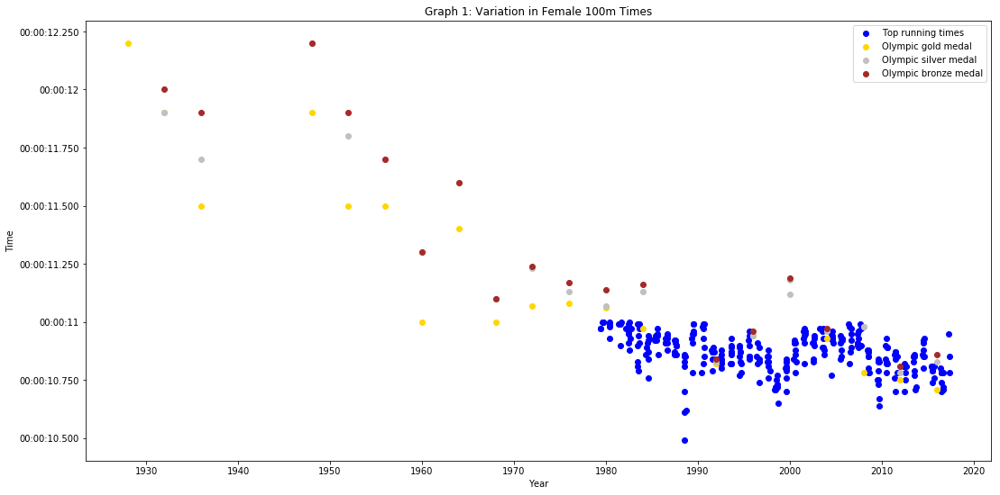

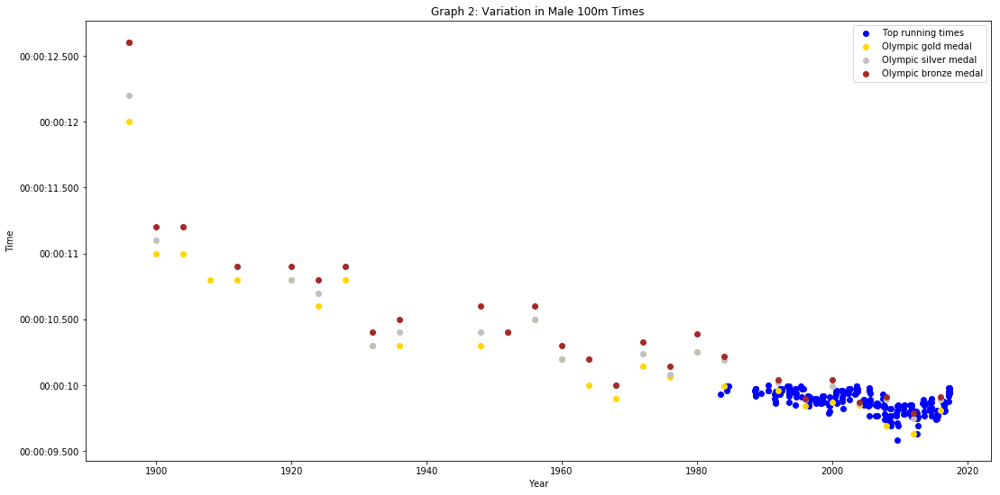

Category = Track_Flat, Event=200


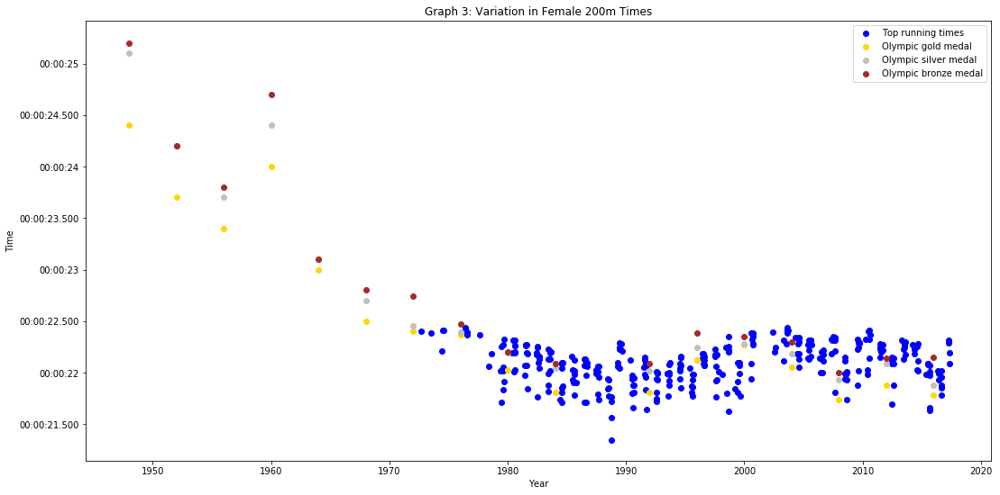

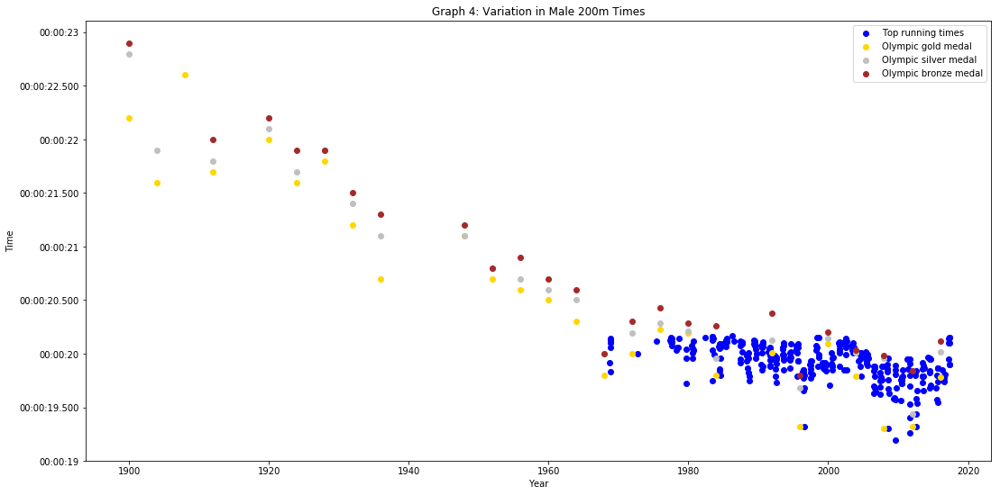

Category = Track_Flat, Event=400


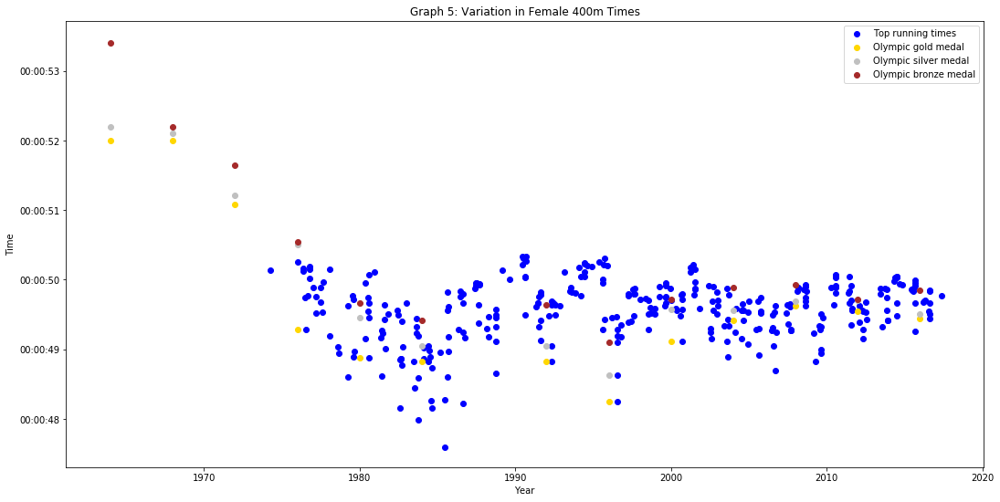

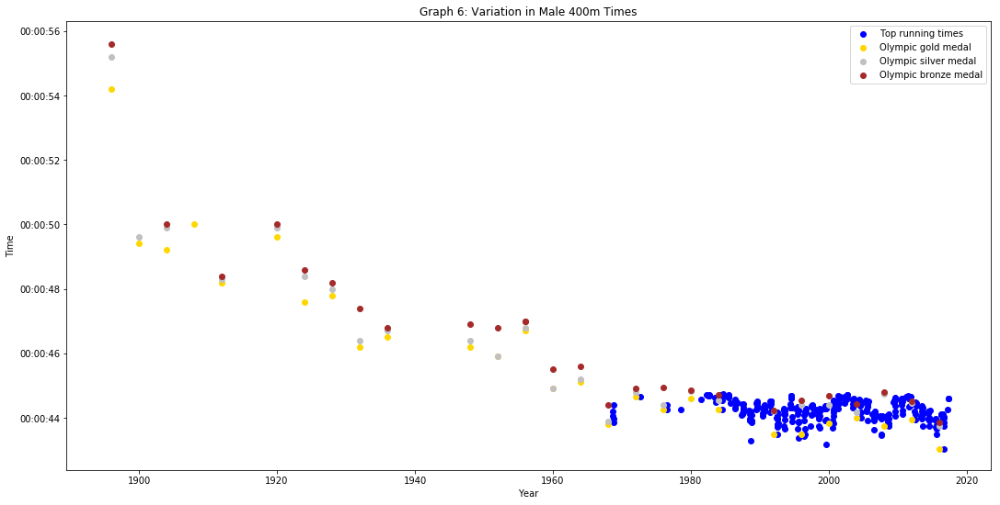

Category = Track_Flat, Event=800


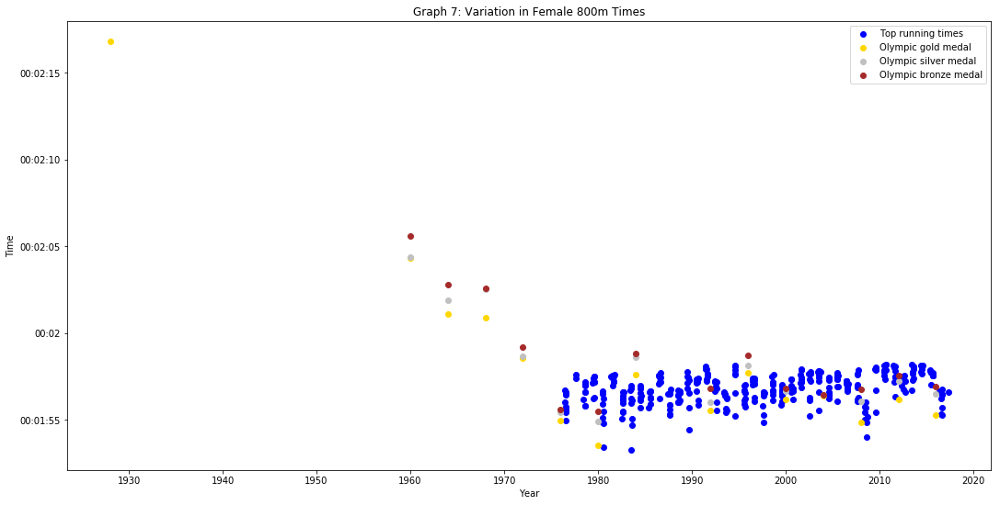

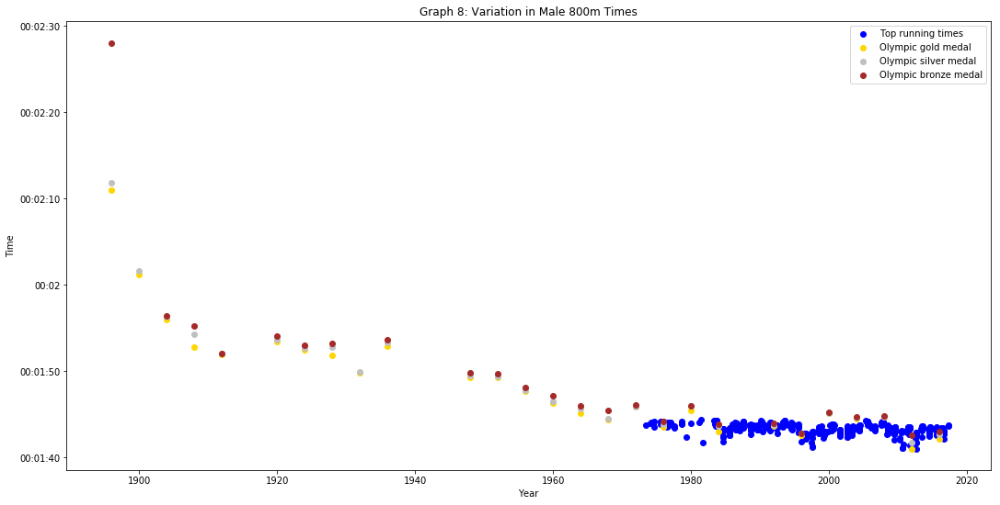

Category = Track_Flat, Event=1500


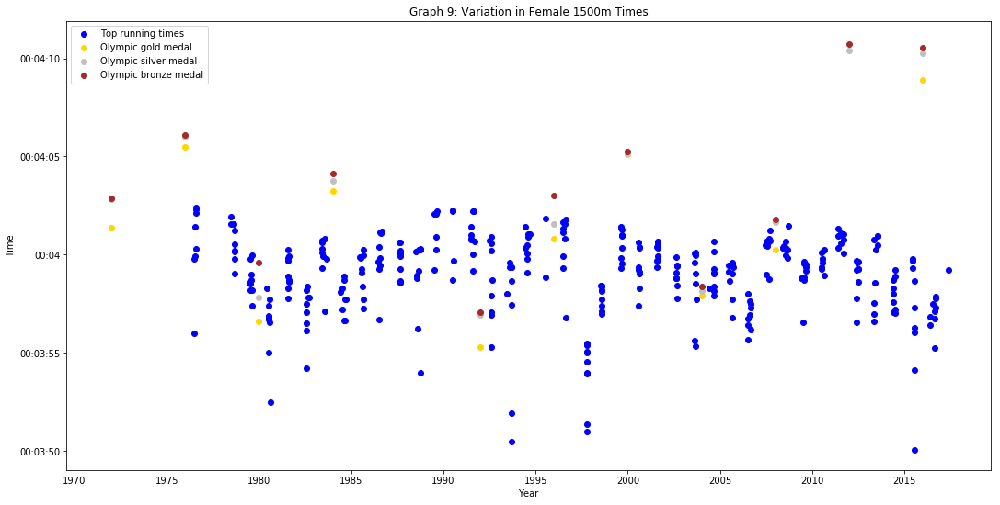

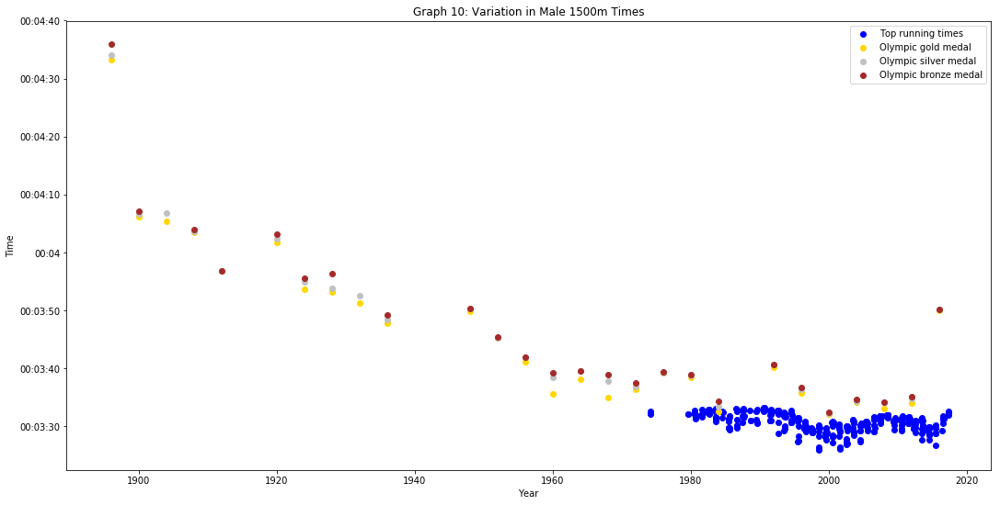

Category = Track_Flat, Event=5000


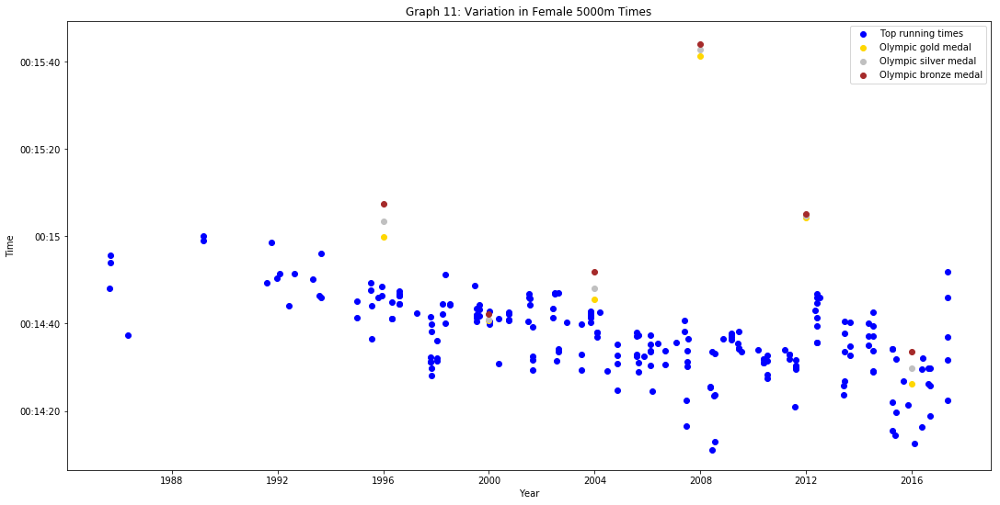

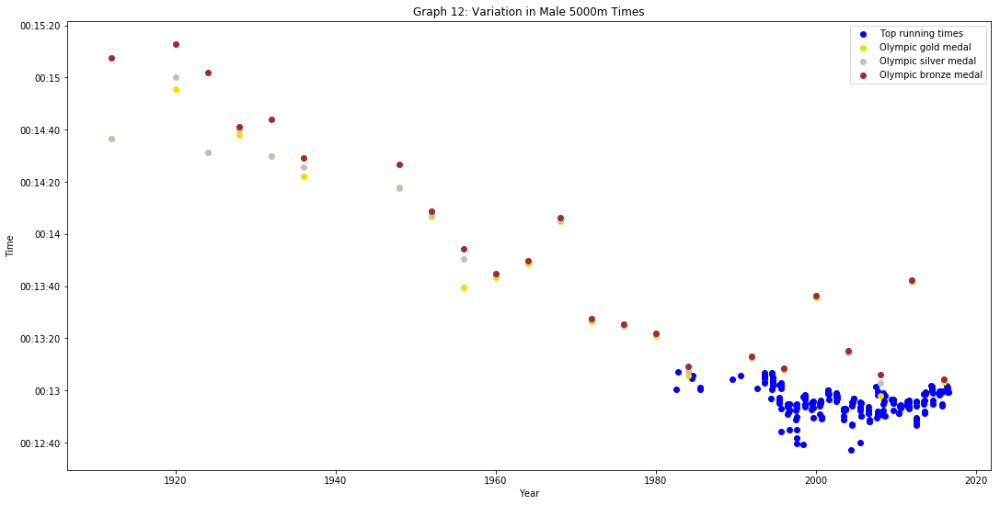

Category = Track_Flat, Event=10000


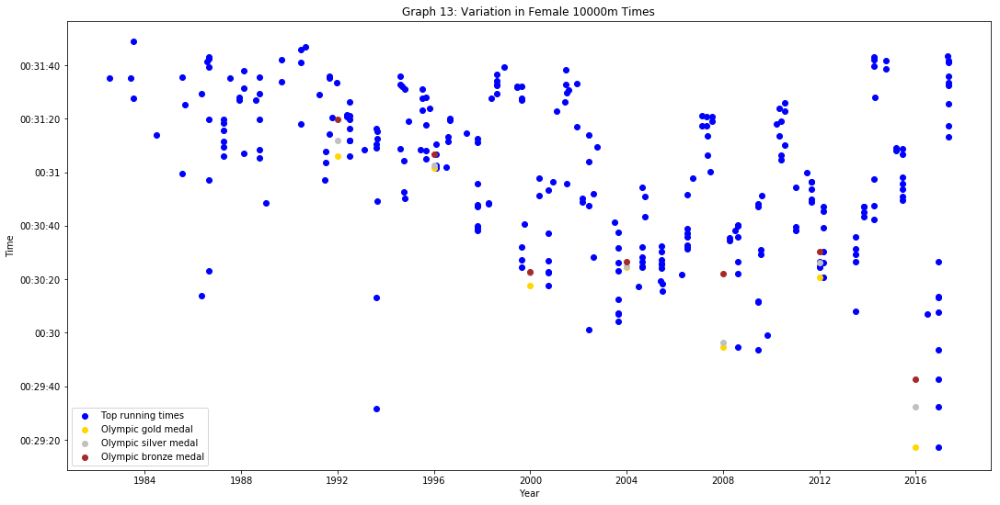

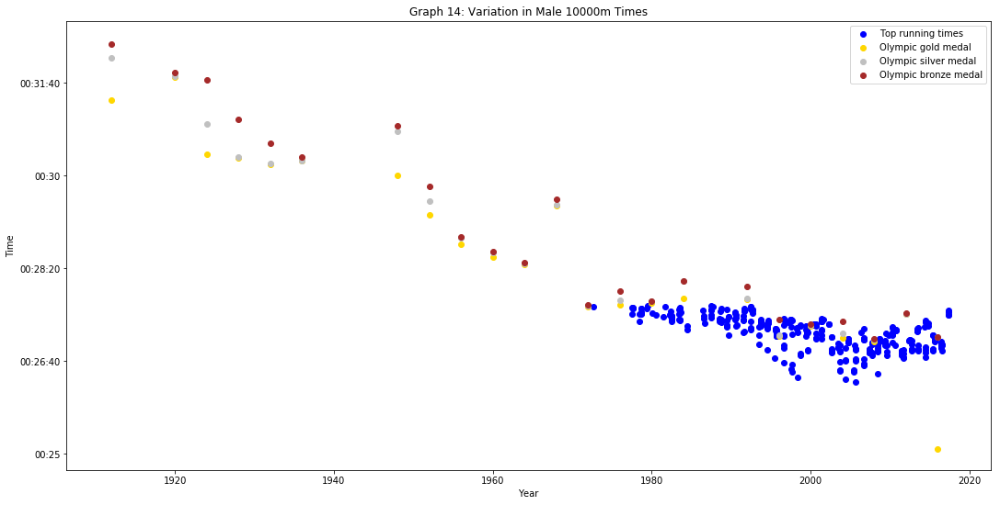

Category = Steeplechase, Event=3000
No data from top running times for this event.


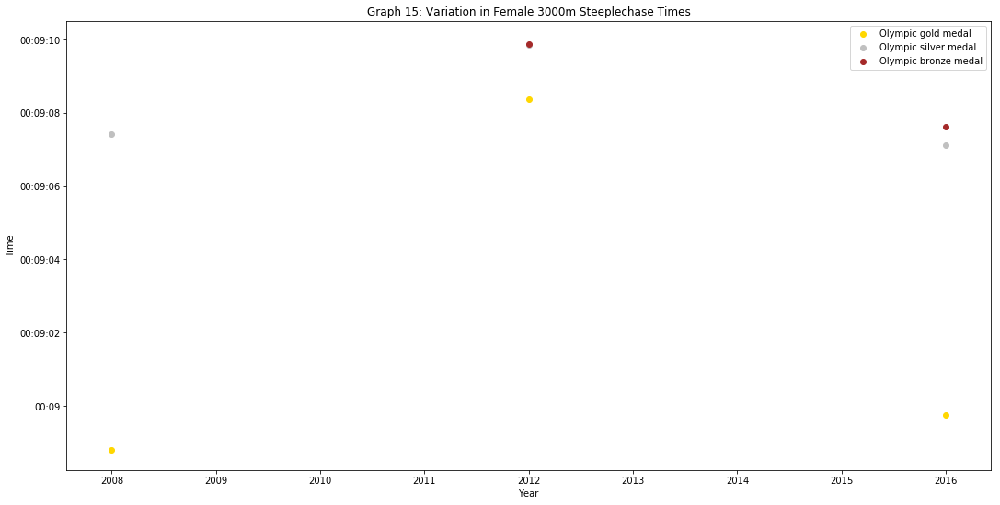

No data from top running times for this event.


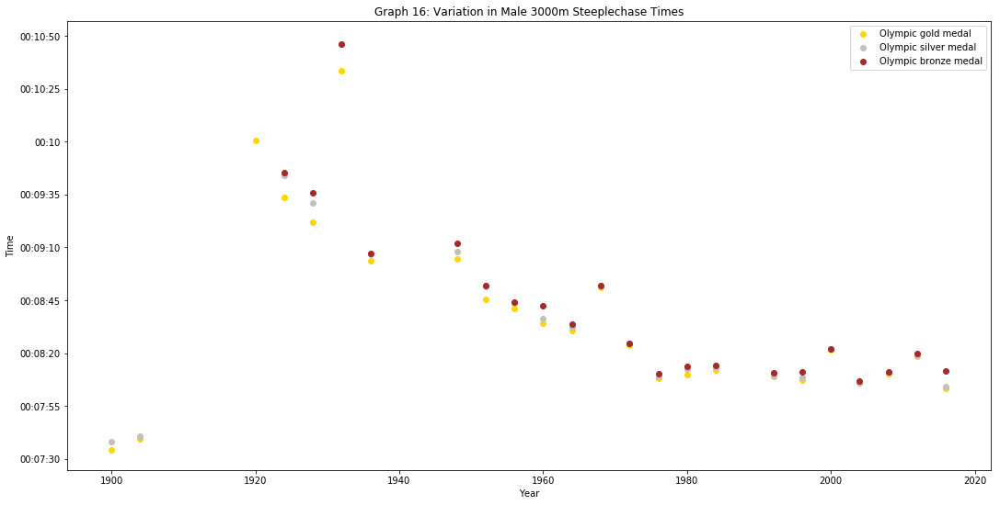

Category = Hurdles, Event=100
No data from top running times for this event.


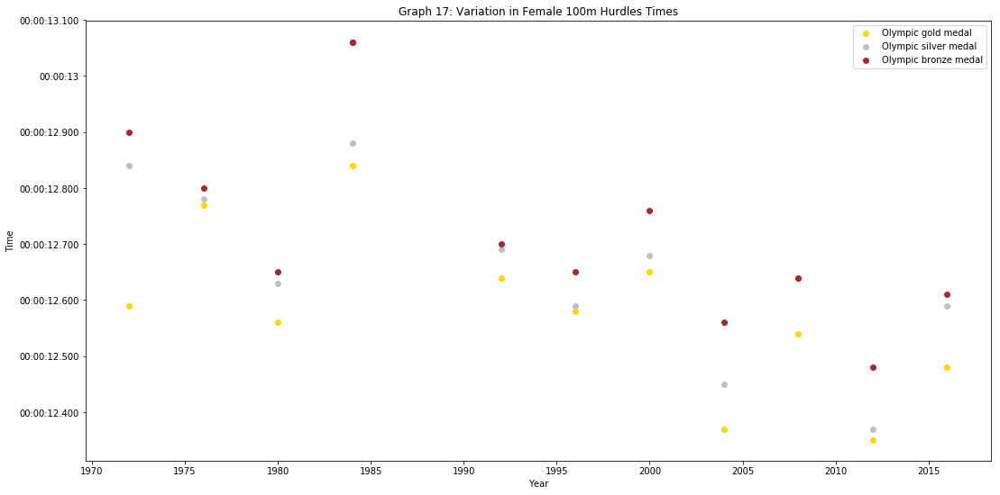

No data from top running times for this event.
No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from top running times for this event.
No data from Olympic data set for this event.
No data from top running times for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

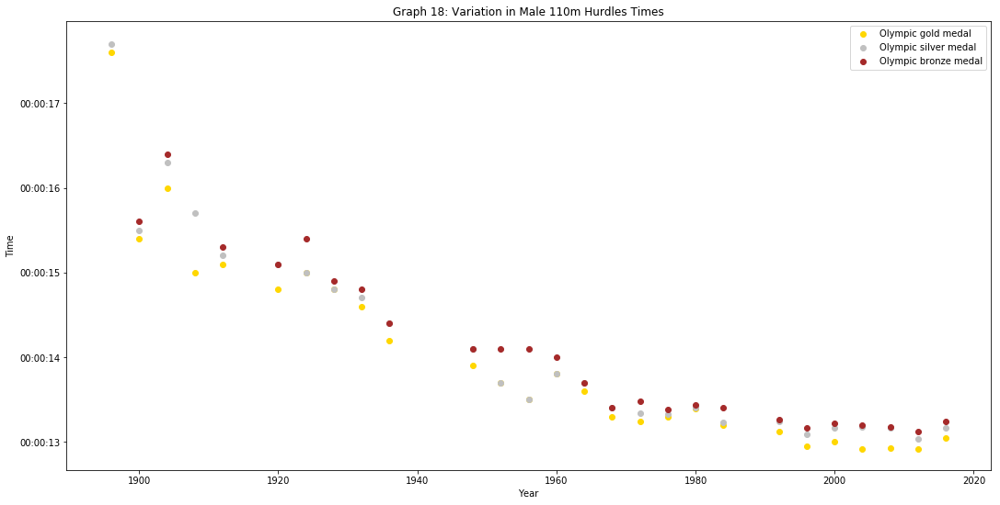

Category = Hurdles, Event=400
No data from top running times for this event.


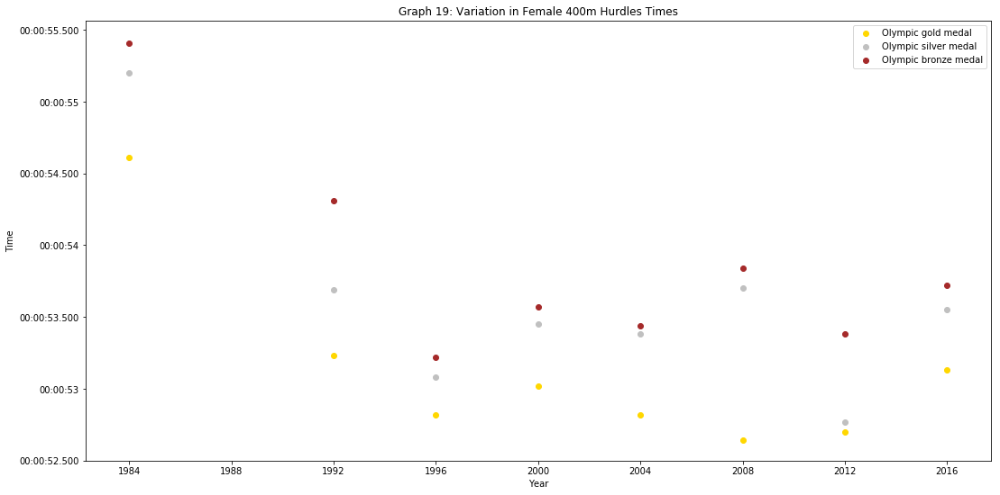

No data from top running times for this event.


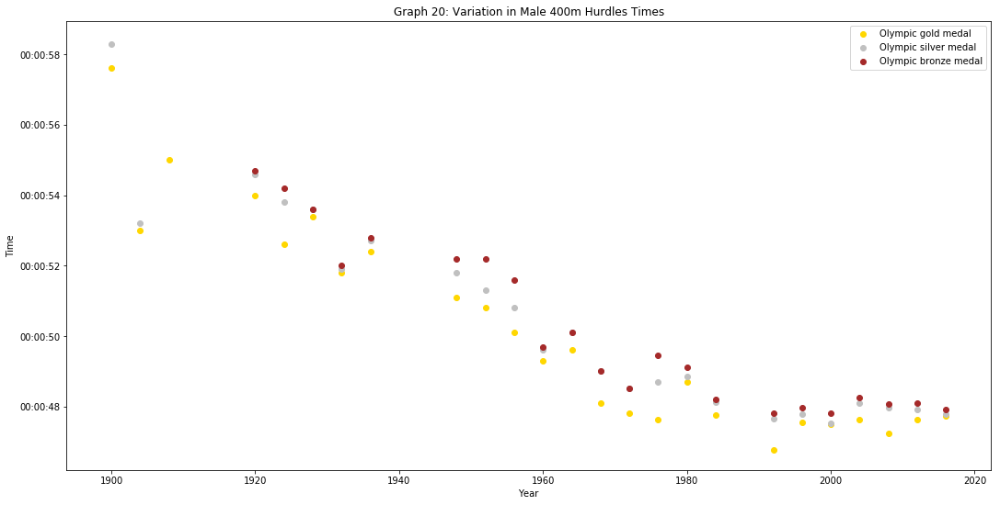

Category = Road, Event=42195


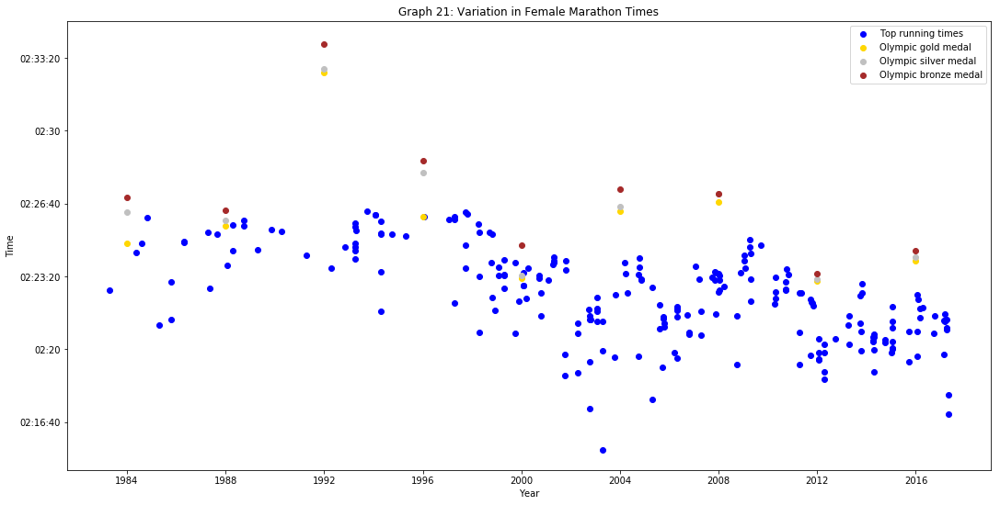

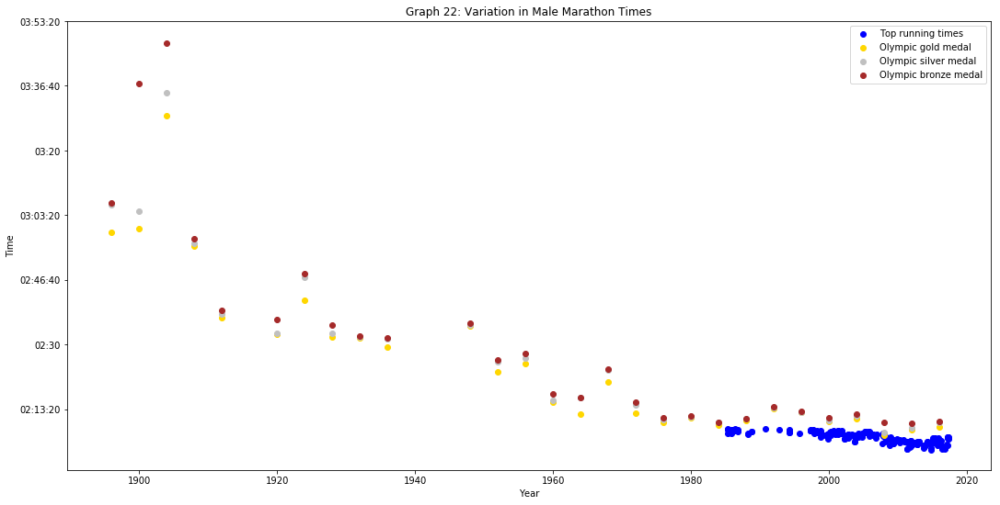

Category = Road, Event=21098
No data from Olympic data set for this event.


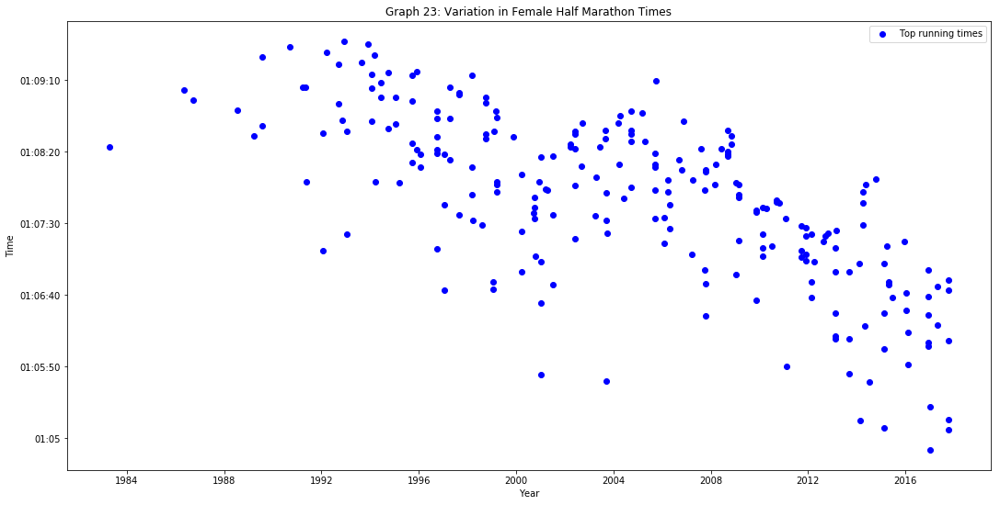

No data from Olympic data set for this event.


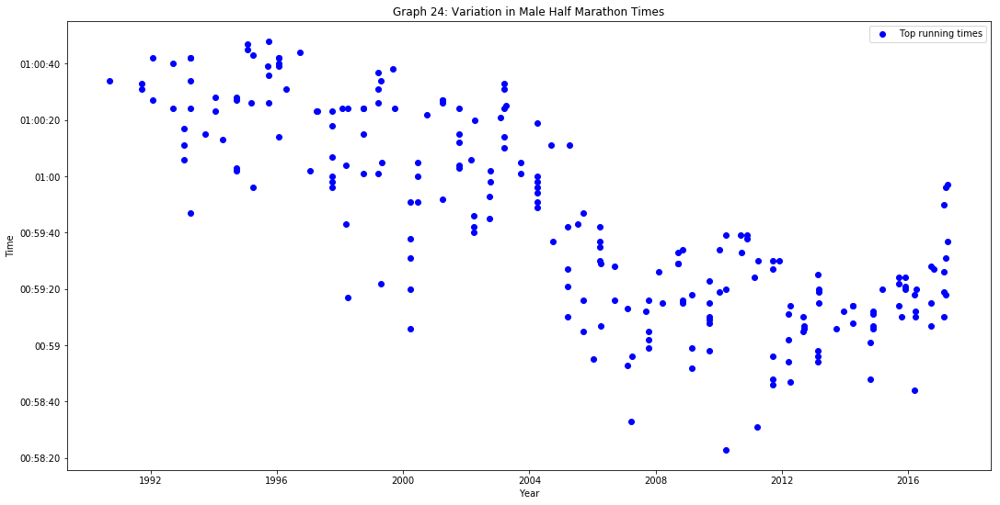

In [120]:
# A label for the graphs plotted
graph_number = 1

# Plot graphs for all events
event_categories = ['Track_Flat', 'Steeplechase', 'Hurdles', 'Road']
plot_times(event_categories)

How are height, weight and age related to performance?

In [121]:
ol_running_gender_groups = ol_running.groupby('Gender')
ol_running_m = ol_running_gender_groups.get_group('M')
ol_running_f = ol_running_gender_groups.get_group('F')

Calculate BMI:

In [122]:
ol_running.insert(loc=ol_running.columns.get_loc('Weight'), column='BMI', value=0)

In [123]:
ol_running['BMI'] = ol_running['Weight'] / ((ol_running['Height'] / 100)**2)

In [124]:
ol_running.head()

,ID,Name,Merged_name,Ratio,RawName,Gender,Age,Height,BMI,Weight,...,Year,Season,City,Sport,Hurdles,Road,Steeplechase,Track_Flat,Medal,Time
26,8,cornelia aalten,NaN,NaN,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,NaN,...,1932,Summer,Los Angeles,Athletics,0,0,0,100,NaN,None
98,34,jamale aarrass,NaN,NaN,Jamale (Djamel-) Aarrass (Ahrass-),M,30.0,187.0,21.733535,76.0,...,2012,Summer,London,Athletics,0,0,0,1500,NaN,None
148,55,antonio abadia beci,NaN,NaN,Antonio Abadia Beci,M,26.0,170.0,22.491349,65.0,...,2016,Summer,Rio de Janeiro,Athletics,0,0,0,5000,NaN,None
190,86,jos manuel abascal gmez,NaN,NaN,Jos Manuel Abascal Gmez,M,22.0,182.0,20.227026,67.0,...,1980,Summer,Moskva,Athletics,0,0,0,1500,NaN,None
191,86,jos manuel abascal gmez,josé manuel abascal,95.0,Jos Manuel Abascal Gmez,M,26.0,182.0,20.227026,67.0,...,1984,Summer,Los Angeles,Athletics,0,0,0,1500,B,00:03:34.300000


In [125]:
ol_running_gender_groups = ol_running.groupby('Gender')
ol_running_m = ol_running_gender_groups.get_group('M')
ol_running_f = ol_running_gender_groups.get_group('F')

In [126]:
def plot_characteristics(event_categories, characteristics):
    global graph_number
    data_present = True
    for c in characteristics:
        for category in event_categories:
            events = ol_running[category].unique().tolist()
            events.remove(0)
            events.sort()
            for event in events:
                print("Category = {}, Event={}".format(category, event))
                for gender in ol_running_gender_groups.groups.keys():
                    if gender == 'M':
                        ol_running_group = ol_running_m
                    else:
                        ol_running_group = ol_running_f
                    plt.figure(figsize=(18, 9))
                    # Plot each olympic medal colour, if data exists for this event
                    if ol_running_group[(ol_running_group[category] == event)].shape[0] != 0:
                        plt.scatter(ol_running_group[(ol_running_group[category] == event) & 
                                                     (ol_running_group['Medal'] == 'G') &
                                                     (ol_running_group['Time'].notna())][c], 
                                    list(ol_running_group[(ol_running_group[category] == event) & 
                                                          (ol_running_group['Medal'] == 'G') & 
                                                          (ol_running_group['Time'].notna())]['Time']), 
                                    color='gold', label='Olympic gold medal')
                        plt.scatter(ol_running_group[(ol_running_group[category] == event) & 
                                                                   (ol_running_group['Medal'] == 'S') & 
                                                          (ol_running_group['Time'].notna())][c], 
                                    list(ol_running_group[(ol_running_group[category] == event) & 
                                                         (ol_running_group['Medal'] == 'S') & 
                                                          (ol_running_group['Time'].notna())]['Time']), 
                                    color='silver', label='Olympic silver medal')
                        plt.scatter(ol_running_group[(ol_running_group[category] == event) & 
                                                                   (ol_running_group['Medal'] == 'B') & 
                                                          (ol_running_group['Time'].notna())][c], 
                                    list(ol_running_group[(ol_running_group[category] == event) & 
                                                         (ol_running_group['Medal'] == 'B') & 
                                                          (ol_running_group['Time'].notna())]['Time']), 
                                    color='brown', label='Olympic bronze medal')
                        plt.scatter(ol_running_group[(ol_running_group[category] == event) & 
                                                                   (ol_running_group['Medal'].isnull()) & 
                                                          (ol_running_group['Time'].notna())][c], 
                                    list(ol_running_group[(ol_running_group[category] == event) & 
                                                         (ol_running_group['Medal'].isnull()) & 
                                                          (ol_running_group['Time'].notna())]['Time']), 
                                    color='blue', label='No medal')
                    else:
                        data_present = False
                        print("No data from Olympic data set for this event.")
                    # Only plot if there is some data
                    if  data_present == True:
                        # Construct the graph title and axis labels
                        gender_label, event_label, category_label, unit = build_graph_labels(
                            gender, category, event, c)
                        plt.xlabel('Year')
                        plt.ylabel(c+'({})'.format(unit))
                        plt.title("Graph {0}: Variation in {1} {2} Times with {3}".format(
                            graph_number, gender_label, event_label, c))
                        plt.legend()
                        plt.show()
                        graph_number+=1
                    data_present = True

In [127]:
# Create a set of year groups throughout Olympic history
year_groups = np.arange(1896, 2020, 20)
year_groups[-1] += 1 # To include 2016 Games
#year_groups_dt = [datetime.strptime(str(year_groups[i]), "%Y") for i in range(len(year_groups))]
year_groups

array([1896, 1916, 1936, 1956, 1976, 1996, 2017])

In [128]:
def plot_characteristics_time_groups(event_categories, characteristics):
    global graph_number
    data_present = True
    for c in characteristics:
        for category in event_categories:
            events = ol_running[category].unique().tolist()
            events.remove(0)
            events.sort()
            for event in events:
                print("Category = {}, Event={}".format(category, event))
                for gender in ol_running_gender_groups.groups.keys():
                    if gender == 'M':
                        ol_running_group = ol_running_m
                    else:
                        ol_running_group = ol_running_f
                    plt.figure(figsize=(18, 9))
                    # Plot
                    if ol_running_group[(ol_running_group[category] == event)].shape[0] != 0:
                        
                        #plt.scatter(pd.to_datetime(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                         #                                      (ol_tf_running_group['Medal'] == 'G')]['Year'], format='%Y'), 
                         #       list(ol_tf_running_group[(ol_tf_running_group[category] == event) & 
                         #                            (ol_tf_running_group['Medal'] == 'G')]['Time']), 
                         #       color='gold', label='Olympic gold medal')

                        
                        for y in range(len(year_groups)-1):
                            plt.scatter(ol_running_group[(ol_running_group[category] == event) & 
                                                         (ol_running_group['Year'] >= year_groups[y]) &
                                                         (ol_running_group['Year'] < year_groups[y+1]) &
                                                         (ol_running_group['Time'].notna())][c], 
                                        list(ol_running_group[(ol_running_group[category] == event) & 
                                                              (ol_running_group['Year'] >= year_groups[y]) &
                                                              (ol_running_group['Year'] < year_groups[y+1]) & 
                                                              (ol_running_group['Time'].notna())]['Time']), 
                                                label='{0} to {1}'.format(year_groups[y], year_groups[y+1]-1))
                    else:
                        data_present = False
                        print("No data from Olympic data set for this event.")
                    # Only plot if there is some data
                    if  data_present == True:
                        # Construct the graph title and axis labels
                        gender_label, event_label, category_label, unit = build_graph_labels(
                            gender, category, event, c)
                        plt.xlabel('Year')
                        plt.ylabel(c+'({})'.format(unit))
                        plt.title("Graph {0}: Variation in {1} {2} Times with {3}".format(
                            graph_number, gender_label, event_label, c))
                        plt.legend()
                        plt.show()
                        graph_number+=1
                    data_present = True

Category = Track_Flat, Event=100


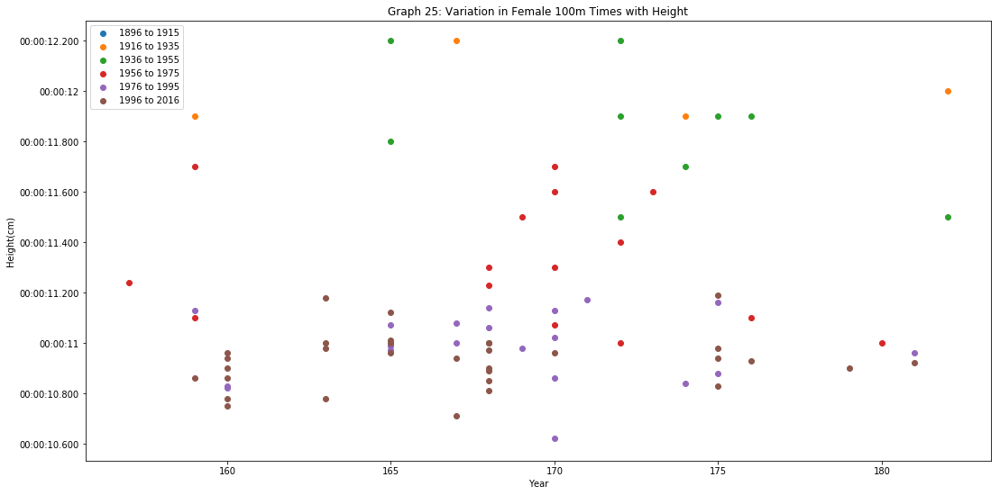

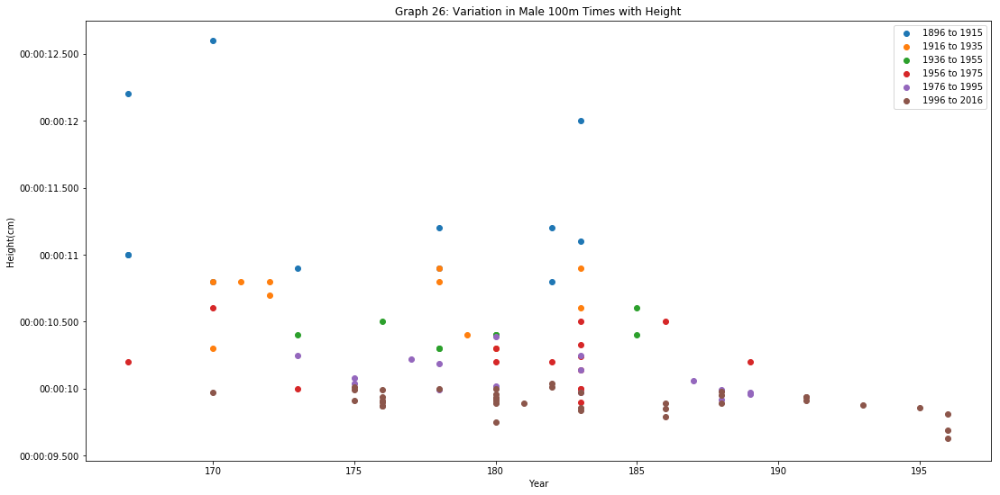

Category = Track_Flat, Event=200


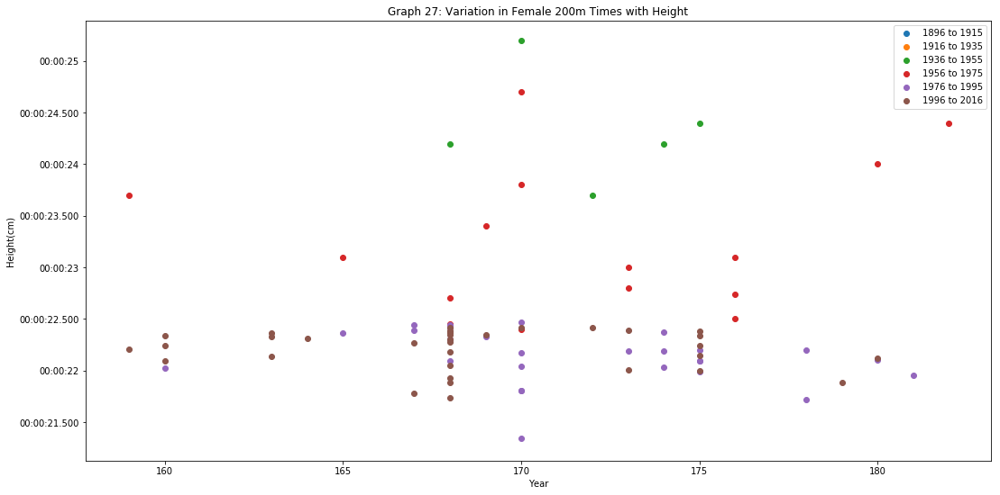

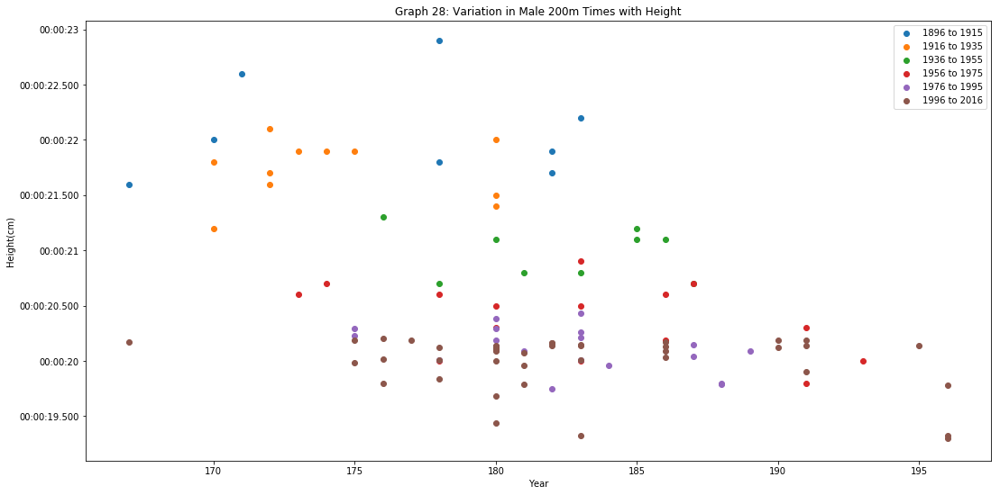

Category = Track_Flat, Event=400


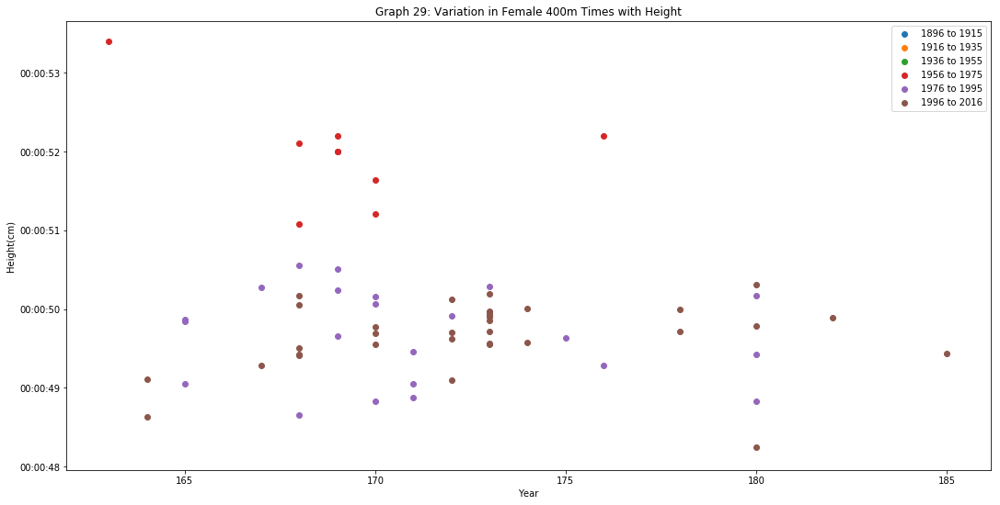

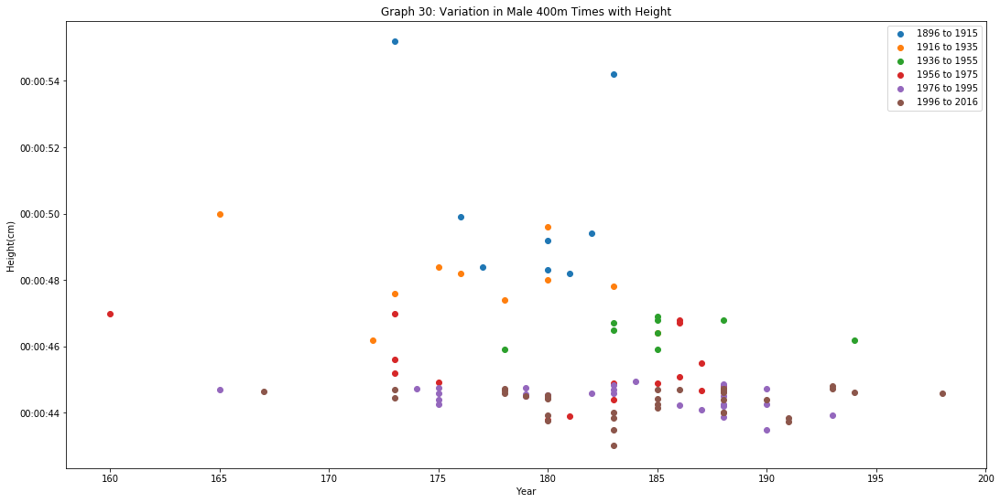

Category = Track_Flat, Event=800


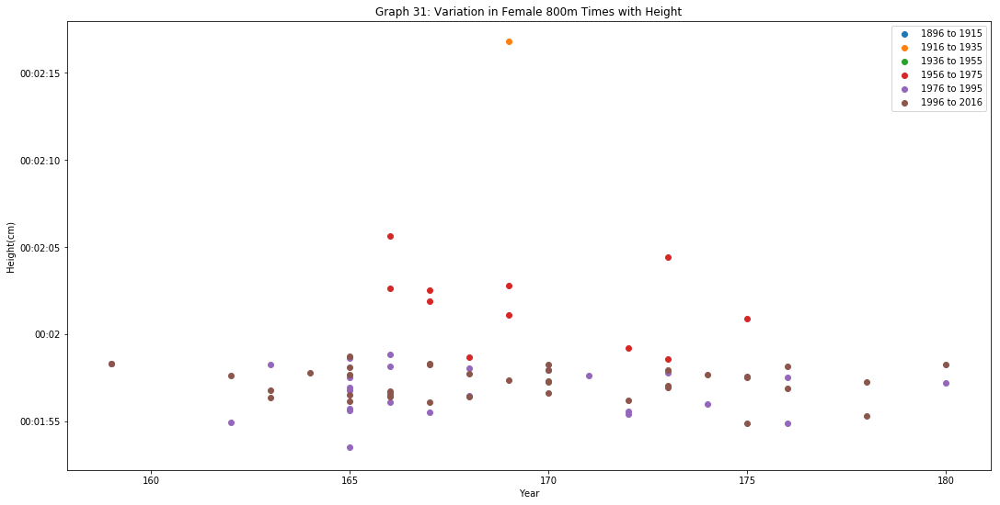

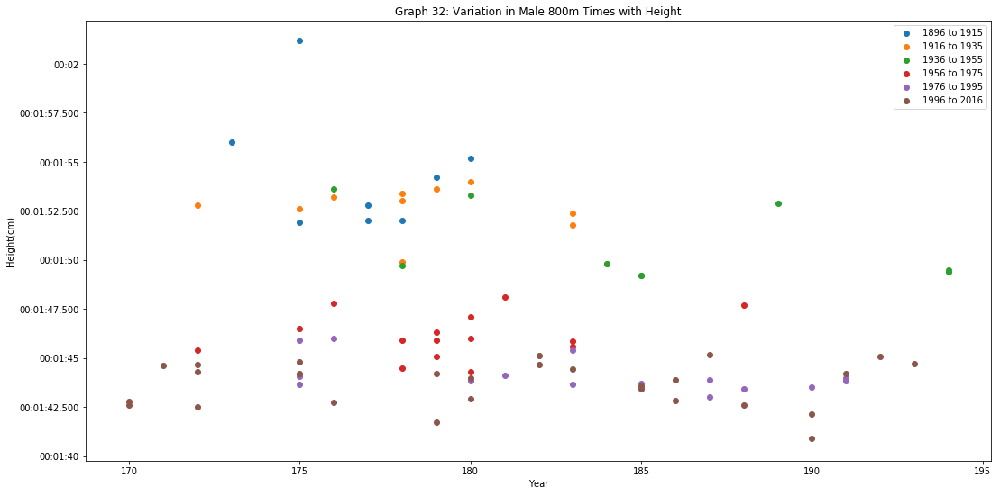

Category = Track_Flat, Event=1500


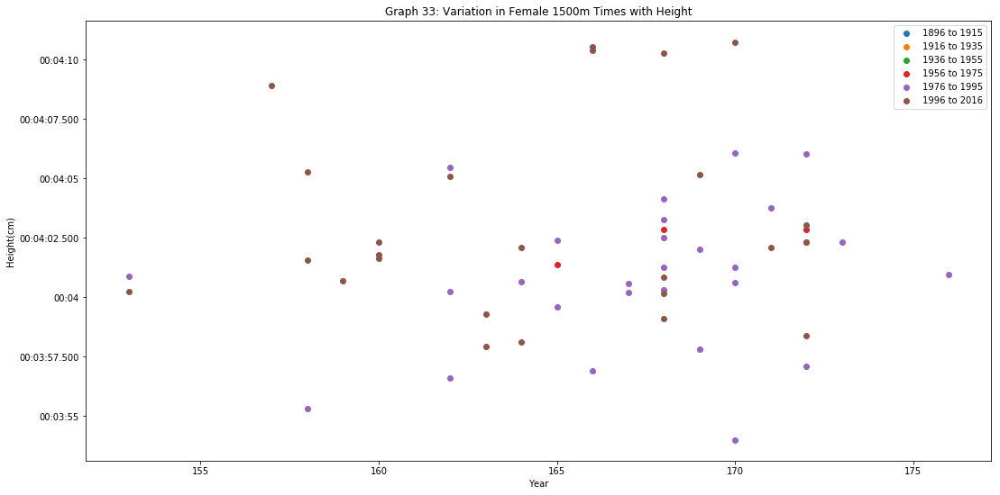

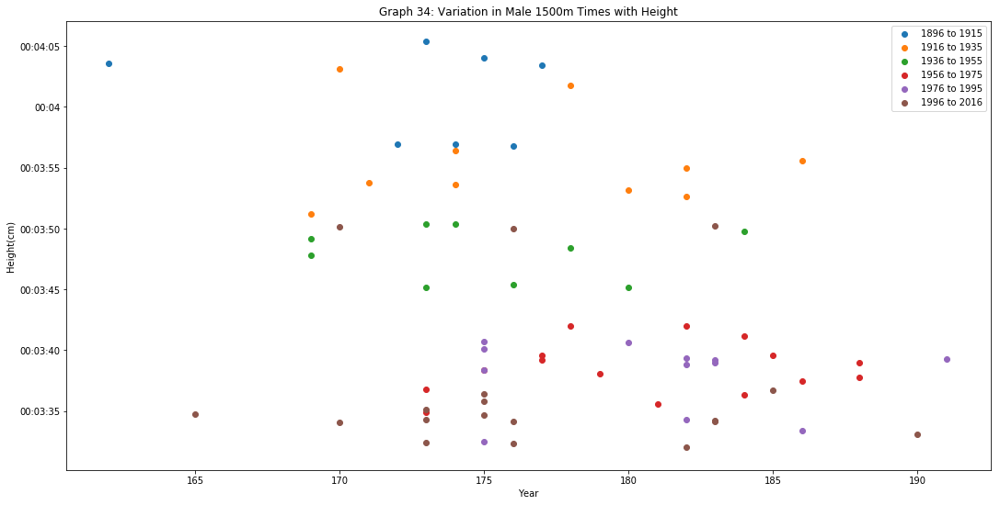

Category = Track_Flat, Event=5000


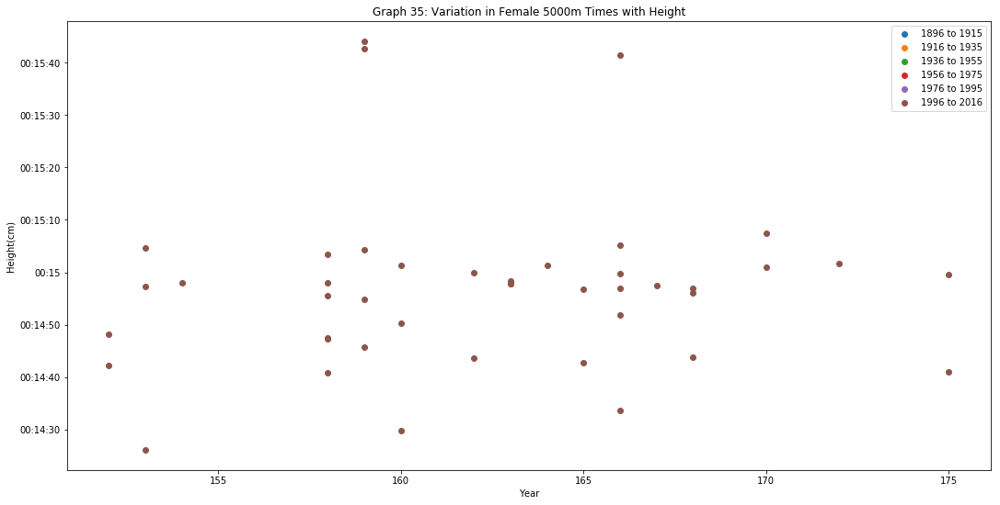

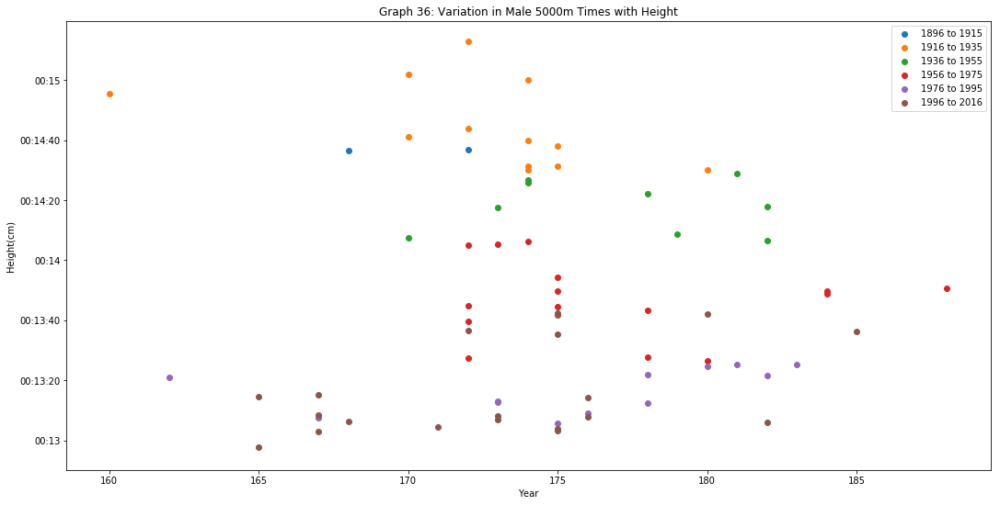

Category = Track_Flat, Event=10000


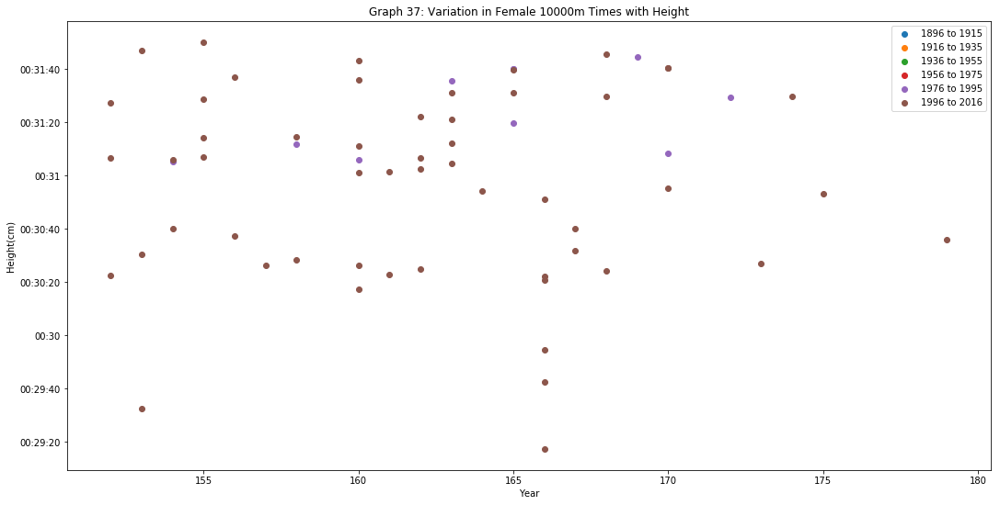

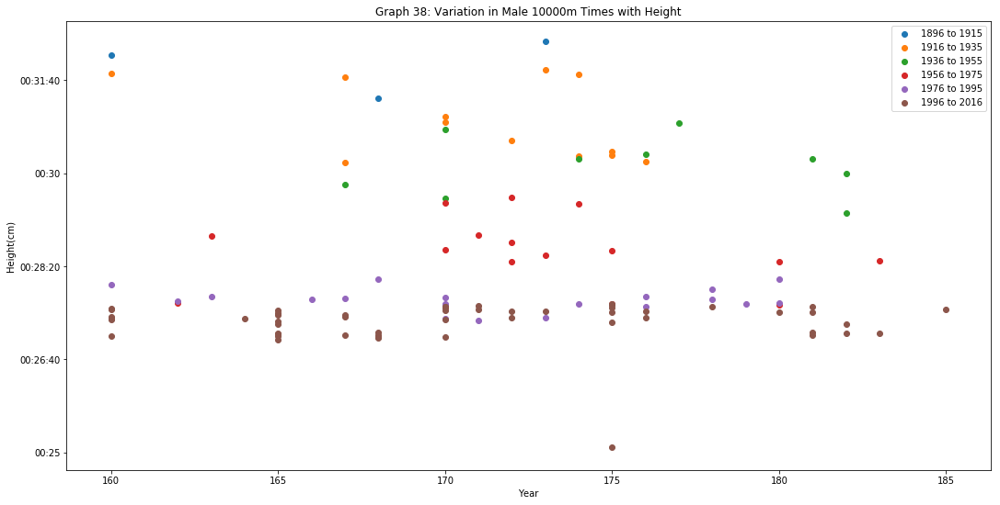

Category = Steeplechase, Event=3000


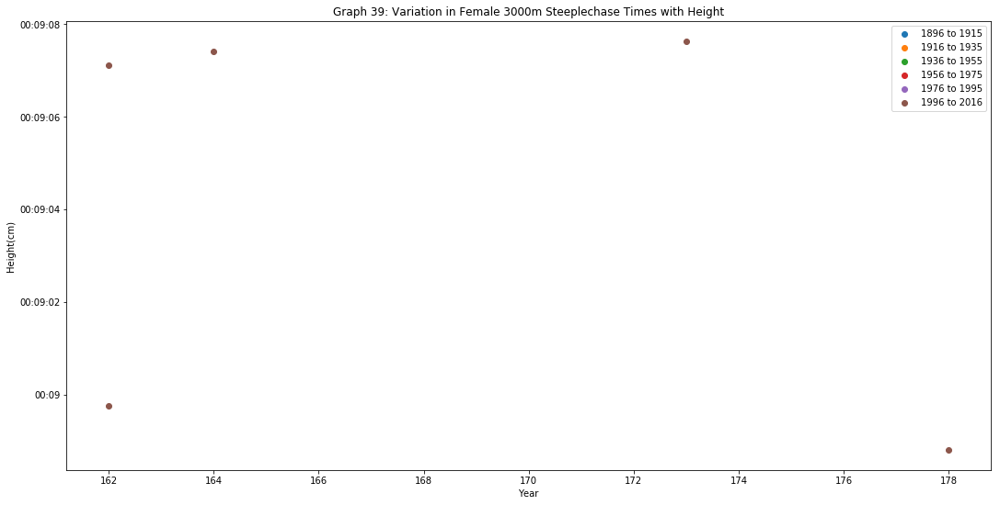

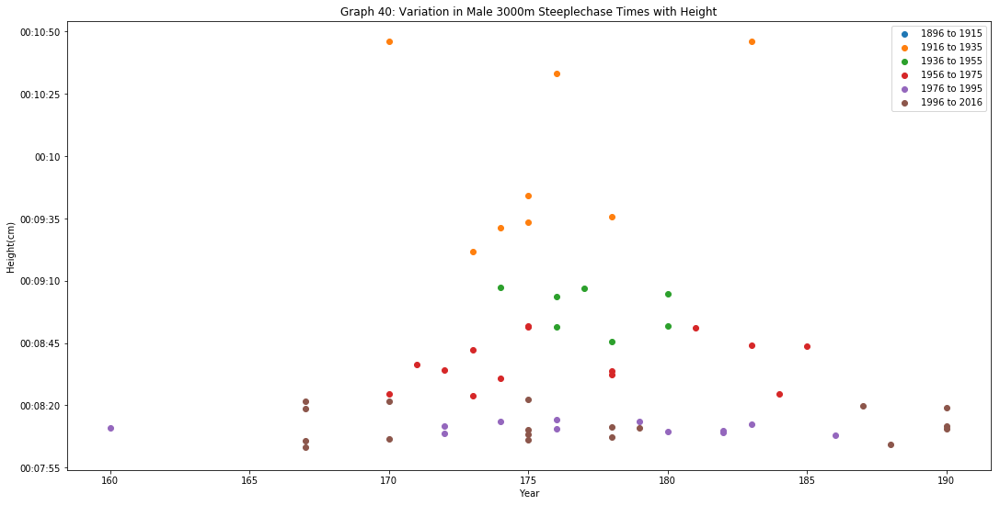

Category = Hurdles, Event=100


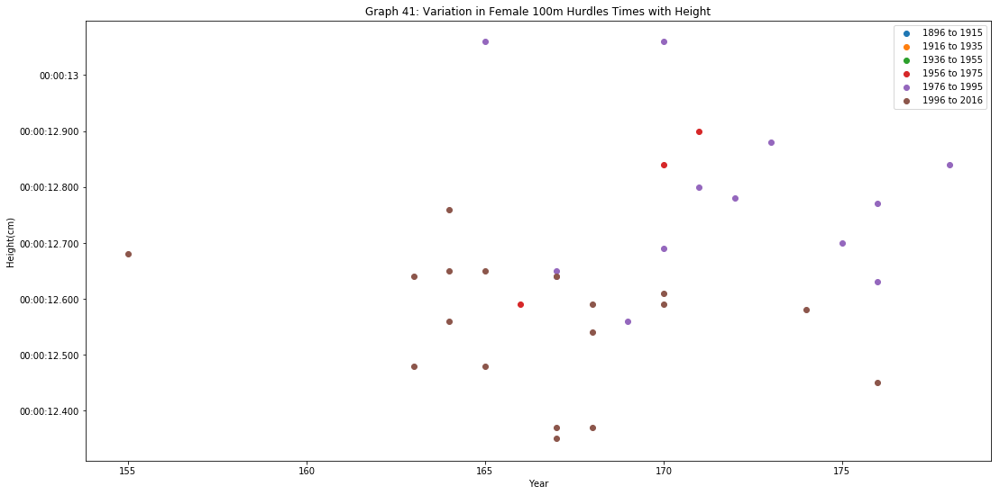

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

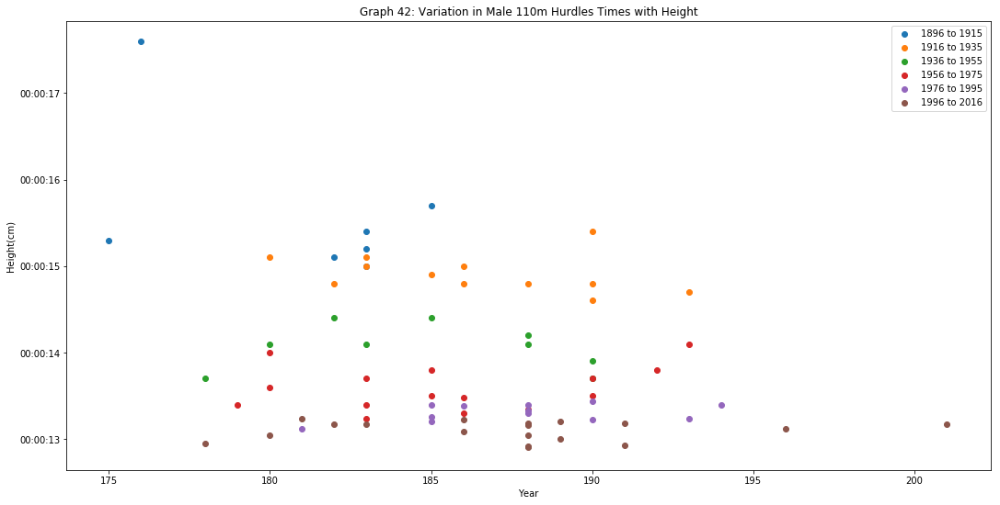

Category = Hurdles, Event=400


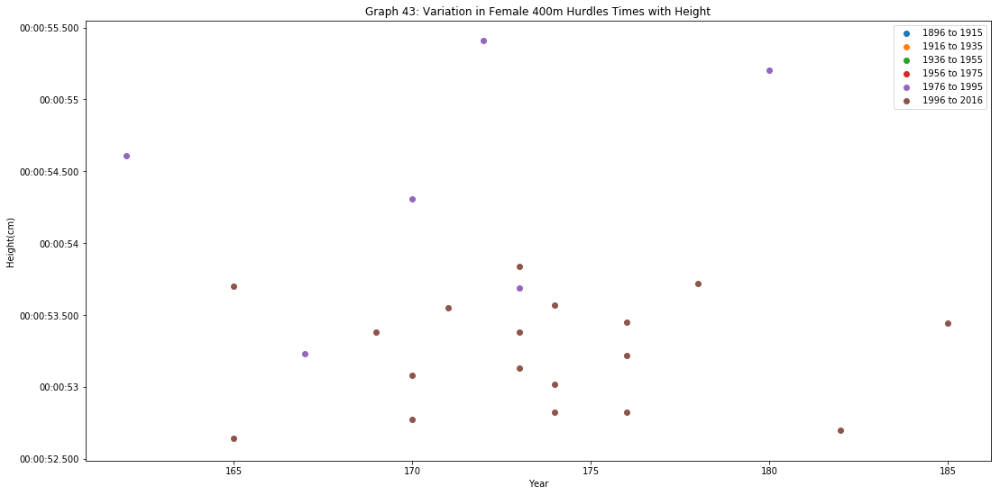

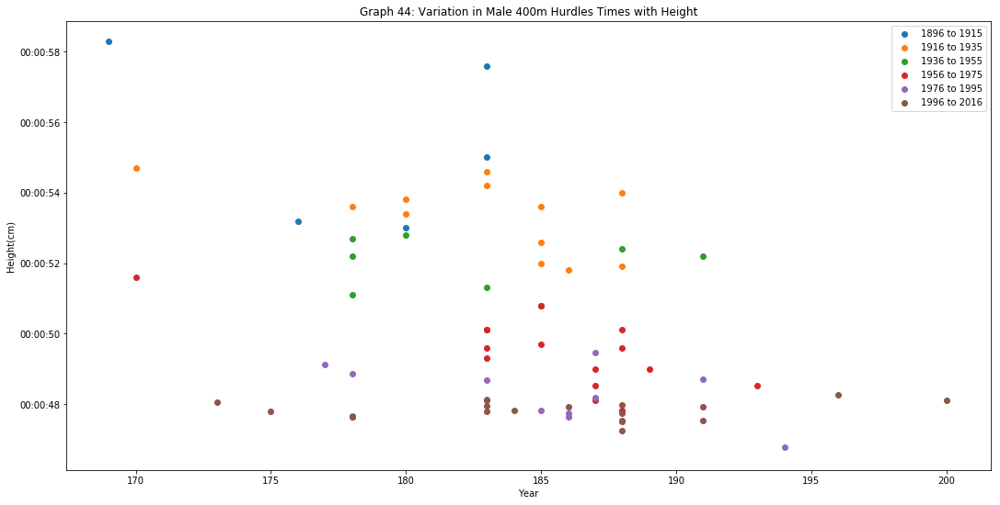

Category = Road, Event=42195


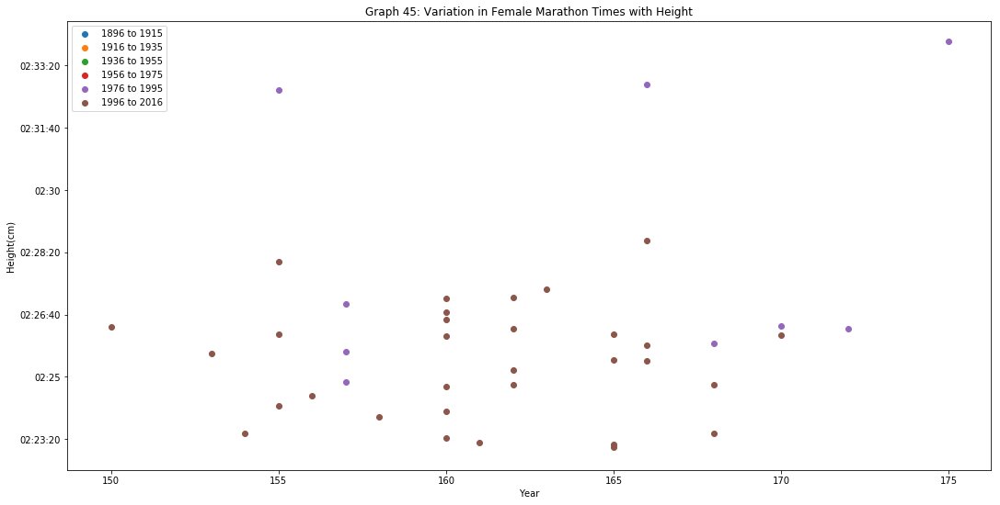

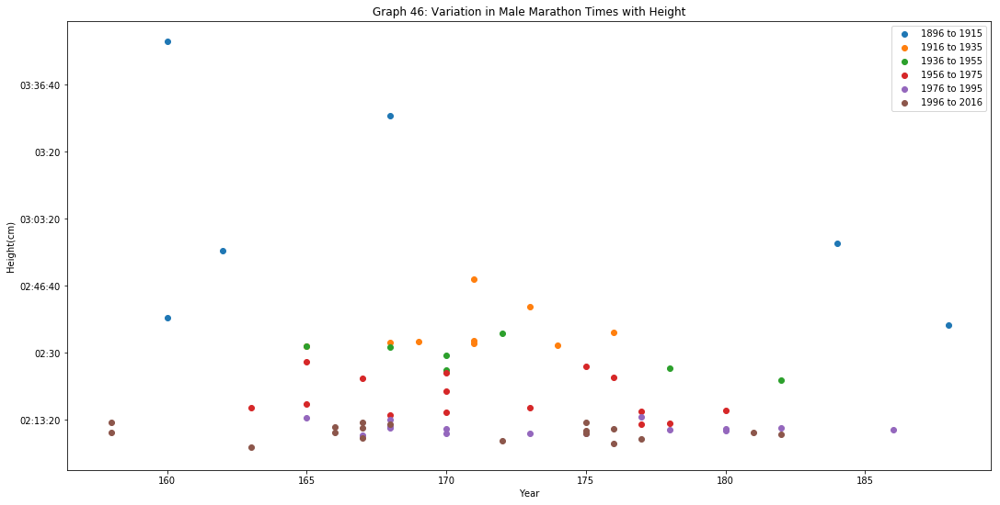

Category = Track_Flat, Event=100


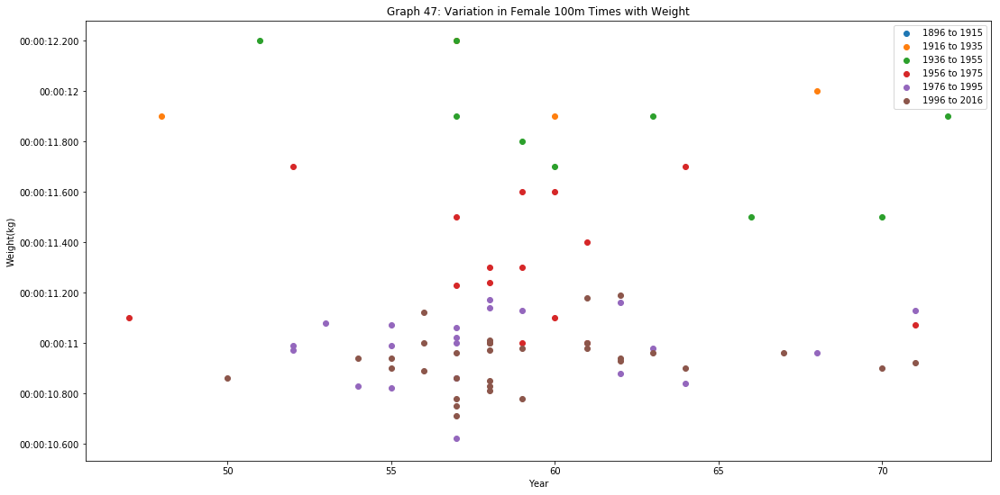

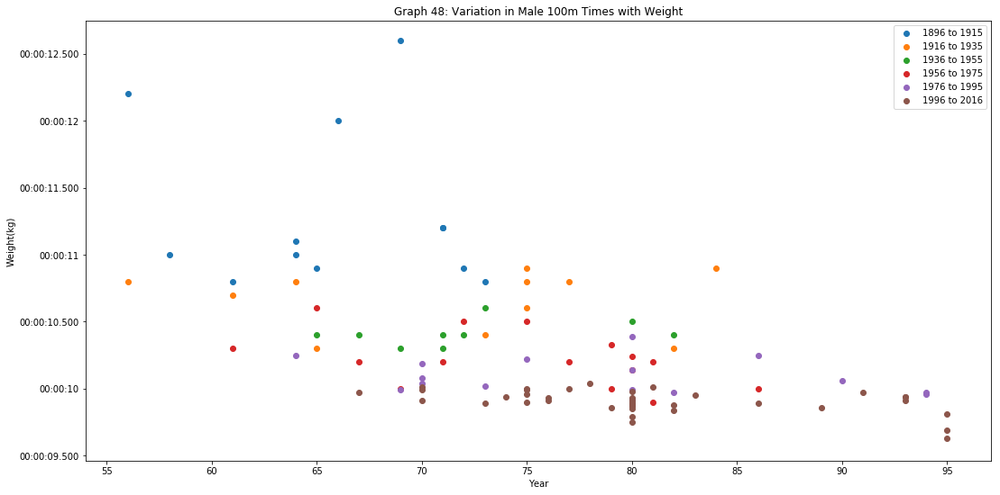

Category = Track_Flat, Event=200


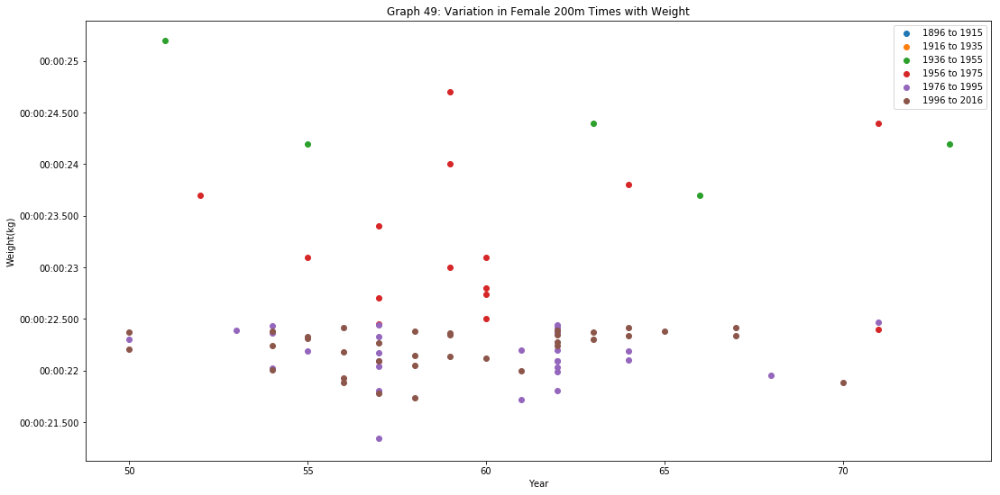

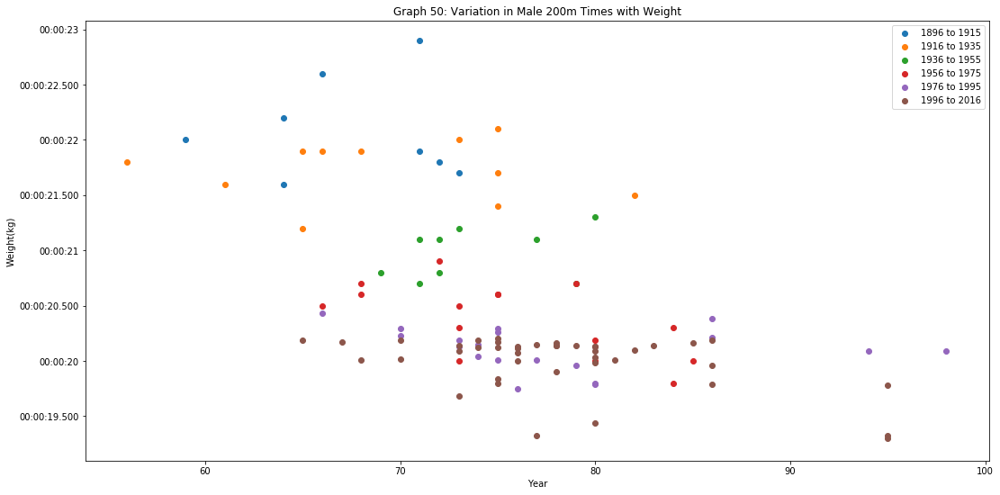

Category = Track_Flat, Event=400


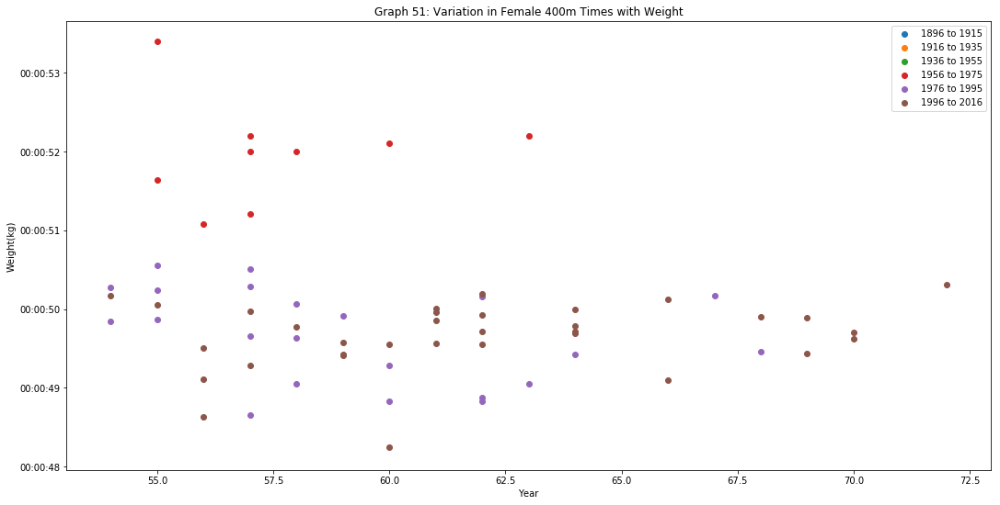

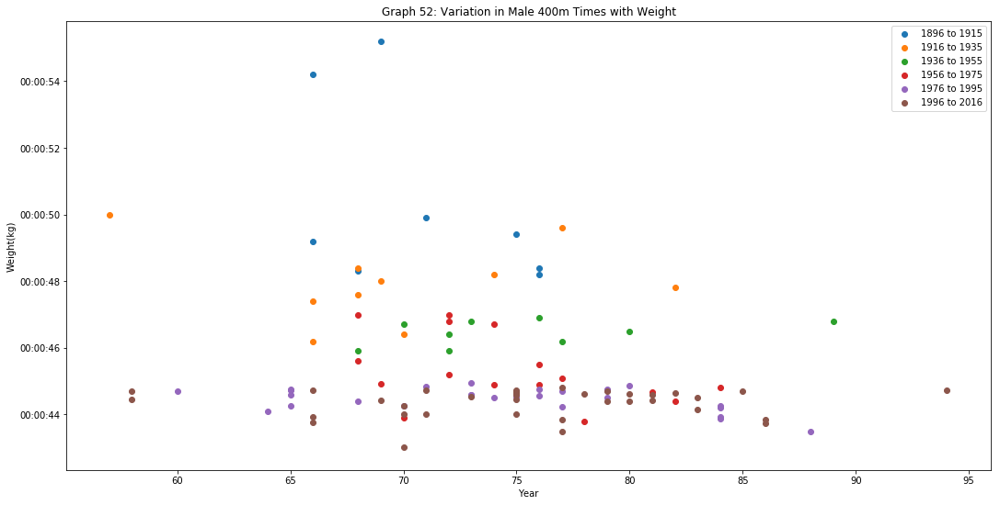

Category = Track_Flat, Event=800


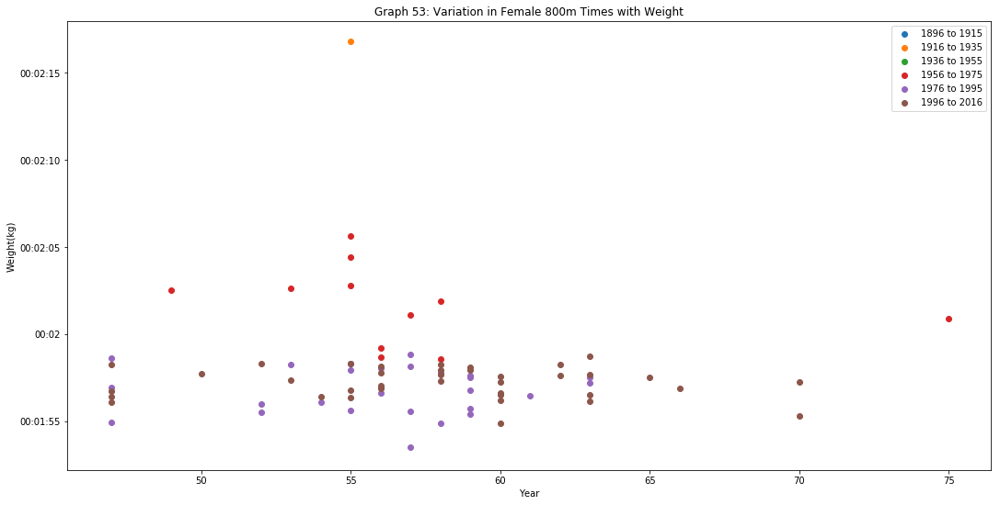

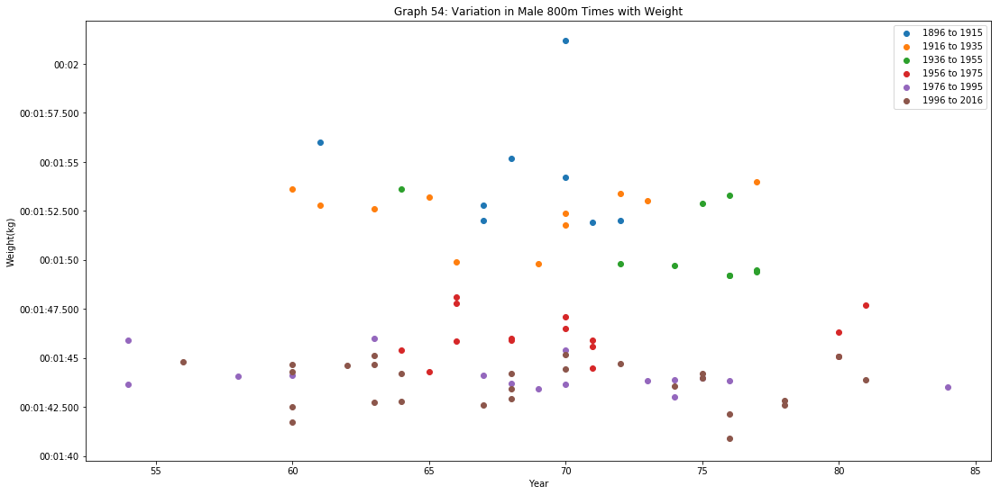

Category = Track_Flat, Event=1500


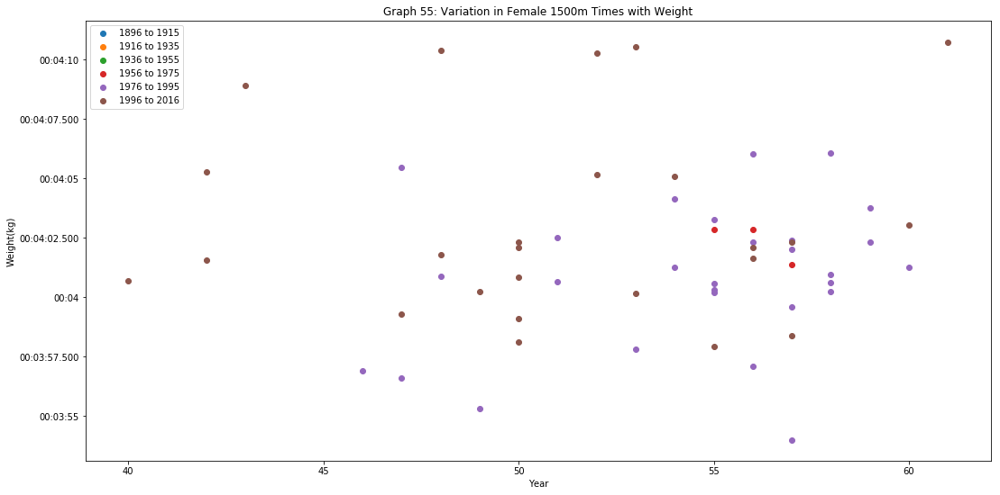

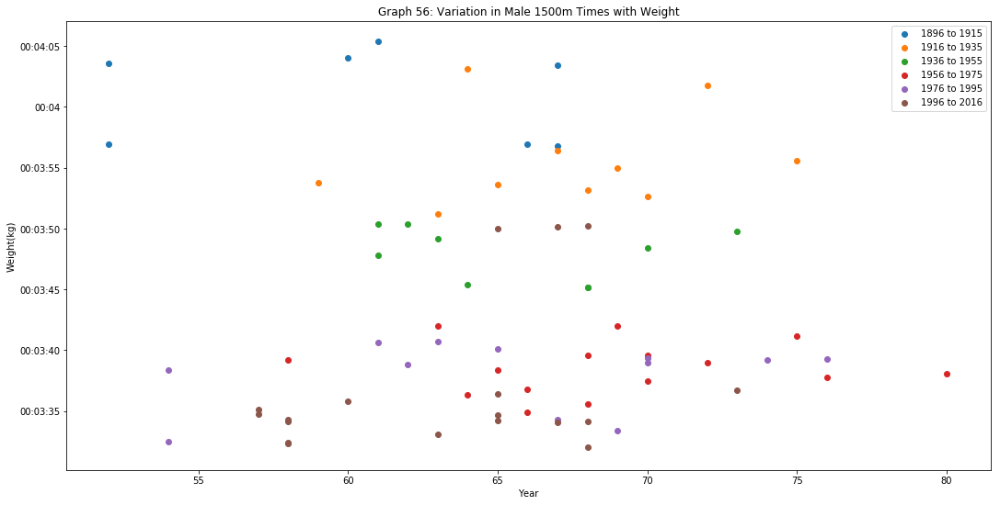

Category = Track_Flat, Event=5000


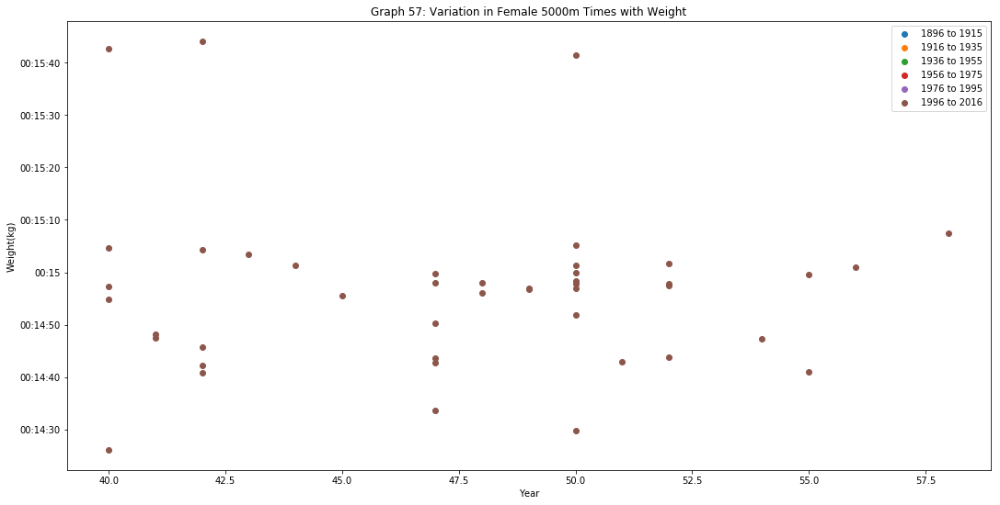

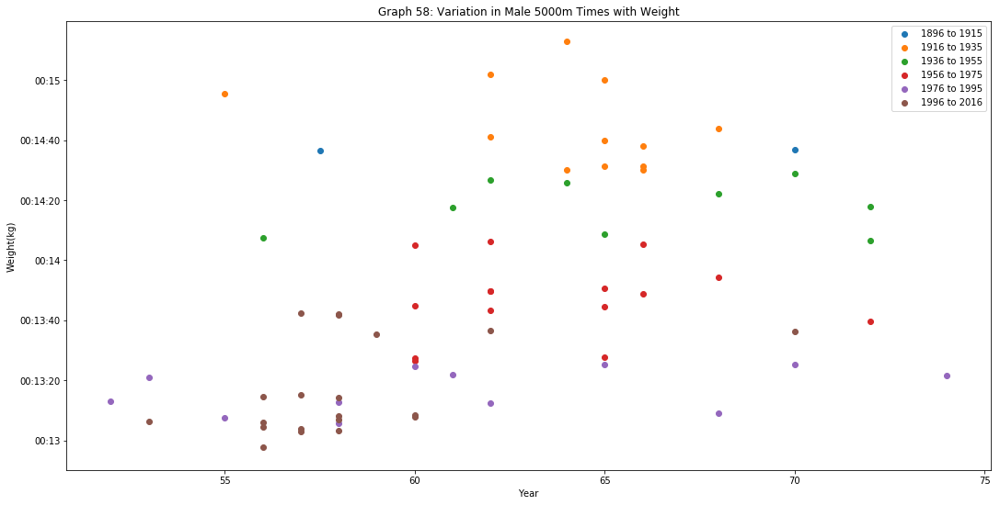

Category = Track_Flat, Event=10000


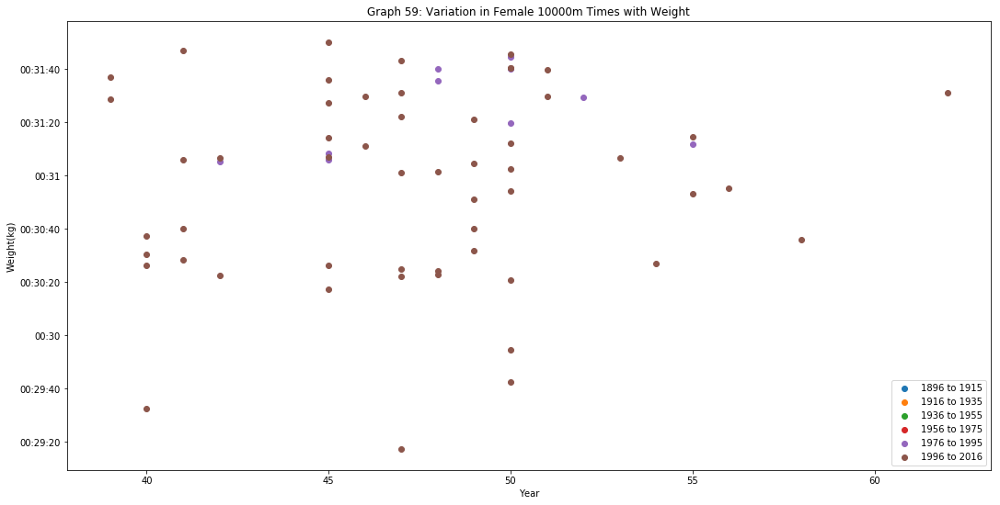

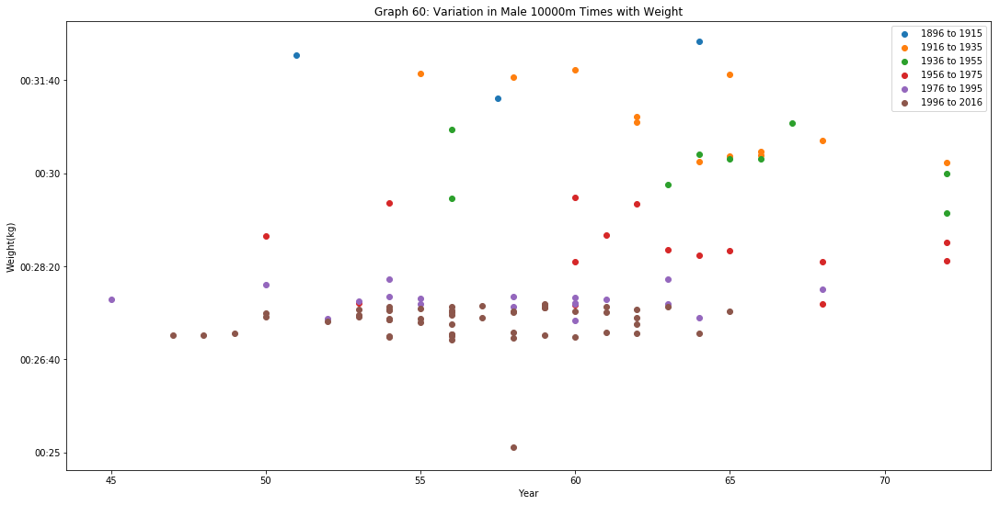

Category = Steeplechase, Event=3000


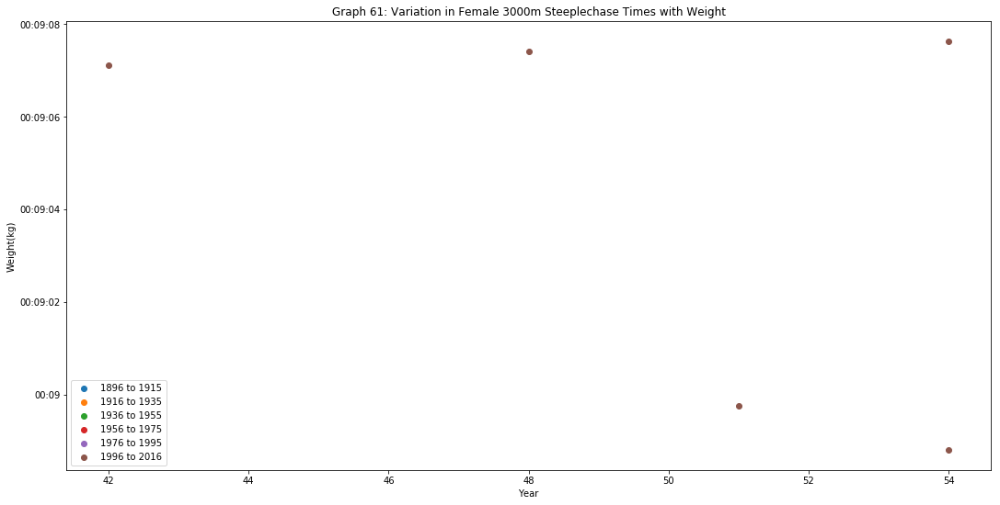

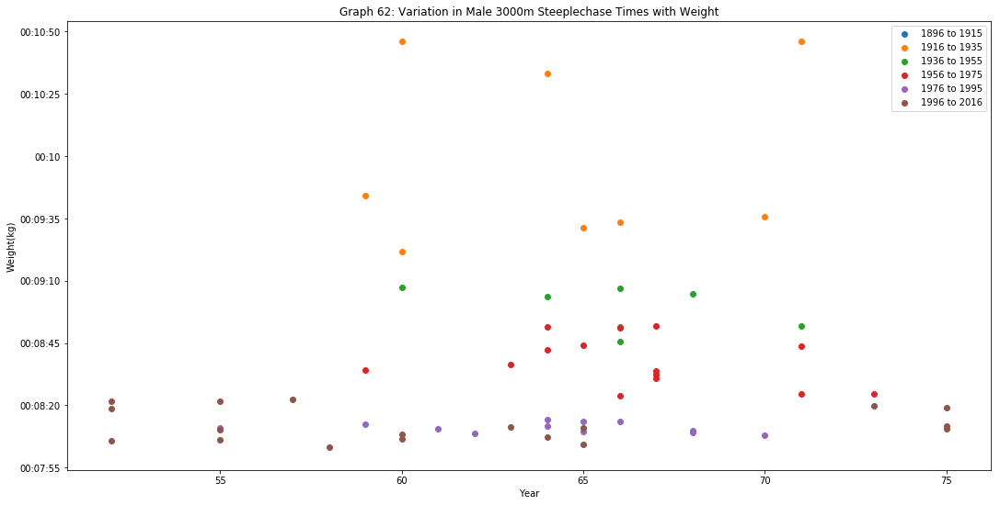

Category = Hurdles, Event=100


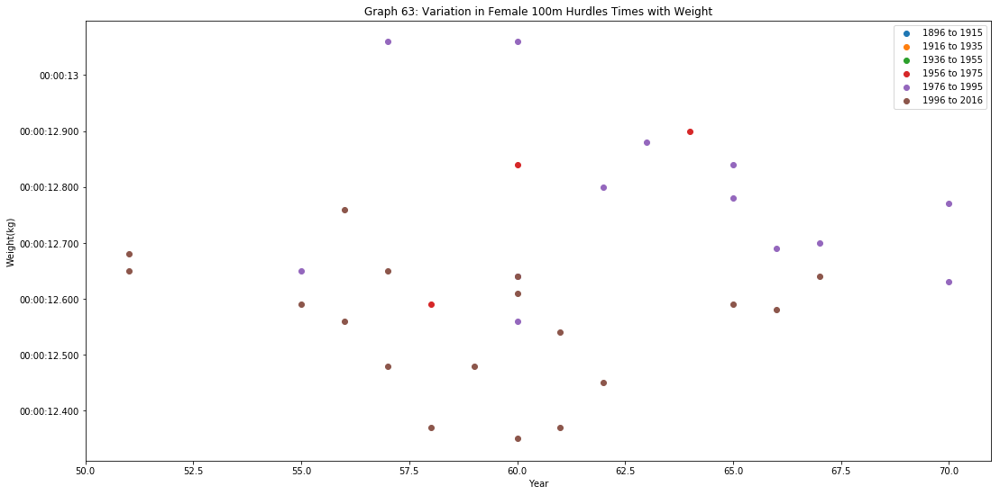

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

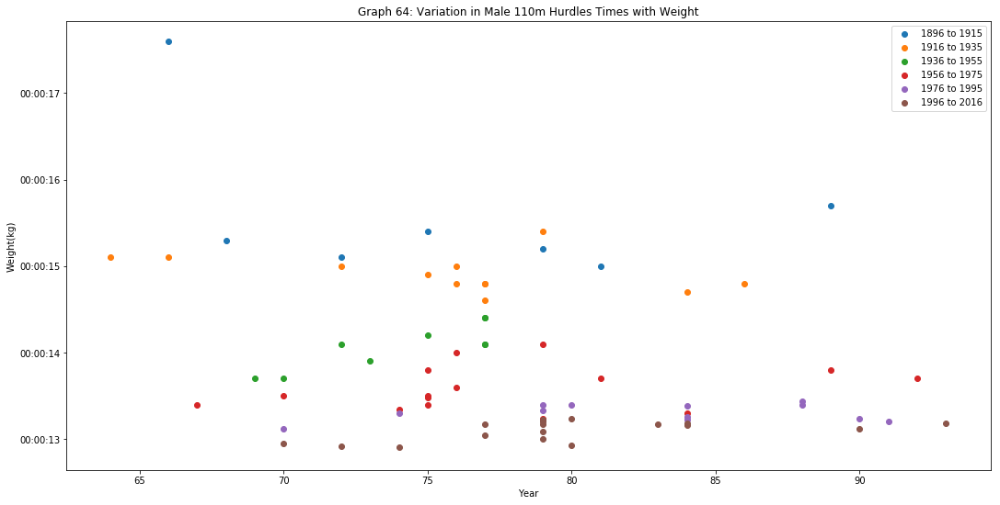

Category = Hurdles, Event=400


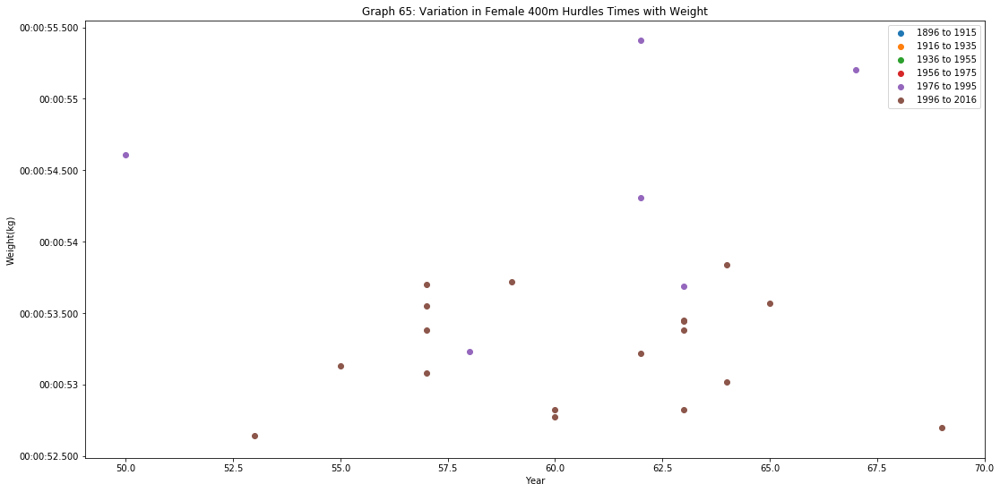

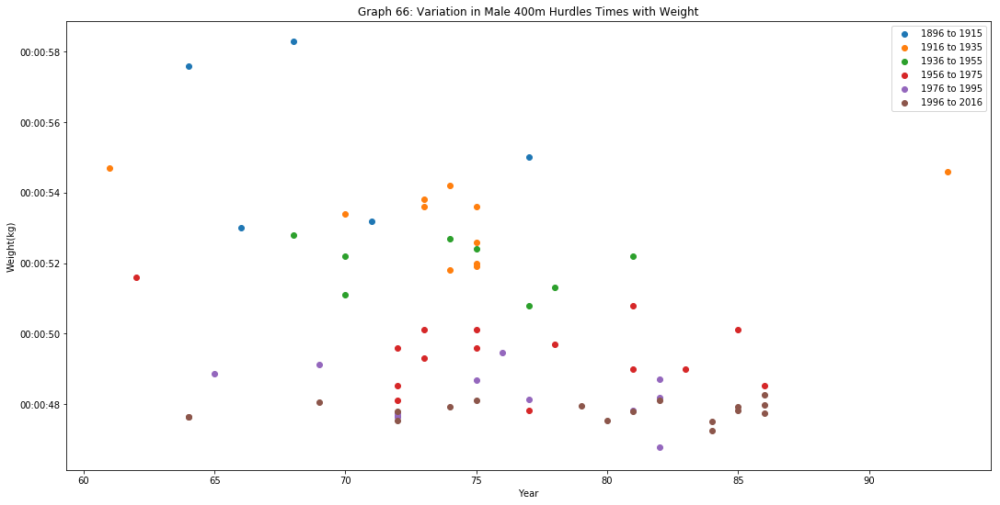

Category = Road, Event=42195


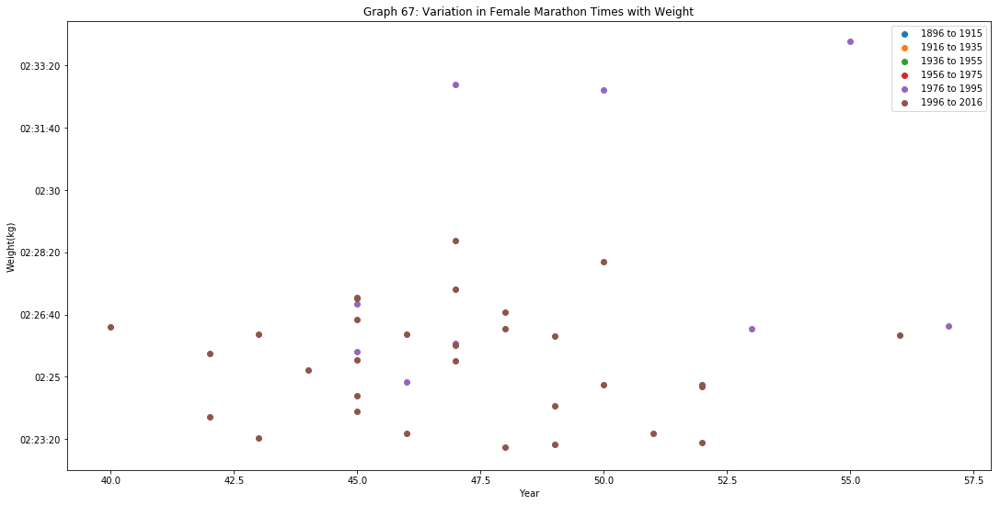

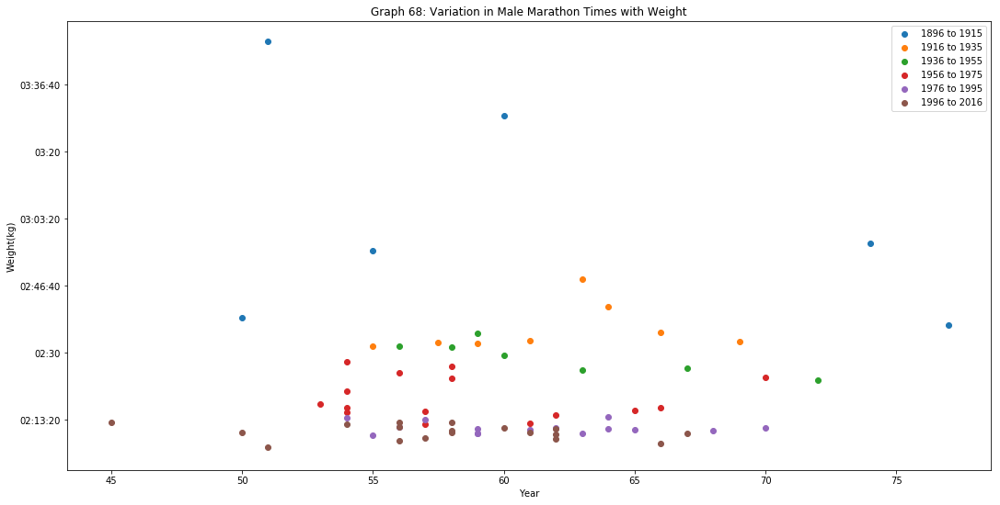

Category = Track_Flat, Event=100


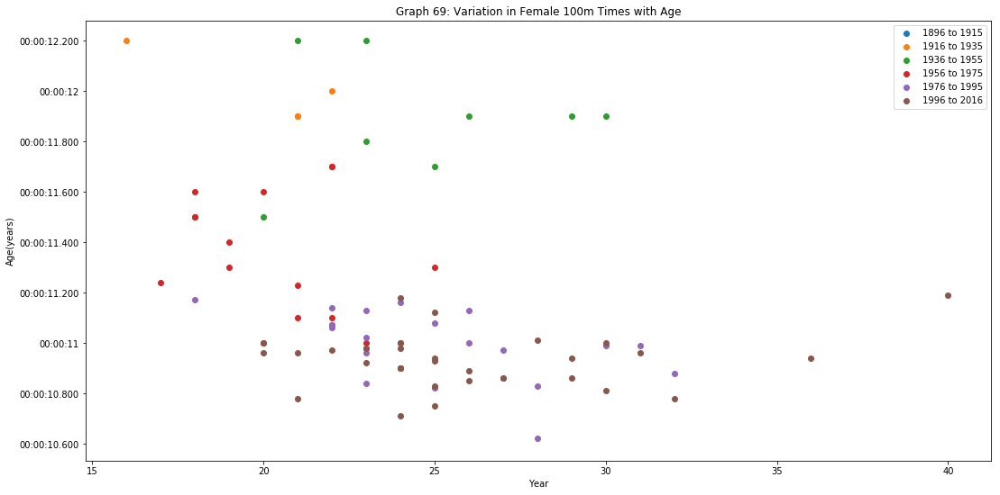

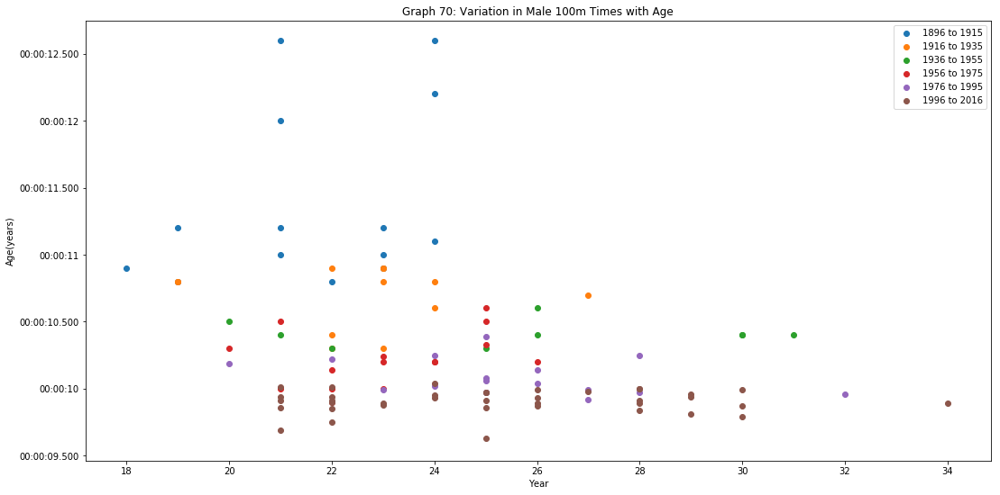

Category = Track_Flat, Event=200


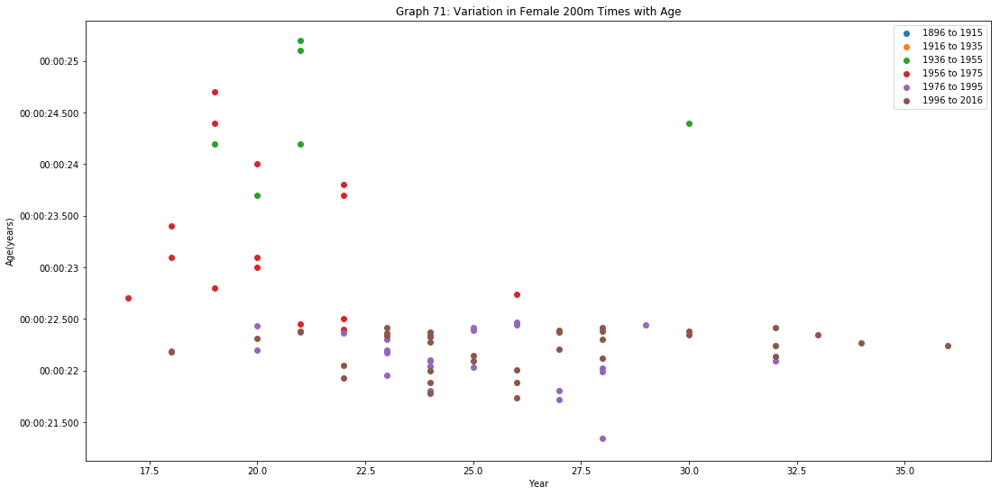

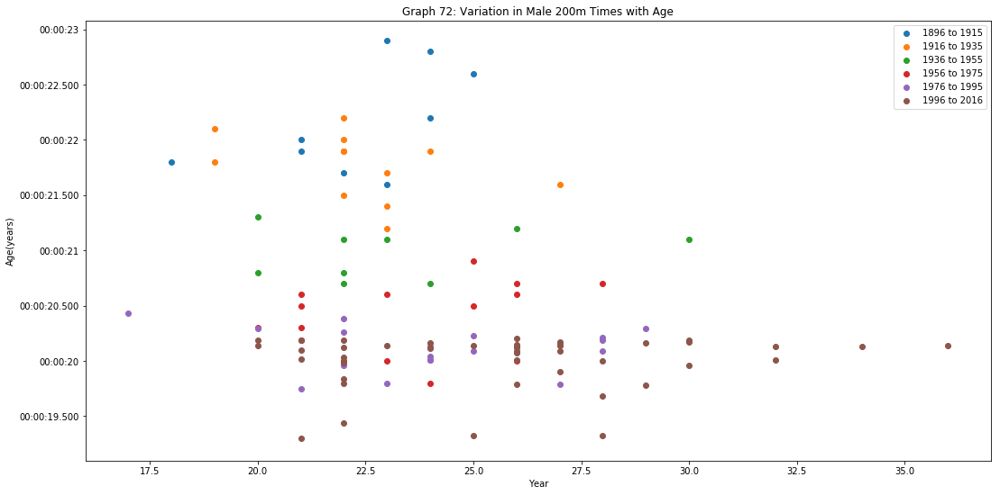

Category = Track_Flat, Event=400


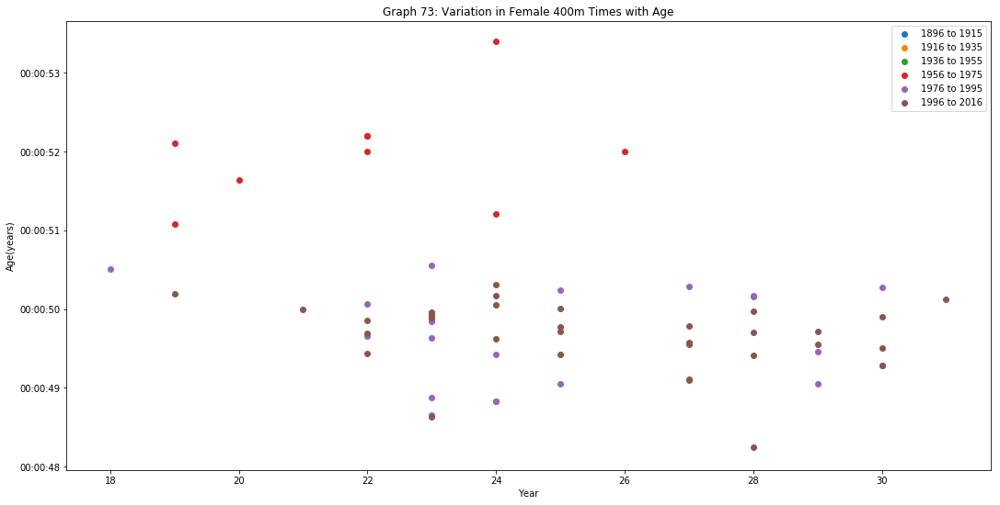

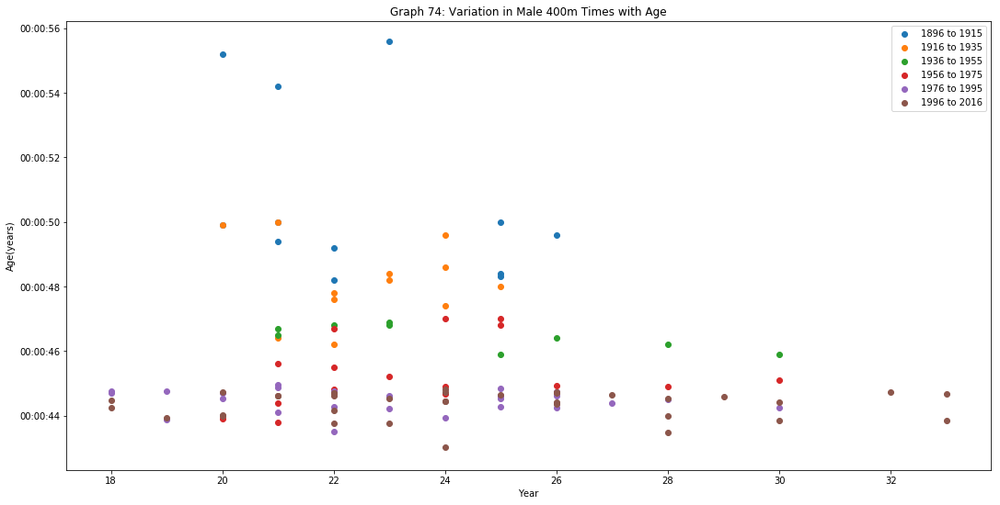

Category = Track_Flat, Event=800


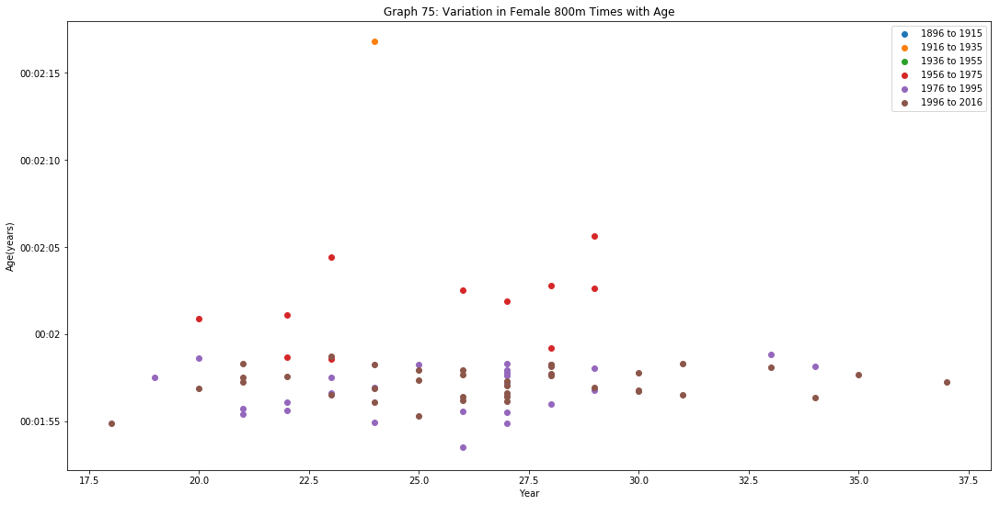

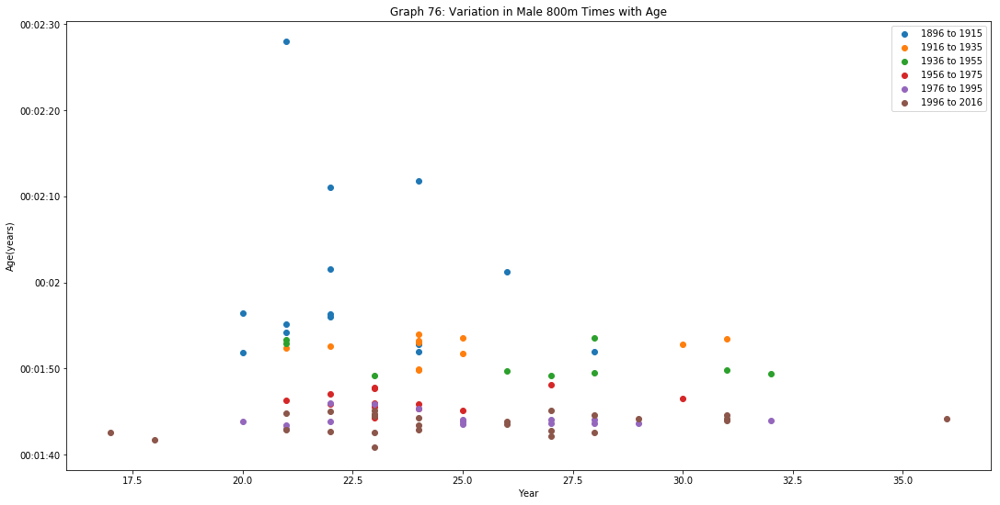

Category = Track_Flat, Event=1500


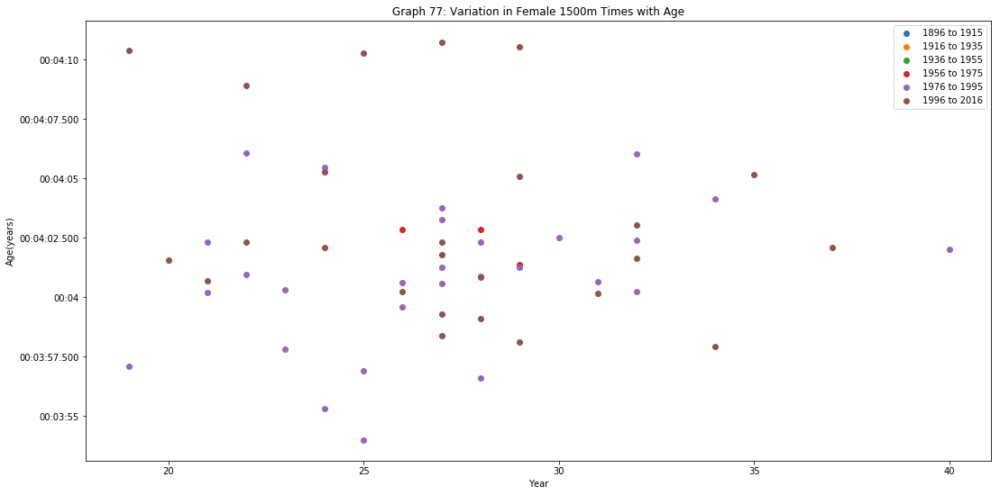

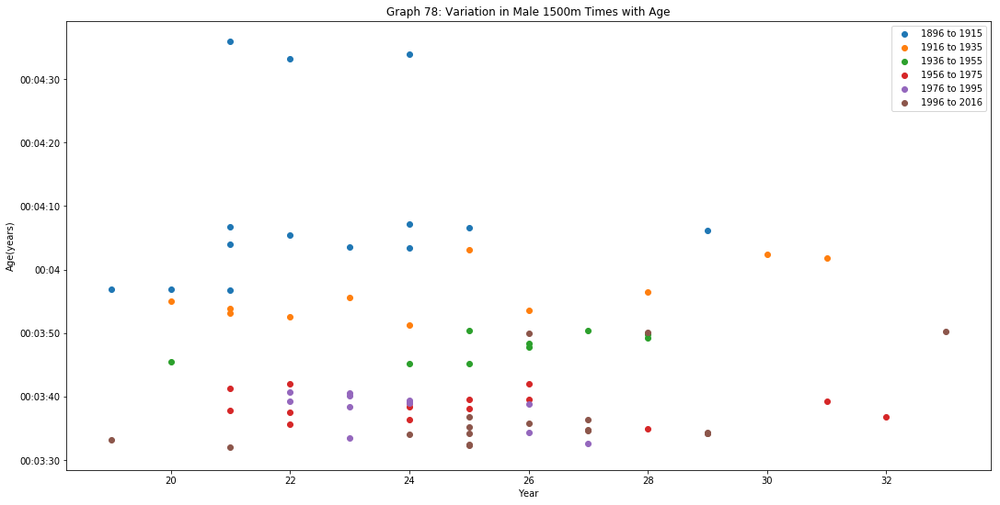

Category = Track_Flat, Event=5000


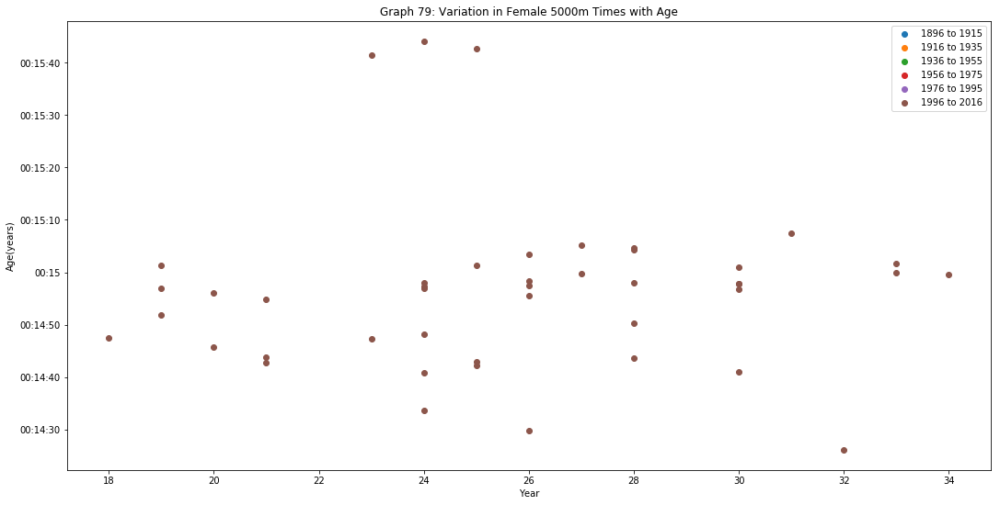

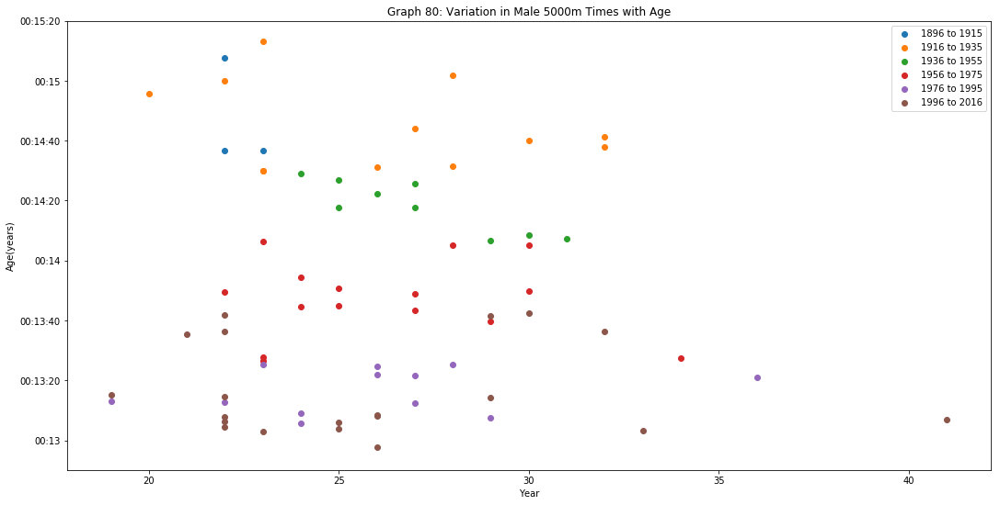

Category = Track_Flat, Event=10000


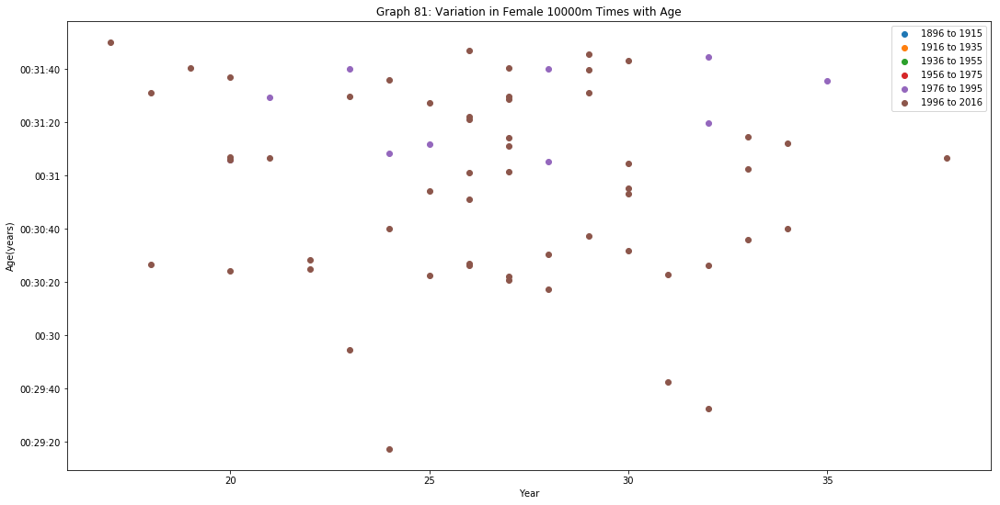

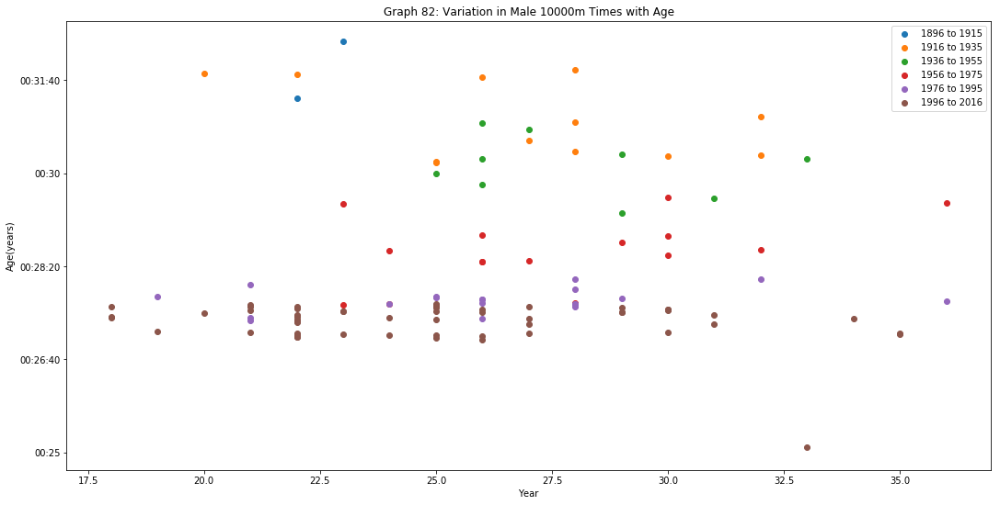

Category = Steeplechase, Event=3000


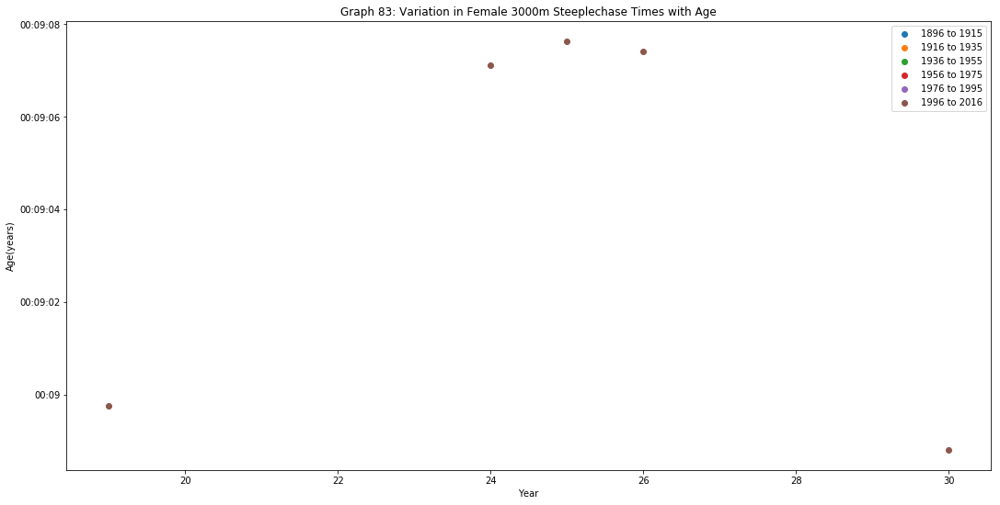

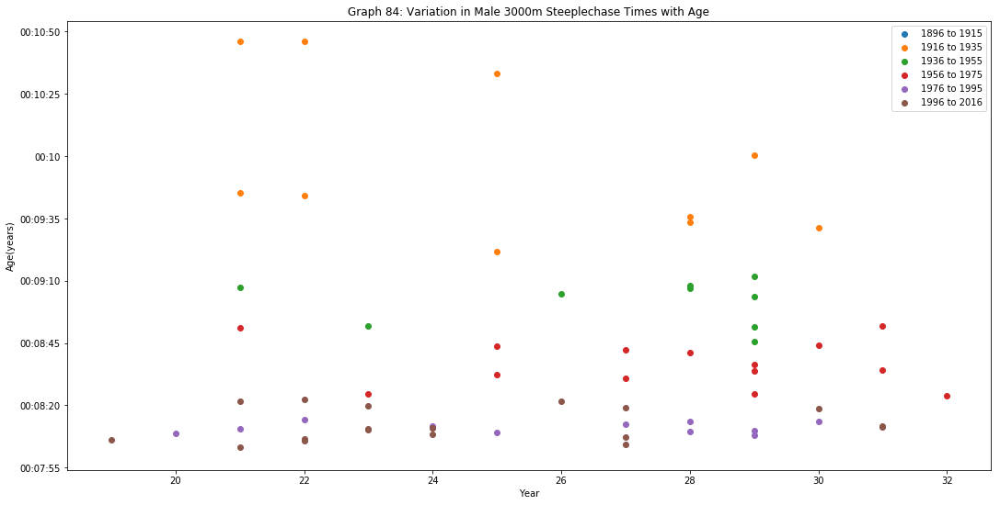

Category = Hurdles, Event=100


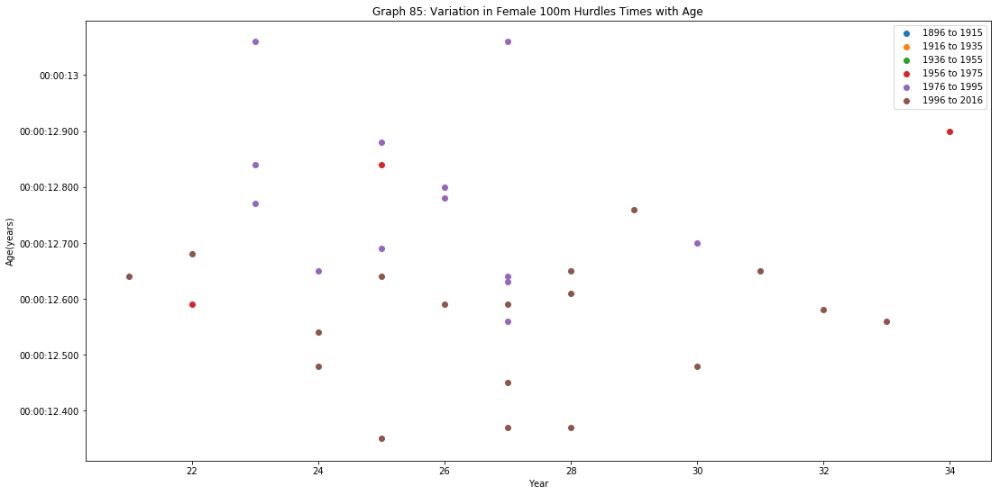

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

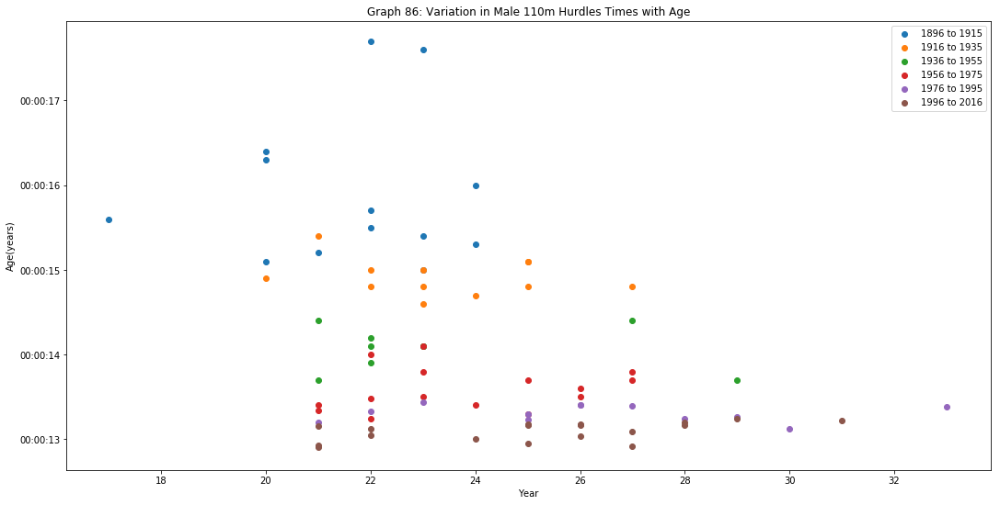

Category = Hurdles, Event=400


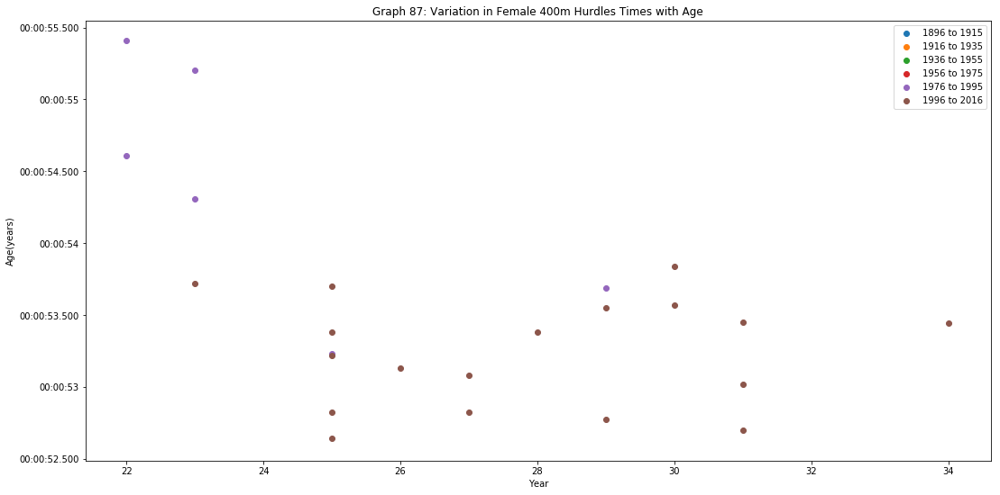

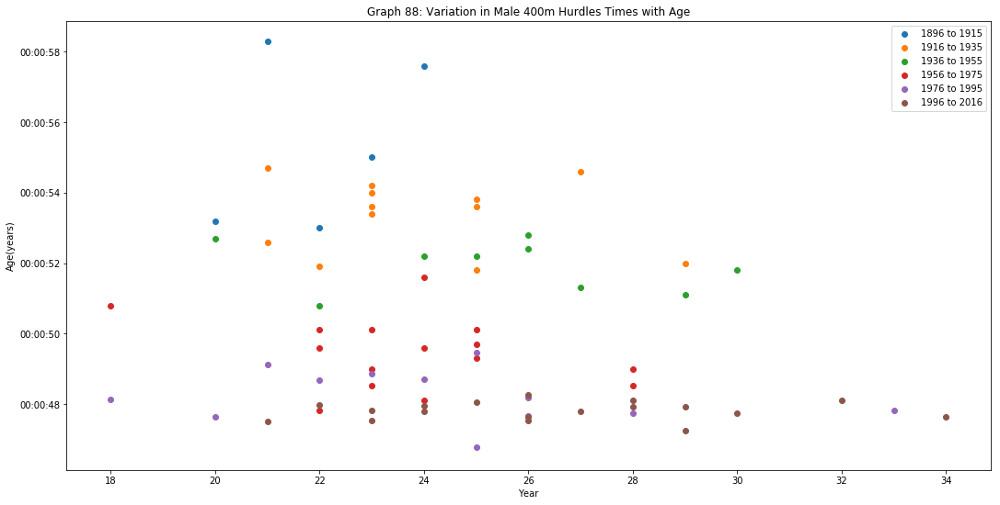

Category = Road, Event=42195


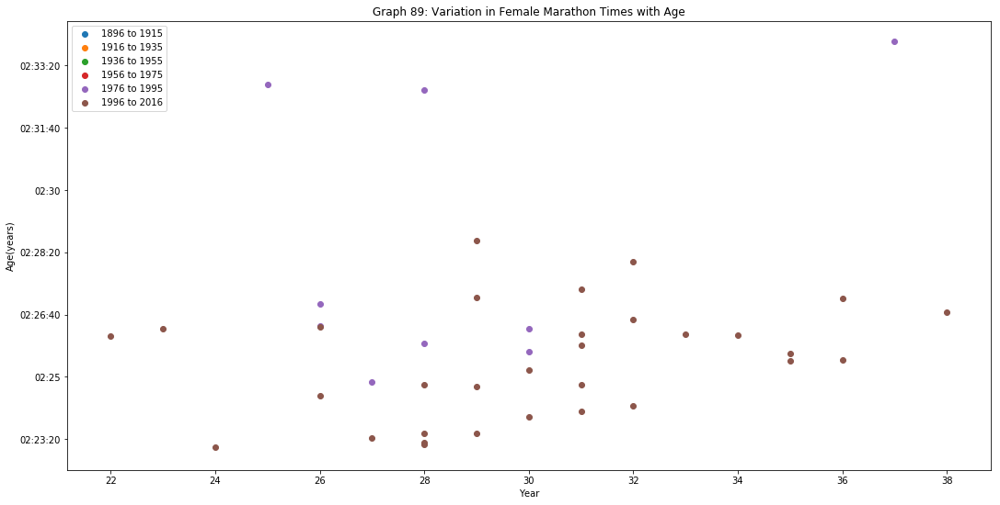

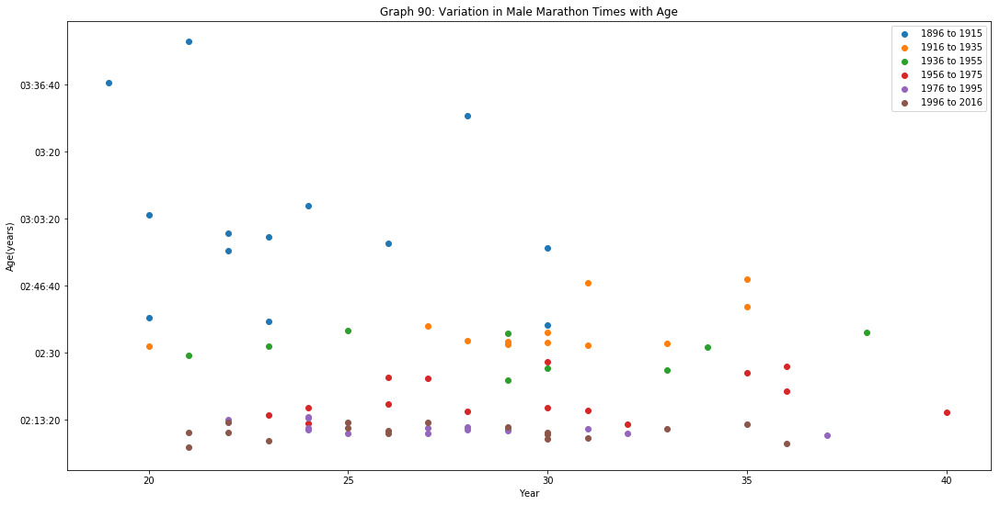

Category = Track_Flat, Event=100


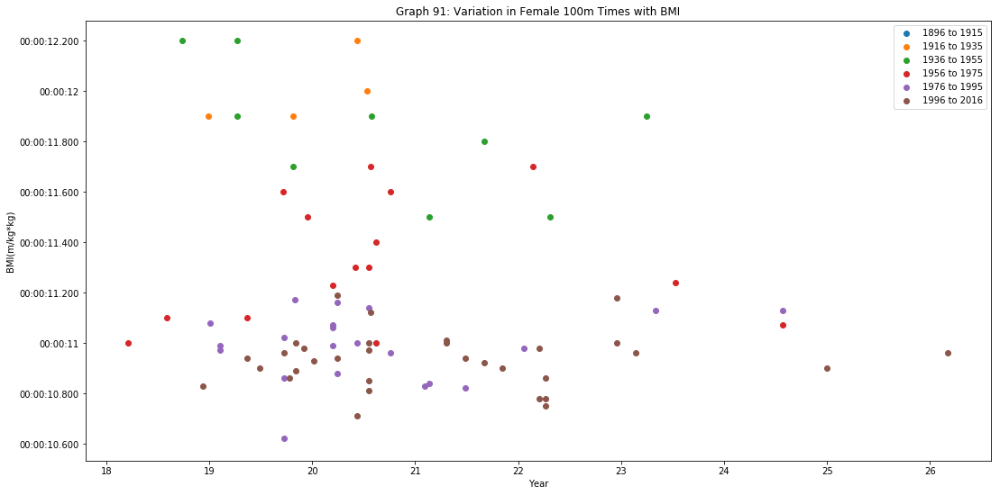

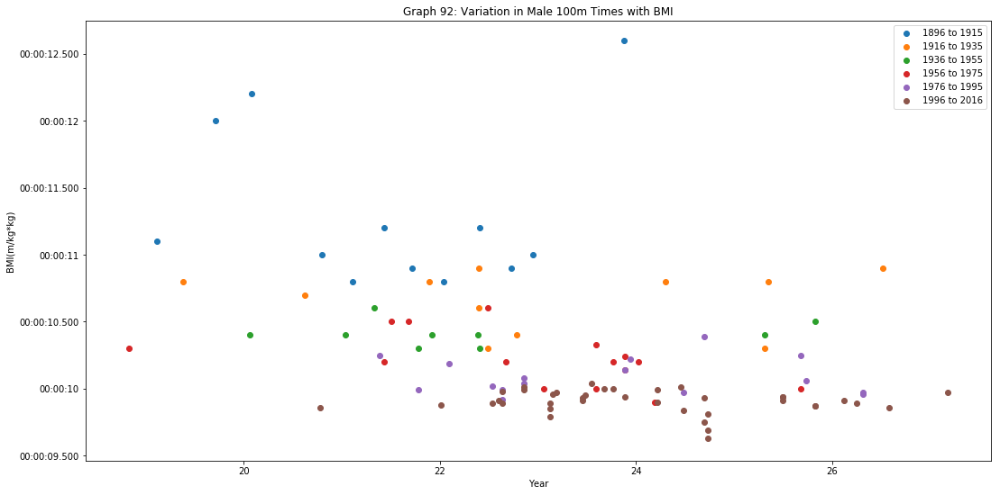

Category = Track_Flat, Event=200


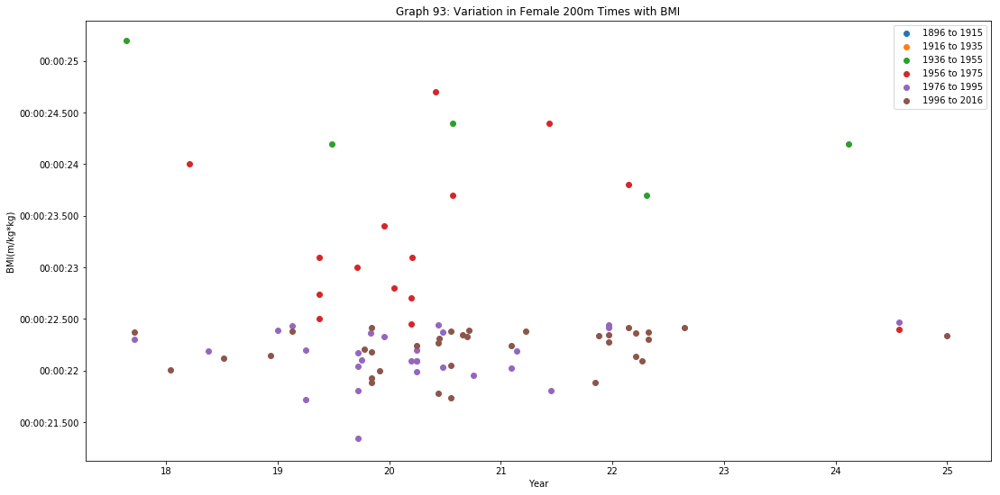

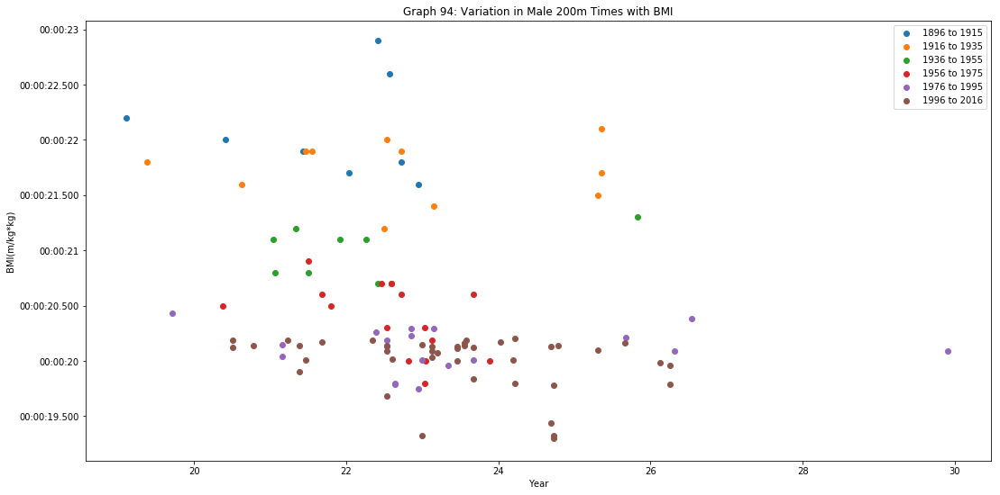

Category = Track_Flat, Event=400


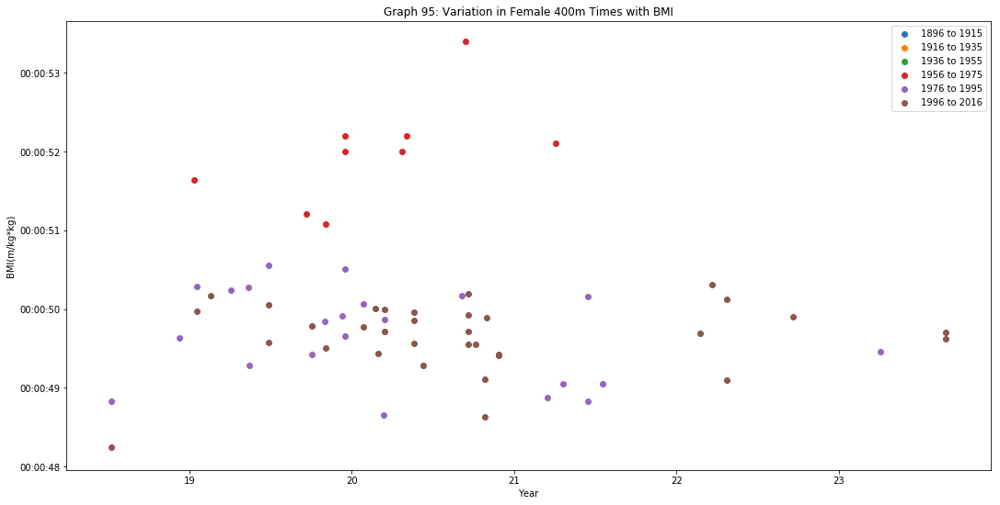

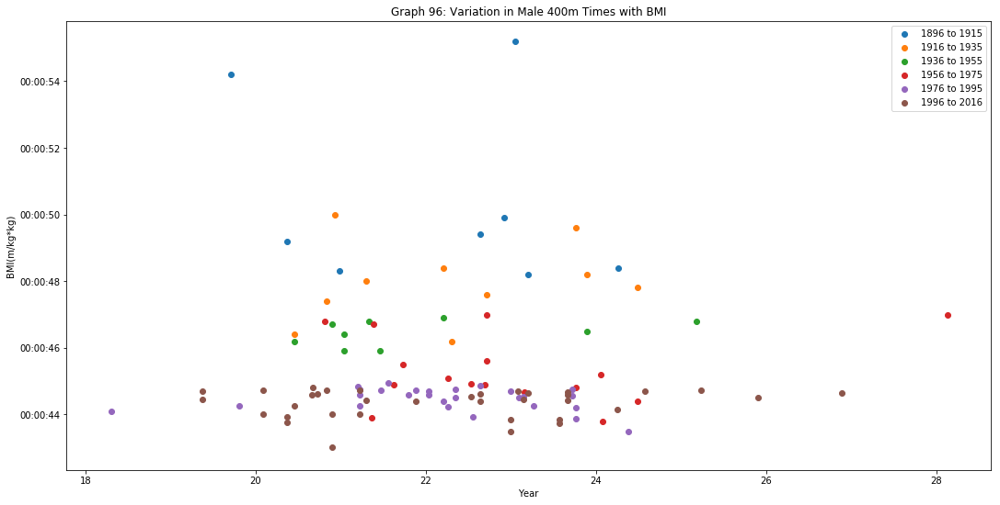

Category = Track_Flat, Event=800


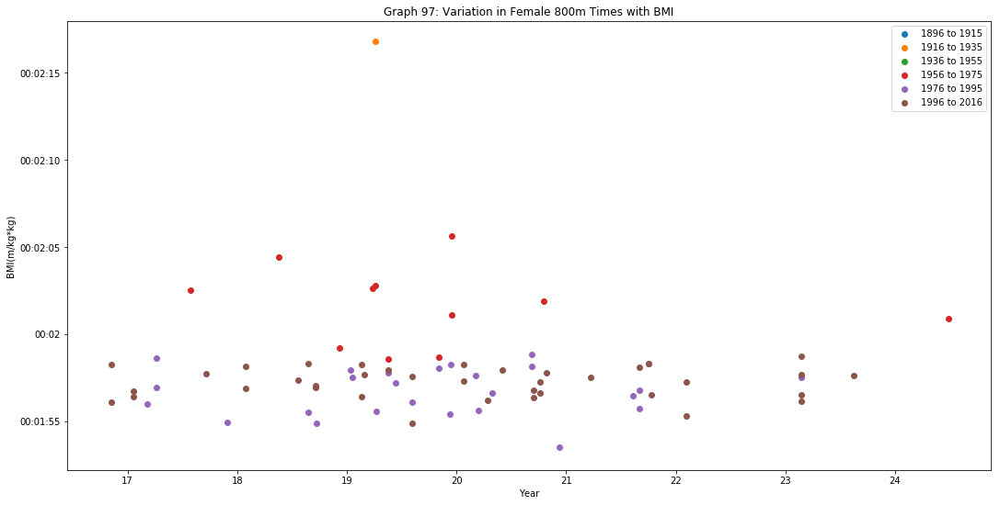

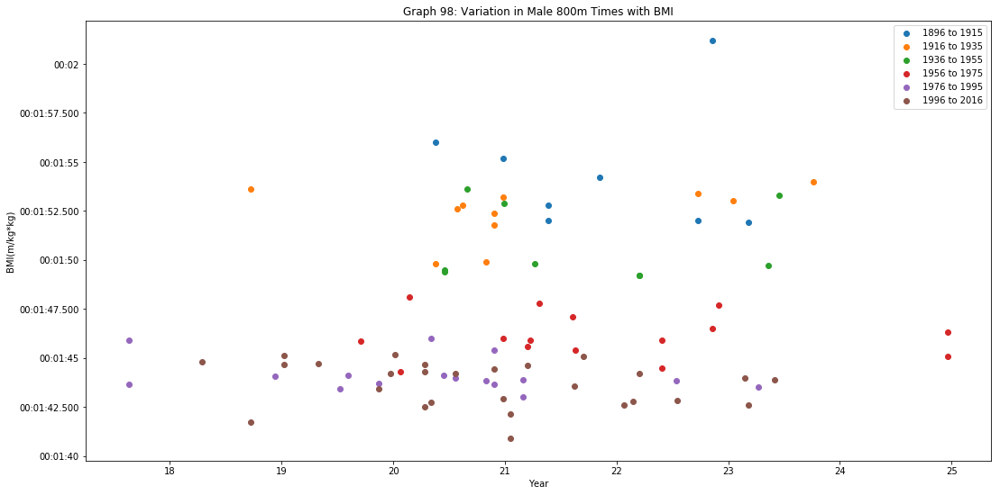

Category = Track_Flat, Event=1500


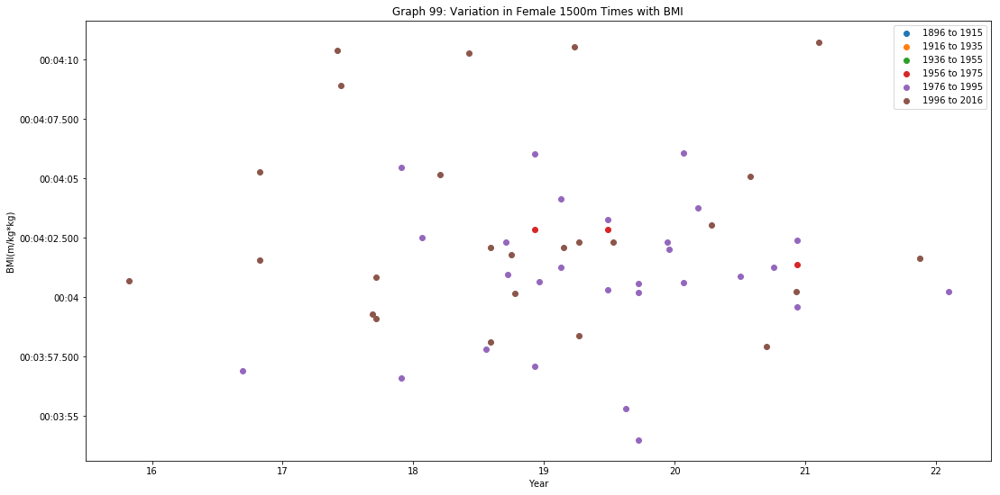

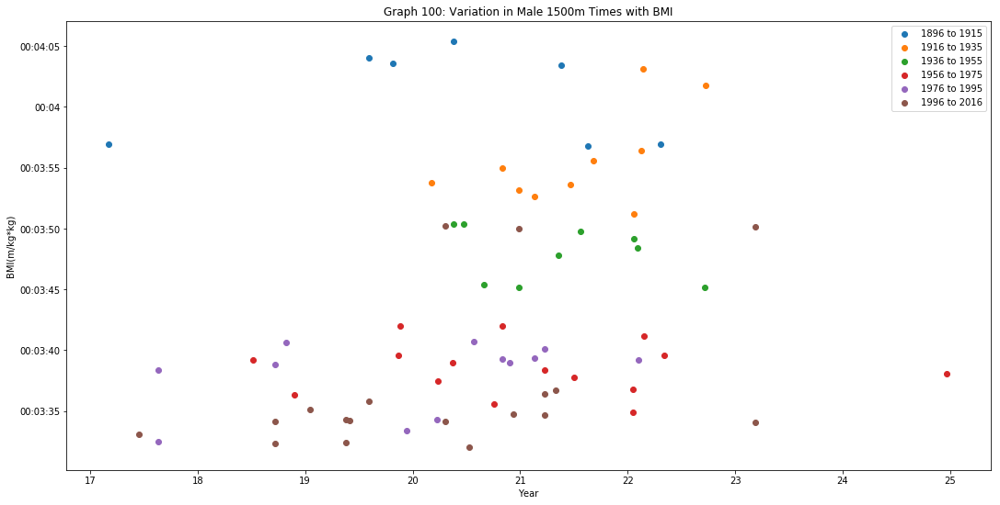

Category = Track_Flat, Event=5000


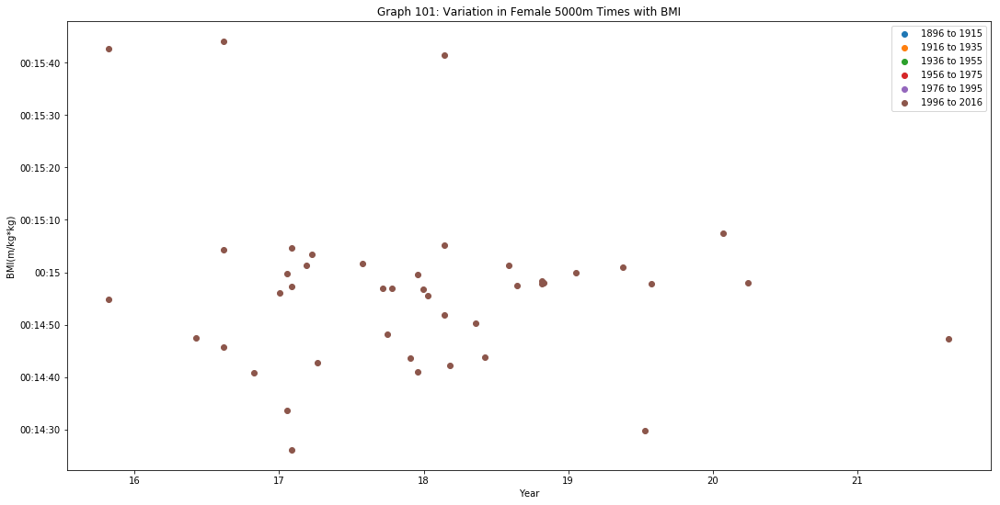

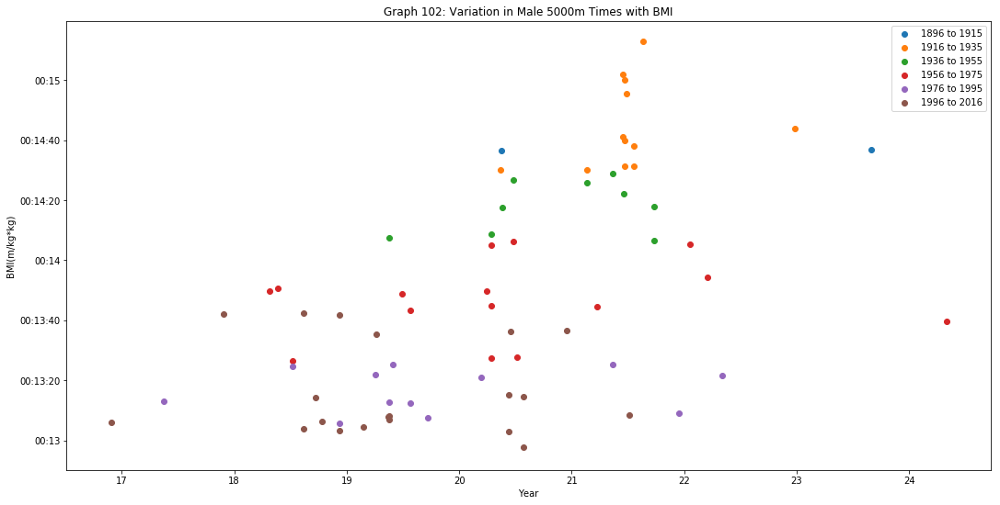

Category = Track_Flat, Event=10000


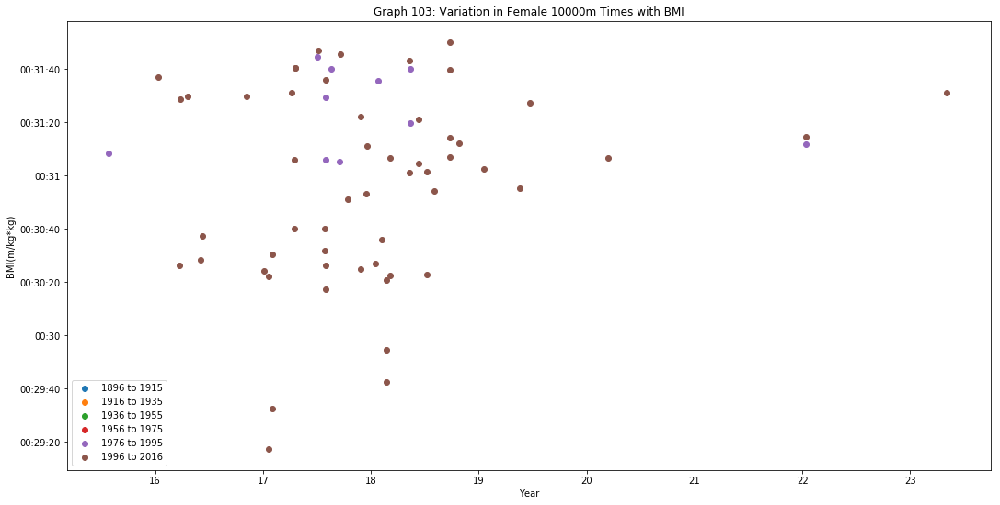

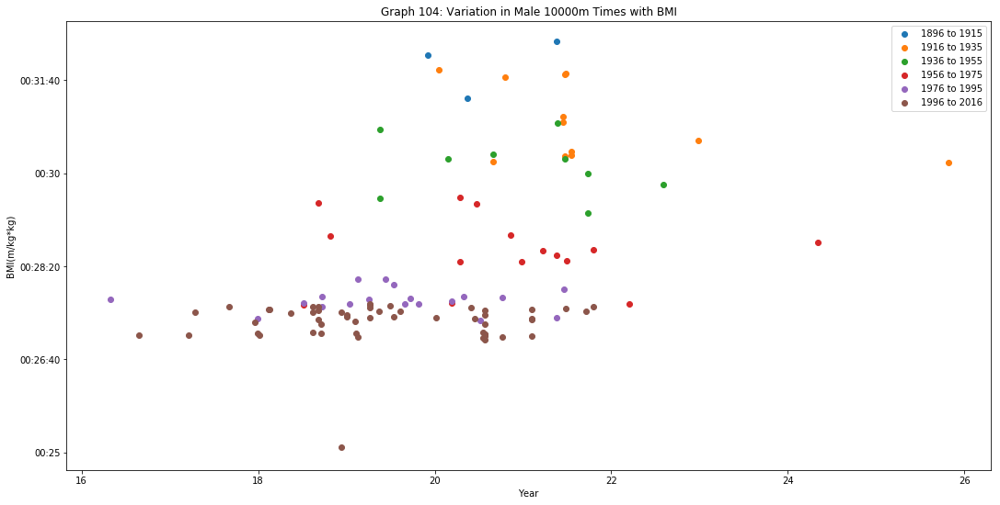

Category = Steeplechase, Event=3000


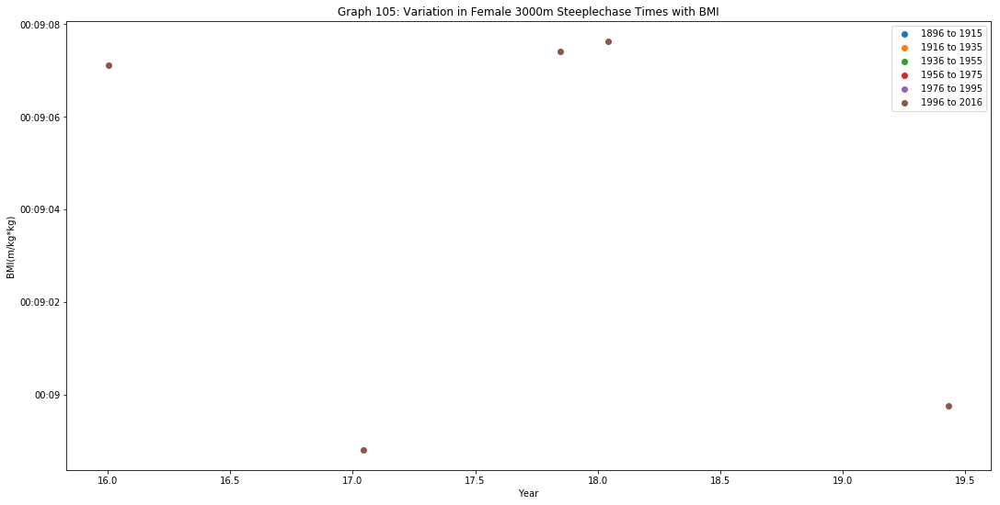

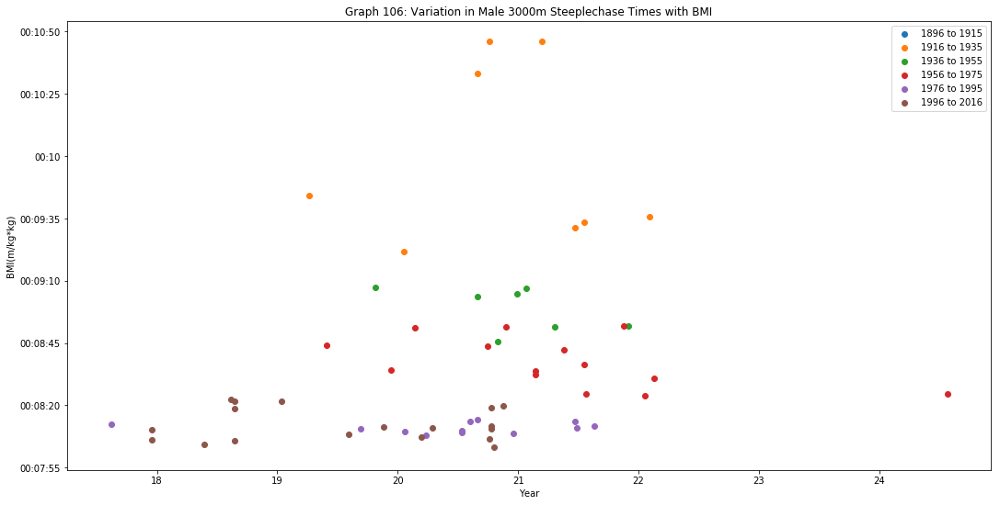

Category = Hurdles, Event=100


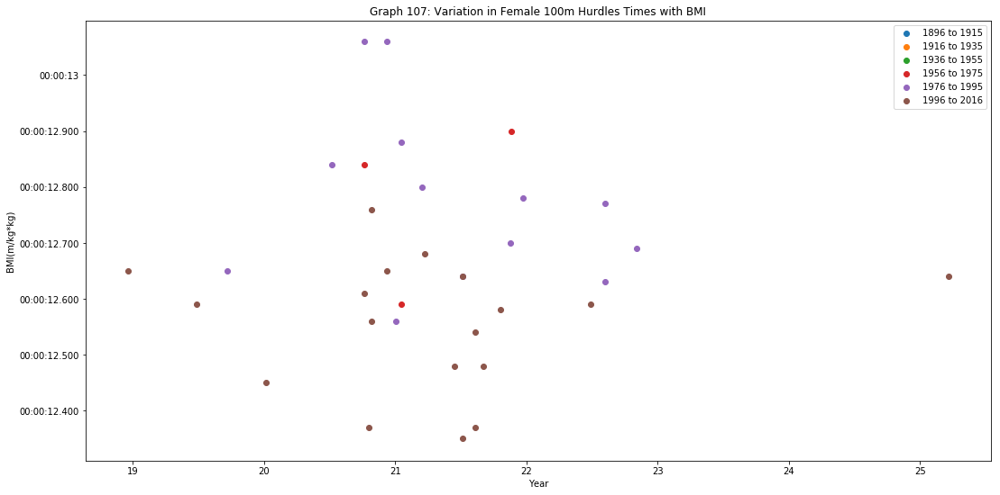

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

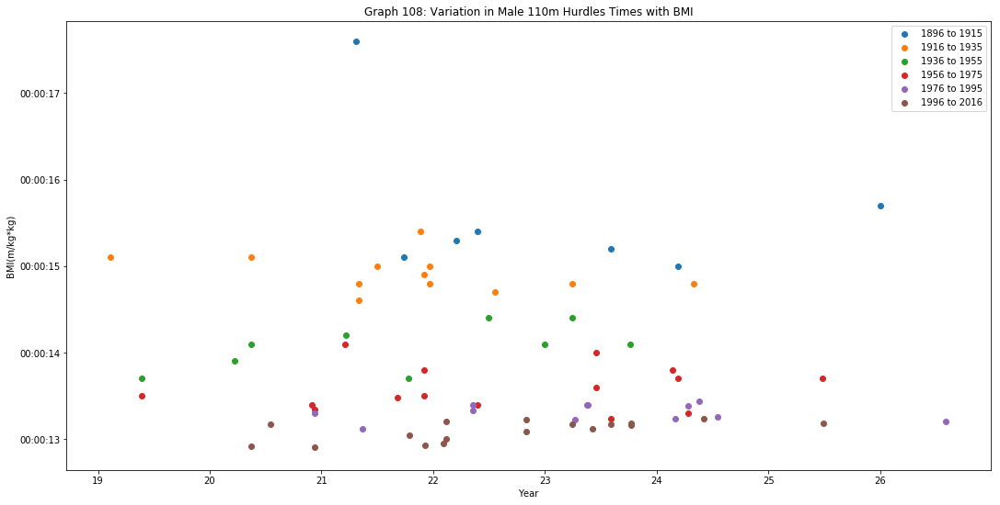

Category = Hurdles, Event=400


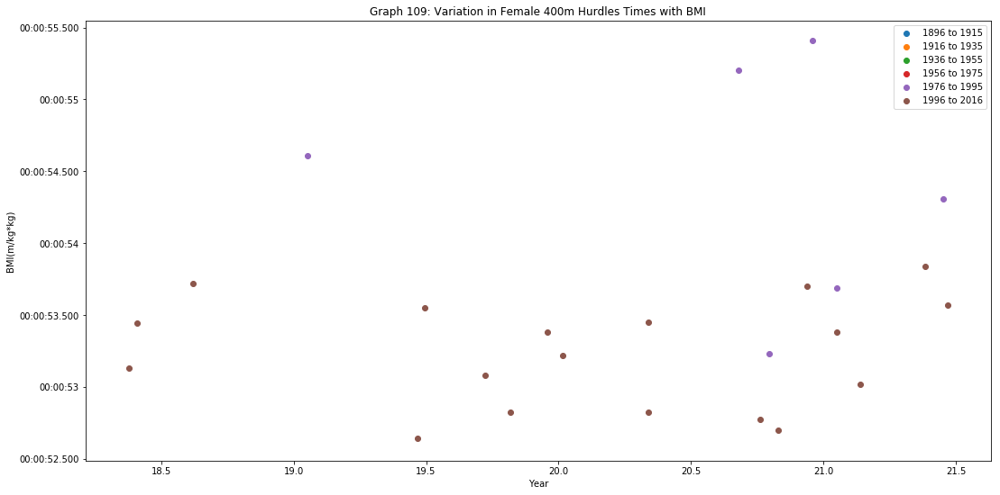

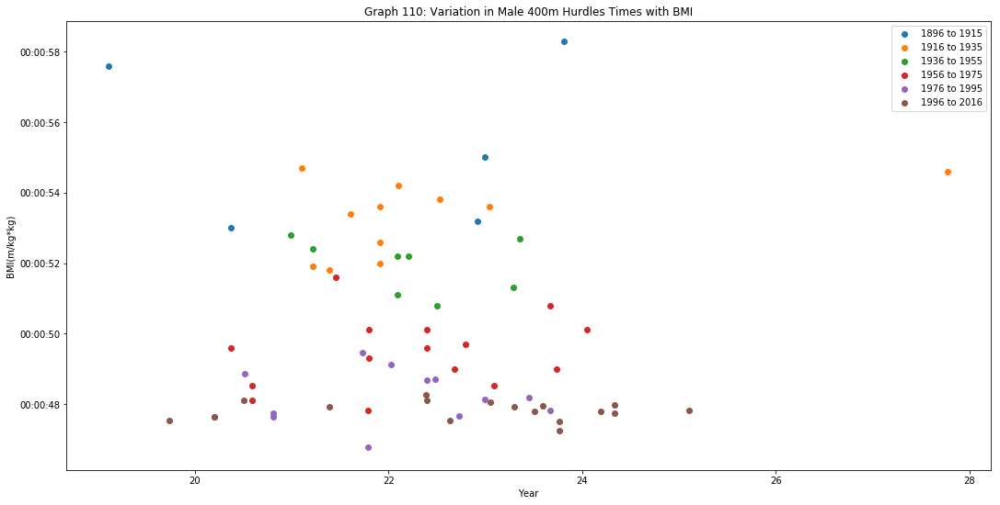

Category = Road, Event=42195


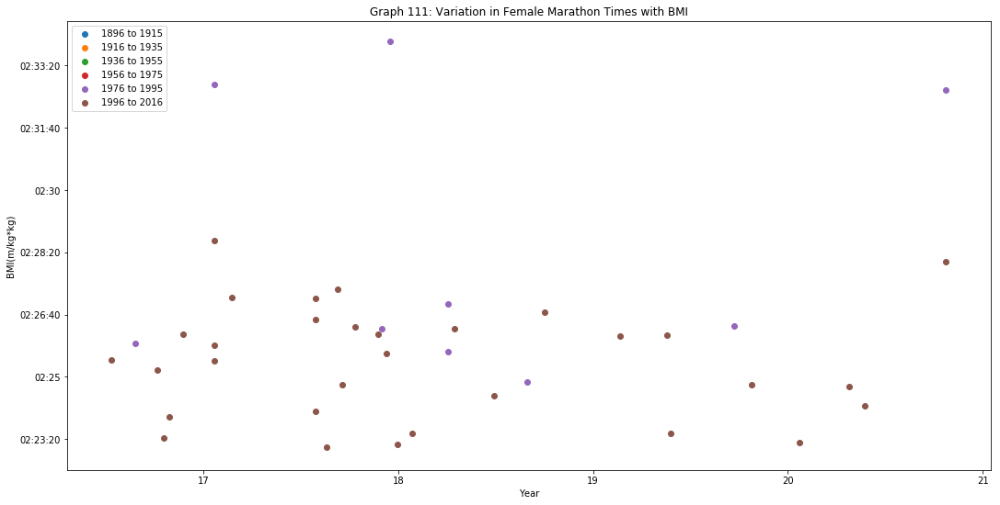

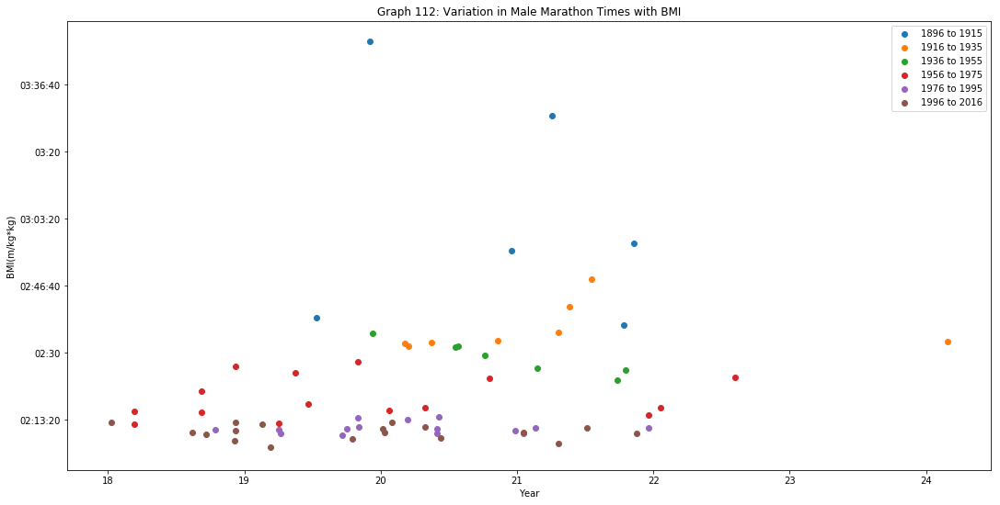

In [129]:
characteristics = ['Height', 'Weight', 'Age', 'BMI']
plot_characteristics_time_groups(event_categories, characteristics)

Category = Track_Flat, Event=100


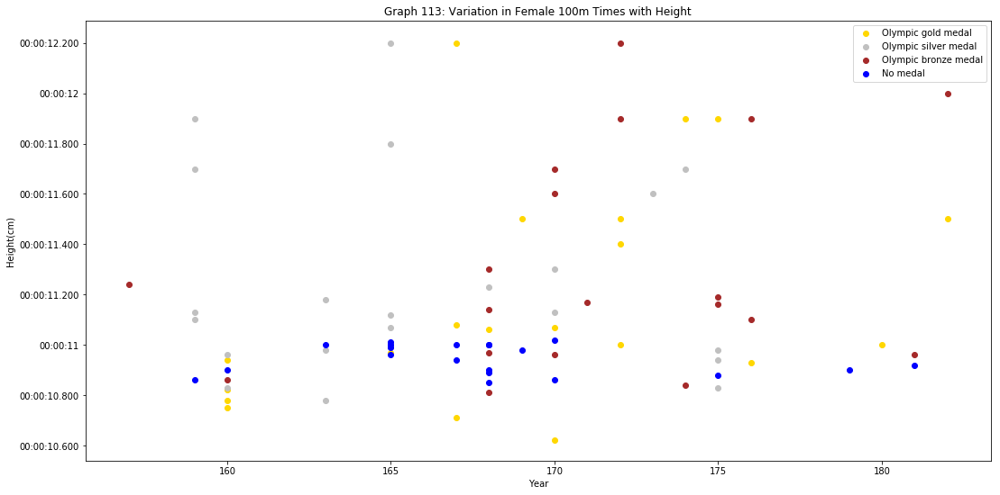

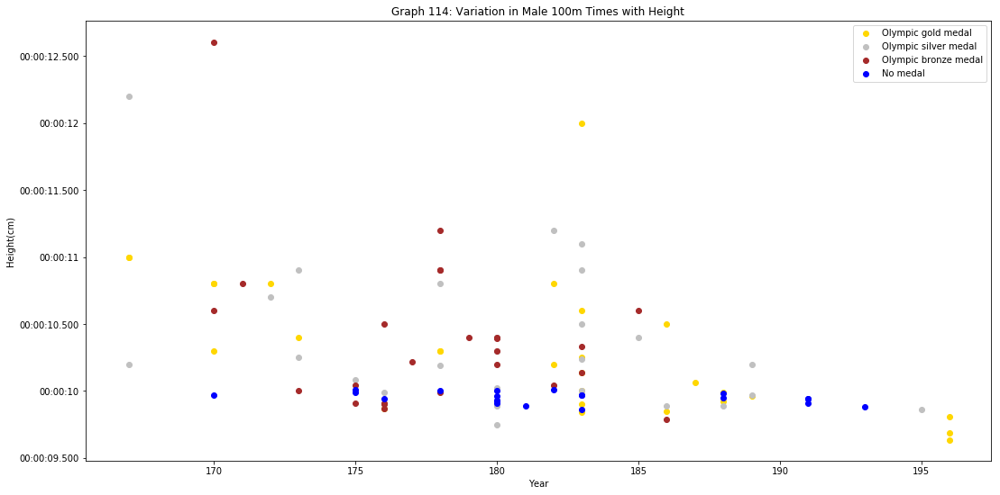

Category = Track_Flat, Event=200


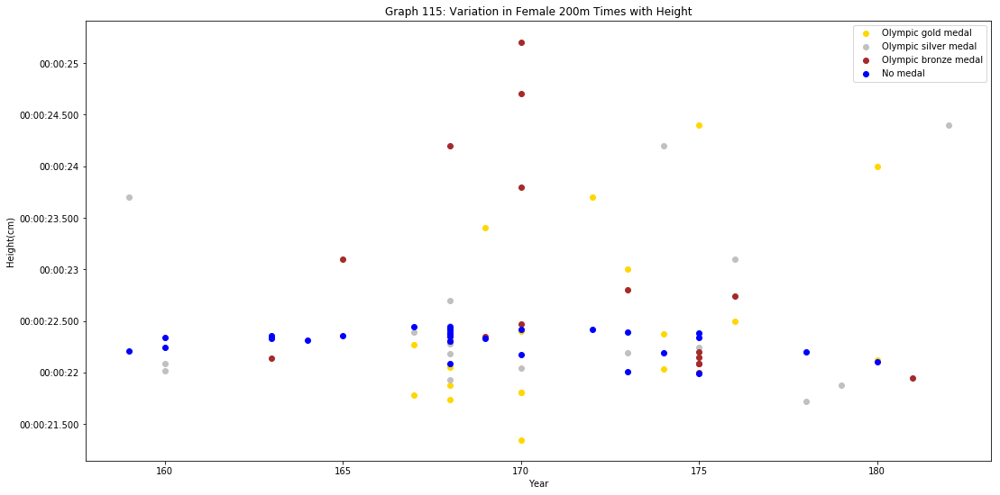

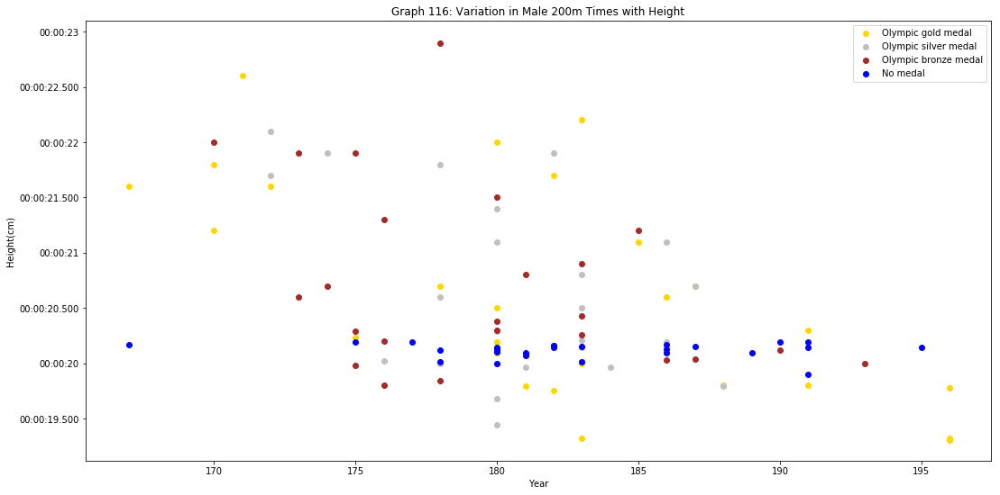

Category = Track_Flat, Event=400


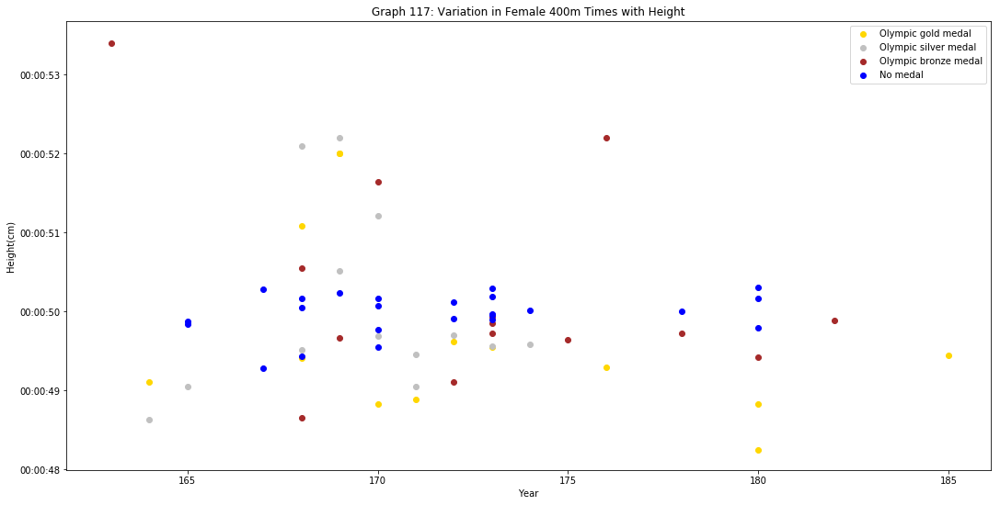

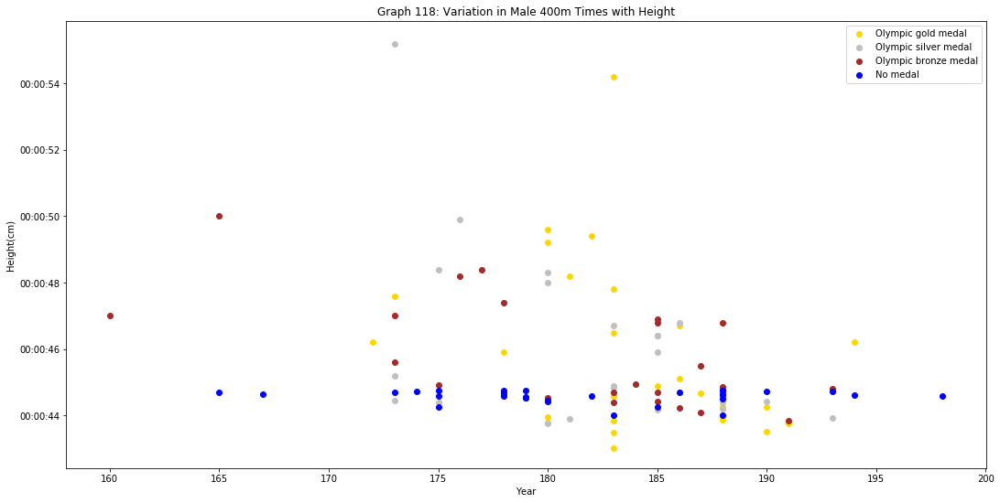

Category = Track_Flat, Event=800


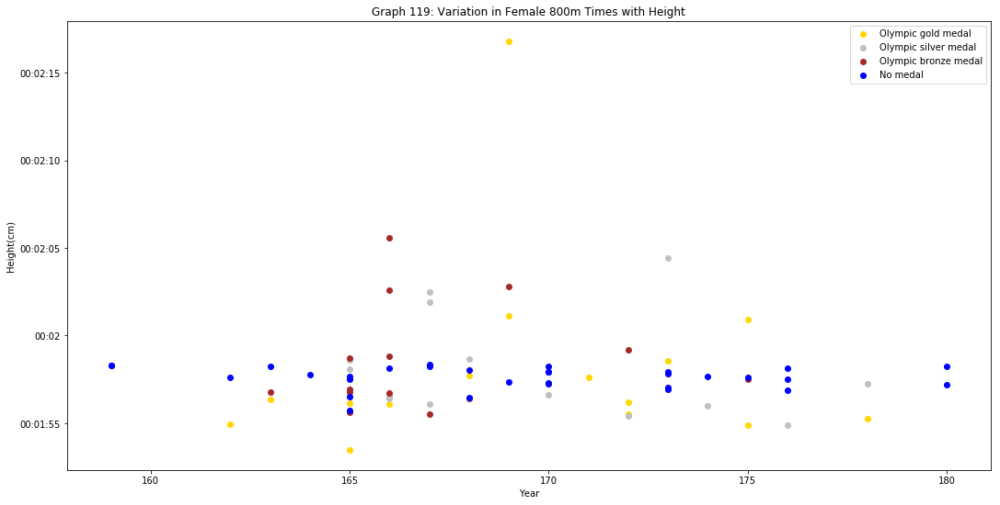

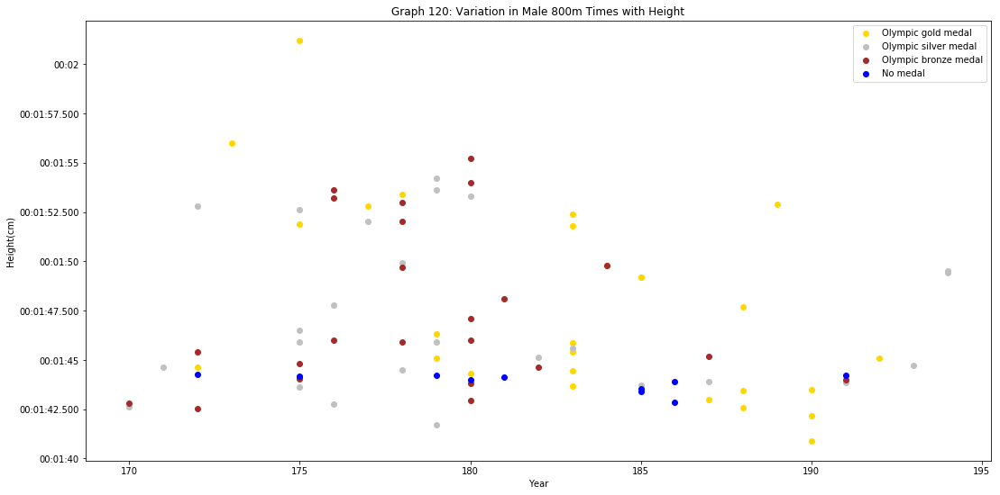

Category = Track_Flat, Event=1500


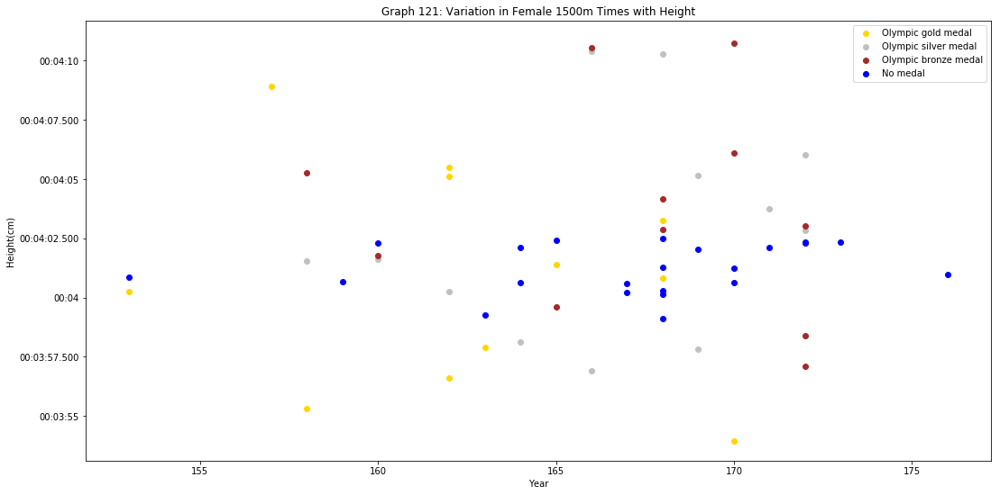

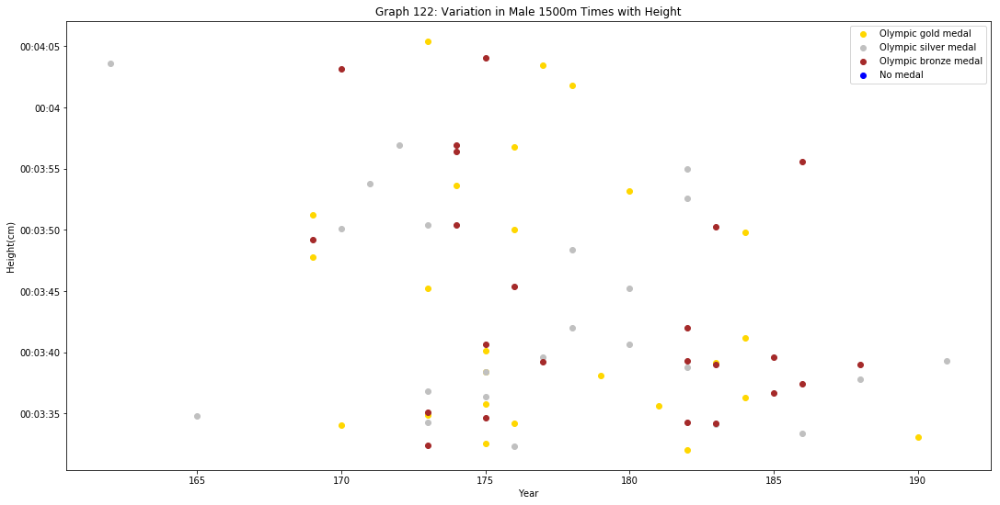

Category = Track_Flat, Event=5000


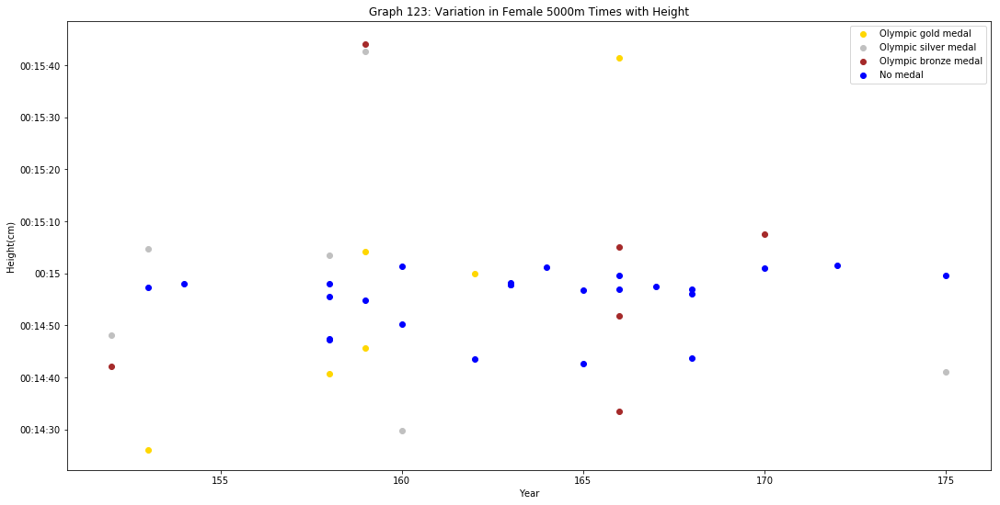

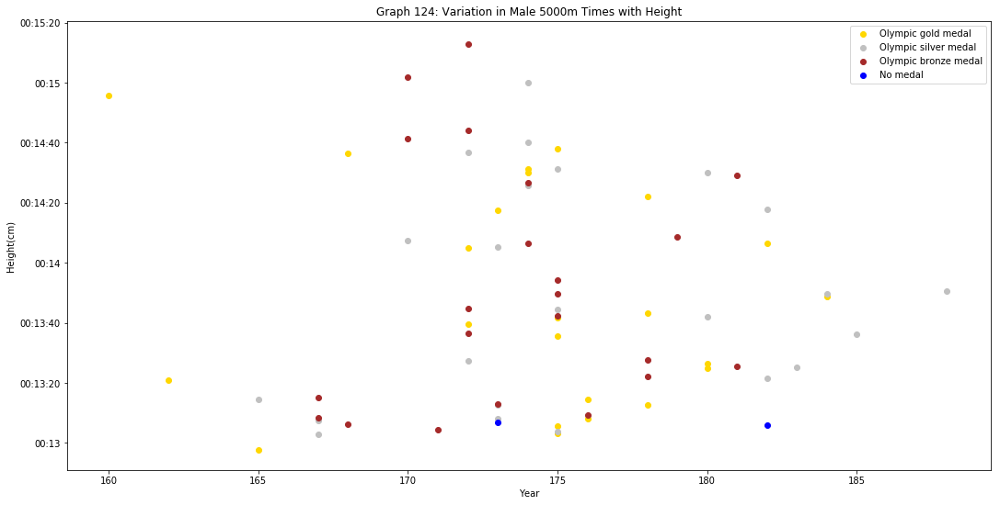

Category = Track_Flat, Event=10000


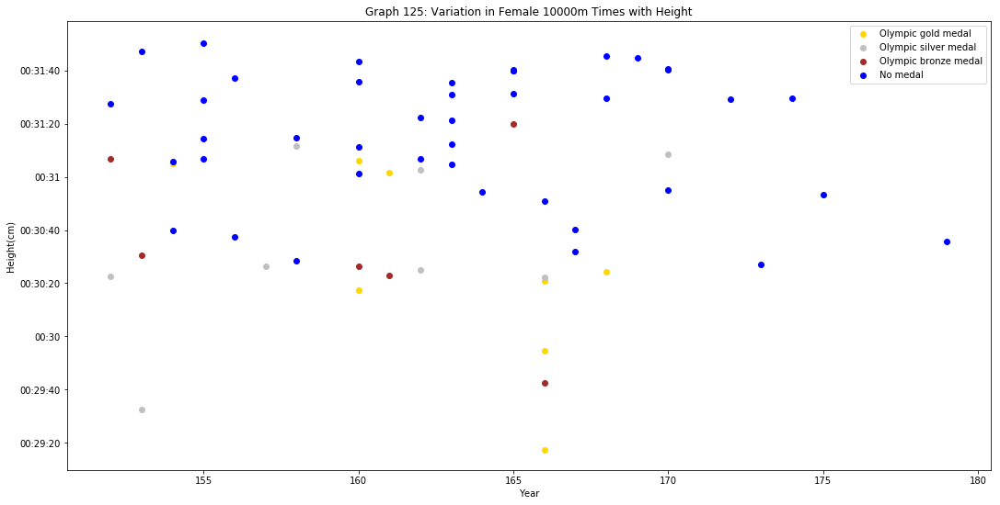

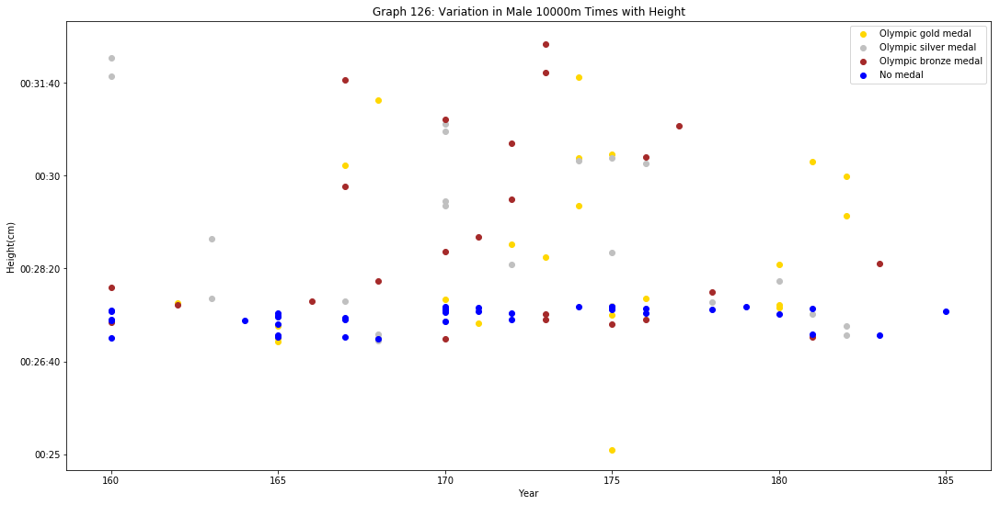

Category = Steeplechase, Event=3000


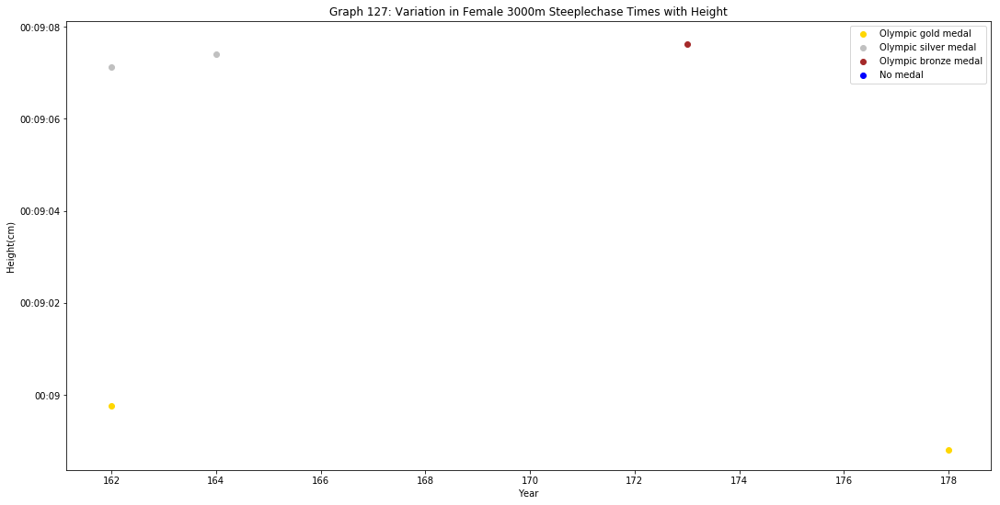

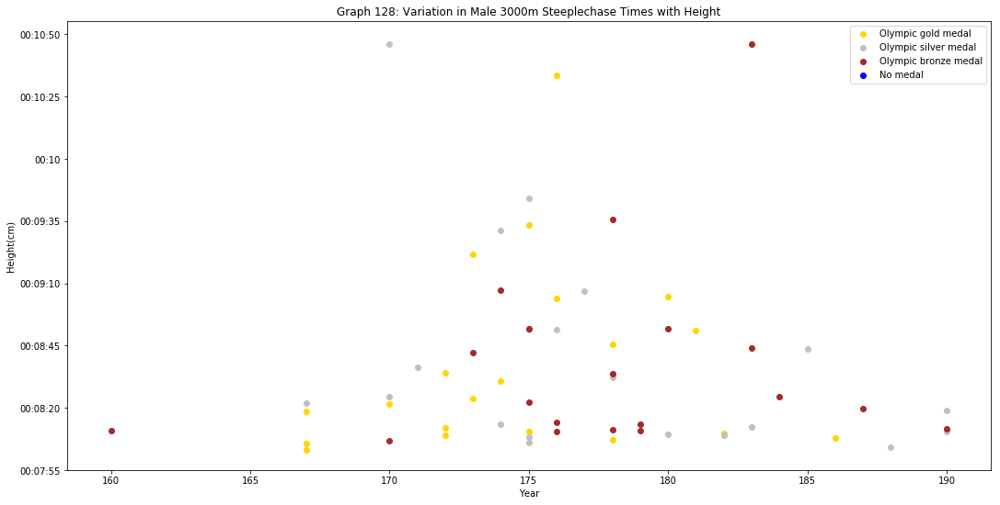

Category = Hurdles, Event=100


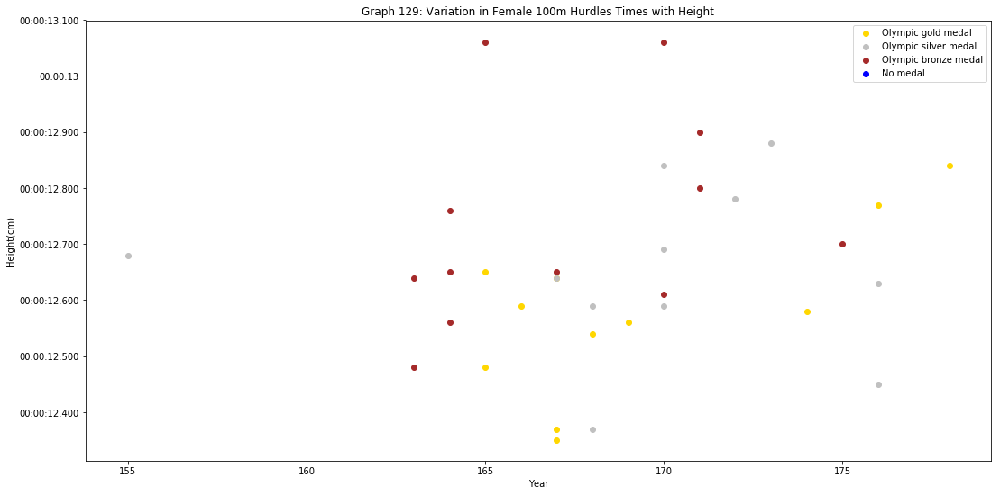

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

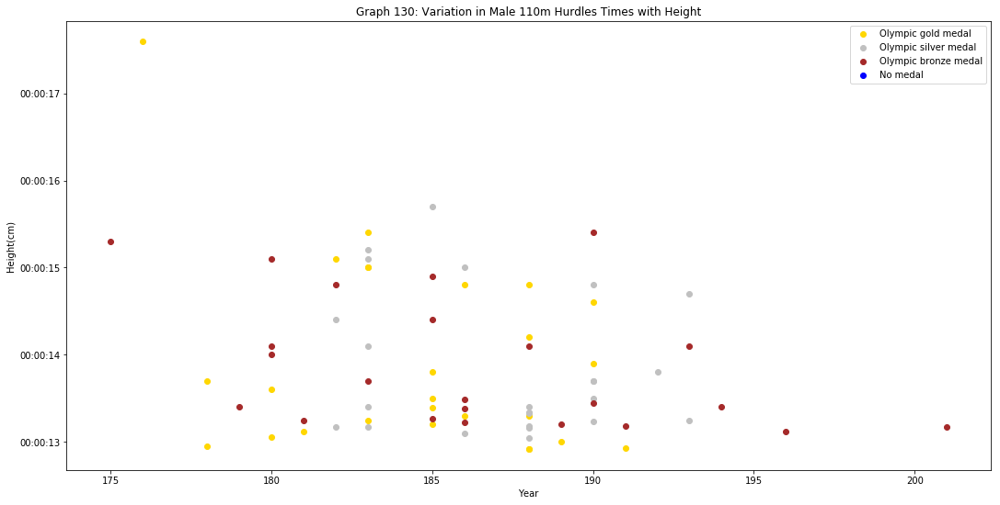

Category = Hurdles, Event=400


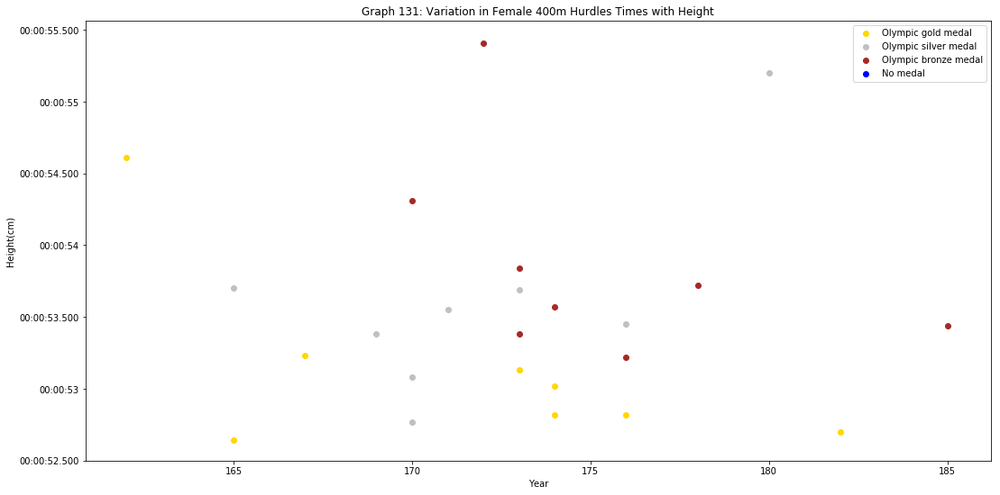

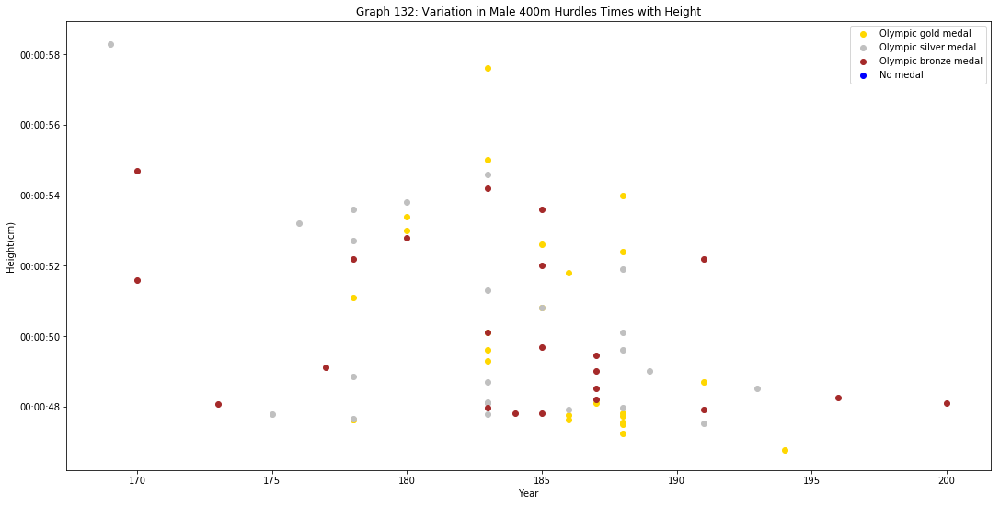

Category = Road, Event=42195


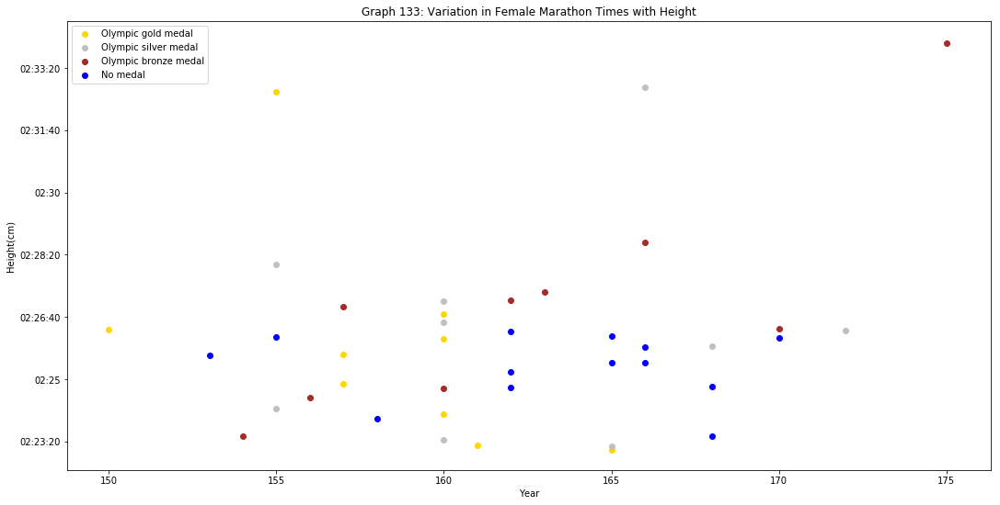

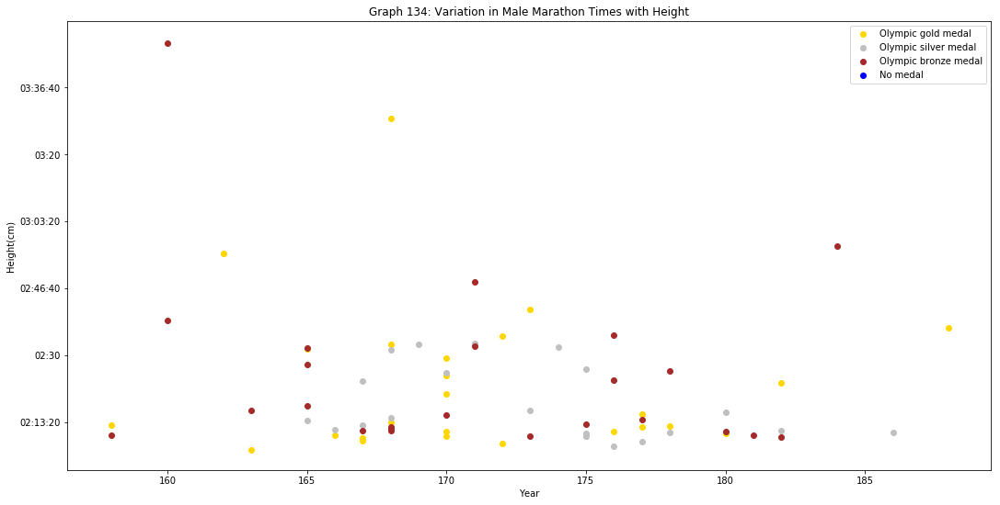

Category = Track_Flat, Event=100


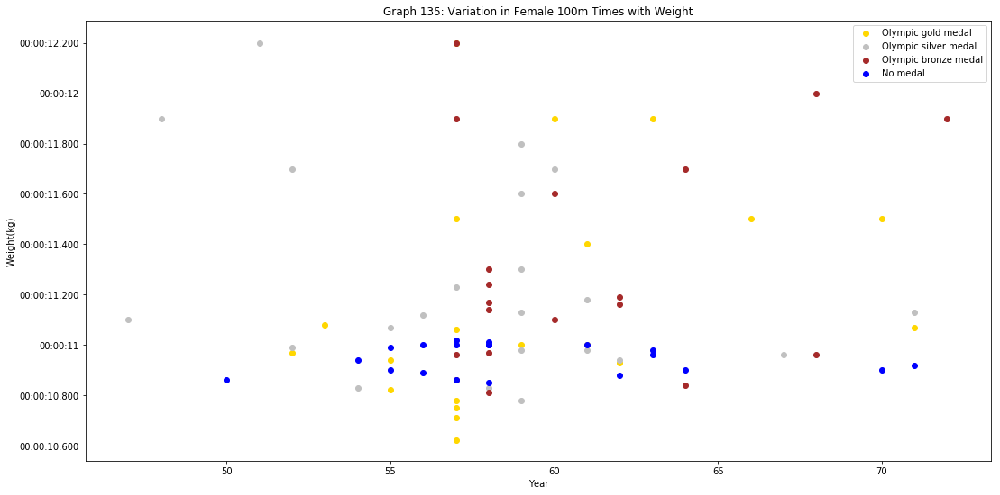

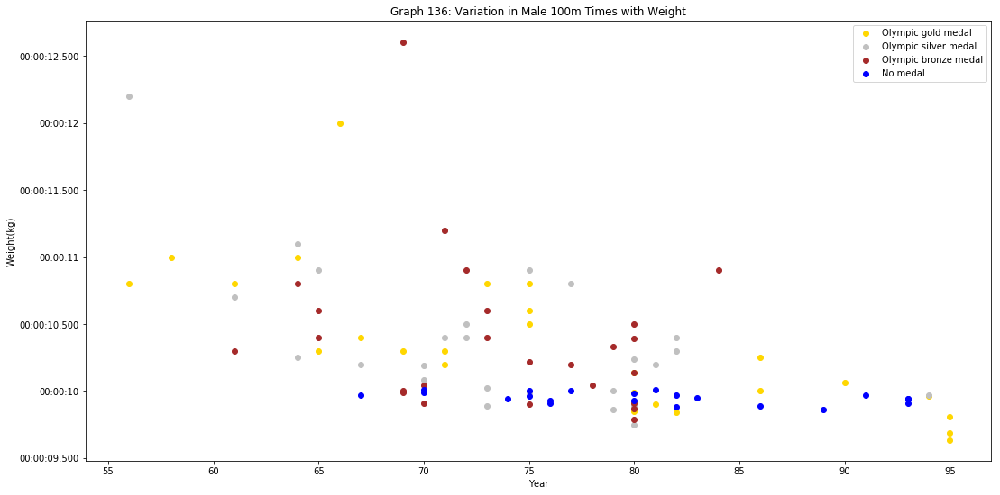

Category = Track_Flat, Event=200


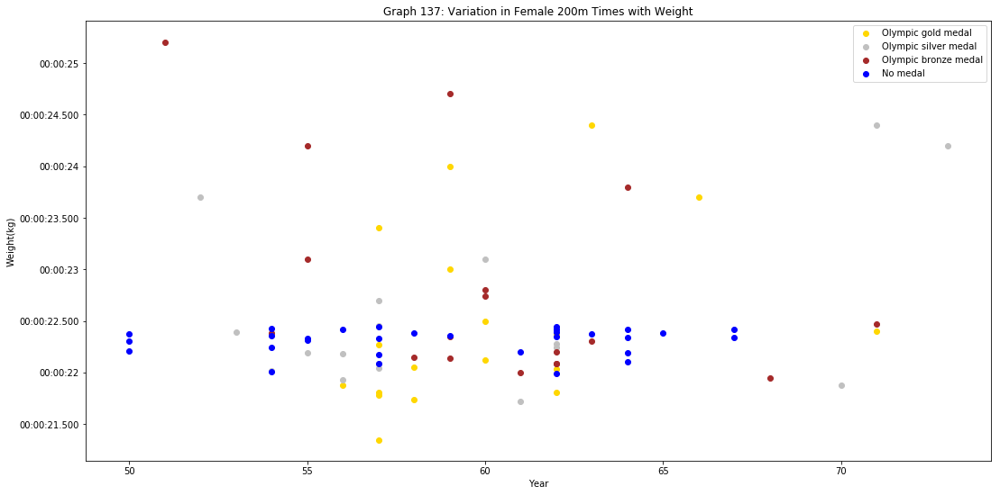

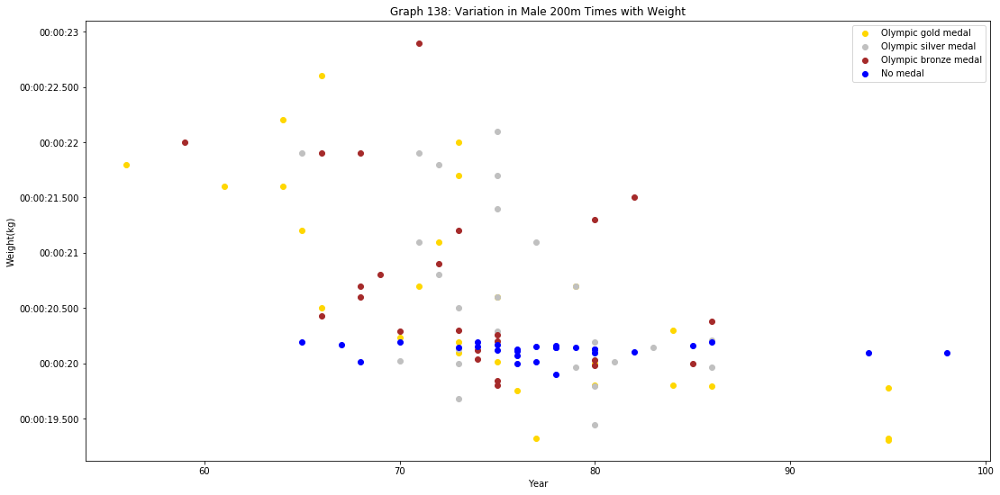

Category = Track_Flat, Event=400


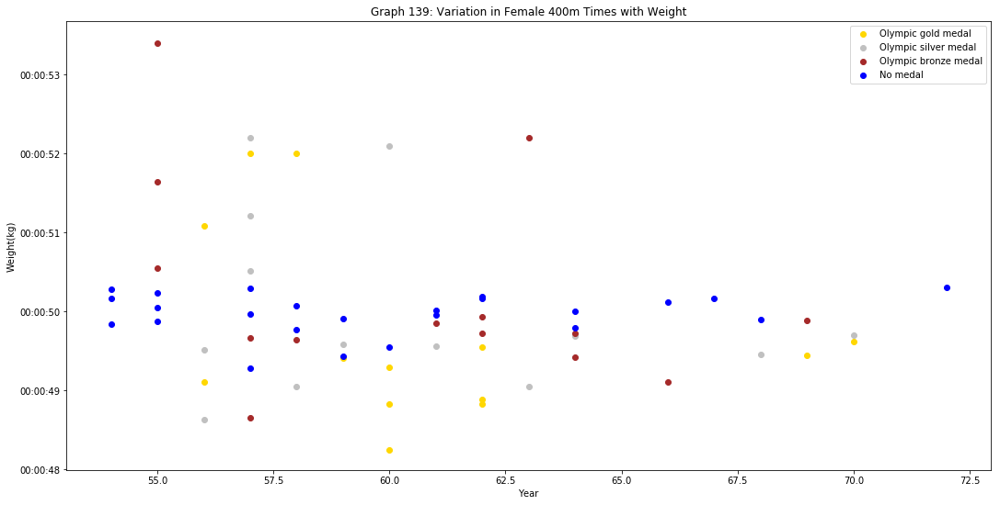

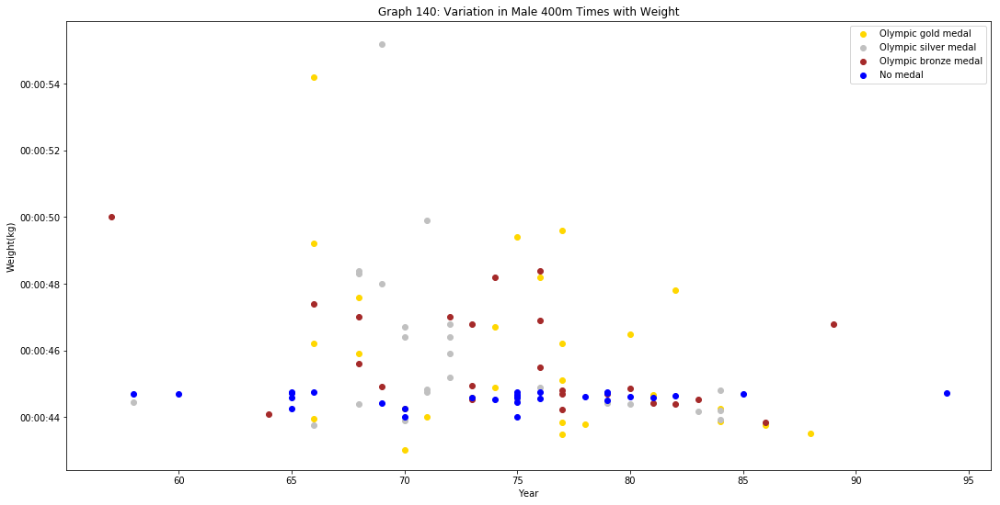

Category = Track_Flat, Event=800


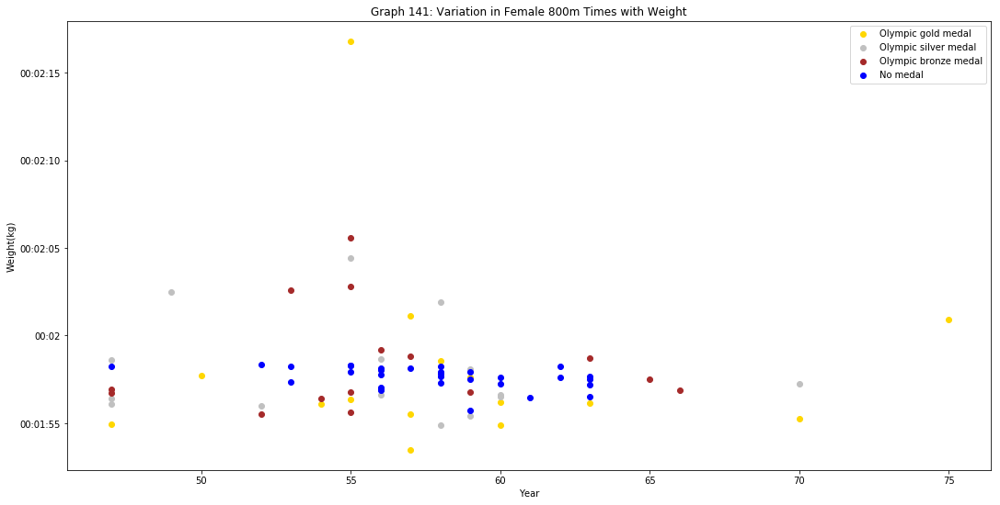

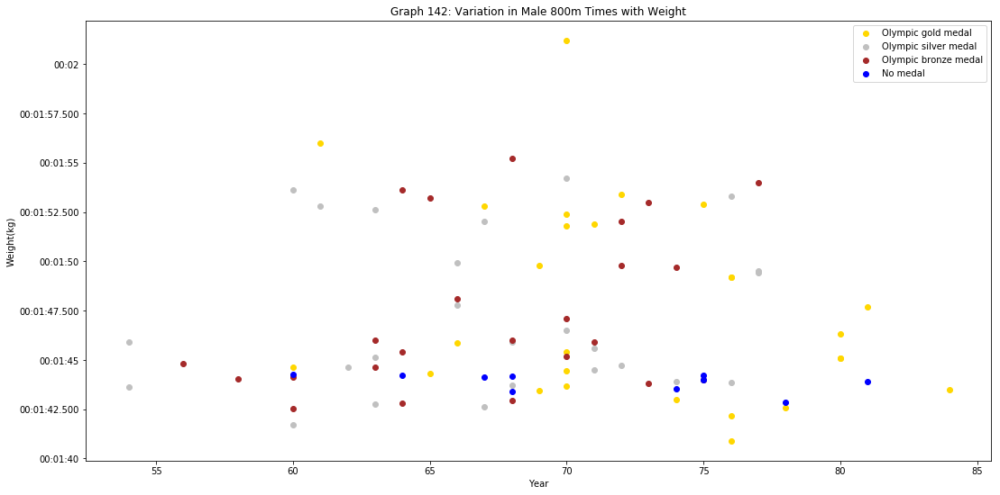

Category = Track_Flat, Event=1500


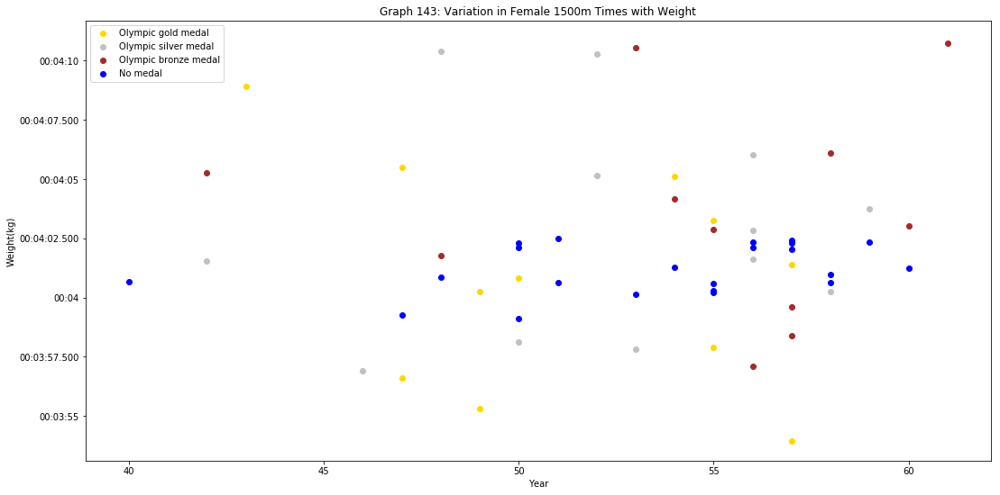

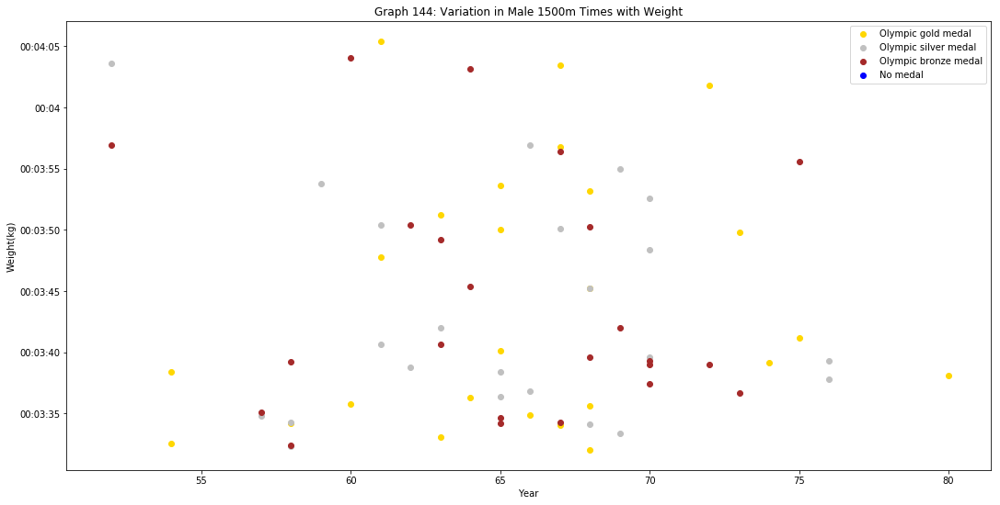

Category = Track_Flat, Event=5000


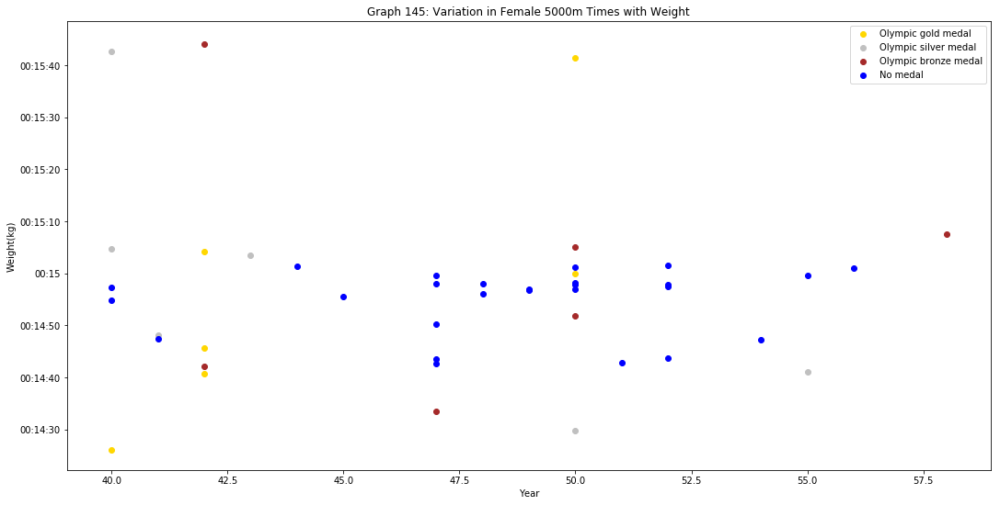

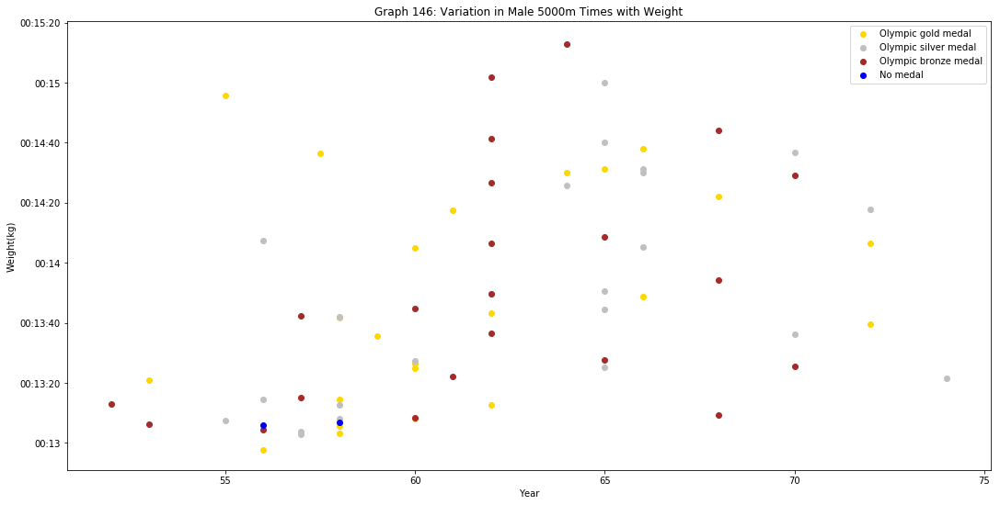

Category = Track_Flat, Event=10000


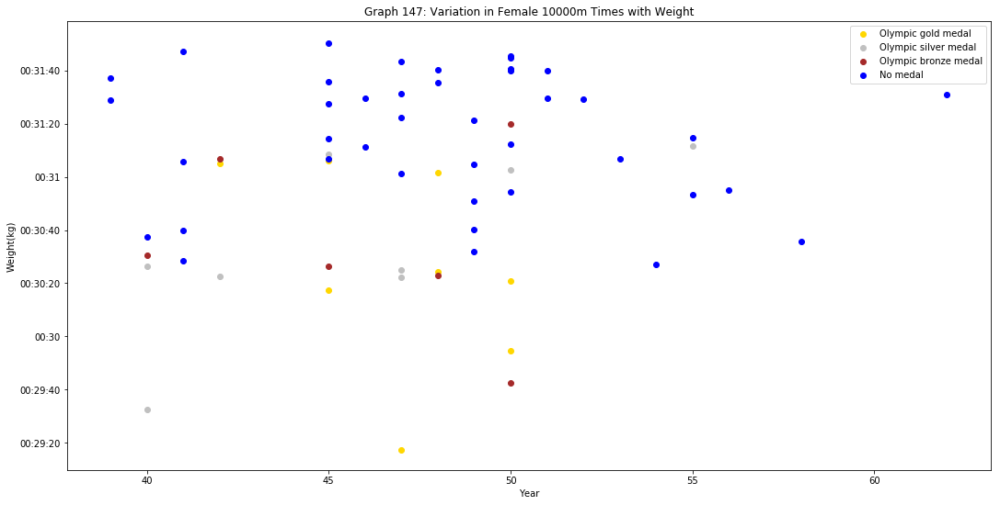

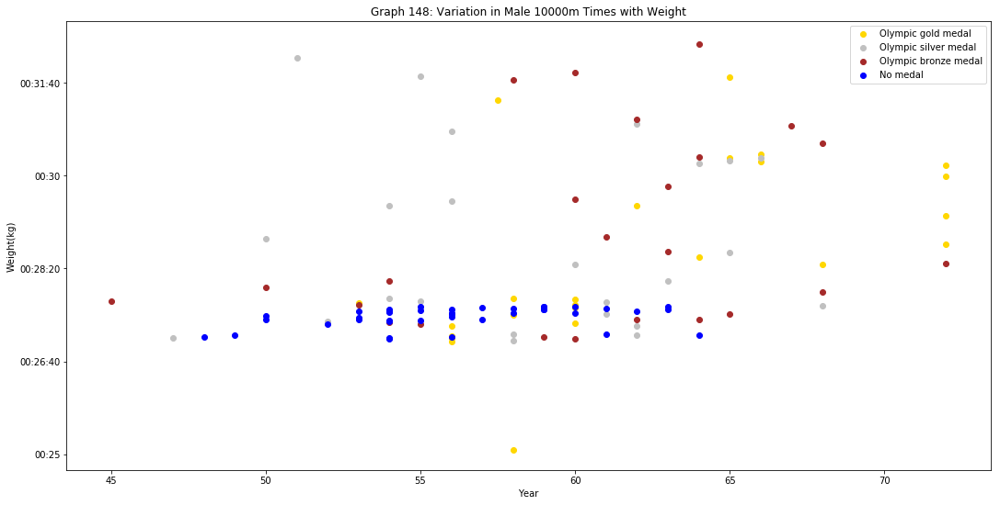

Category = Steeplechase, Event=3000


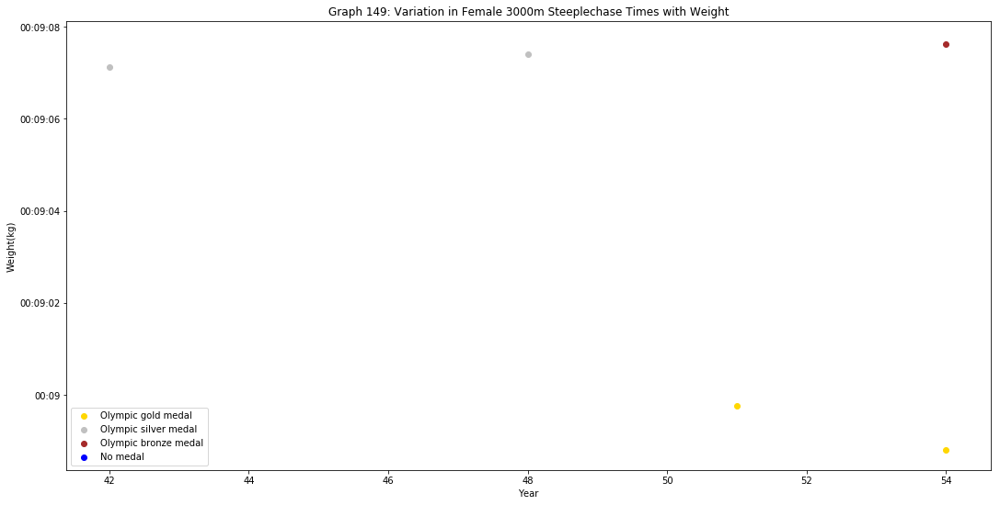

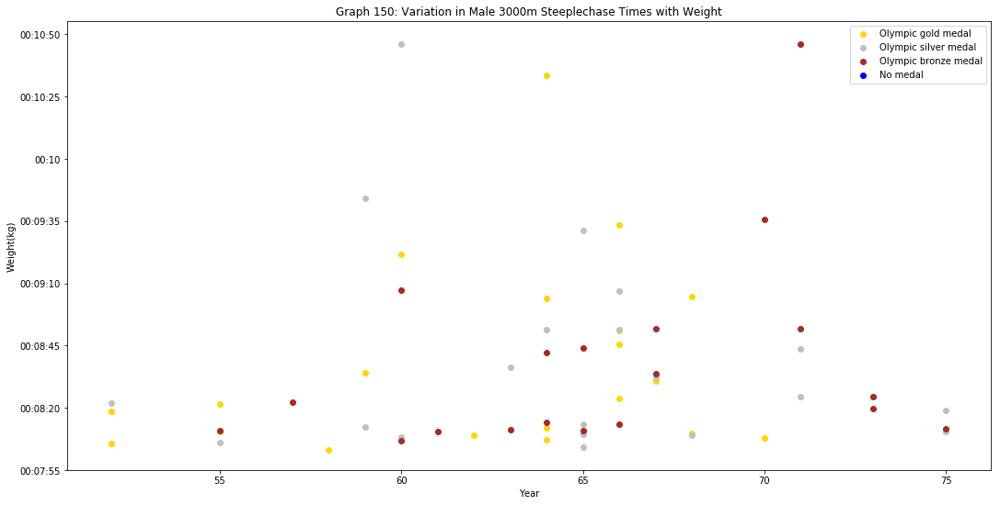

Category = Hurdles, Event=100


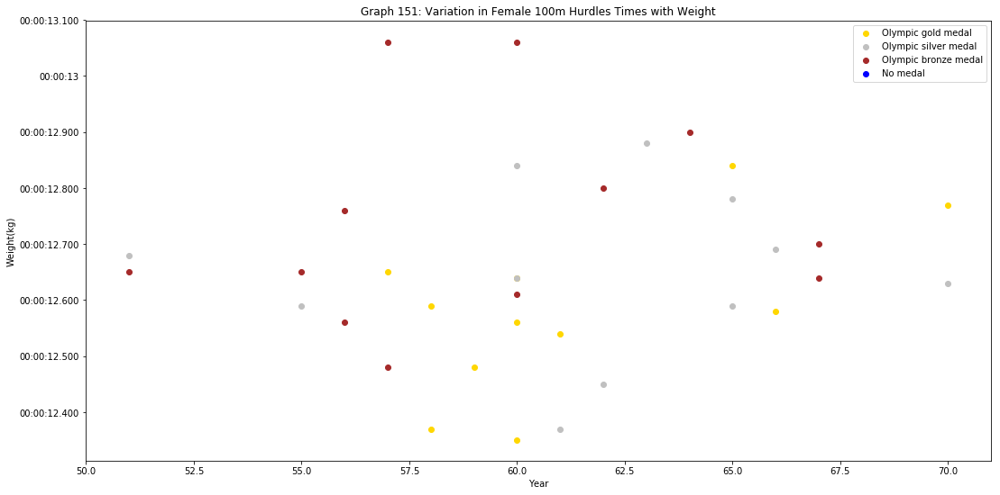

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

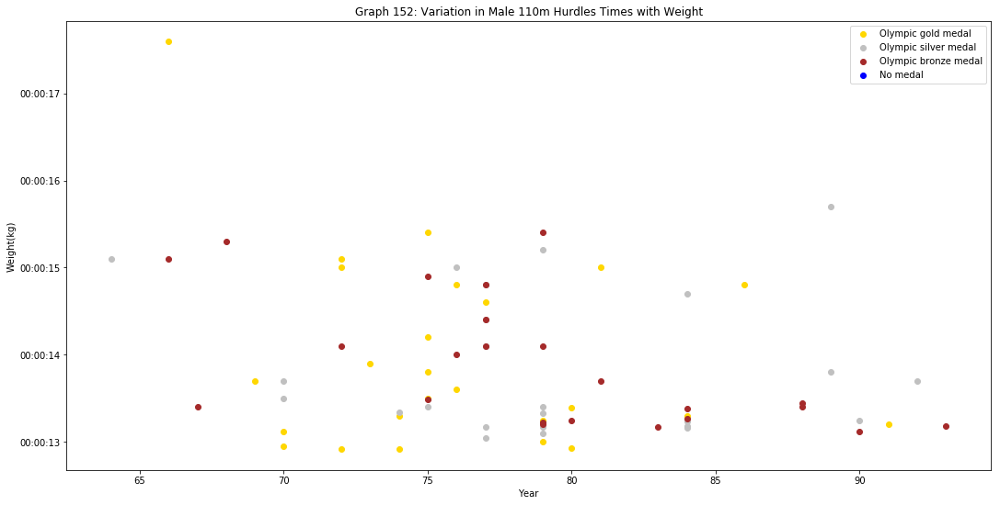

Category = Hurdles, Event=400


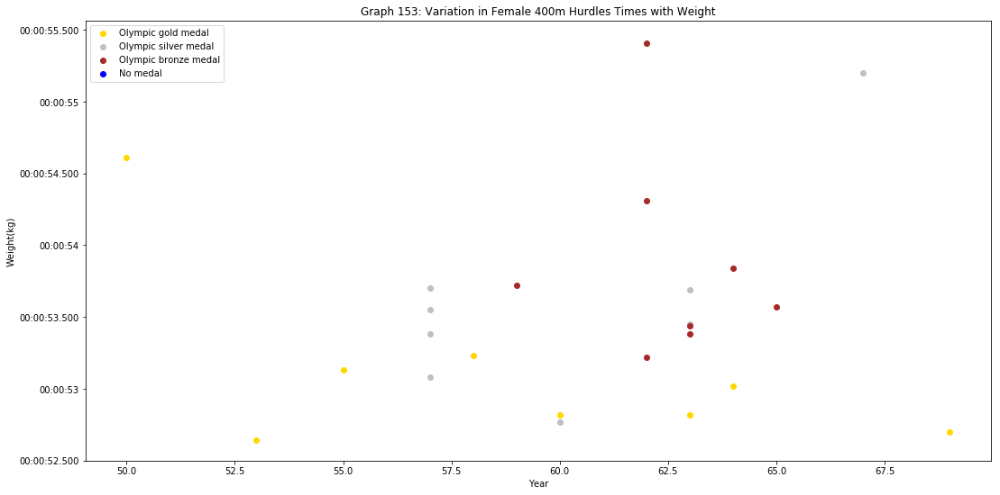

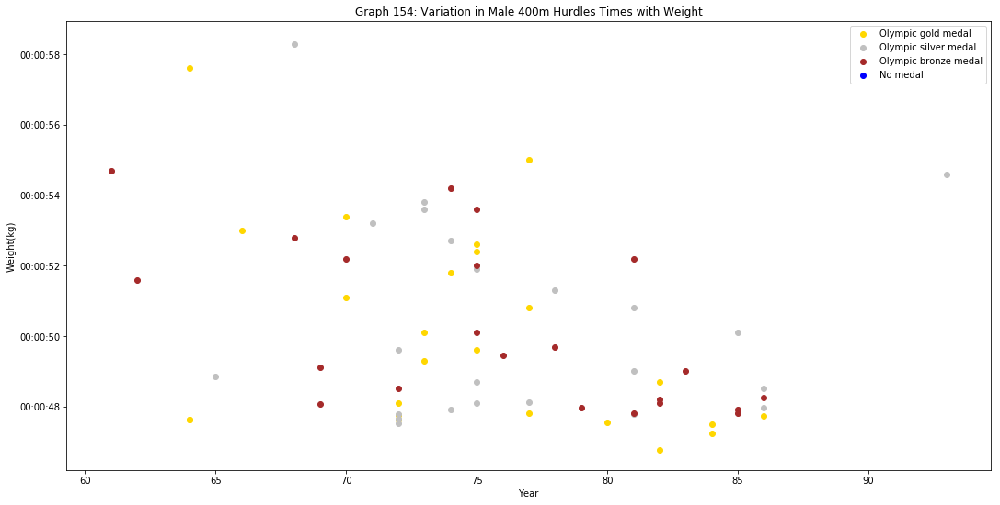

Category = Road, Event=42195


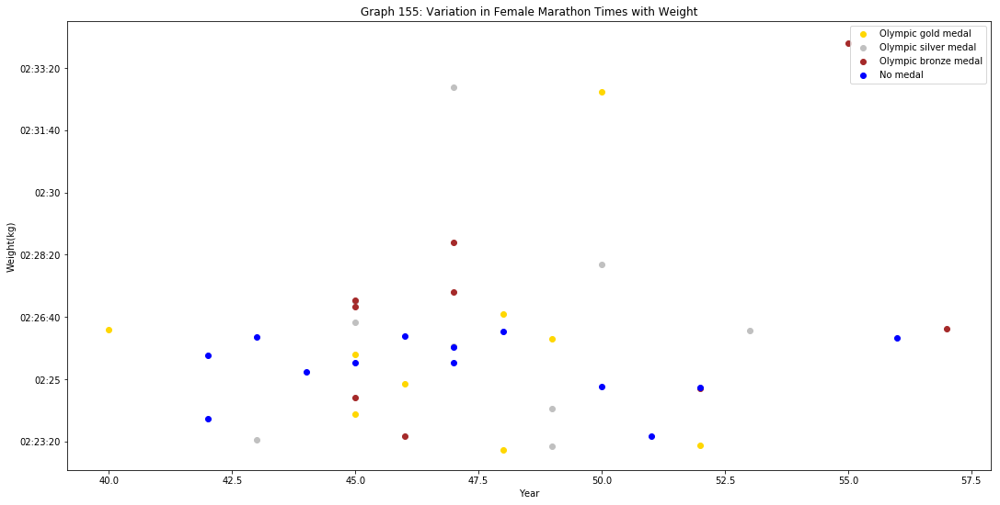

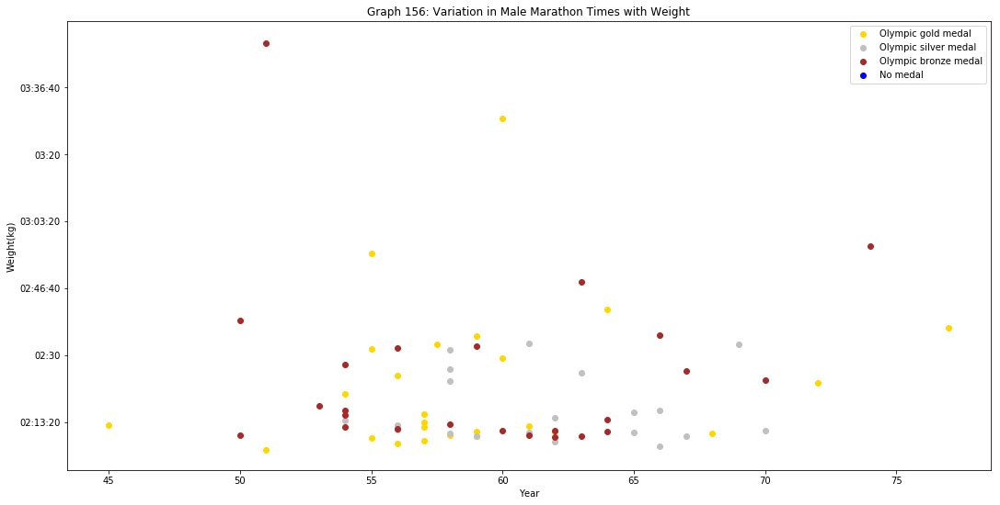

Category = Track_Flat, Event=100


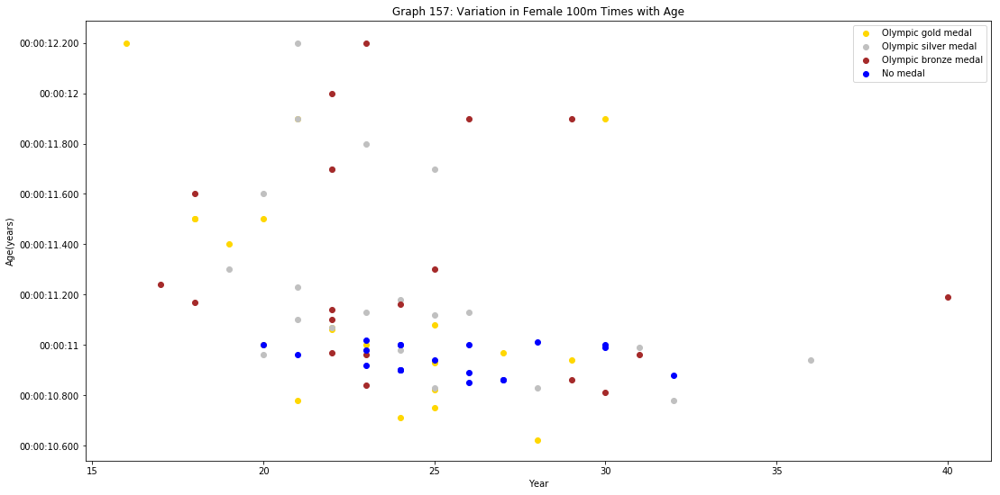

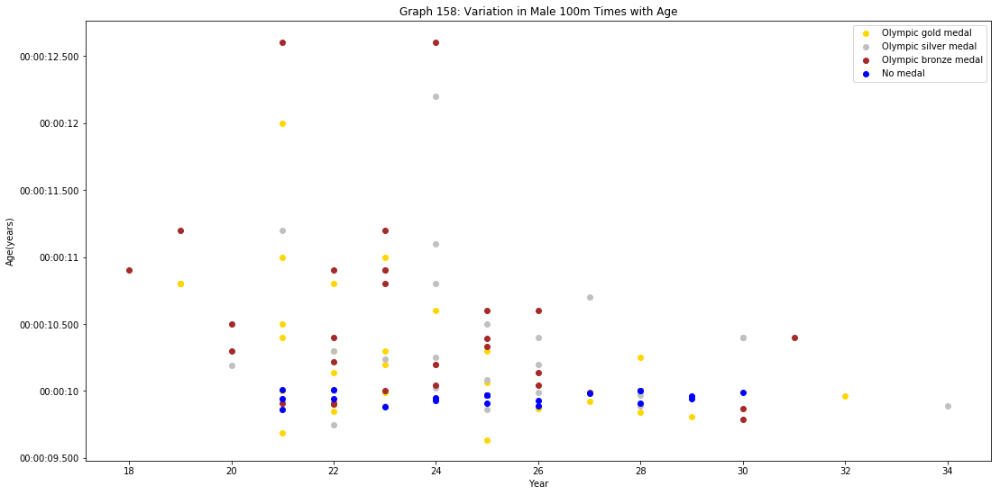

Category = Track_Flat, Event=200


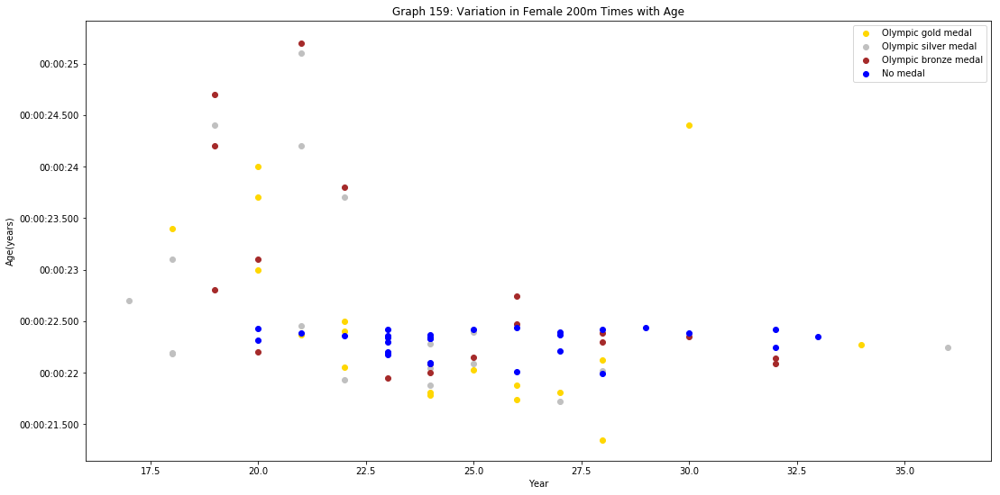

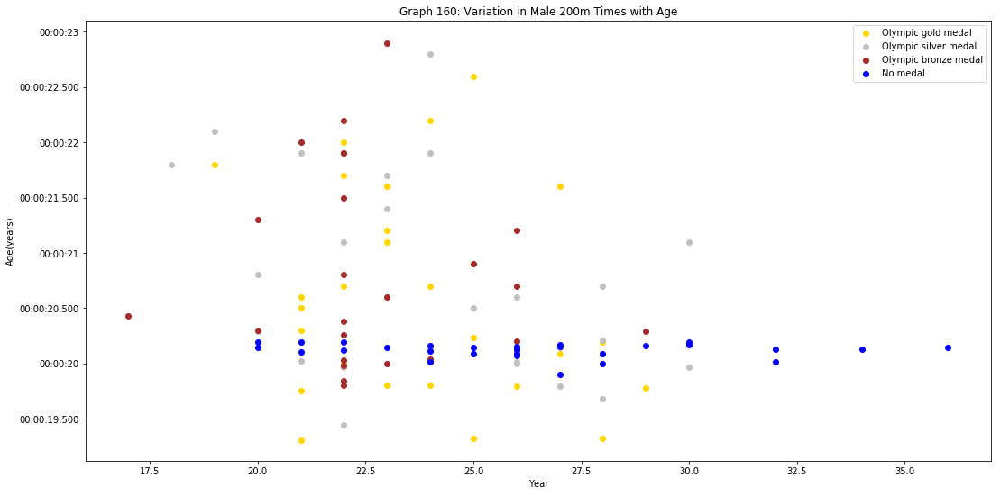

Category = Track_Flat, Event=400


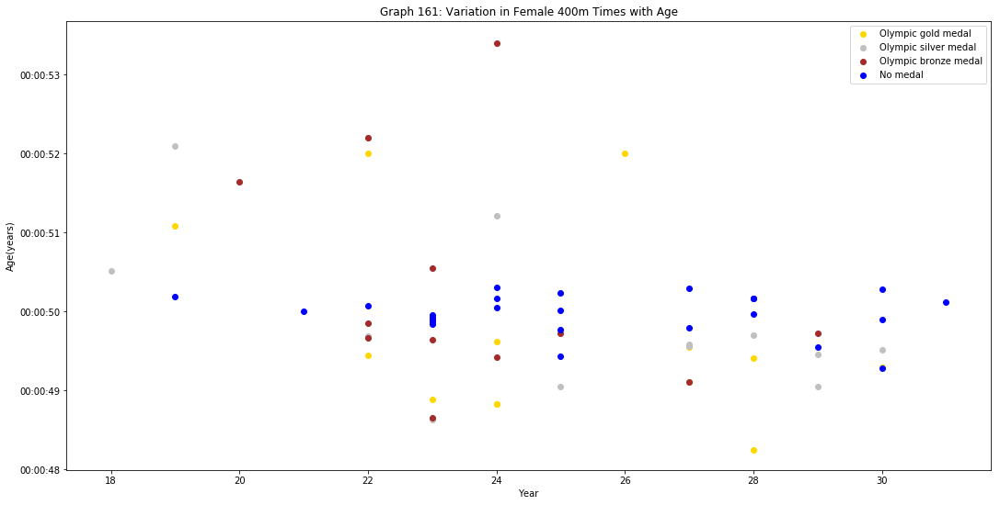

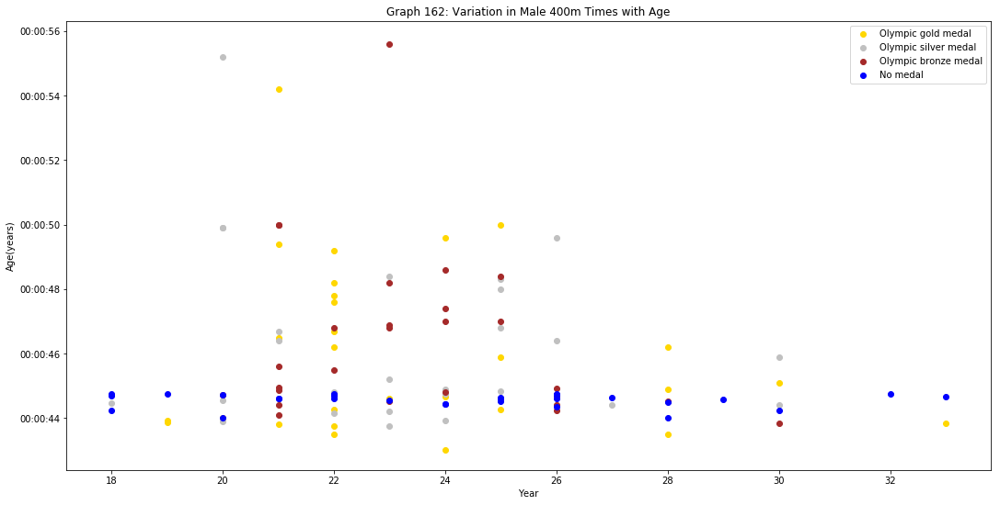

Category = Track_Flat, Event=800


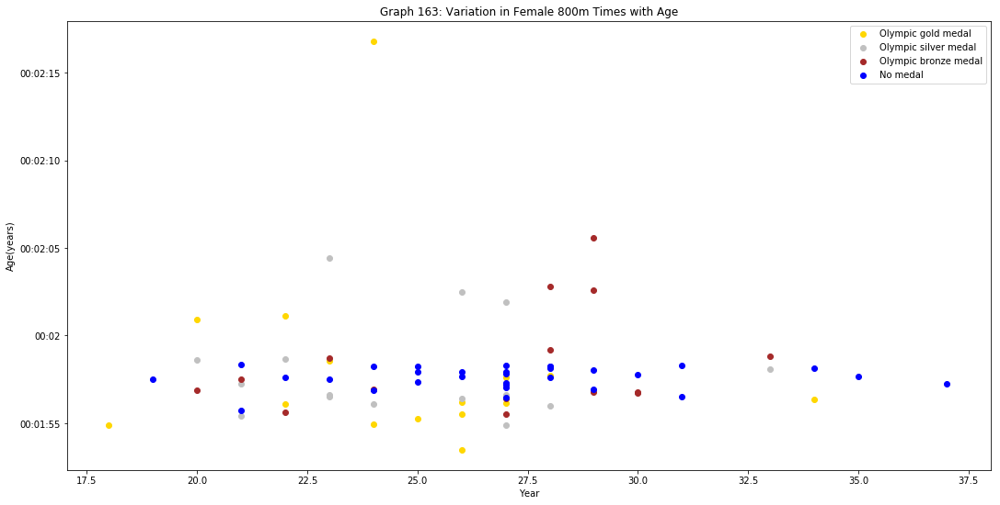

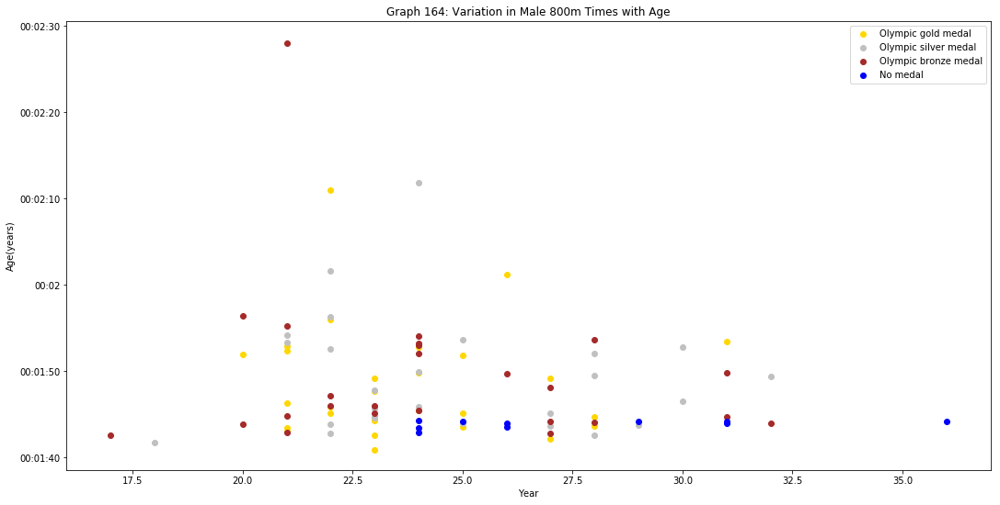

Category = Track_Flat, Event=1500


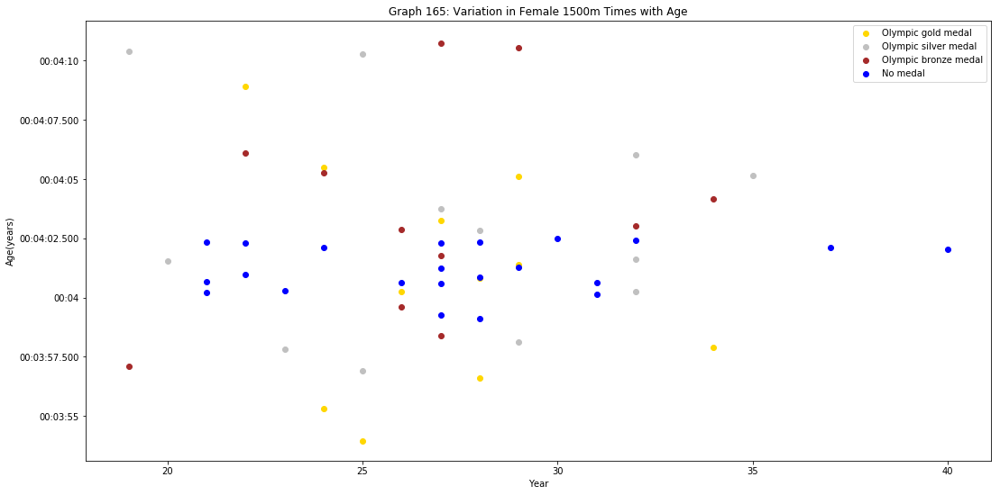

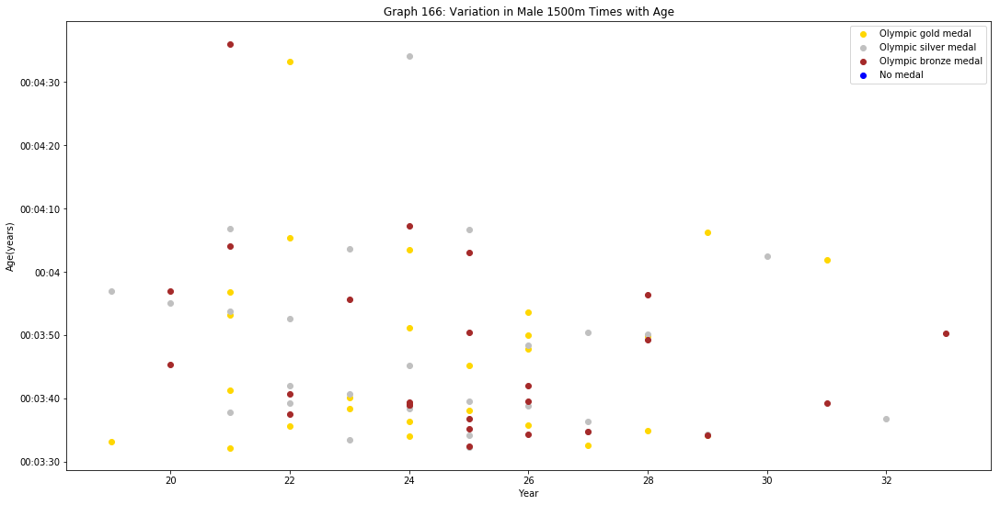

Category = Track_Flat, Event=5000


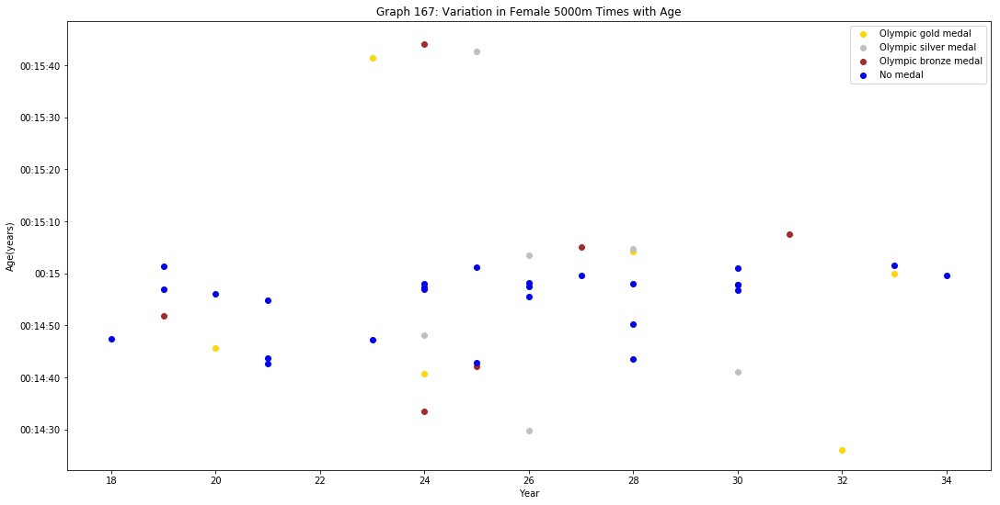

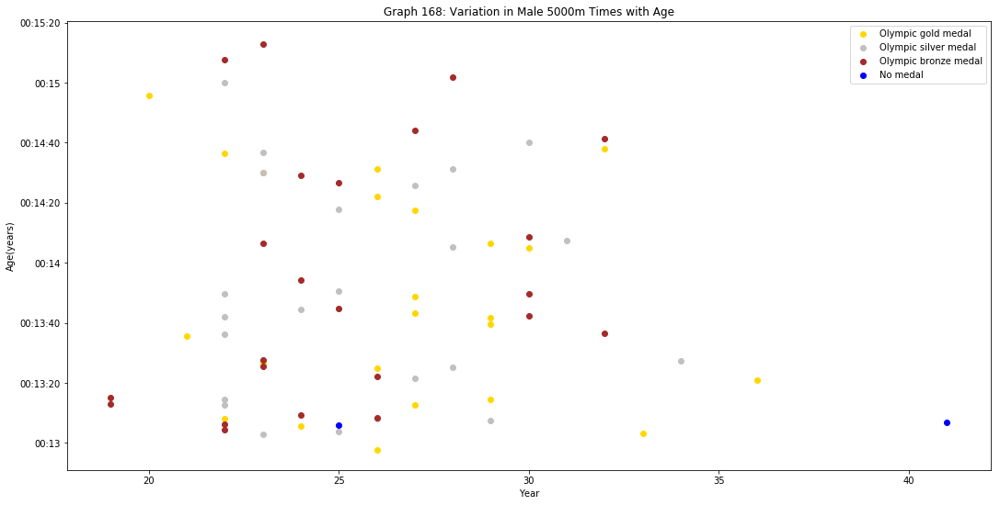

Category = Track_Flat, Event=10000


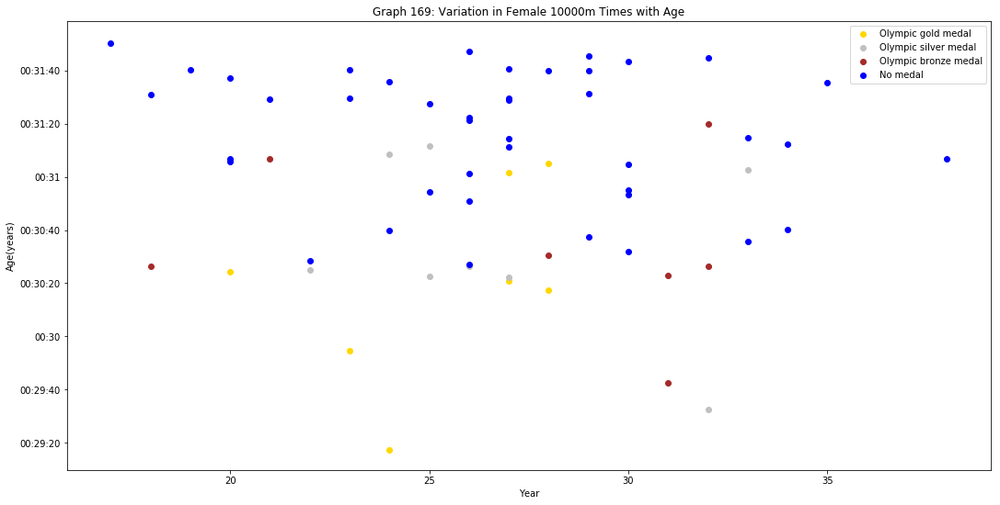

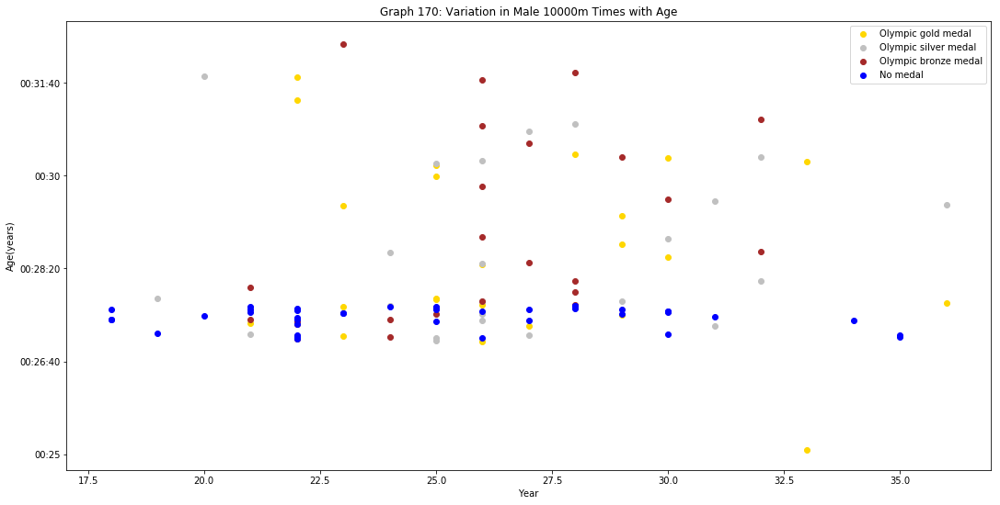

Category = Steeplechase, Event=3000


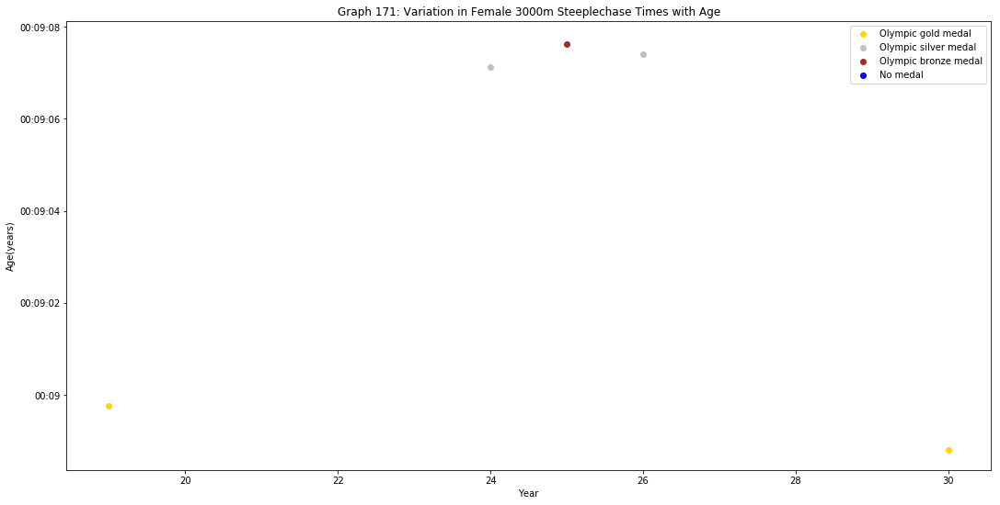

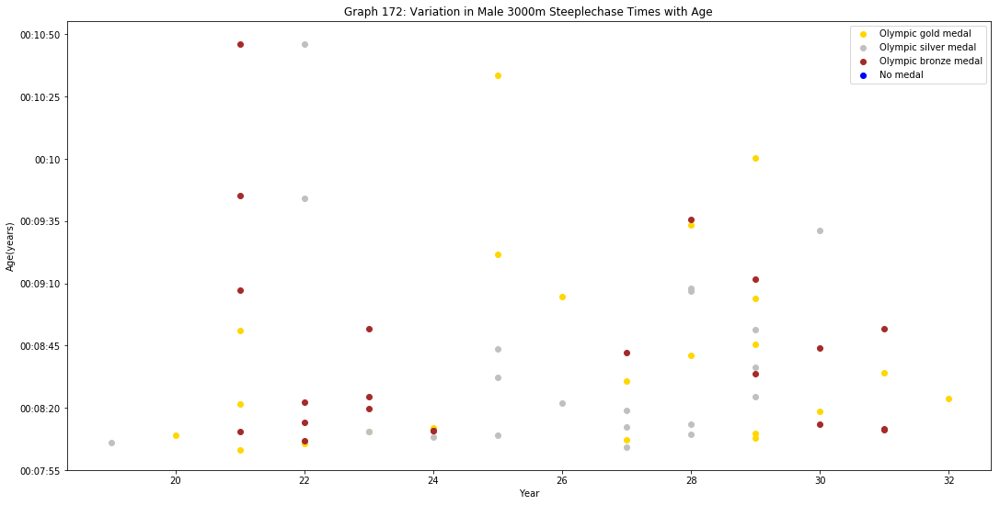

Category = Hurdles, Event=100


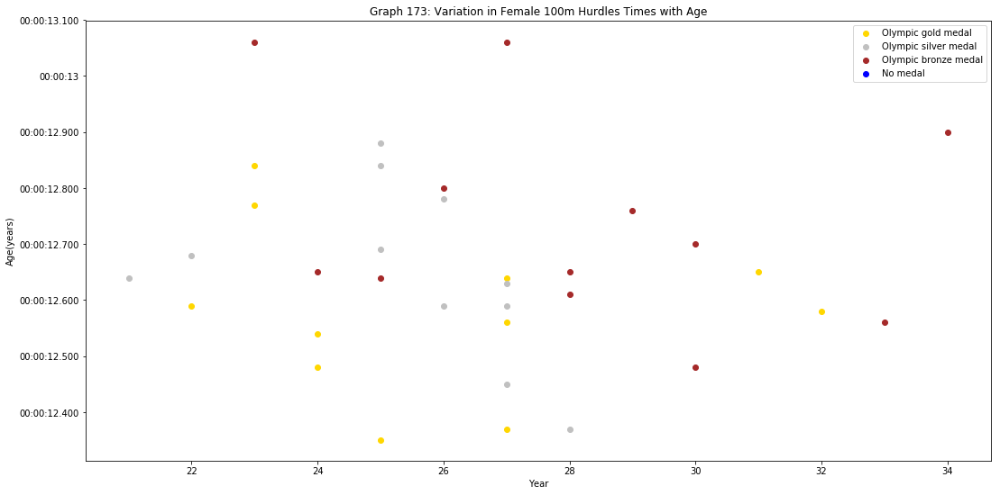

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

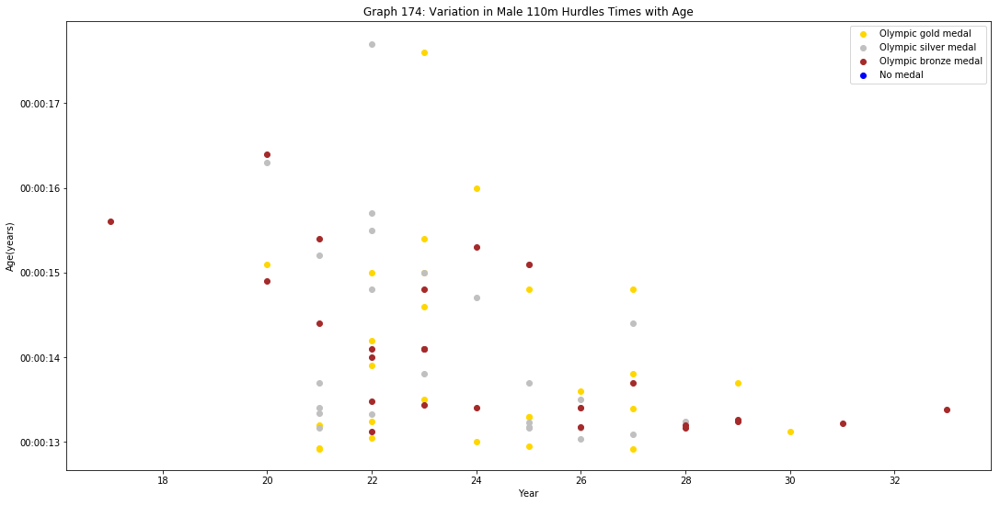

Category = Hurdles, Event=400


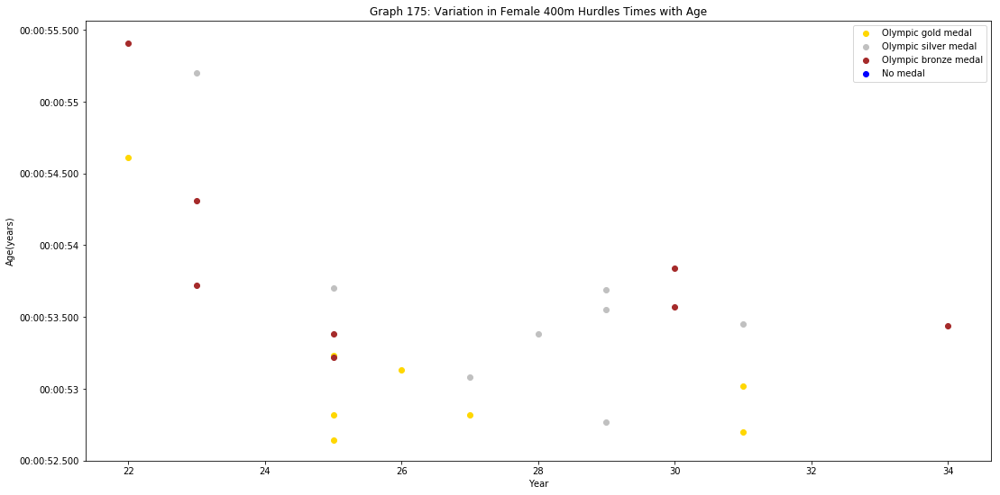

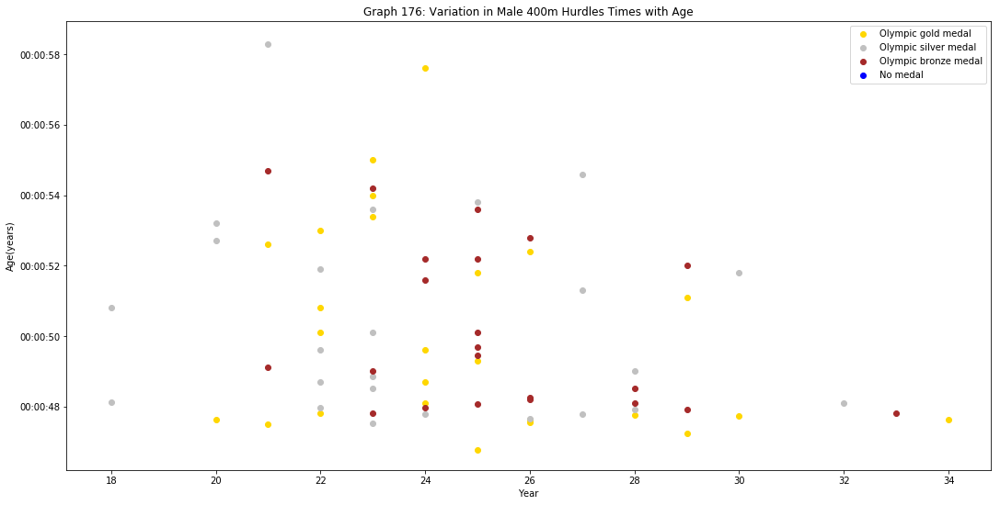

Category = Road, Event=42195


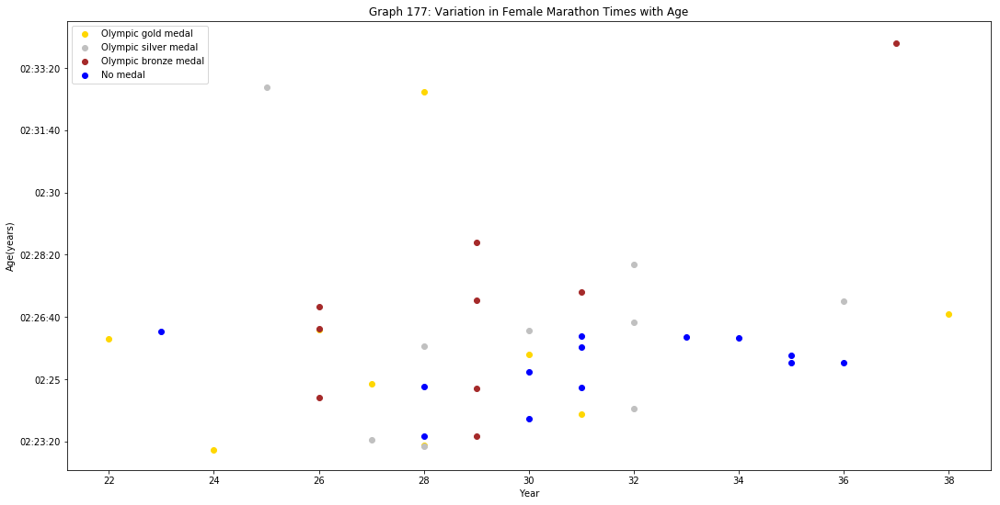

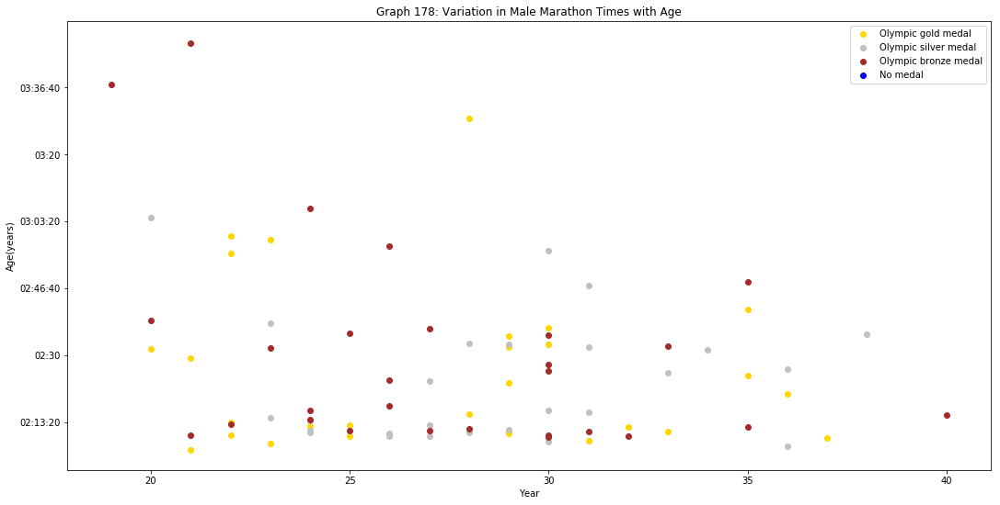

Category = Track_Flat, Event=100


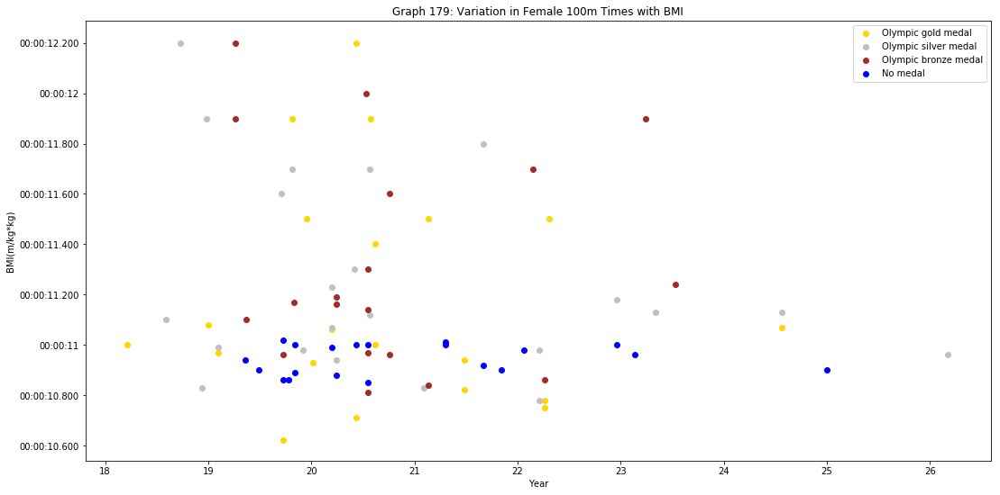

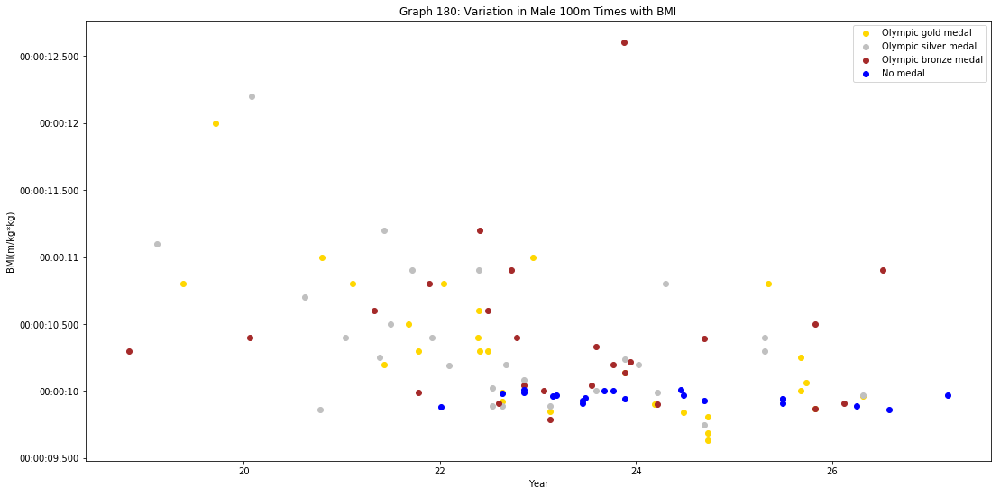

Category = Track_Flat, Event=200


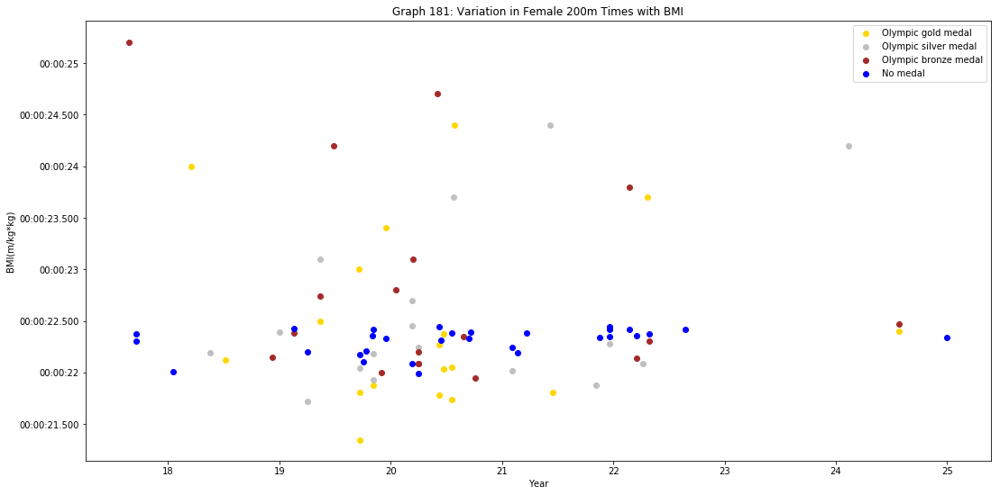

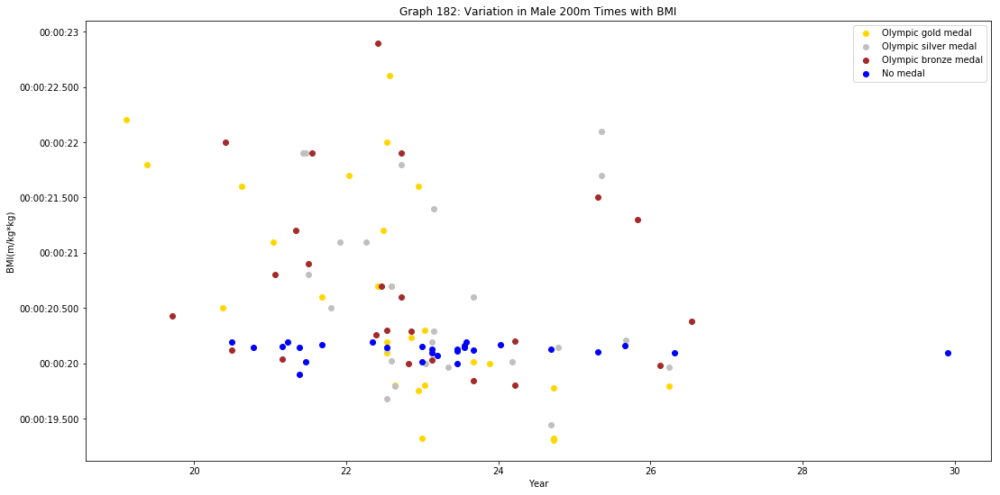

Category = Track_Flat, Event=400


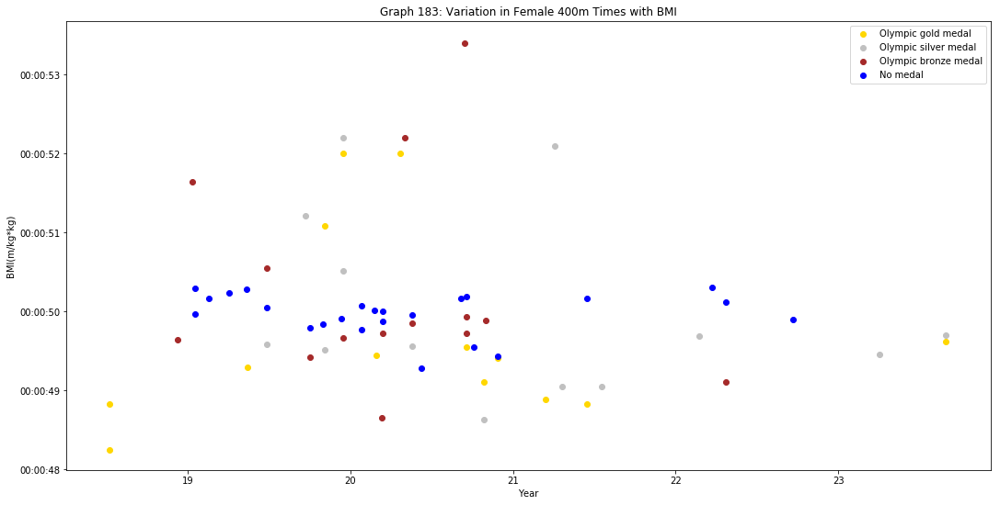

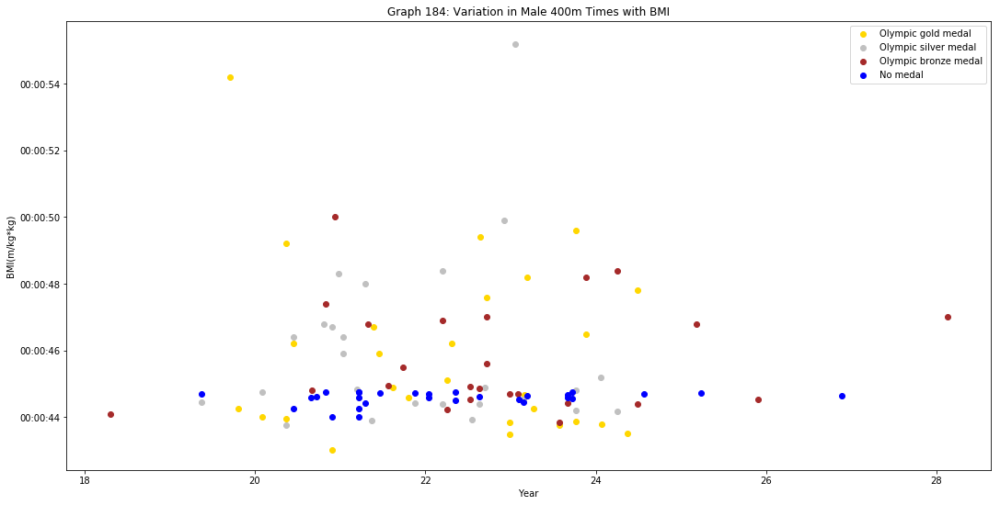

Category = Track_Flat, Event=800


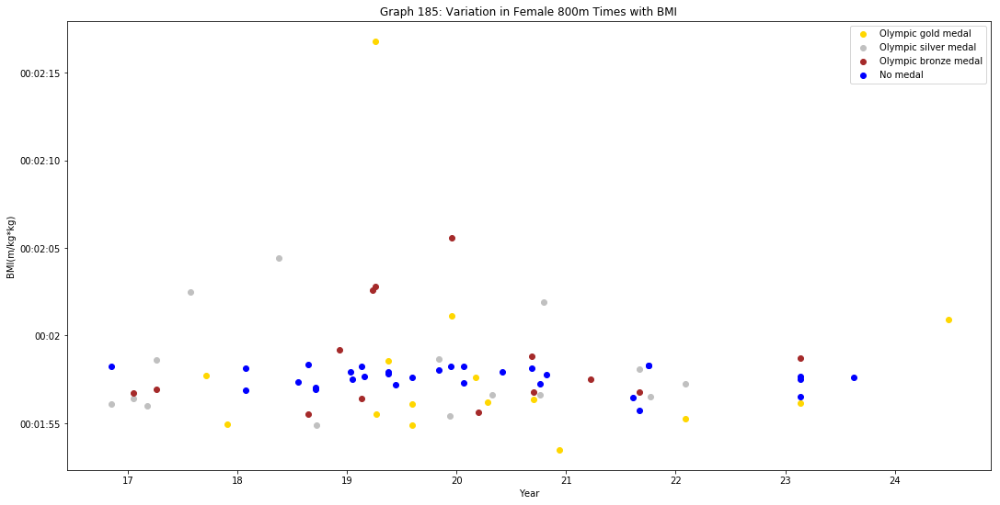

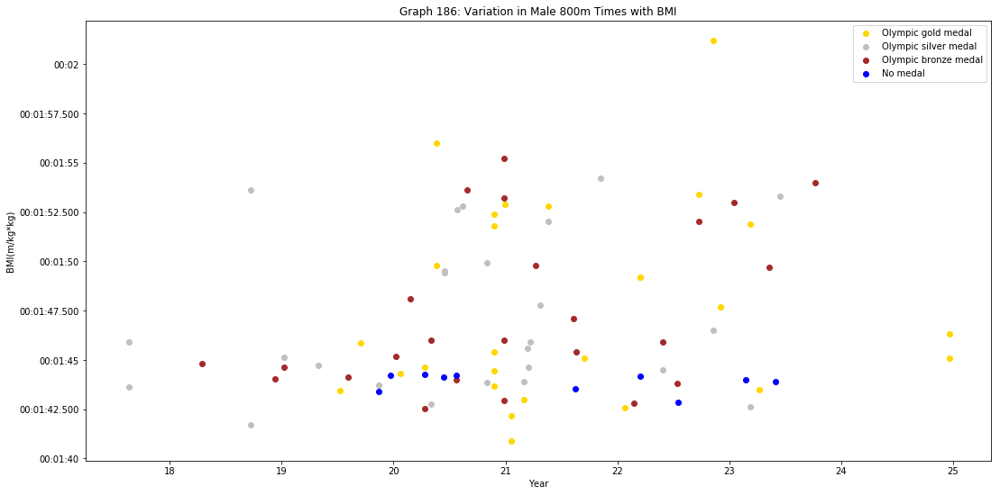

Category = Track_Flat, Event=1500


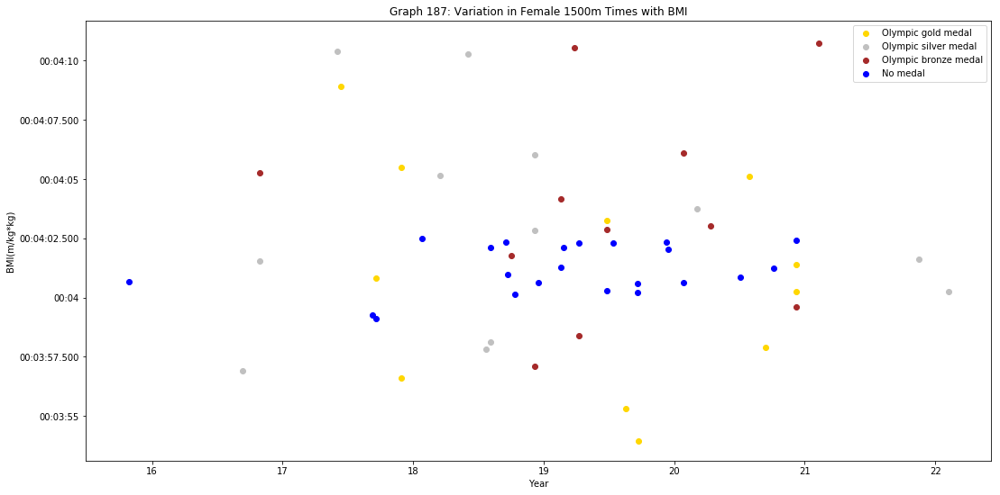

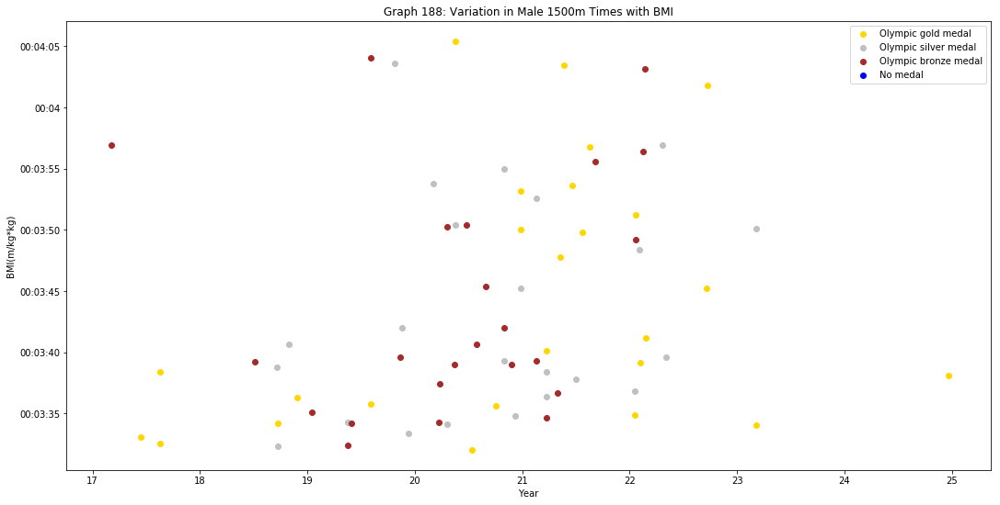

Category = Track_Flat, Event=5000


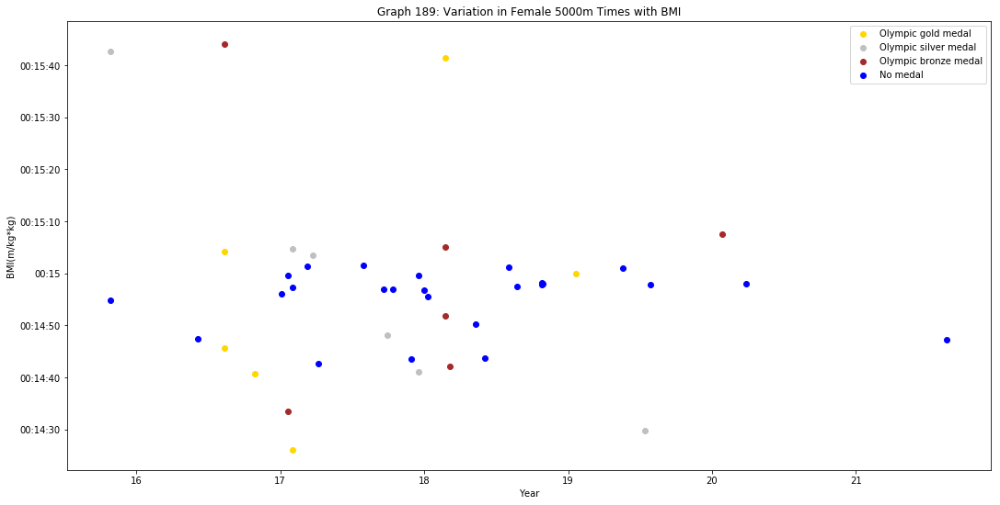

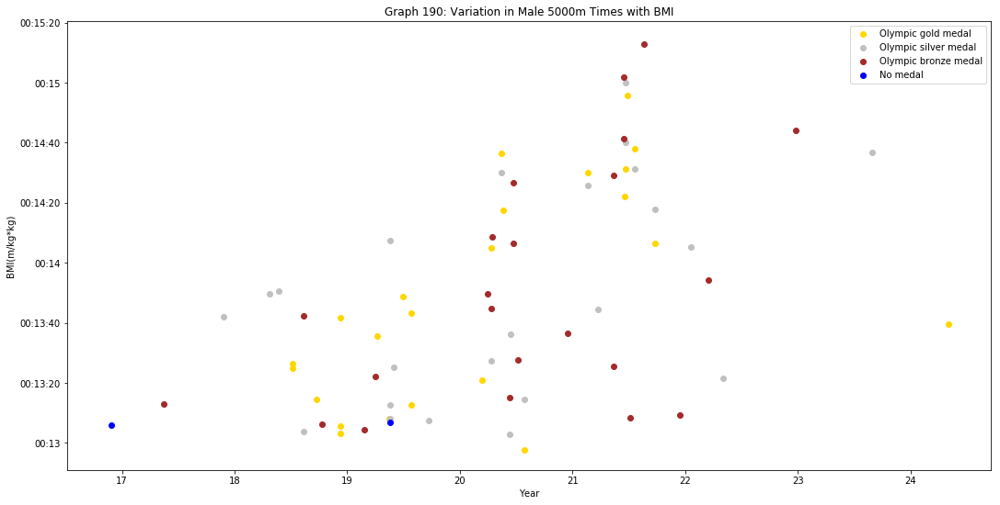

Category = Track_Flat, Event=10000


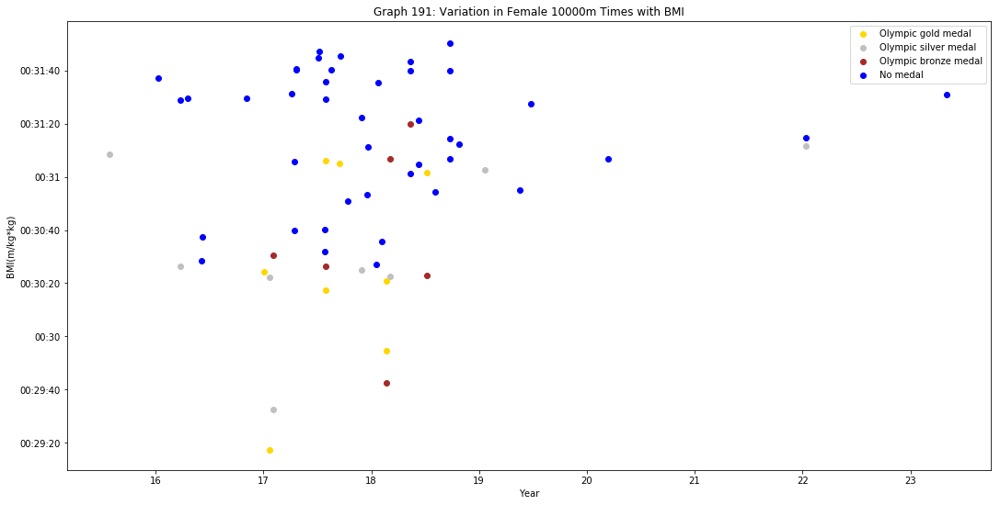

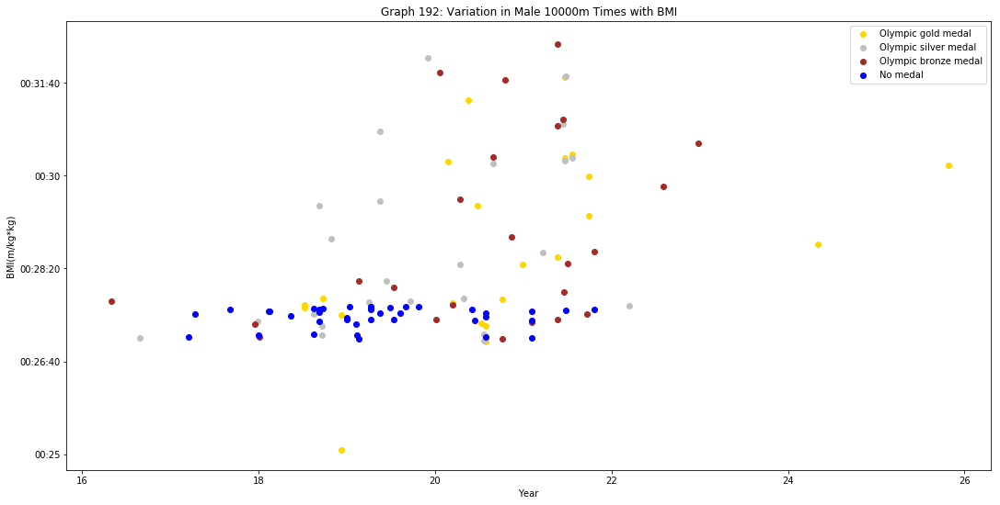

Category = Steeplechase, Event=3000


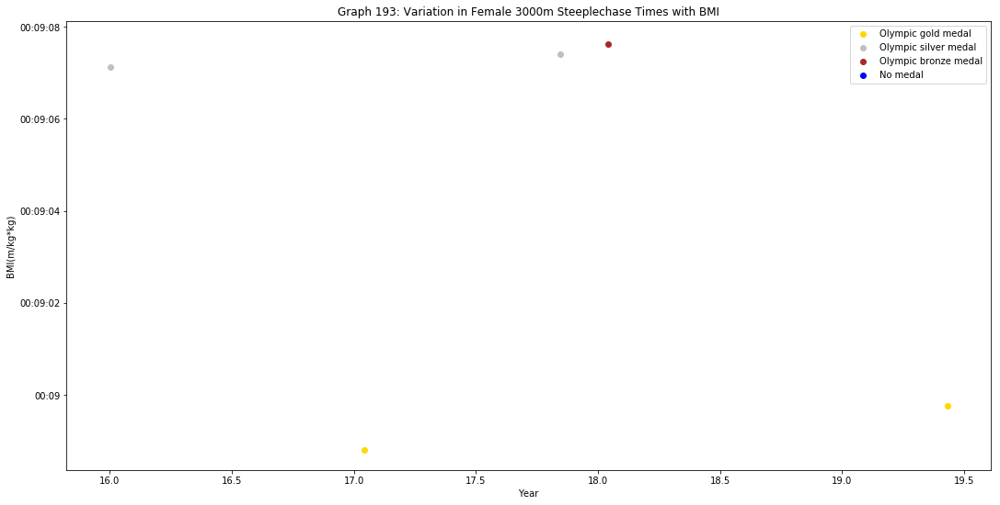

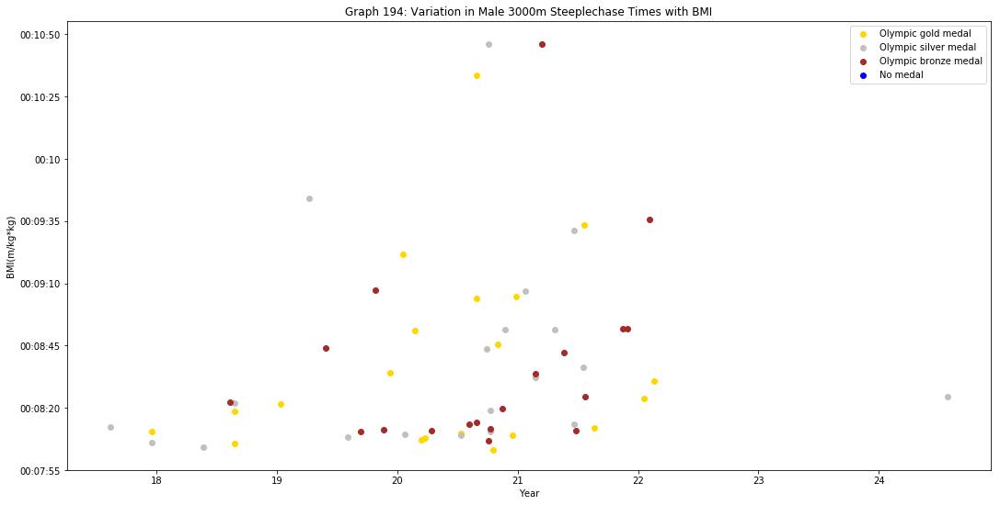

Category = Hurdles, Event=100


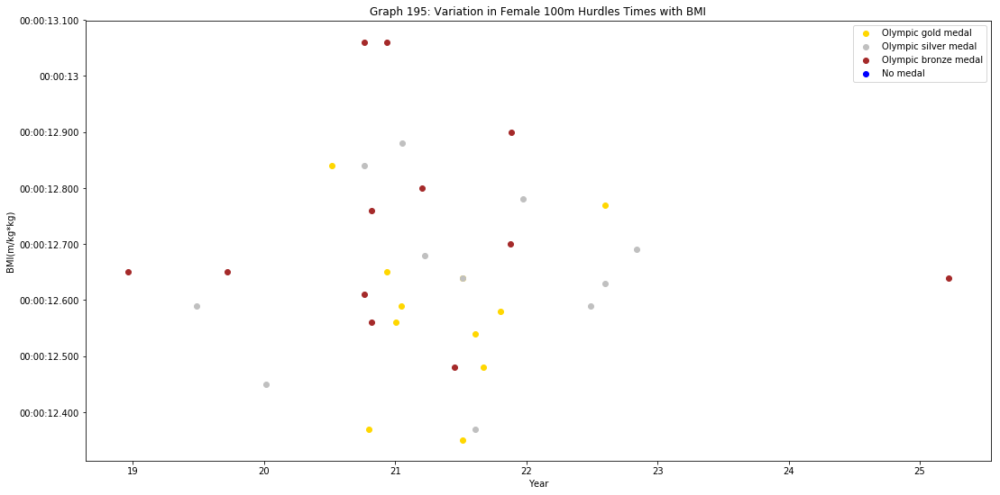

No data from Olympic data set for this event.
Category = Hurdles, Event=110
No data from Olympic data set for this event.


<Figure size 1296x648 with 0 Axes>

<Figure size 1296x648 with 0 Axes>

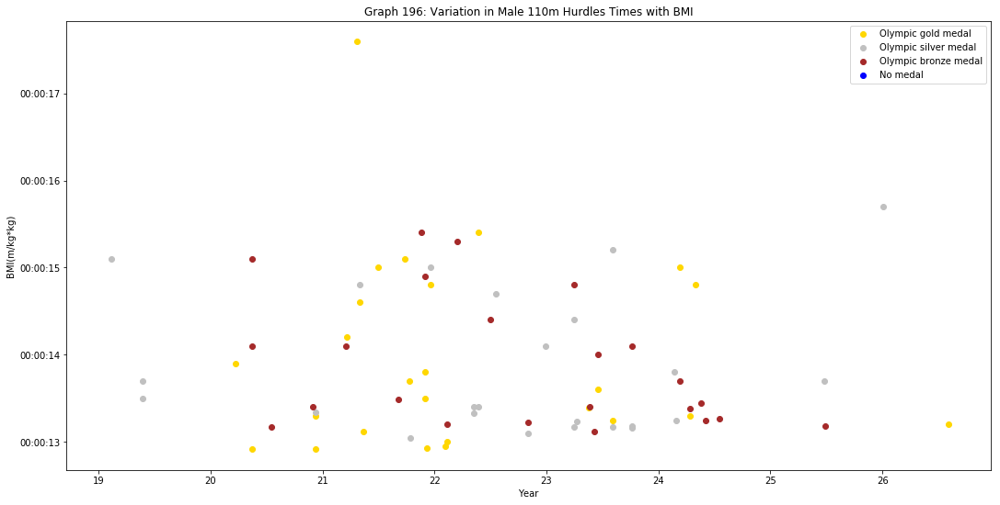

Category = Hurdles, Event=400


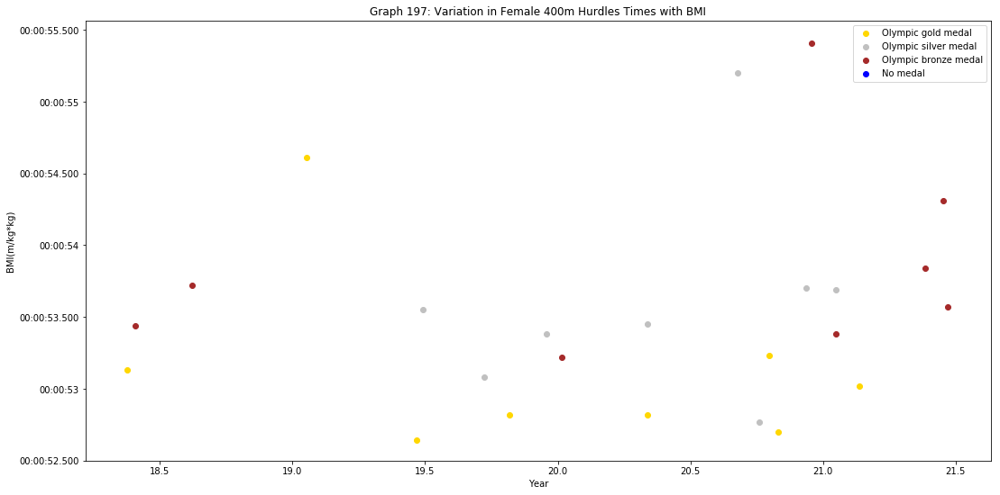

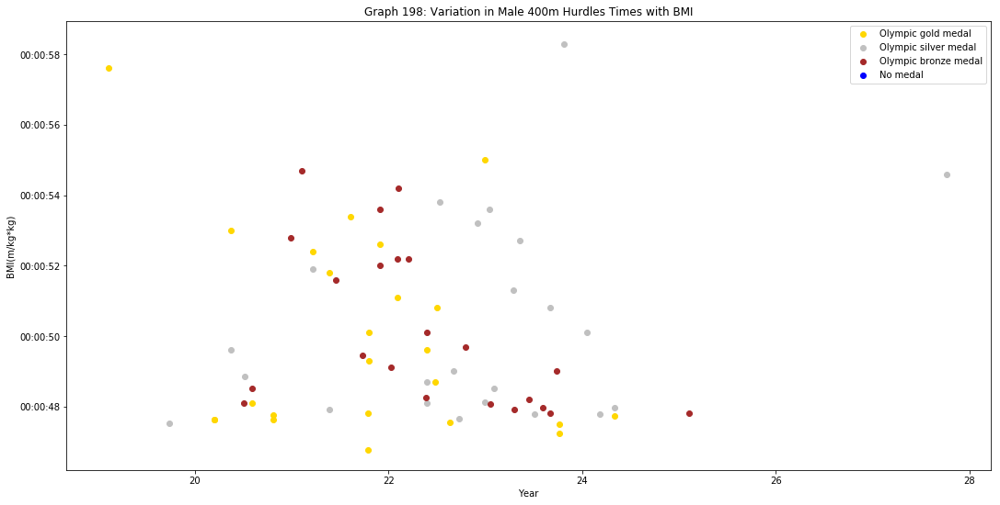

Category = Road, Event=42195


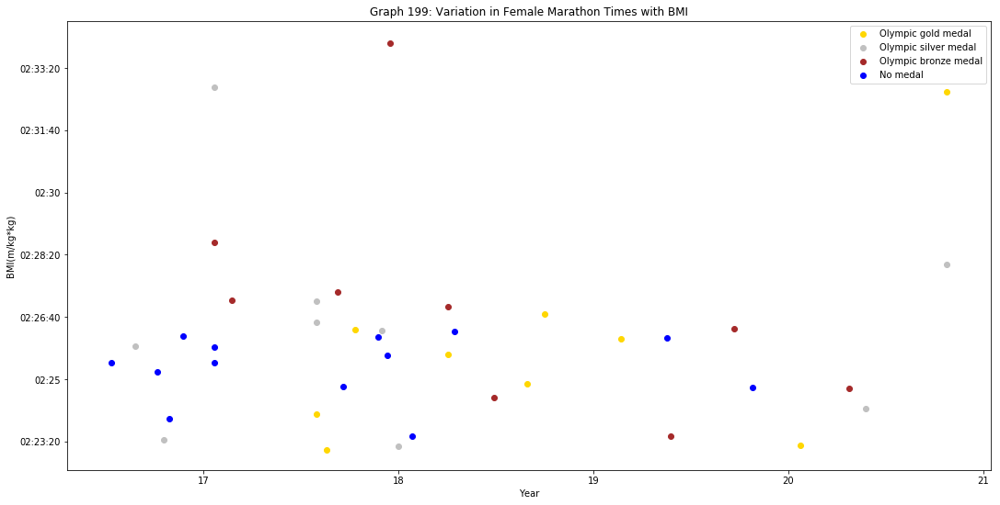

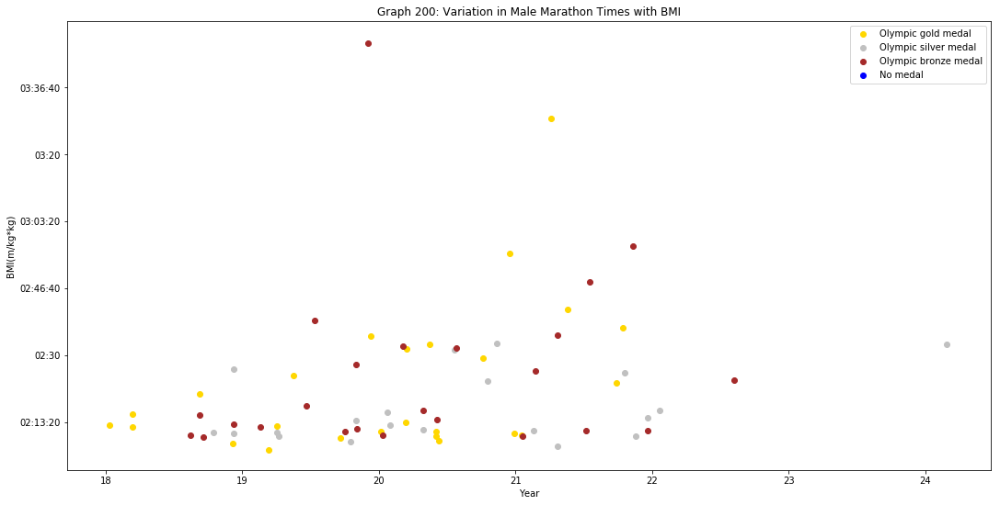

In [130]:
# Plot graphs for all events
event_categories = ['Track_Flat', 'Steeplechase', 'Hurdles', 'Road']

plot_characteristics(event_categories, characteristics)

How have athletes' characteristics changed over time?

In [131]:
def plot_athlete_data(event_categories, characteristics):
    meanvals = []
    years = []
    global graph_number
    for c in characteristics:
        for category in event_categories:
            print(category)
            ol_running_groups = ol_running.groupby([category, 'Gender'])
            events = ol_running[category].unique().tolist()
            events.remove(0)
            for event in events:
                print(event)
                for gender in ol_running['Gender'].unique().tolist():
                    print(gender)
                    try:
                        ol_running_group = ol_running_groups.get_group((event, gender))
                    except KeyError:
                        print("No results for this combination in ol_running_groups")
                        continue
                    for year in ol_running_group['Year'].unique().tolist():
                        meanvals.append(ol_running_group[ol_running_group['Year'] == year][c].mean())
                        years.append(year)
                    plt.figure(figsize=(18, 9))
                    plt.scatter(years, meanvals, color='blue')
                    plt.xlabel('Year')
                    plt.ylabel(c)
                    # Construct the graph title and axis labels
                    gender_label, event_label, category_label, unit = build_graph_labels(gender, category, event, c)
                    plt.xlabel('Year')
                    plt.ylabel(c+'({})'.format(unit))
                    plt.title("Graph {0}: Variation in {1} of {2} {3} Olympic Athletes Through History".format(
                        graph_number, c, gender_label, event_label, c))
                    plt.show()
                    graph_number+=1
                    meanvals = []
                    years = []

In [132]:
def plot_athlete_data_grouped(event_categories, characteristics):
    meanvals = []
    years = []
    global graph_number
    for c in characteristics:
        for category in event_categories:
            print(category)
            ol_running_groups = ol_running.groupby([category, 'Gender'])
            events = ol_running[category].unique().tolist()
            events.remove(0)
            for gender in ol_running['Gender'].unique().tolist():
                plt.figure(figsize=(18, 9))
                print(gender)
                for event in events:
                    print(event)
                    try:
                        ol_running_group = ol_running_groups.get_group((event, gender))
                    except KeyError:
                        print("No results for this combination in ol_running_groups")
                        continue
                    for year in ol_running_group['Year'].unique().tolist():
                        meanvals.append(ol_running_group[ol_running_group['Year'] == year][c].mean())
                        years.append(year)
                    #plt.figure(figsize=(18, 9))
                    plt.scatter(years, meanvals, label=str(event)+'m')
                    meanvals = []
                    years = []
                #Construct the graph title and axis labels
                gender_label, event_label, category_label, unit = build_graph_labels(gender, category, event, c)
                plt.xlabel('Year')
                plt.ylabel(c+'({})'.format(unit))
                plt.title("Graph {0}: Variation in {1} of {2} {3} Olympic Athletes Through History".format(
                        graph_number, c, gender_label, category_label))
                plt.legend()
                plt.show()
                graph_number+=1
            

Track_Flat
F
100
1500
5000
400
800
10000
200


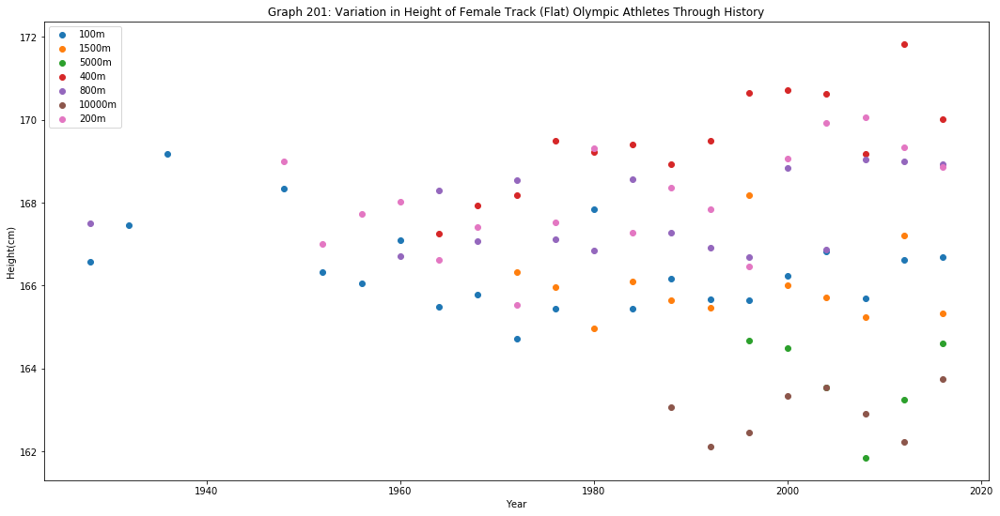

M
100
1500
5000
400
800
10000
200


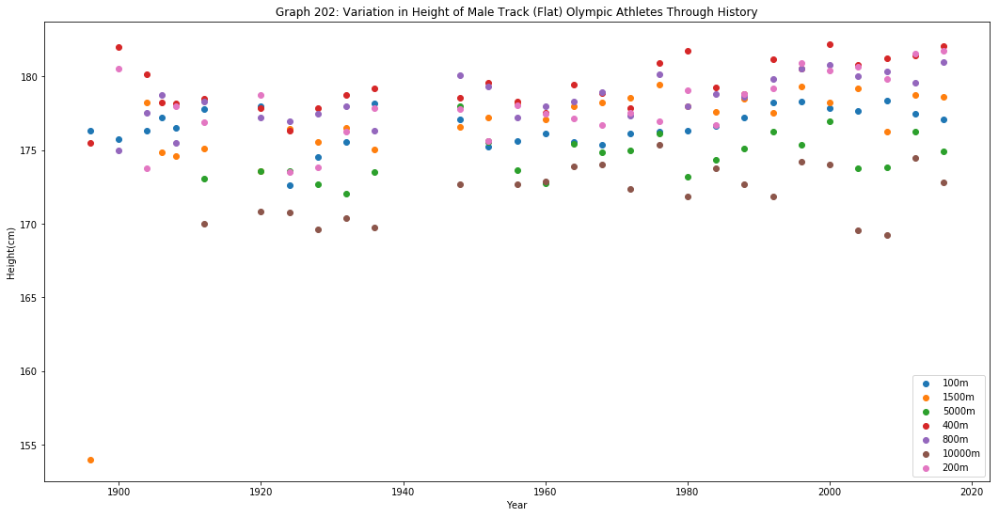

Steeplechase
F
3000


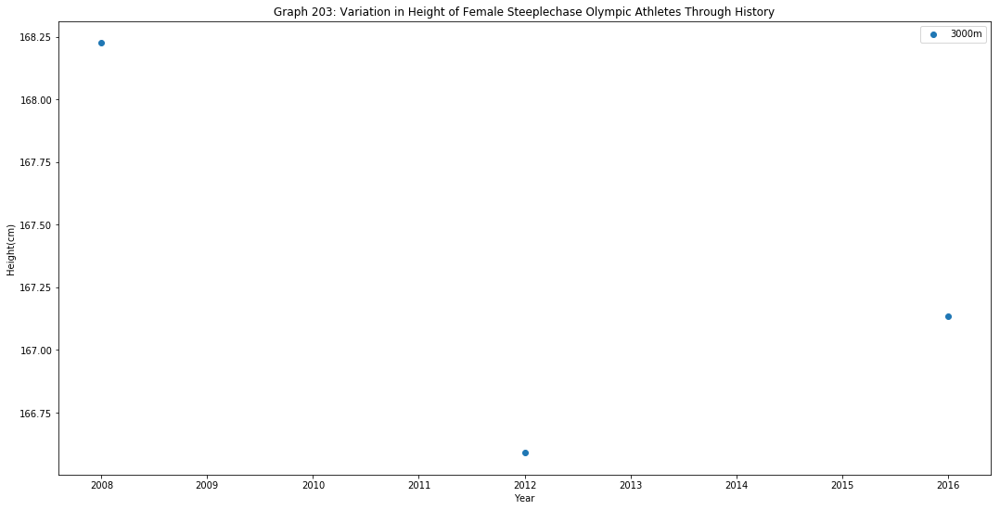

M
3000


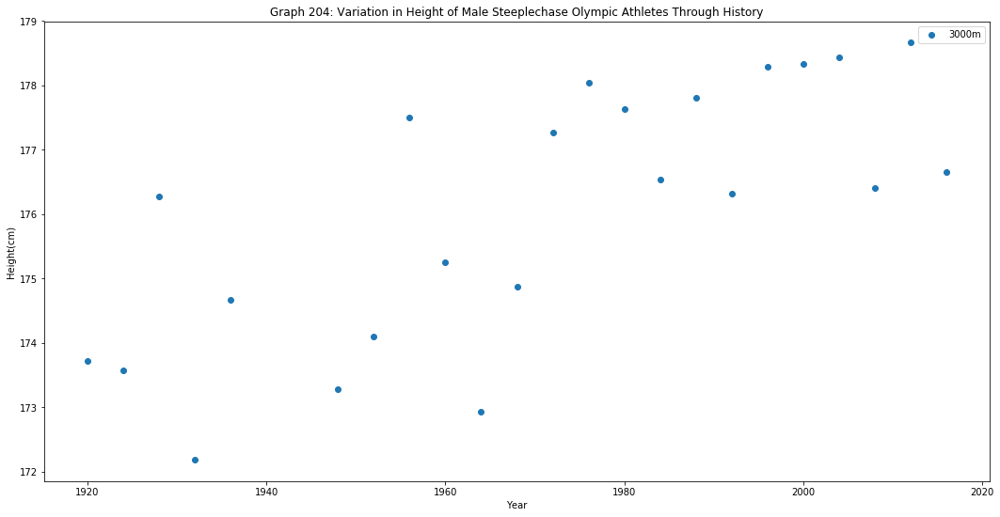

Hurdles
F
110
No results for this combination in ol_running_groups
400
100


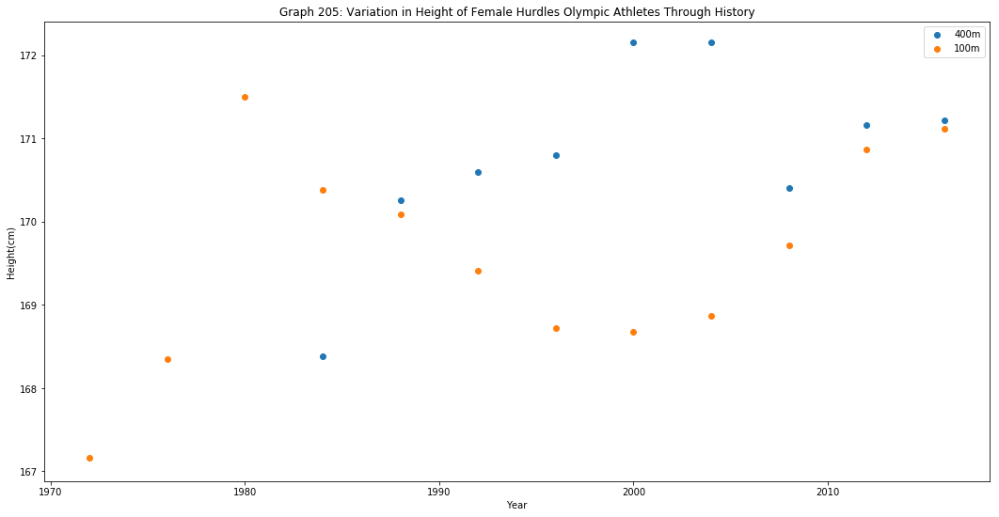

M
110
400
100
No results for this combination in ol_running_groups


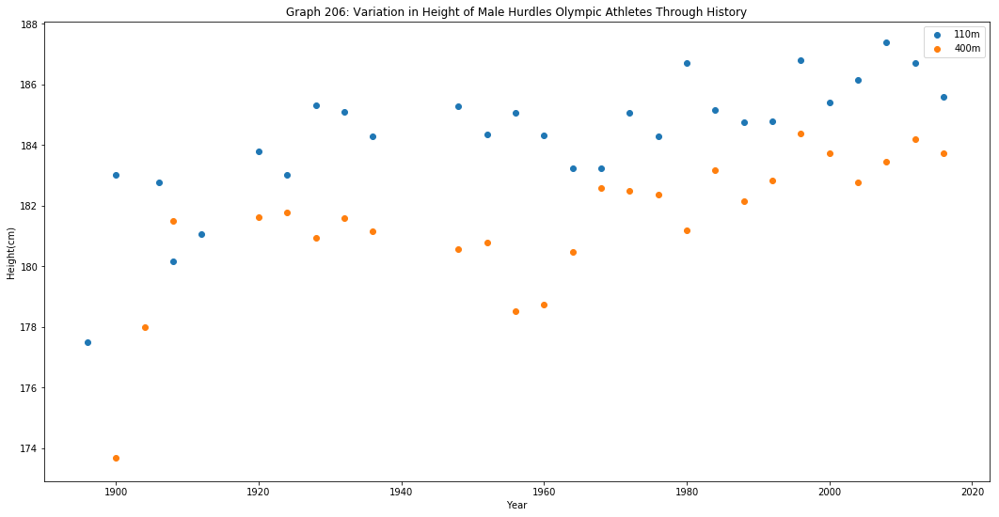

Road
F
42195


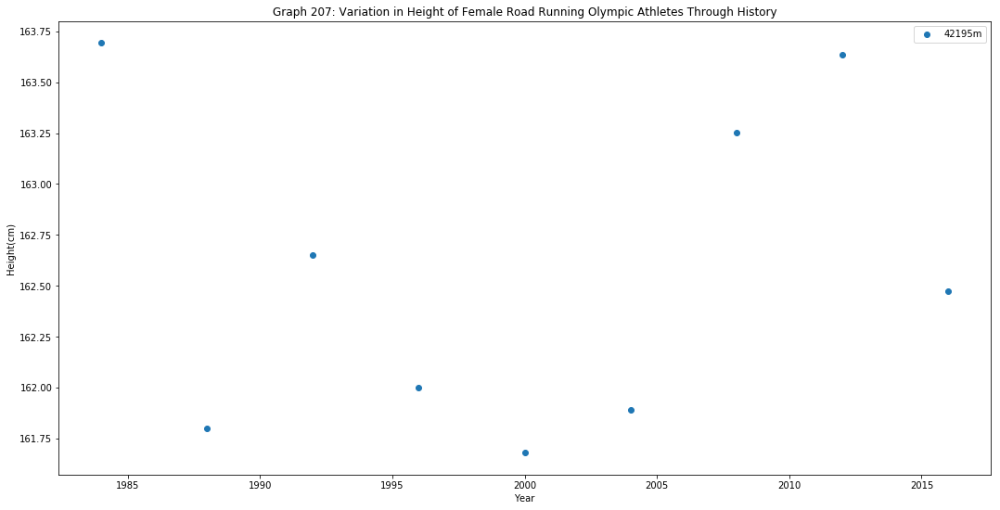

M
42195


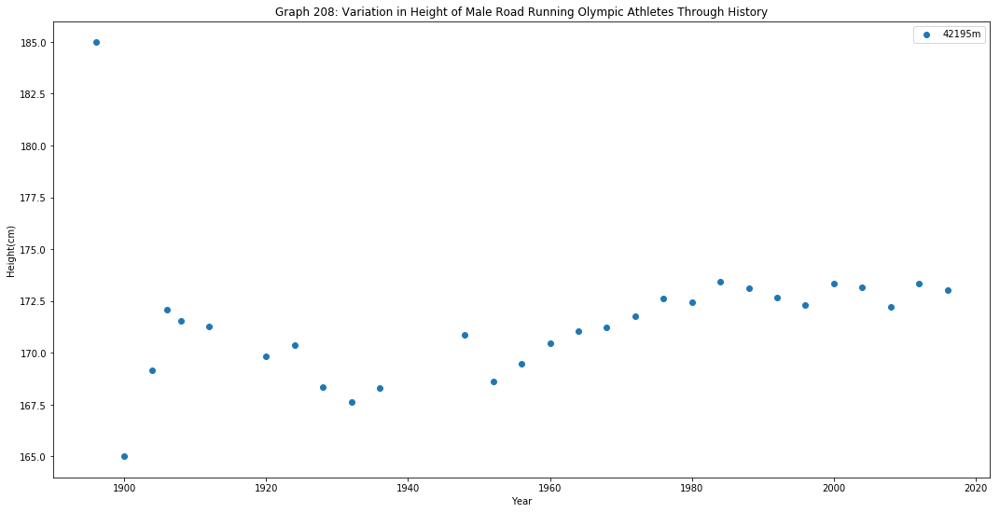

Track_Flat
F
100
1500
5000
400
800
10000
200


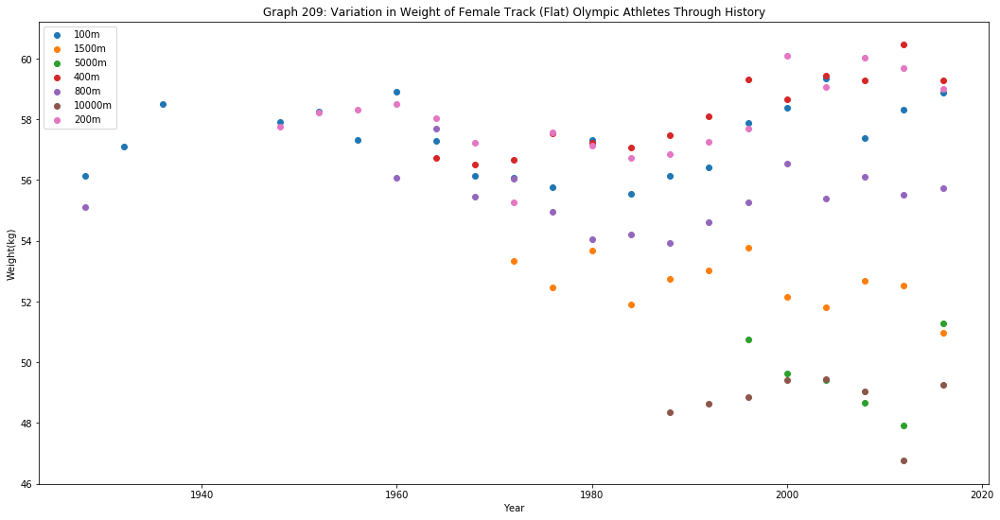

M
100
1500
5000
400
800
10000
200


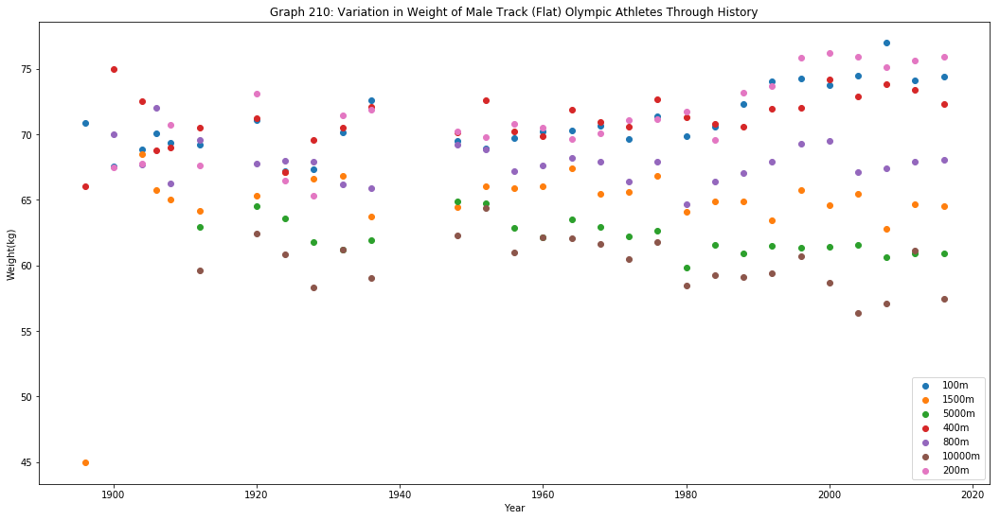

Steeplechase
F
3000


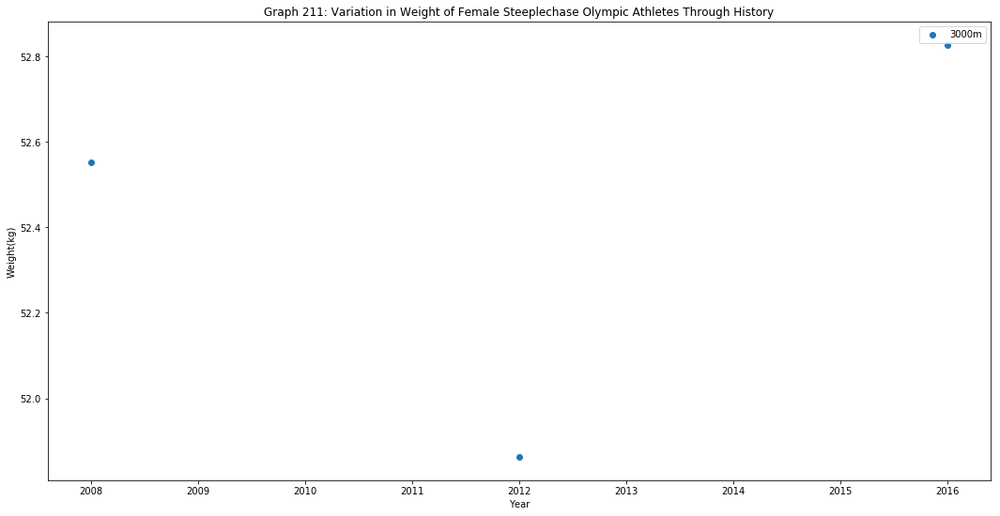

M
3000


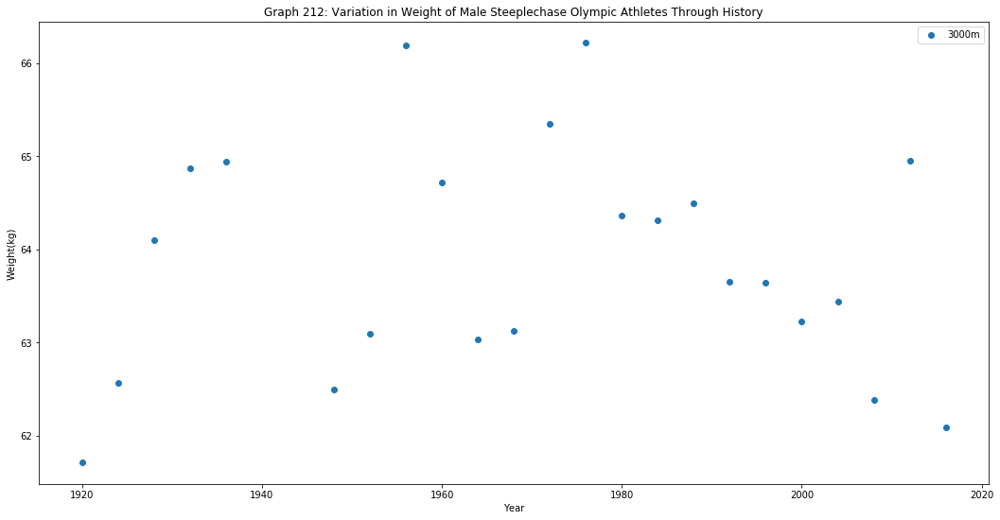

Hurdles
F
110
No results for this combination in ol_running_groups
400
100


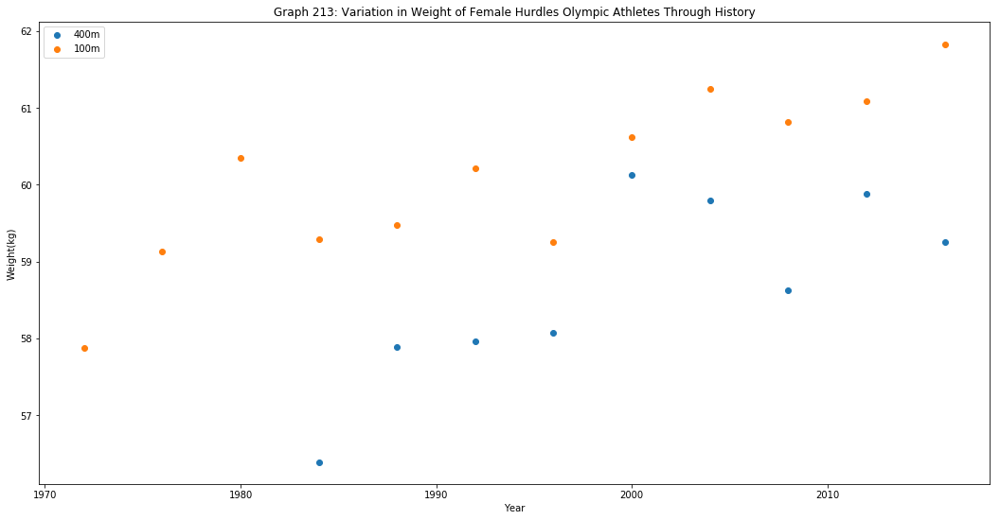

M
110
400
100
No results for this combination in ol_running_groups


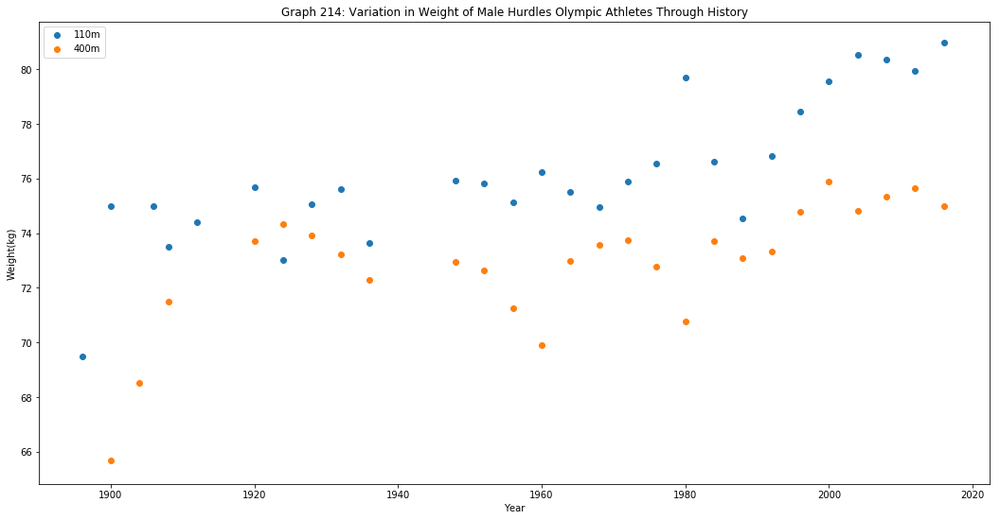

Road
F
42195


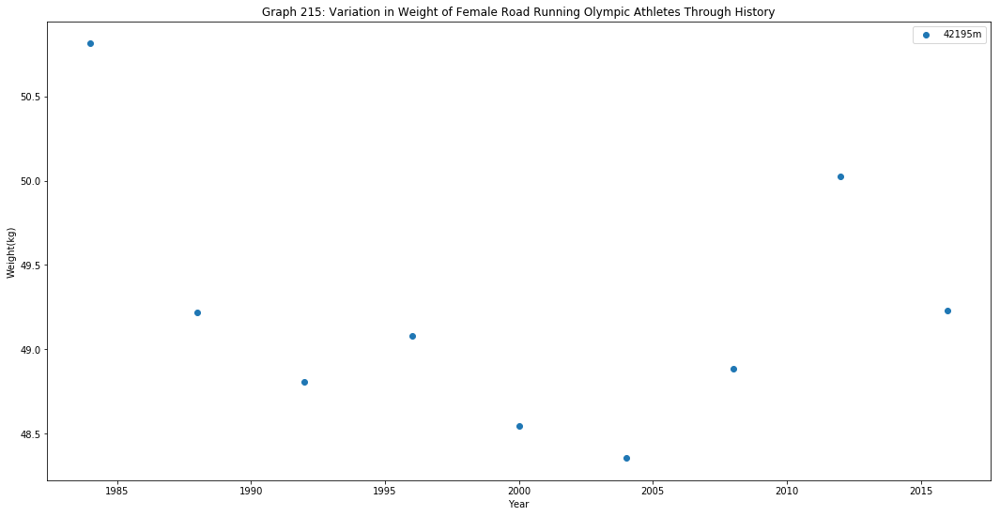

M
42195


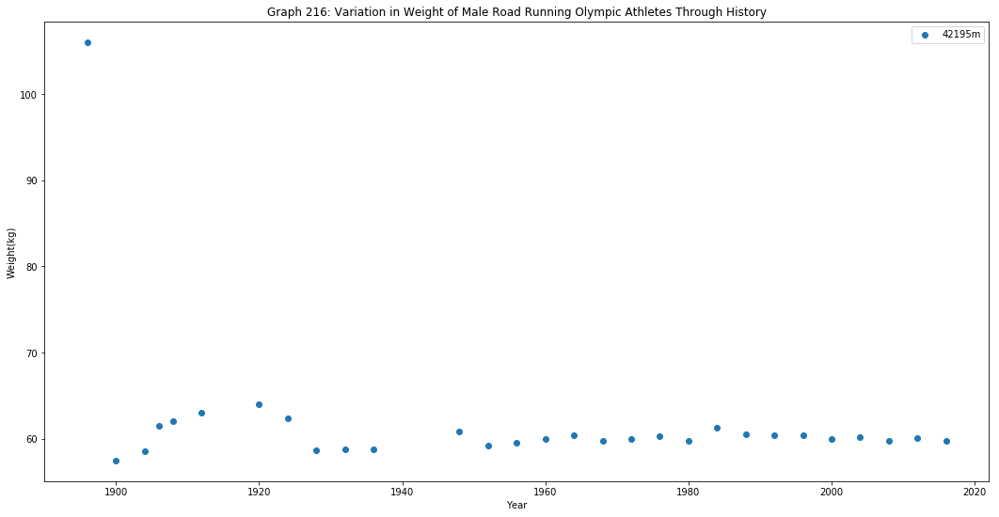

Track_Flat
F
100
1500
5000
400
800
10000
200


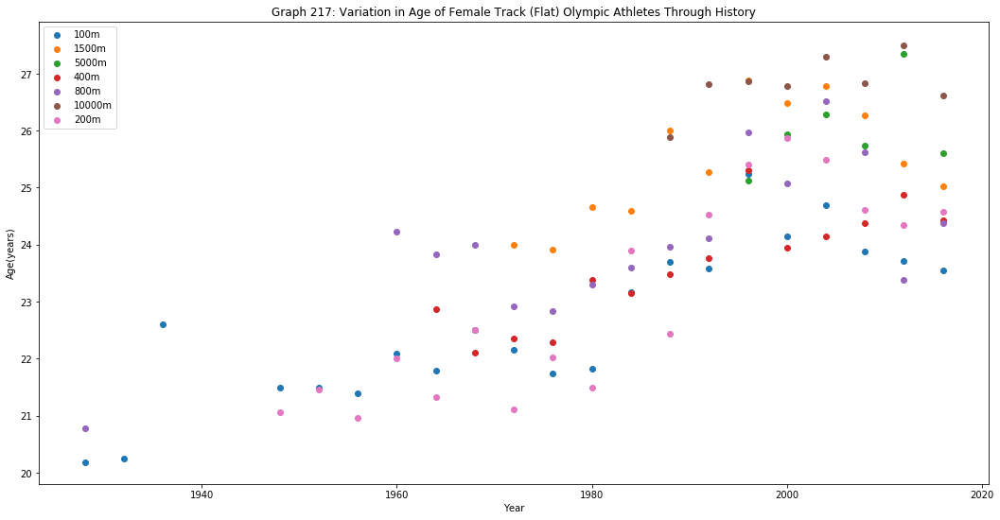

M
100
1500
5000
400
800
10000
200


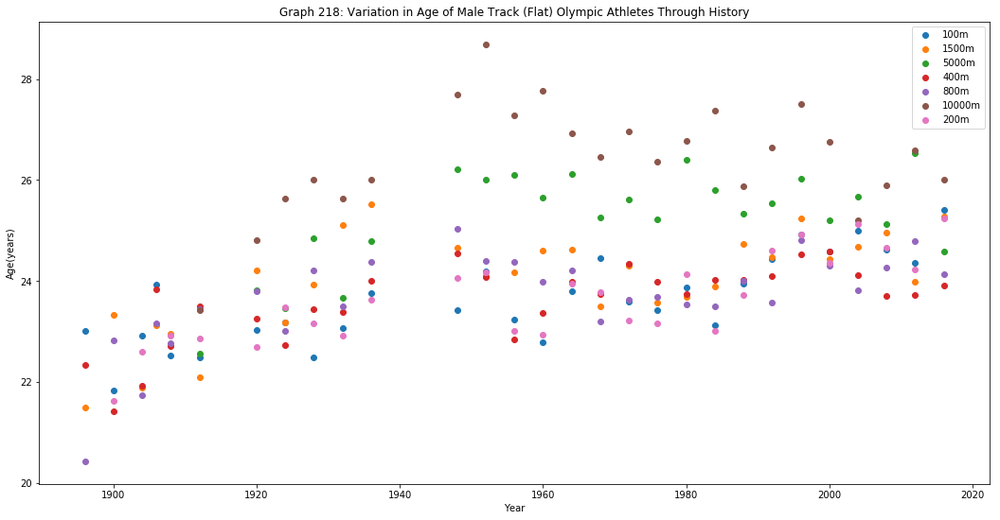

Steeplechase
F
3000


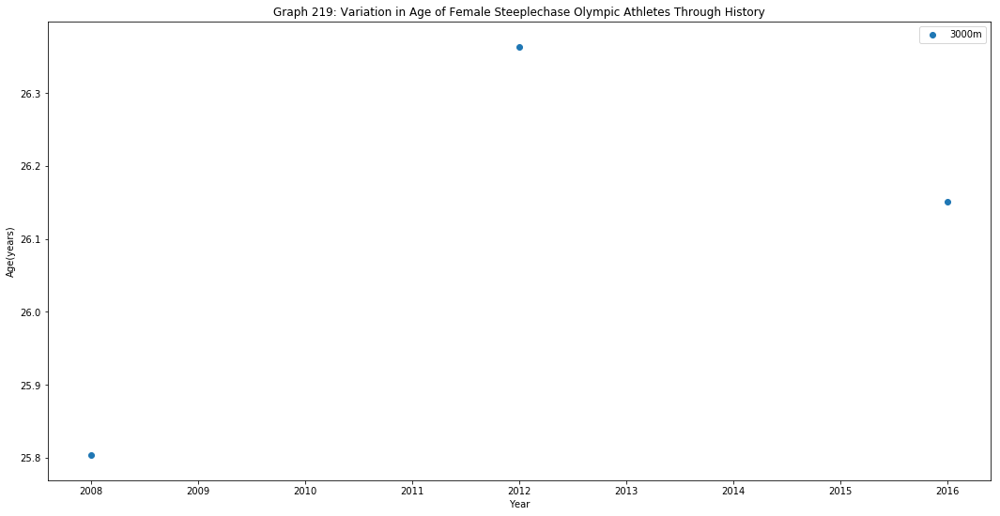

M
3000


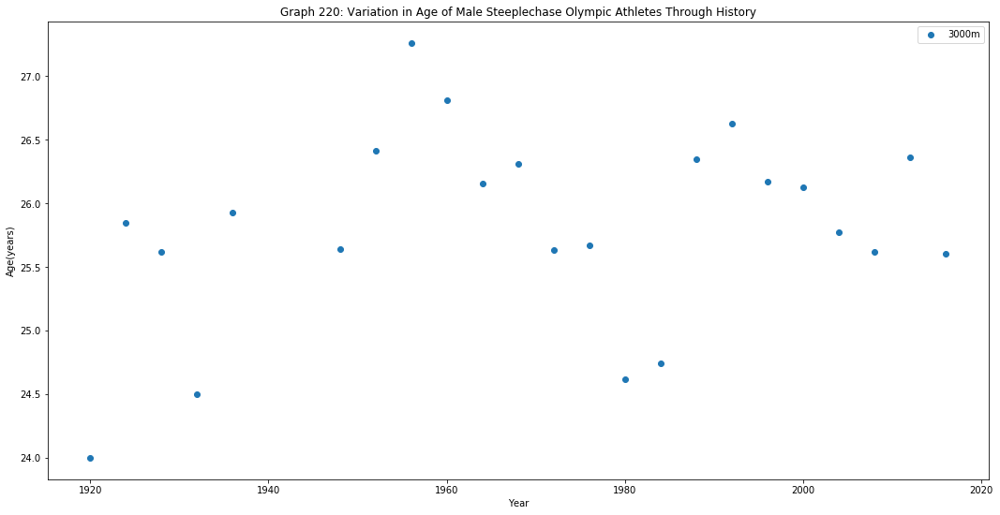

Hurdles
F
110
No results for this combination in ol_running_groups
400
100


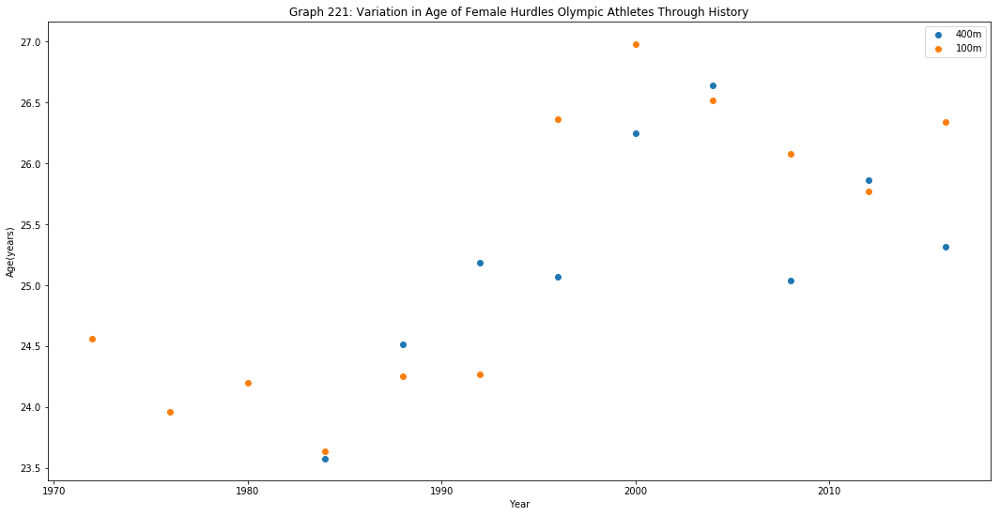

M
110
400
100
No results for this combination in ol_running_groups


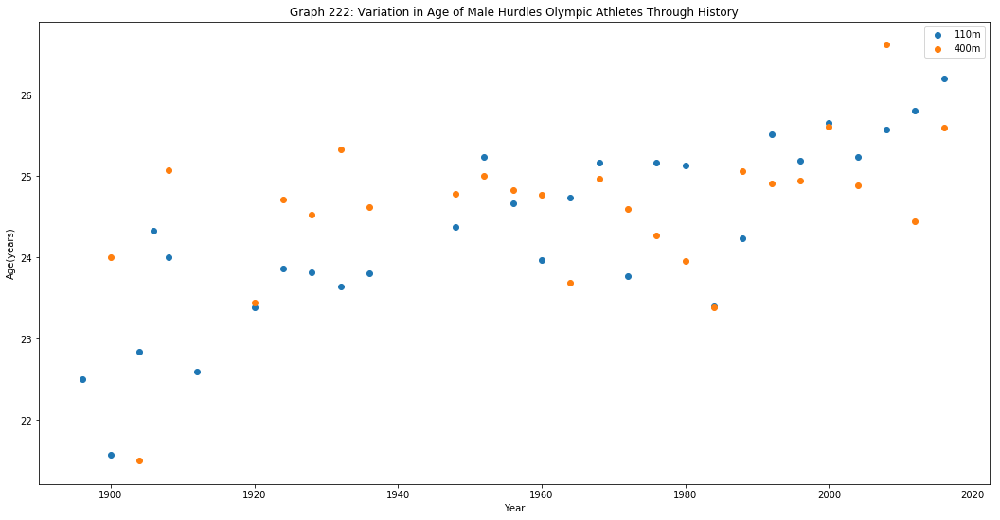

Road
F
42195


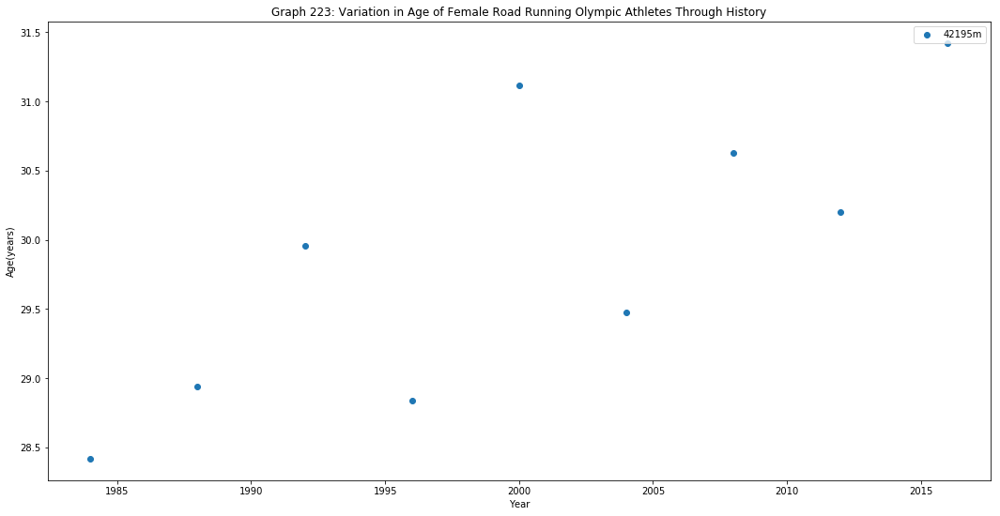

M
42195


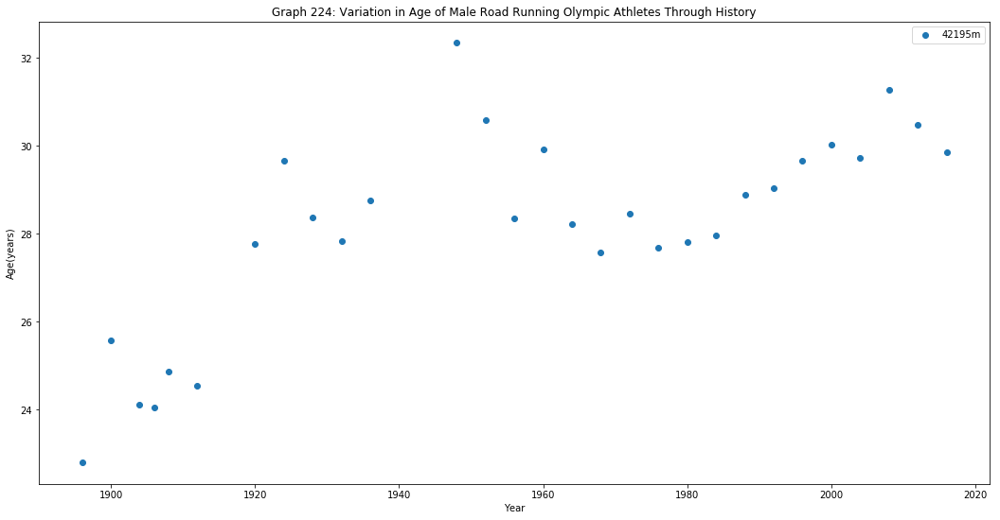

Track_Flat
F
100
1500
5000
400
800
10000
200


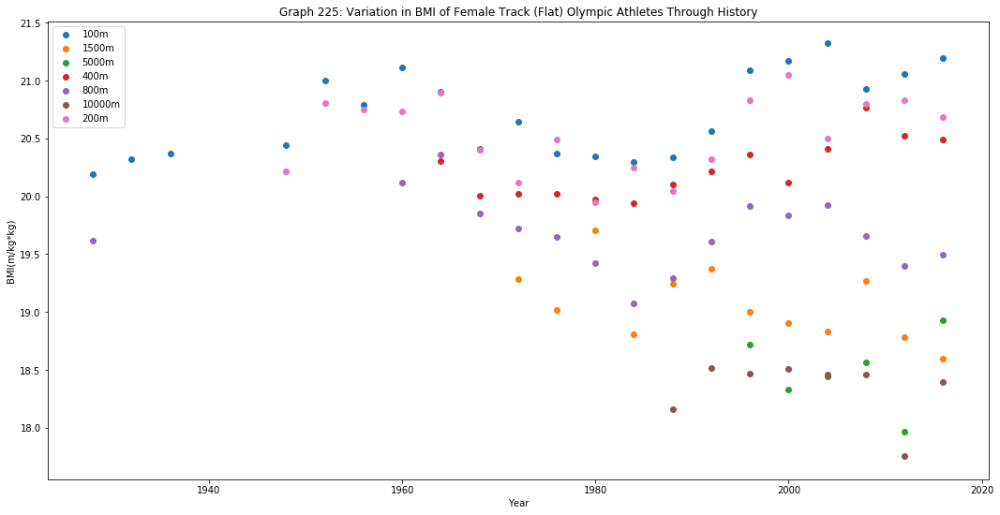

M
100
1500
5000
400
800
10000
200


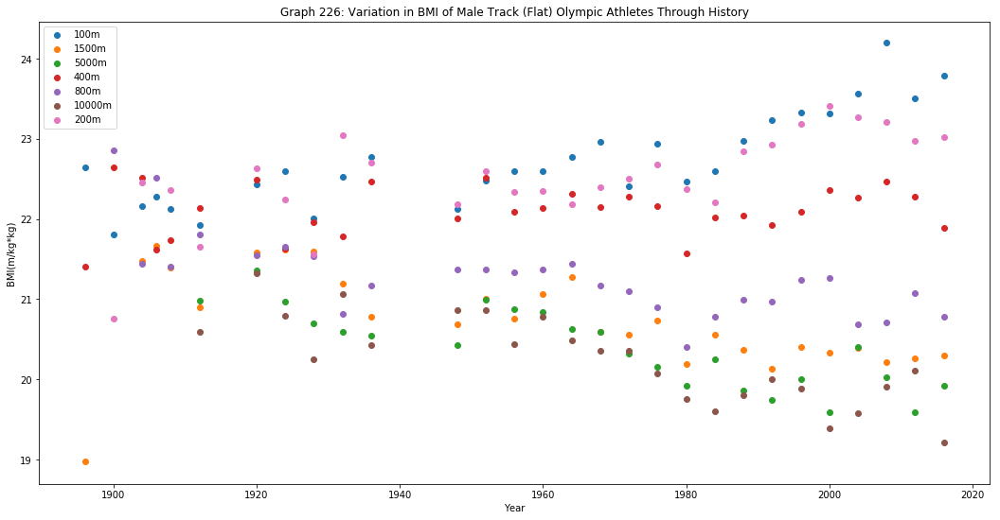

Steeplechase
F
3000


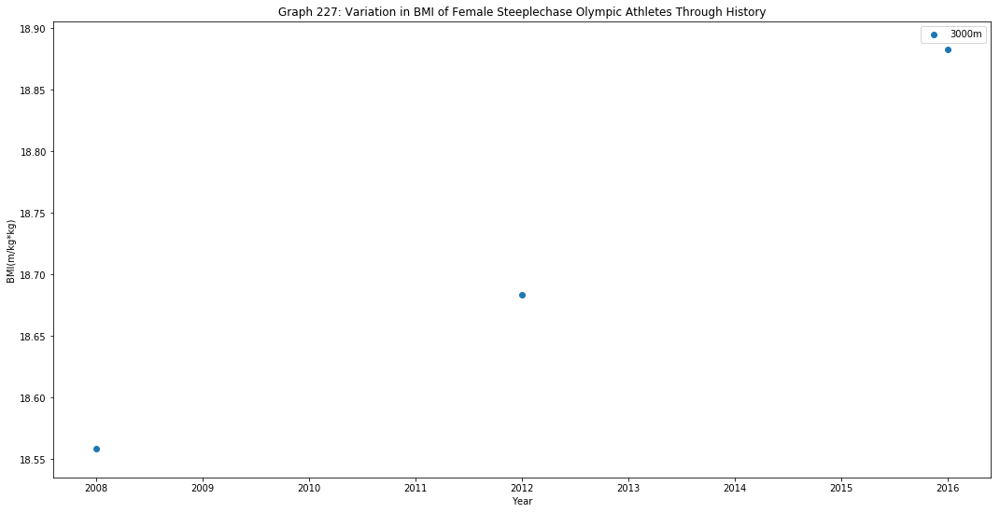

M
3000


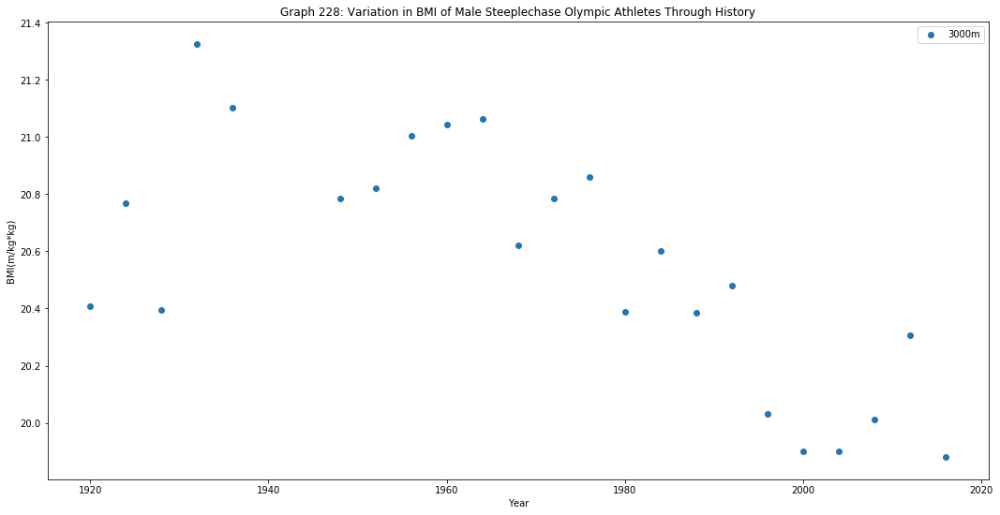

Hurdles
F
110
No results for this combination in ol_running_groups
400
100


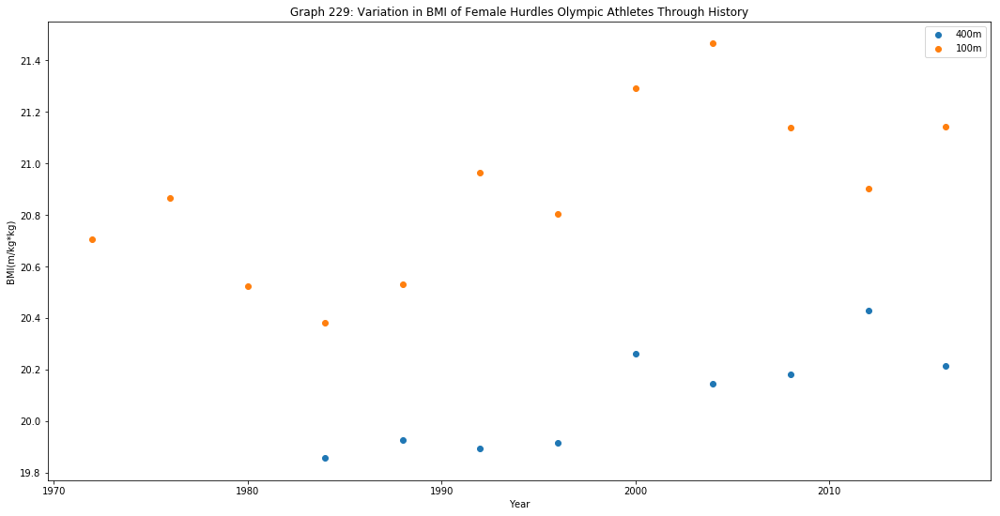

M
110
400
100
No results for this combination in ol_running_groups


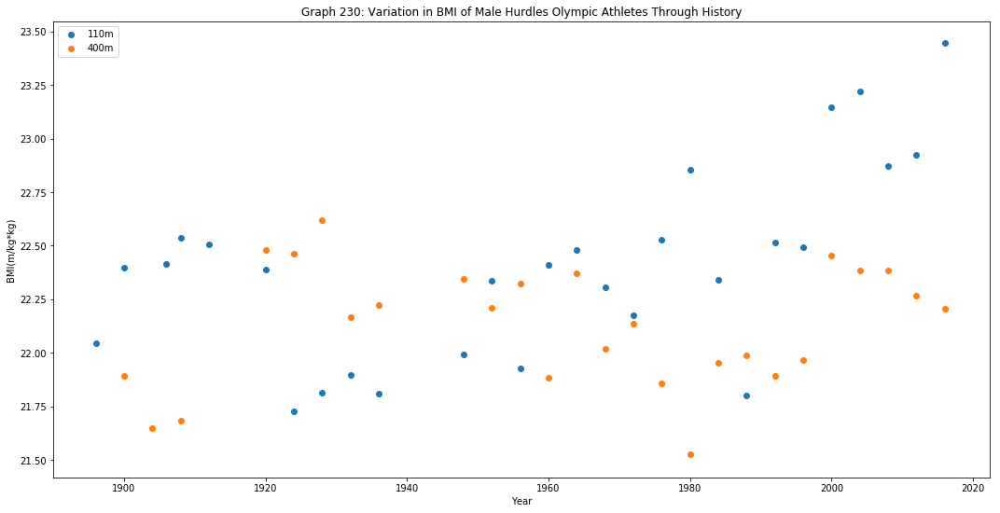

Road
F
42195


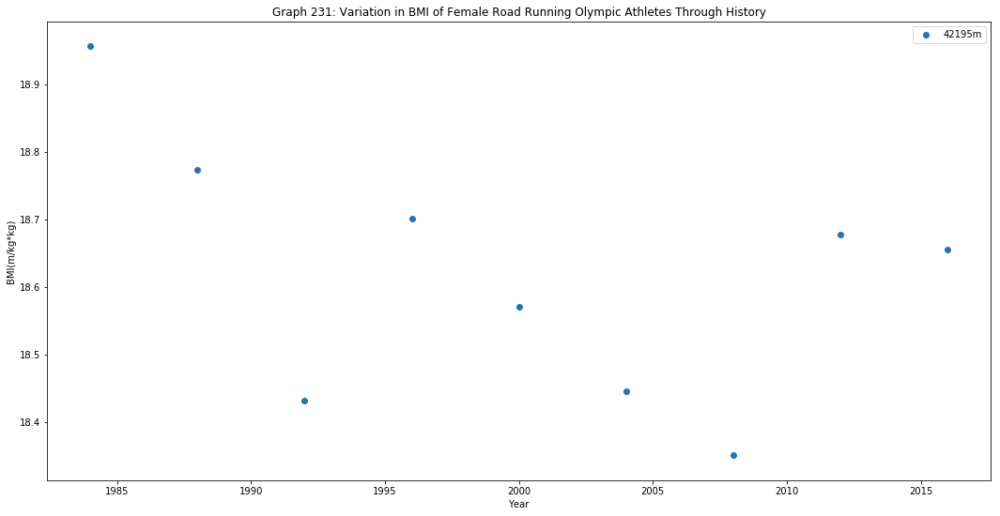

M
42195


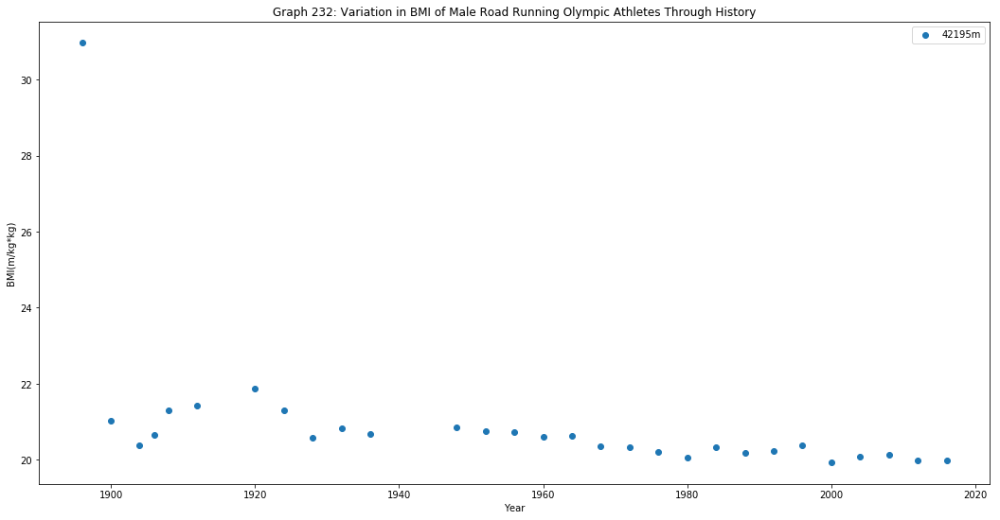

In [133]:
plot_athlete_data_grouped(event_categories, characteristics)

Track_Flat
100
F


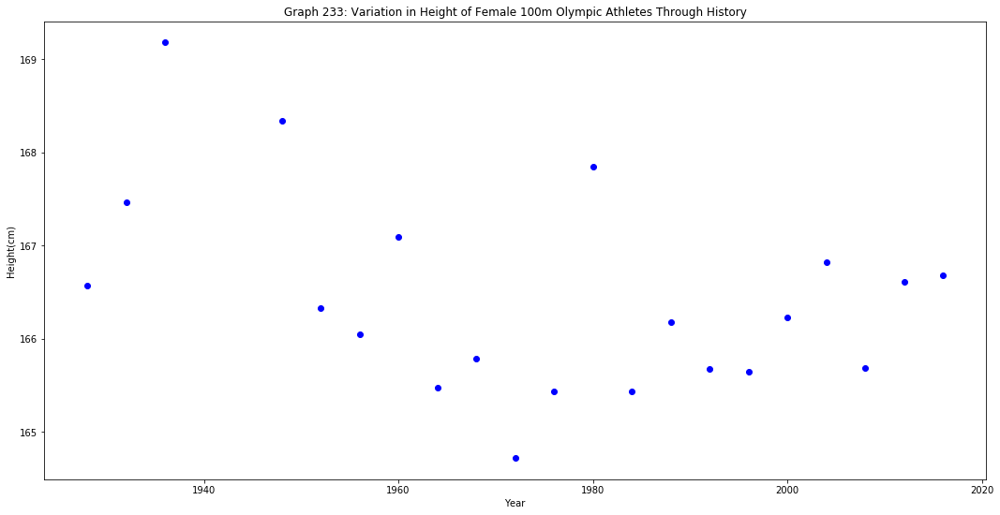

M


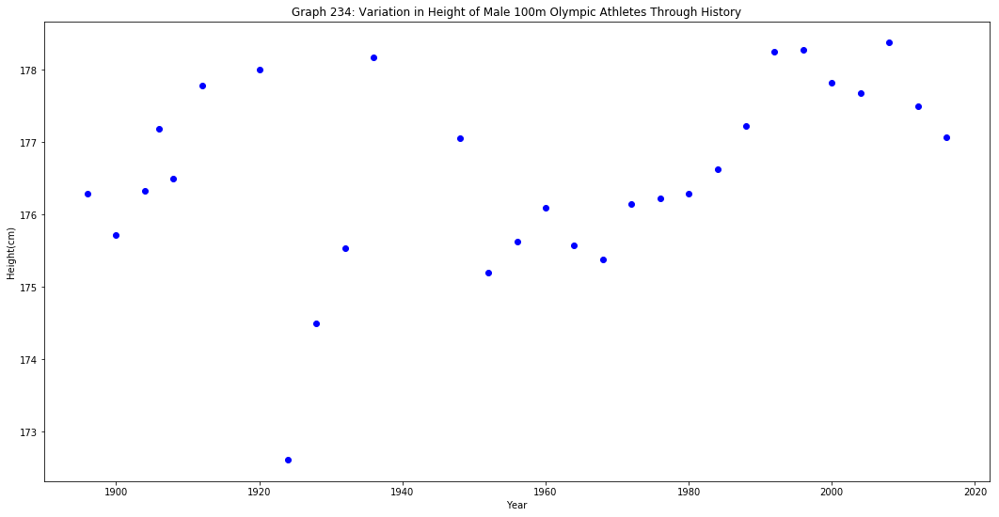

1500
F


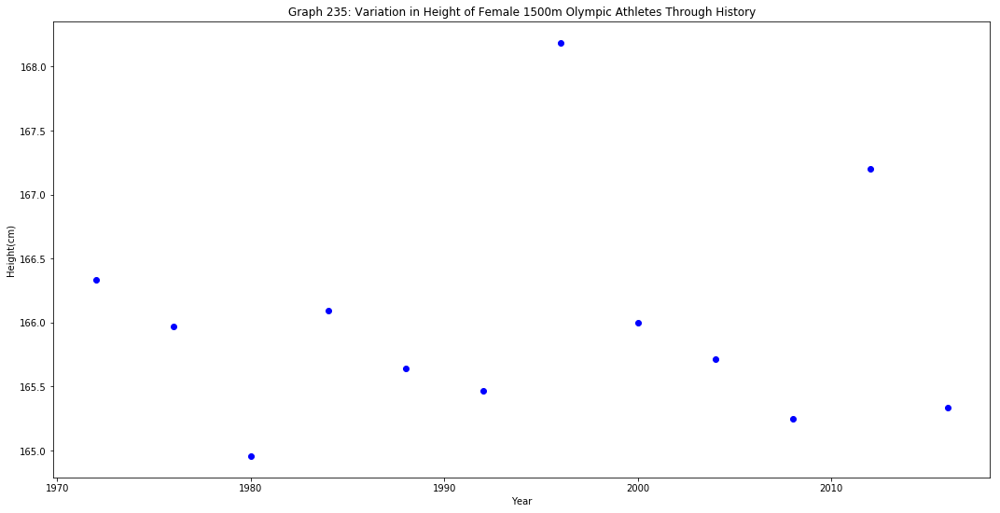

M


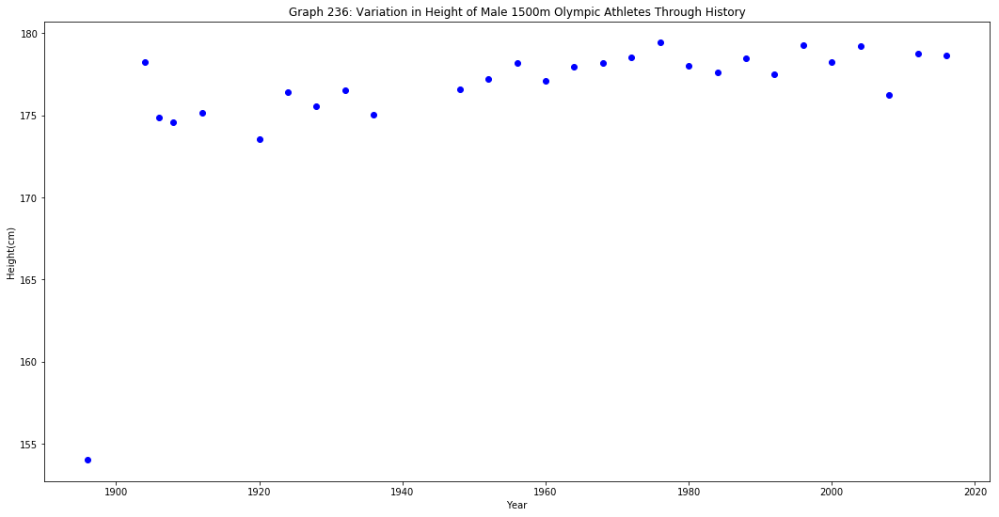

5000
F


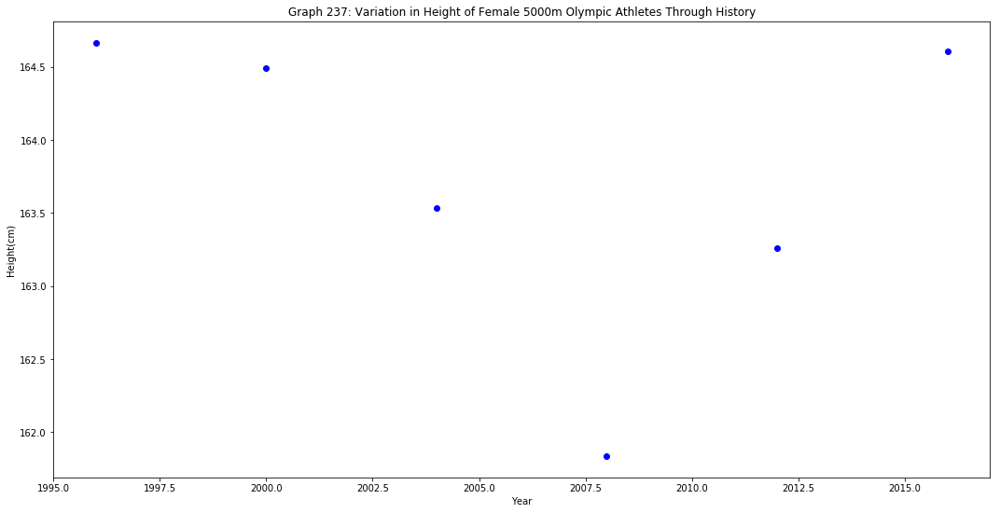

M


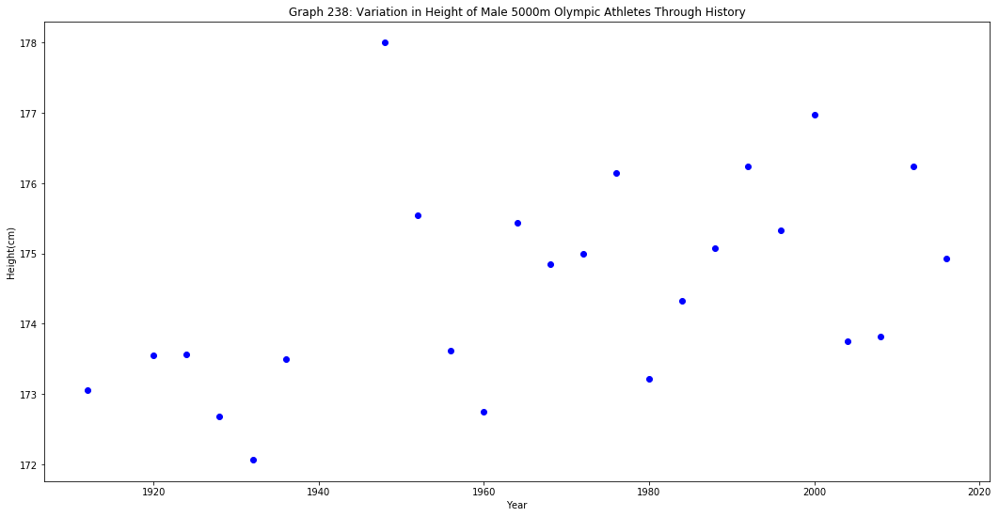

400
F


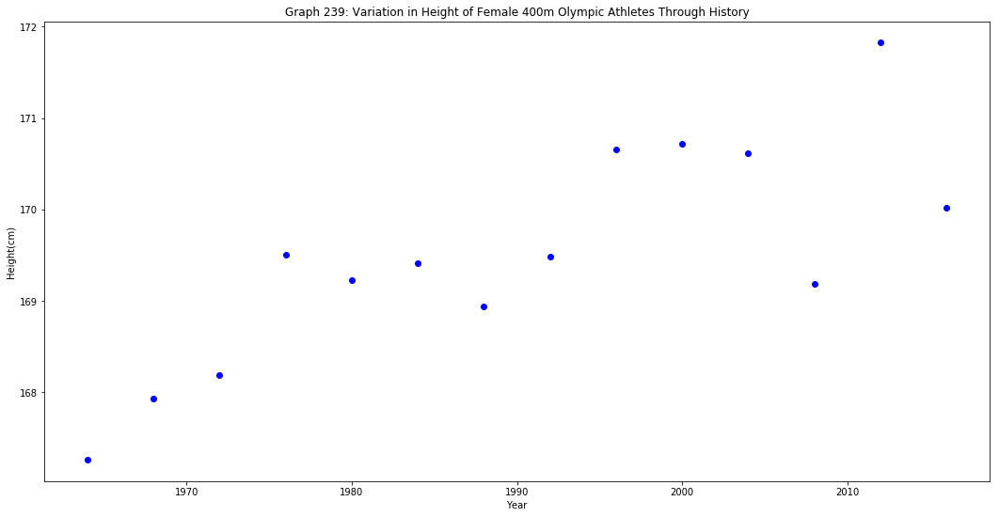

M


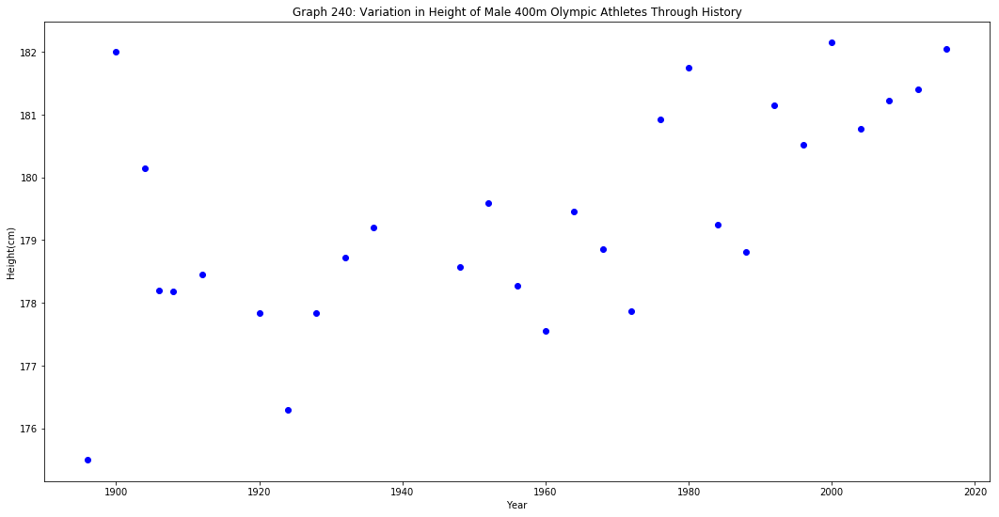

800
F


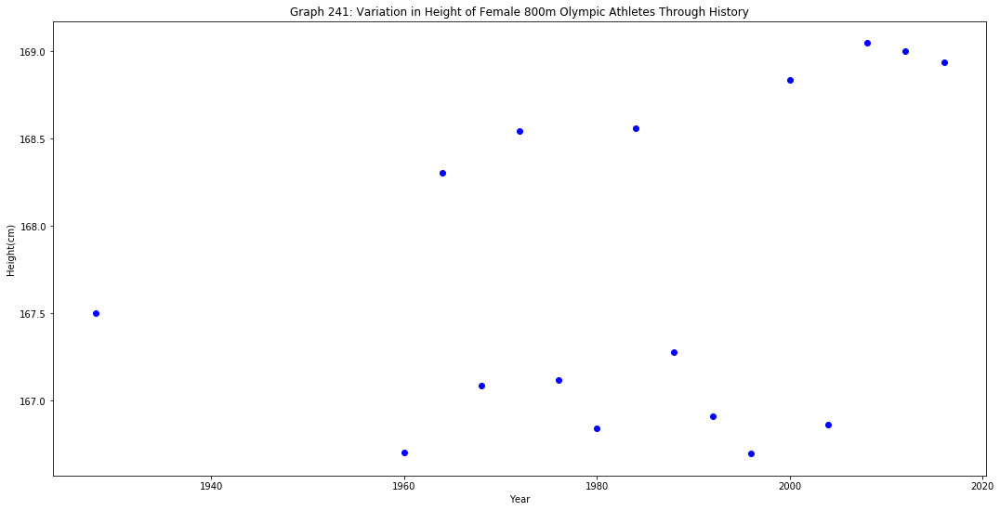

M


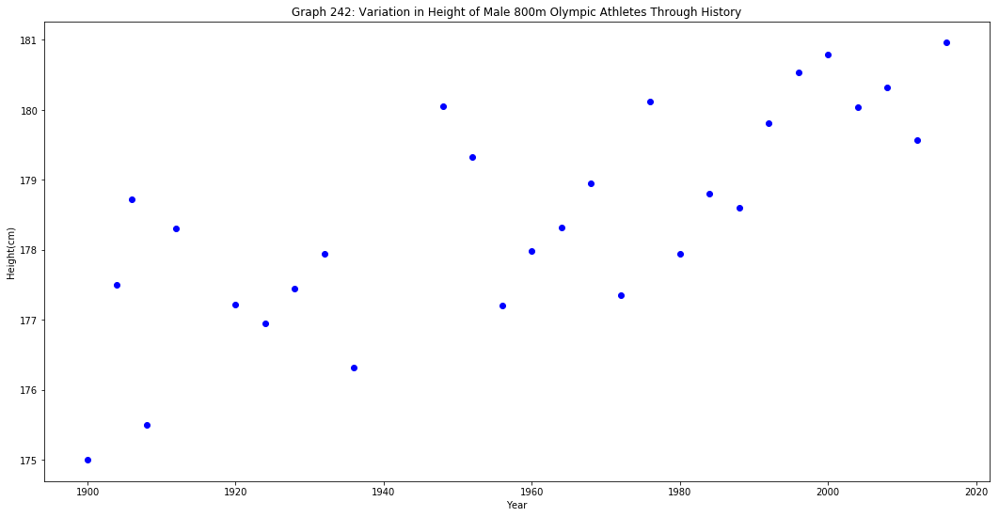

10000
F


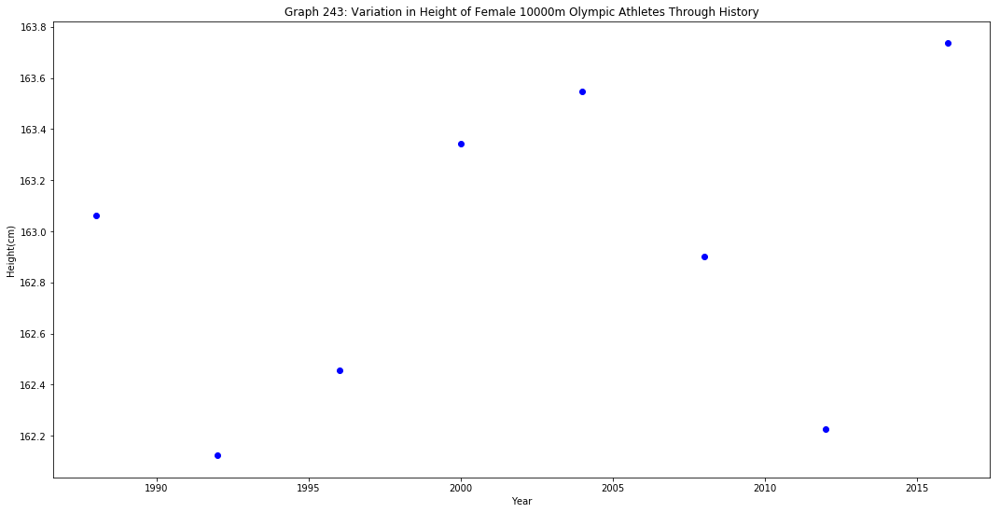

M


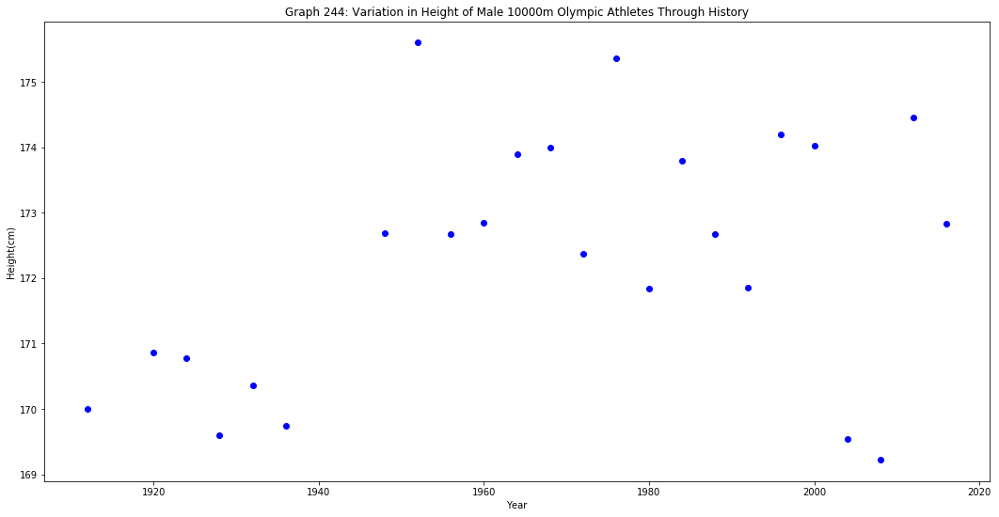

200
F


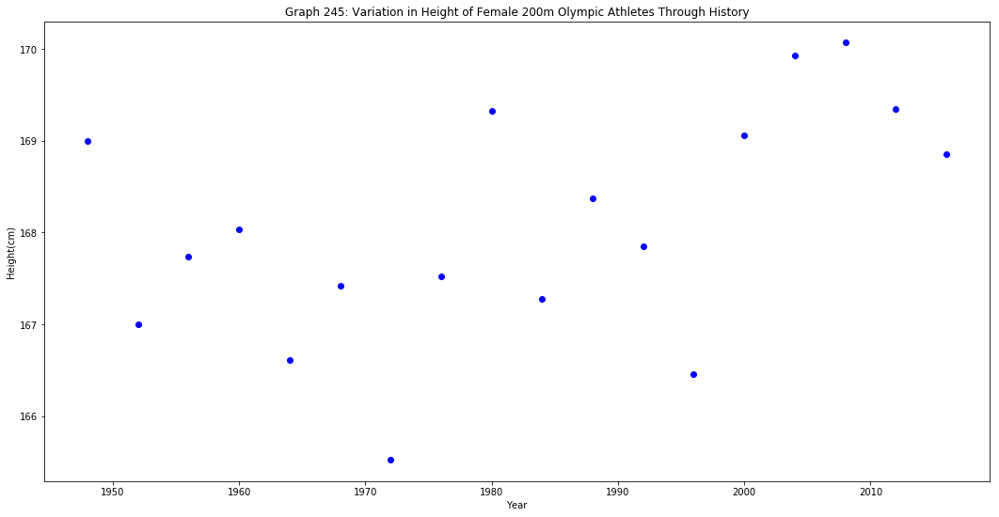

M


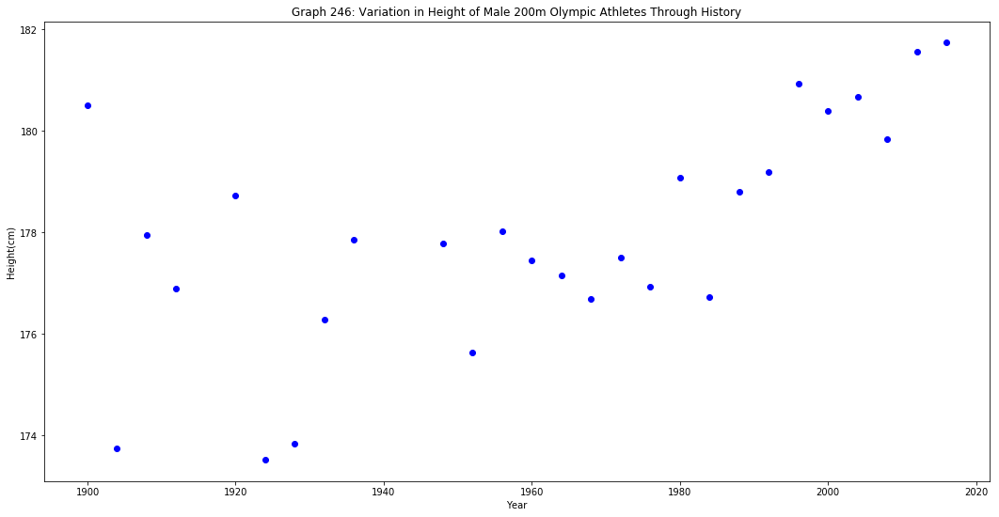

Steeplechase
3000
F


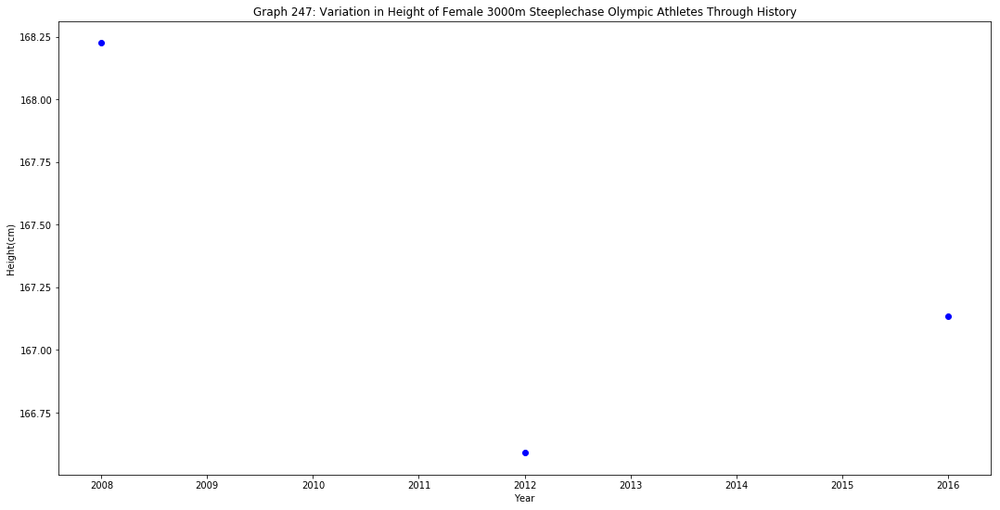

M


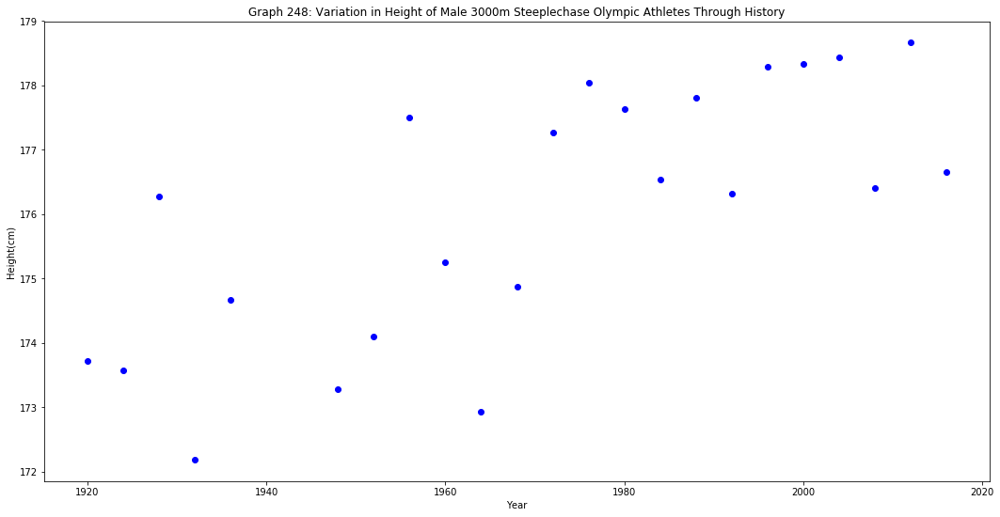

Hurdles
110
F
No results for this combination in ol_running_groups
M


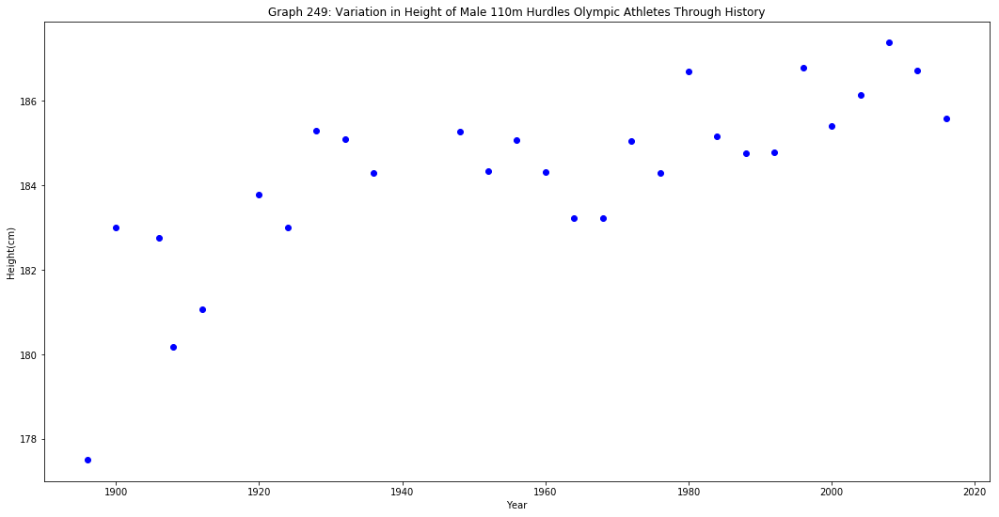

400
F


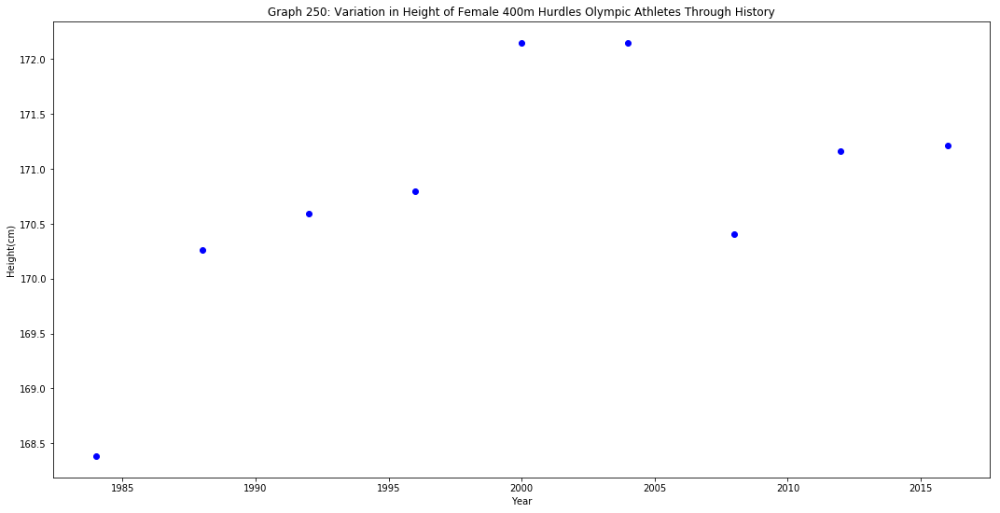

M


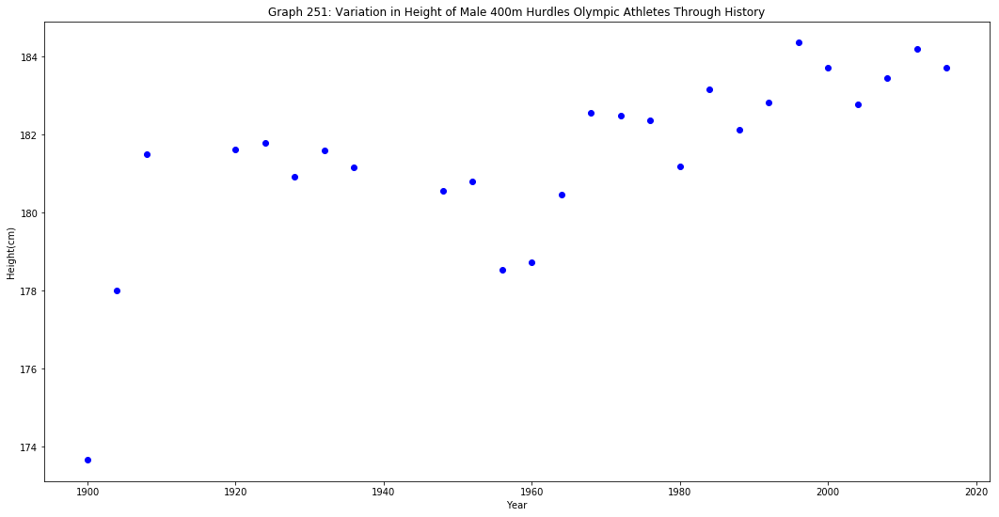

100
F


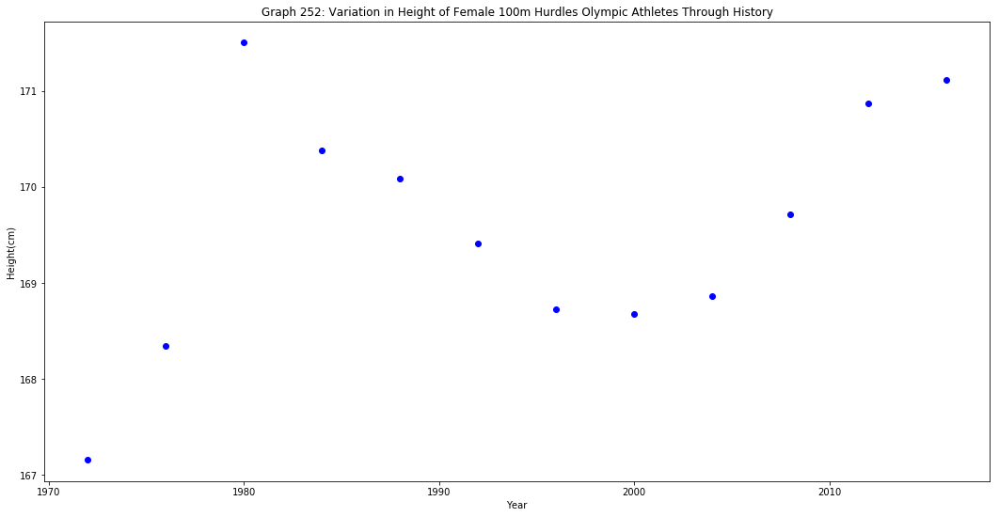

M
No results for this combination in ol_running_groups
Road
42195
F


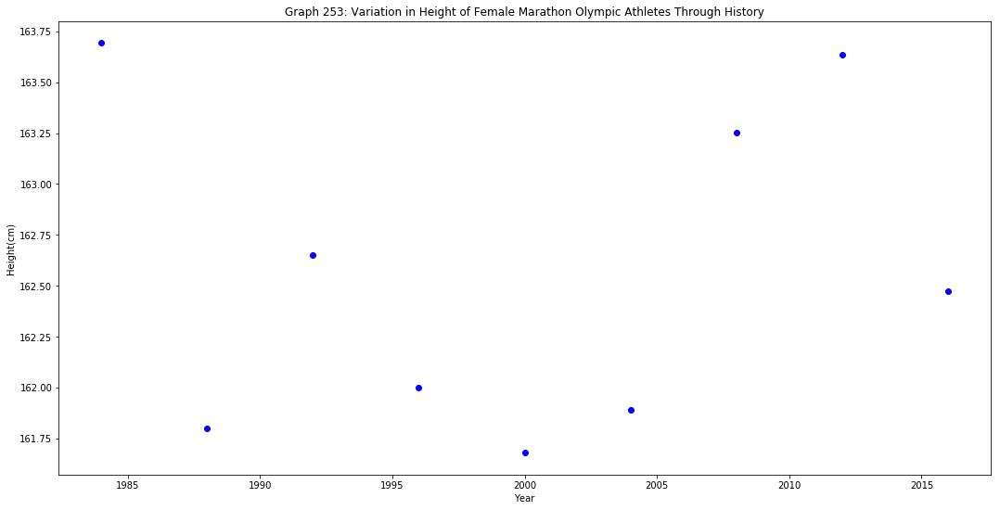

M


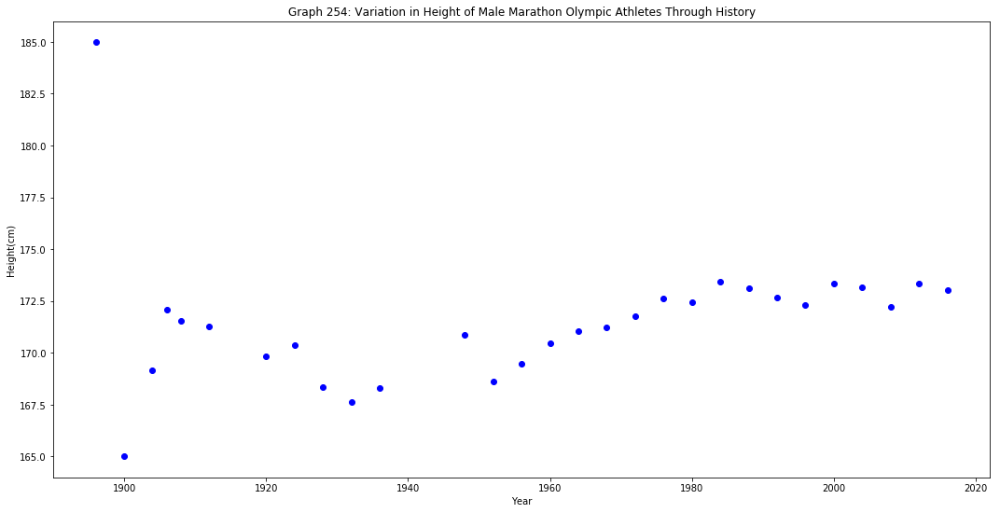

Track_Flat
100
F


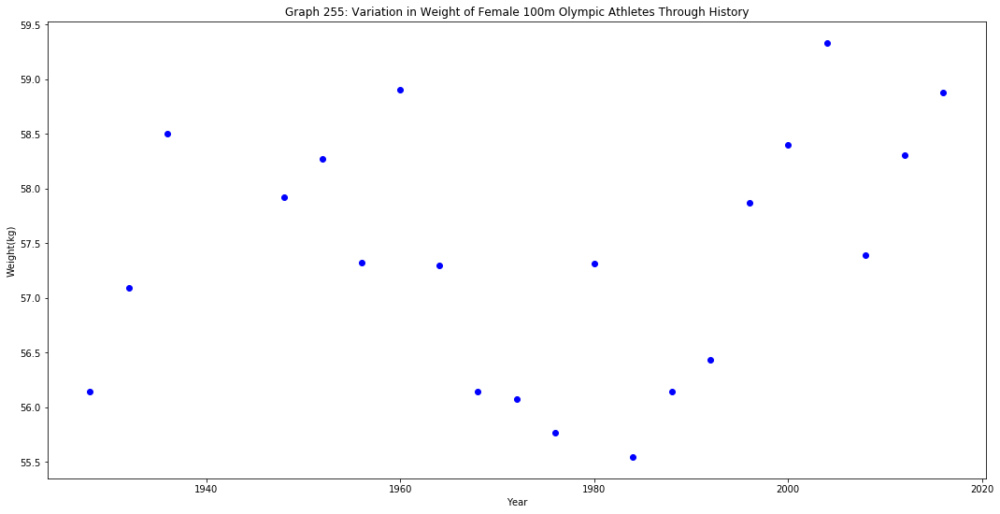

M


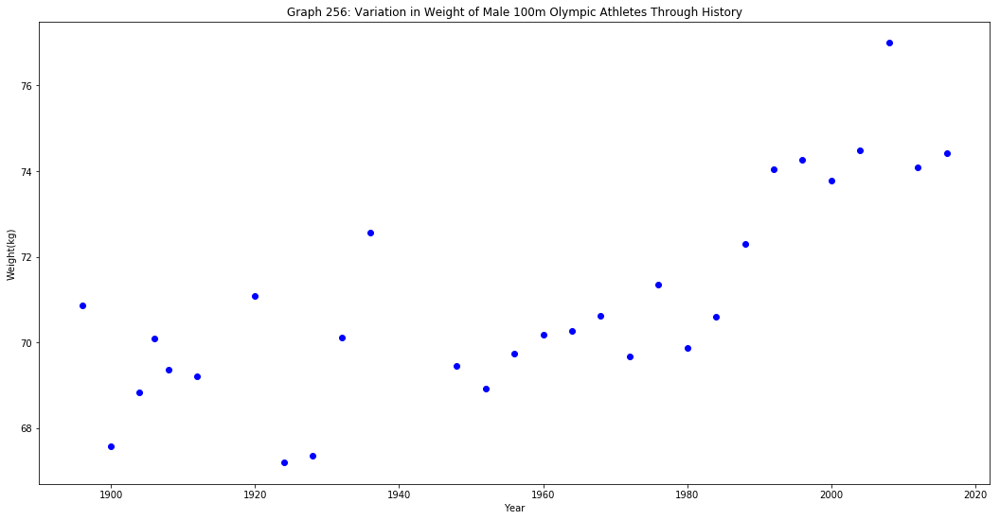

1500
F


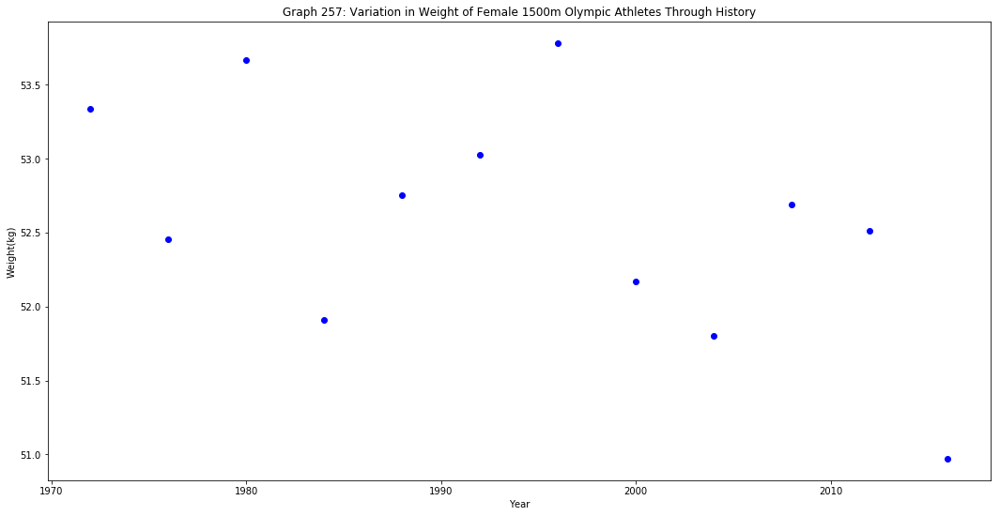

M


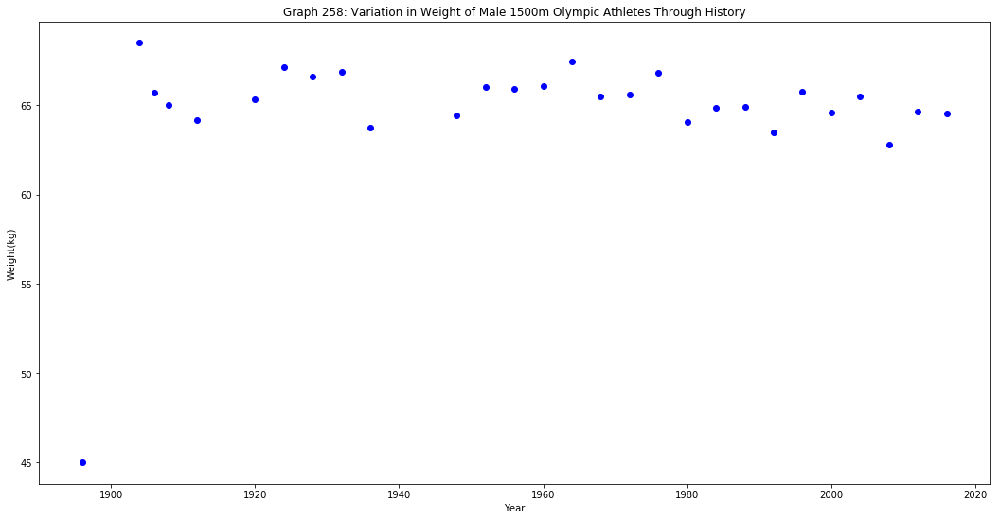

5000
F


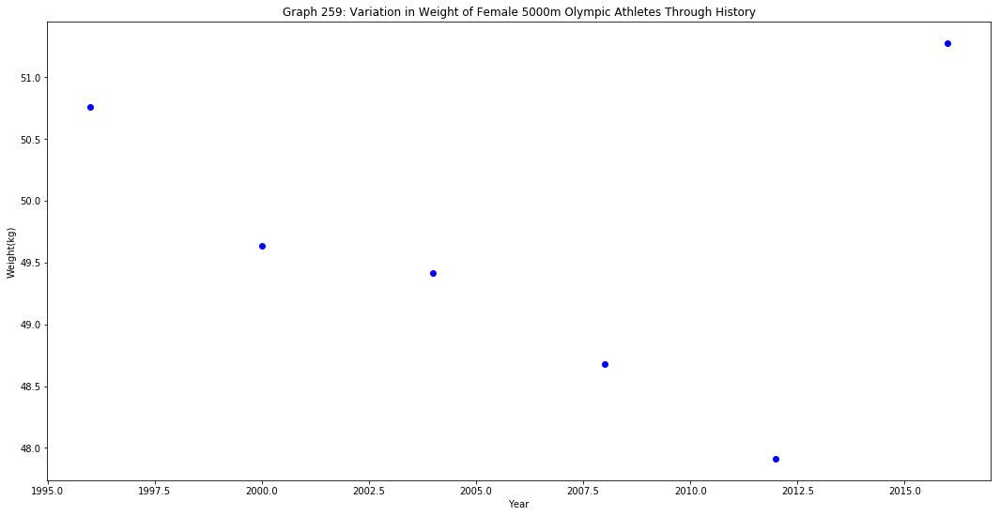

M


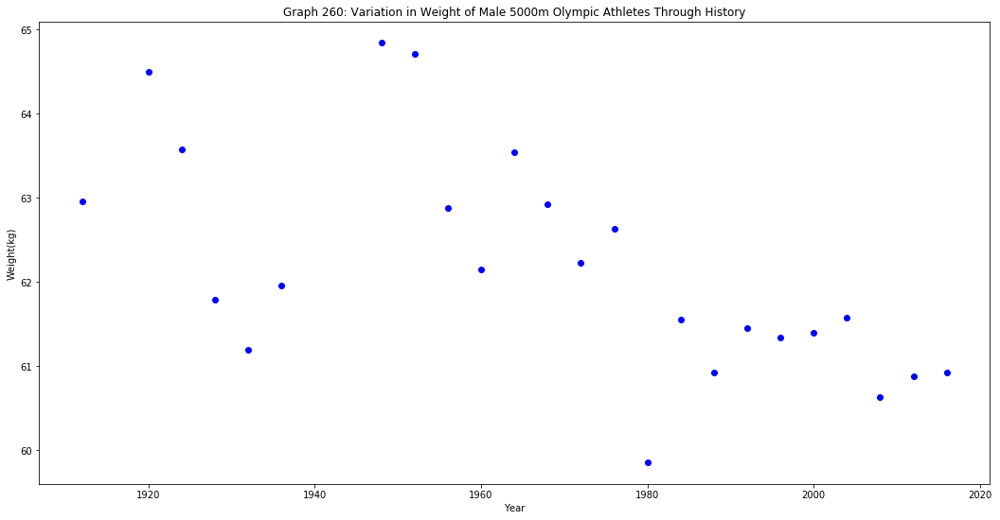

400
F


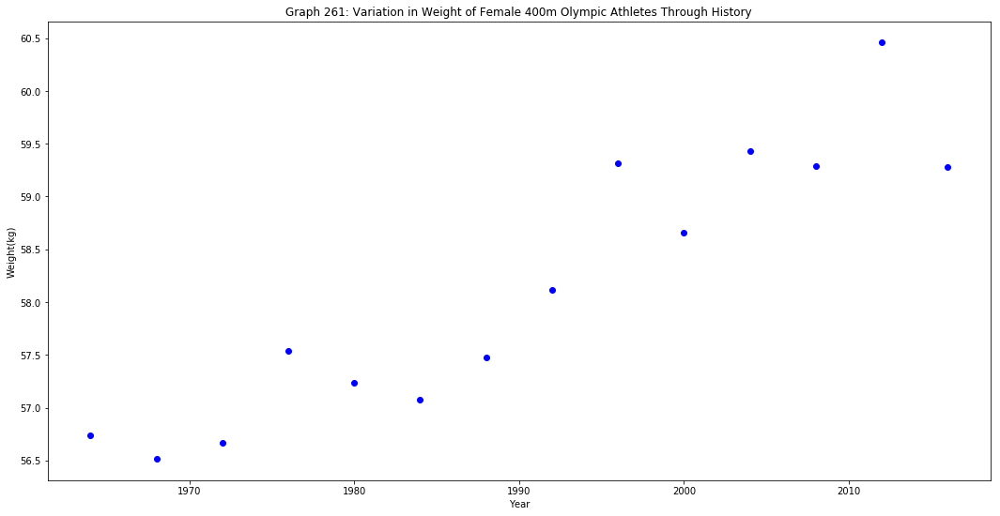

M


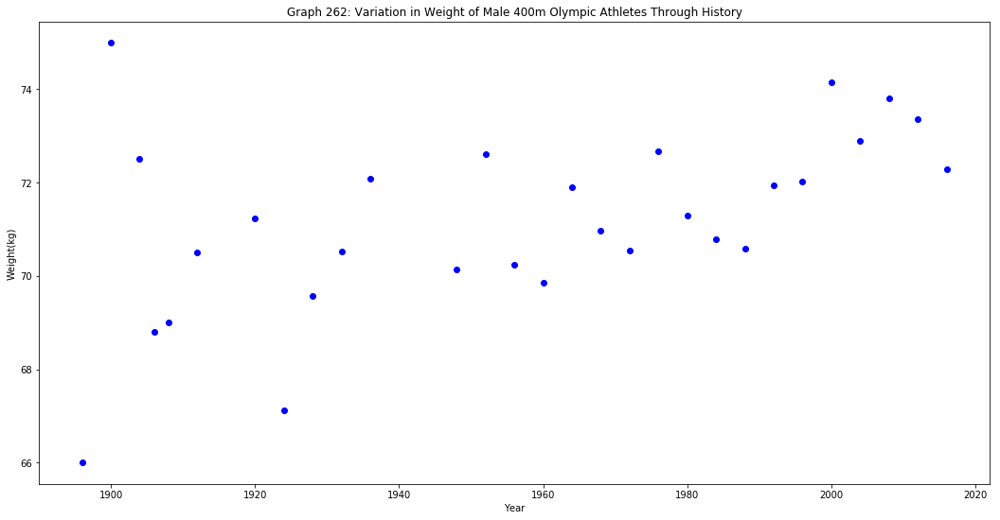

800
F


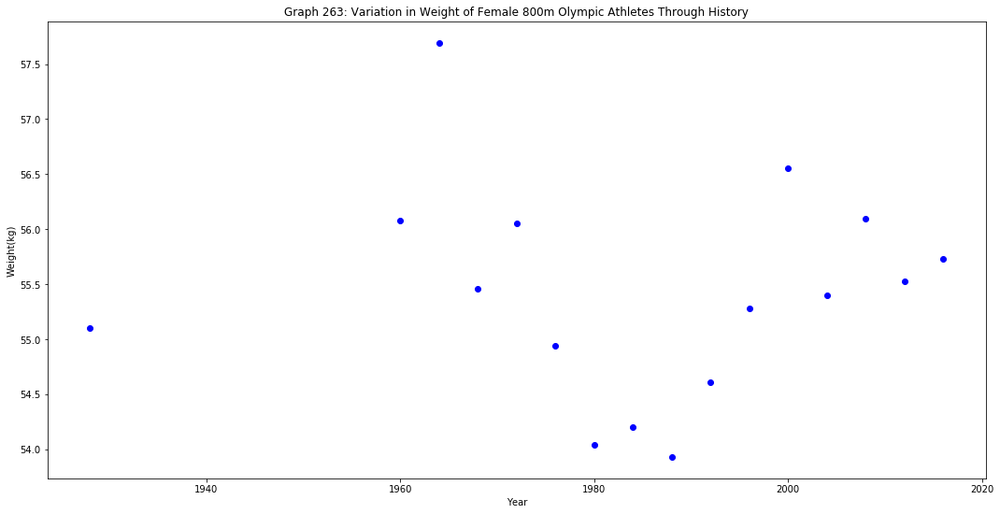

M


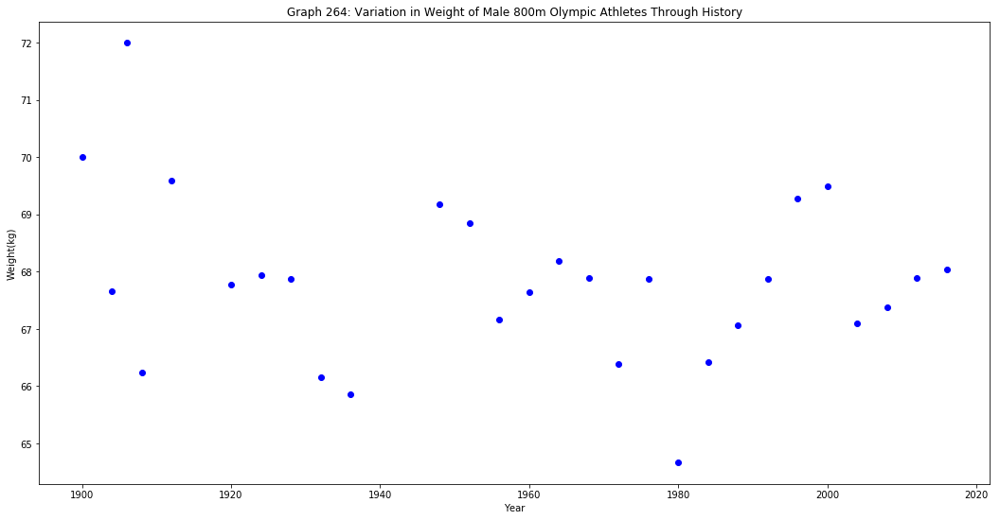

10000
F


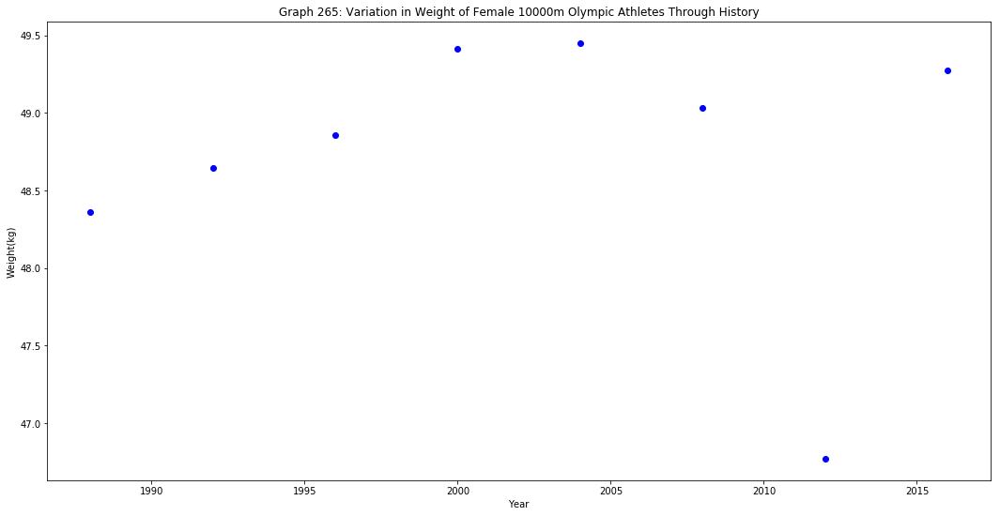

M


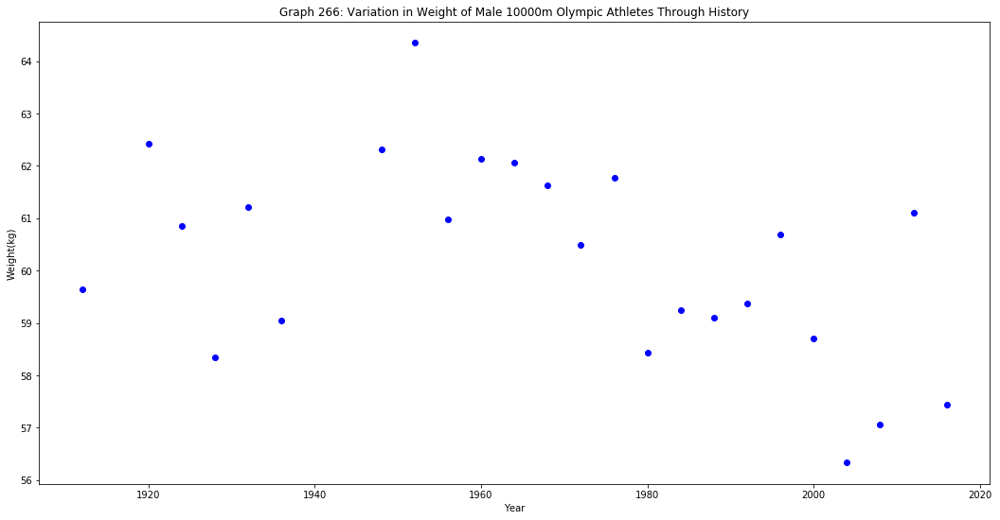

200
F


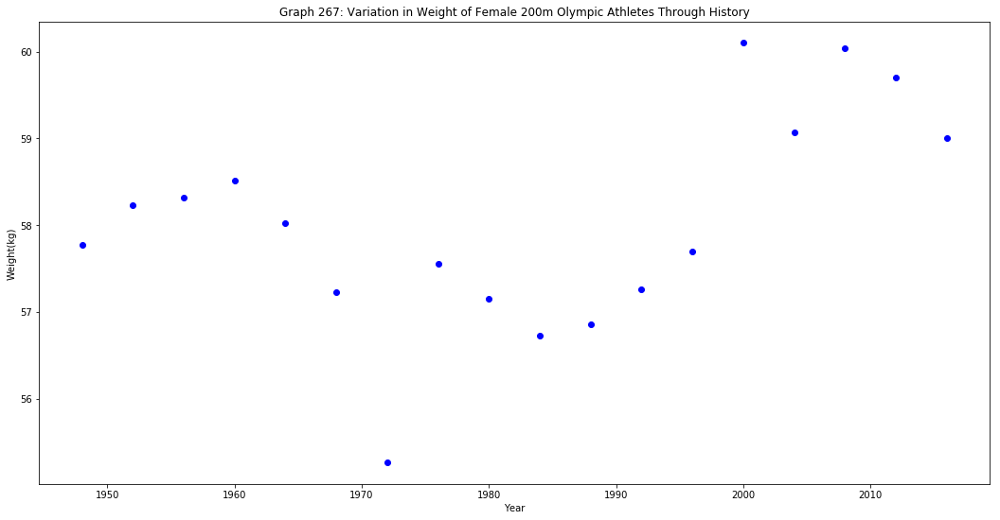

M


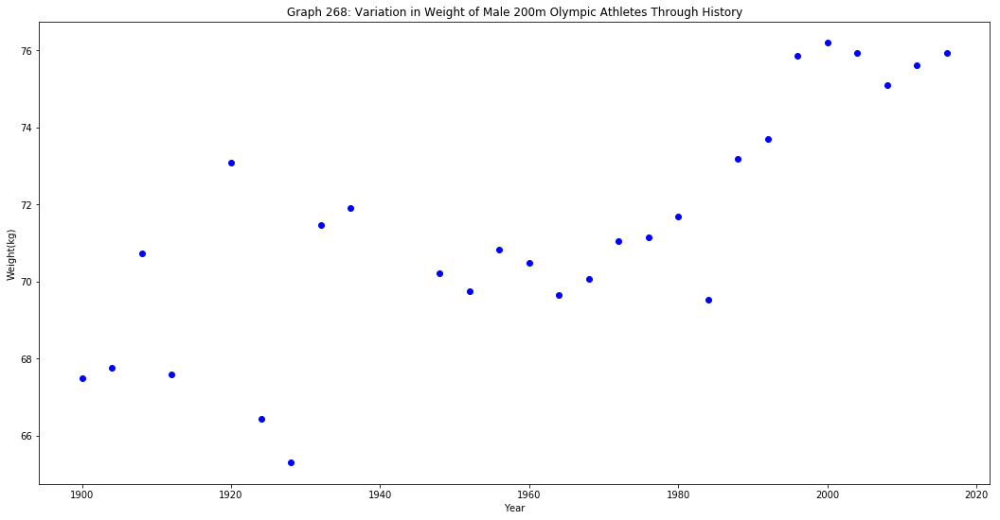

Steeplechase
3000
F


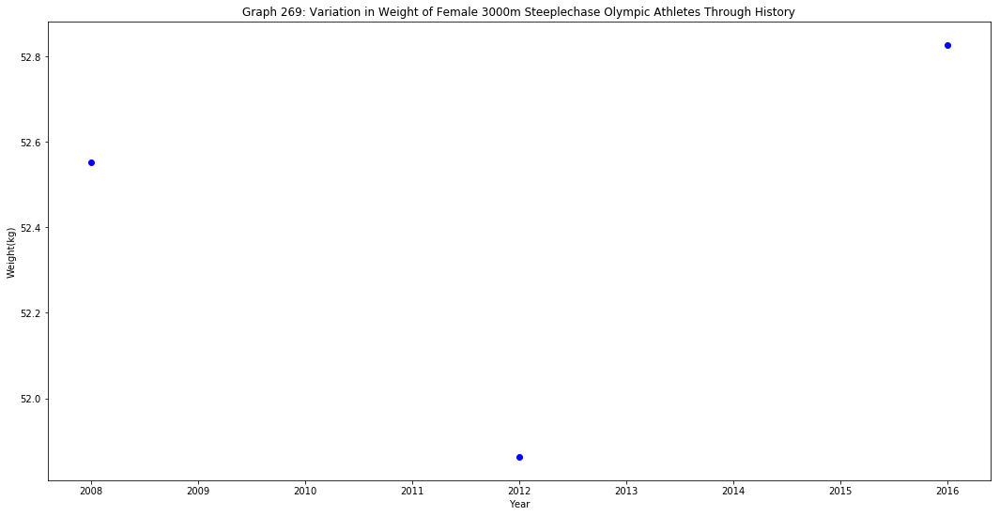

M


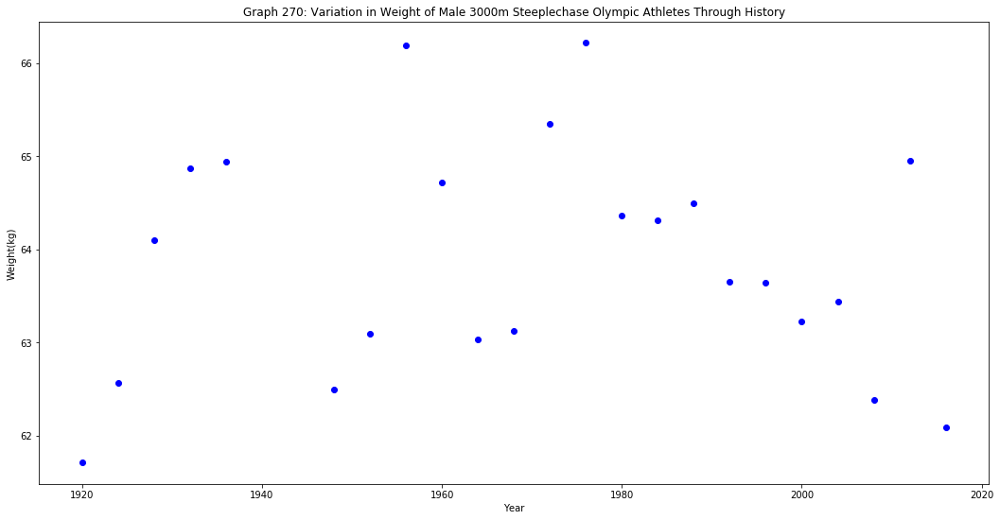

Hurdles
110
F
No results for this combination in ol_running_groups
M


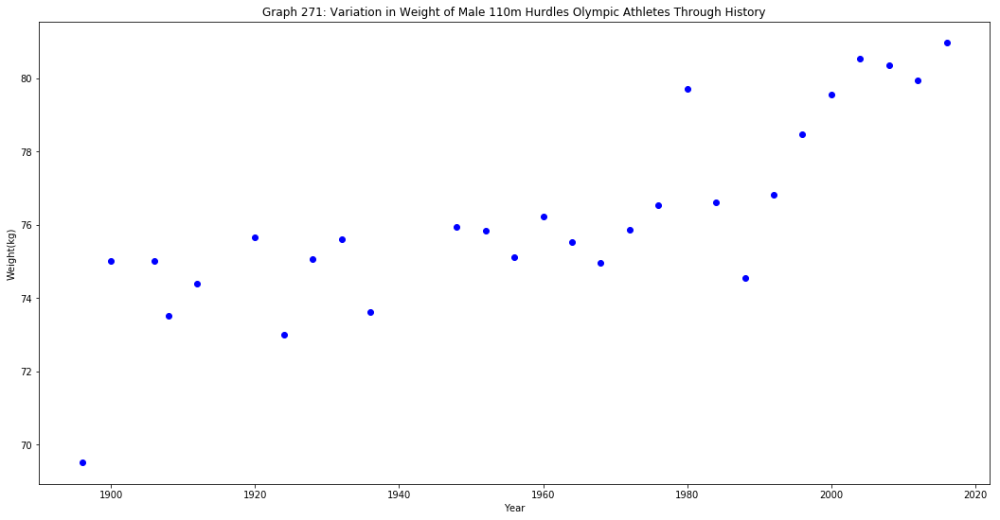

400
F


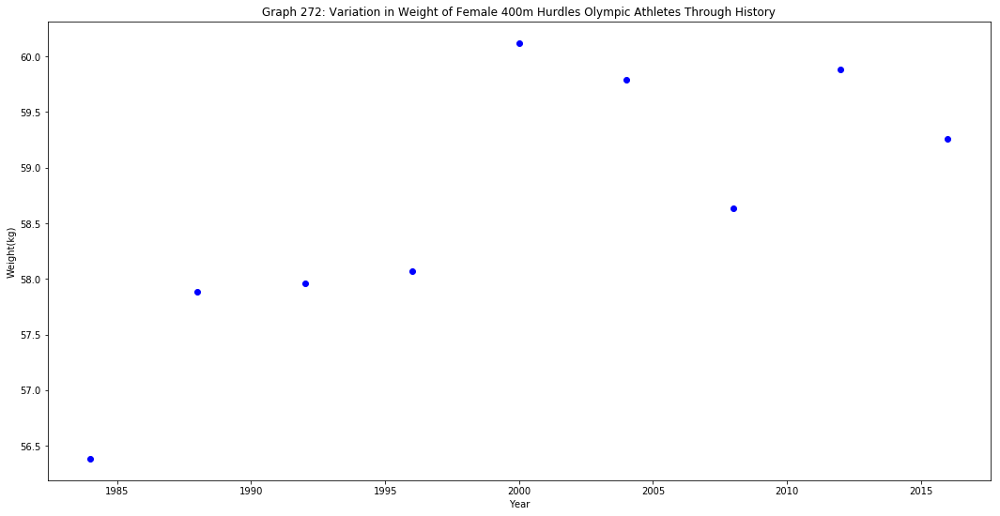

M


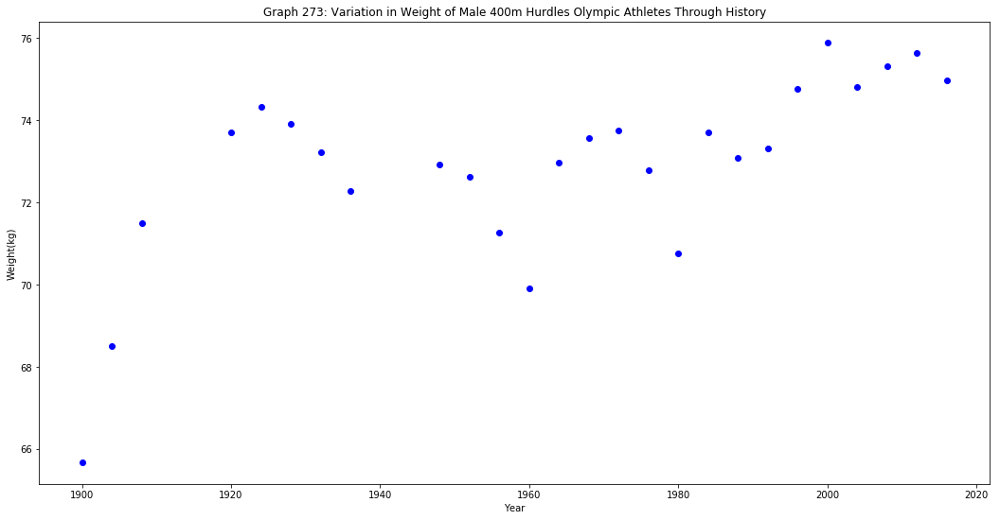

100
F


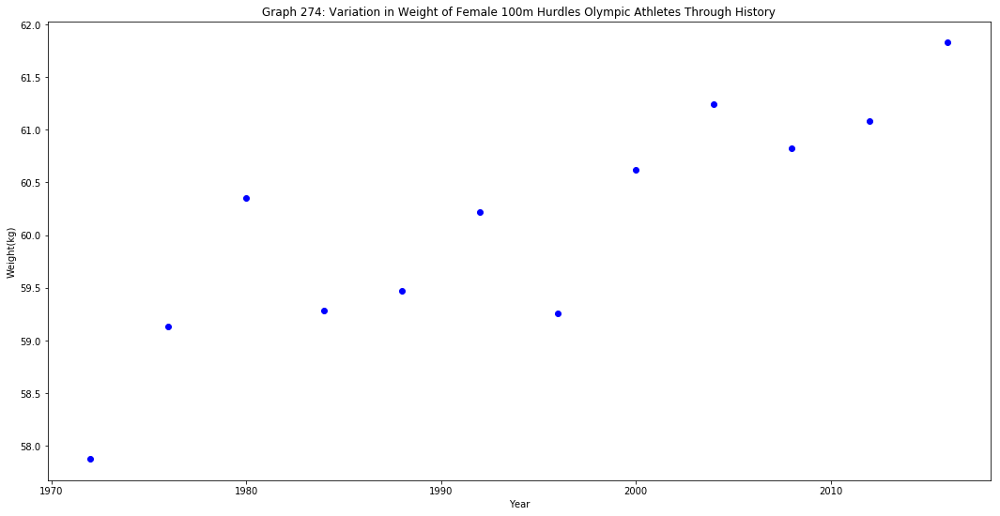

M
No results for this combination in ol_running_groups
Road
42195
F


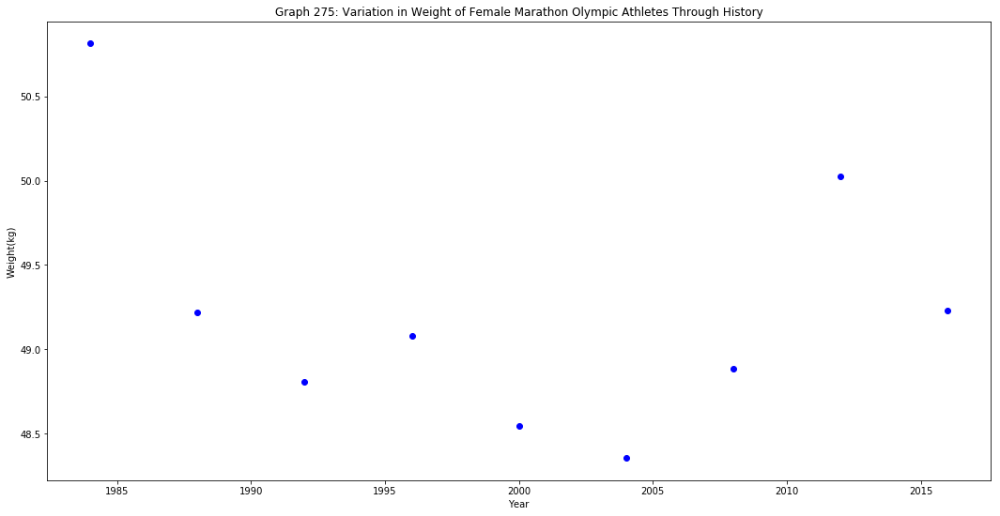

M


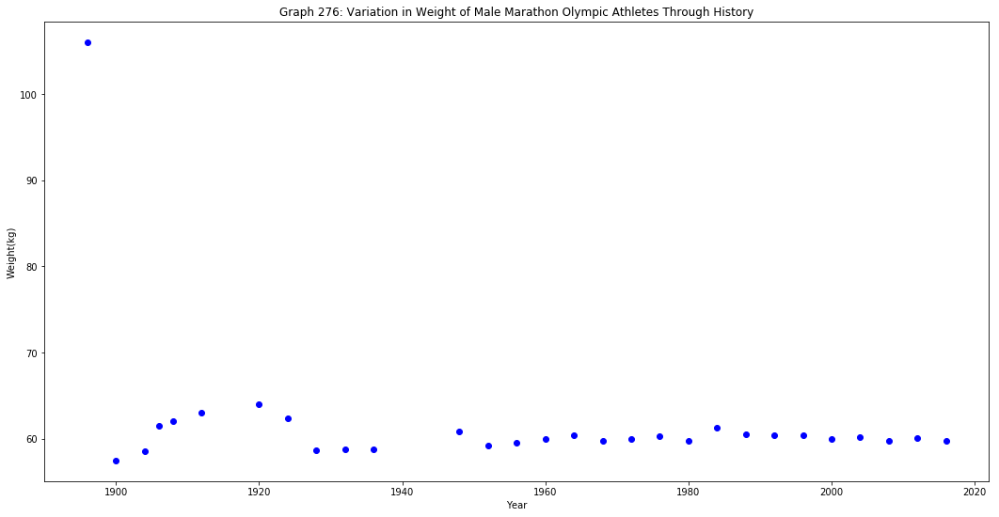

Track_Flat
100
F


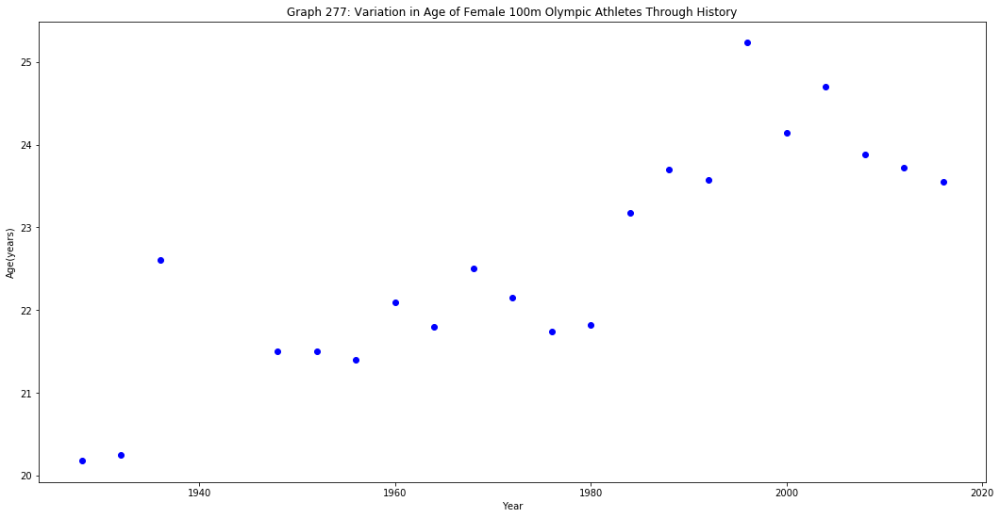

M


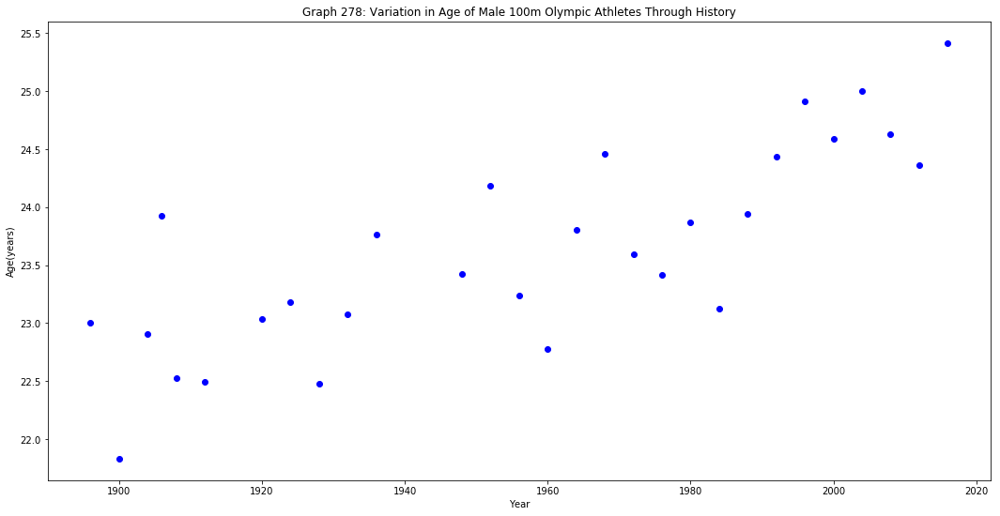

1500
F


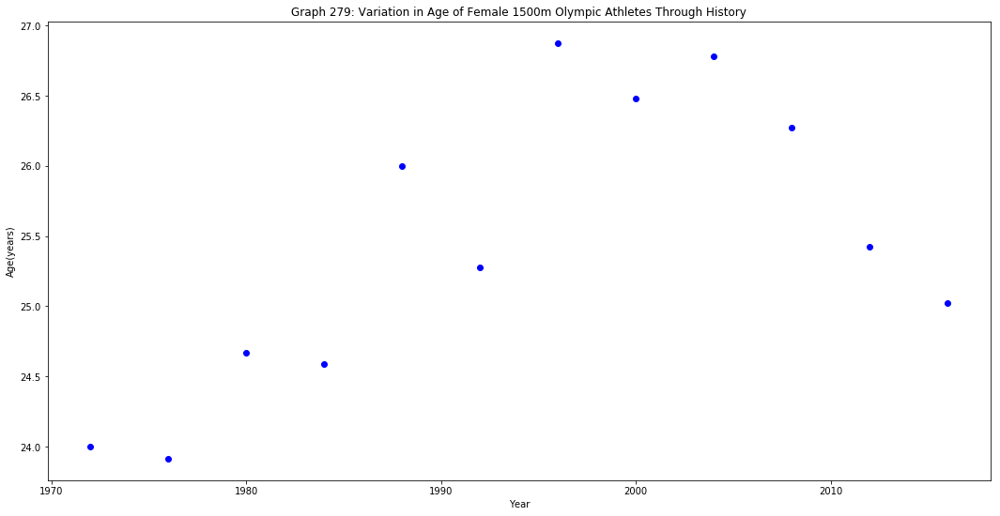

M


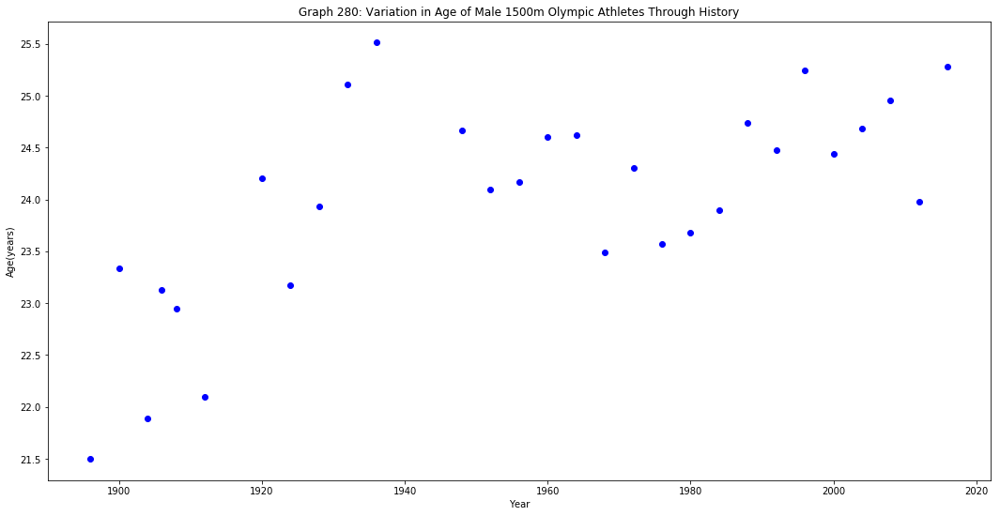

5000
F


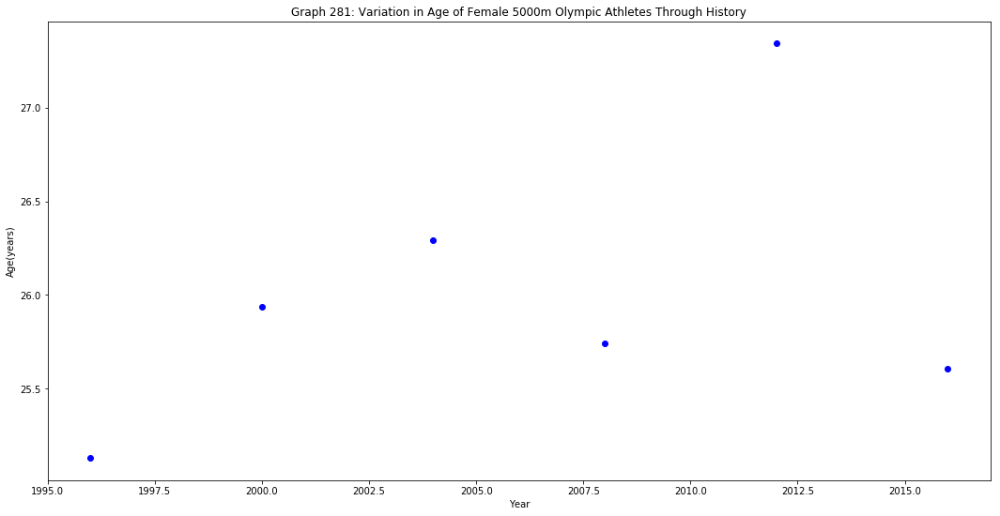

M


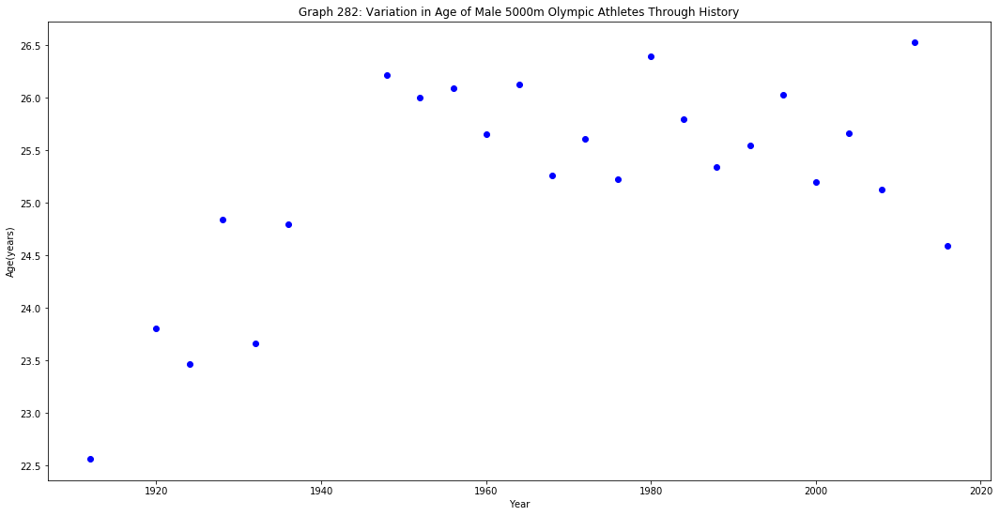

400
F


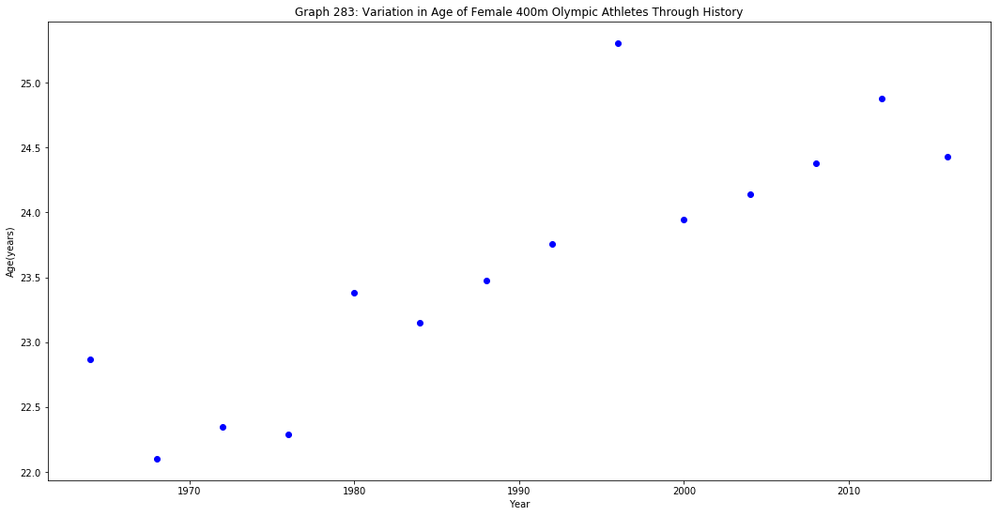

M


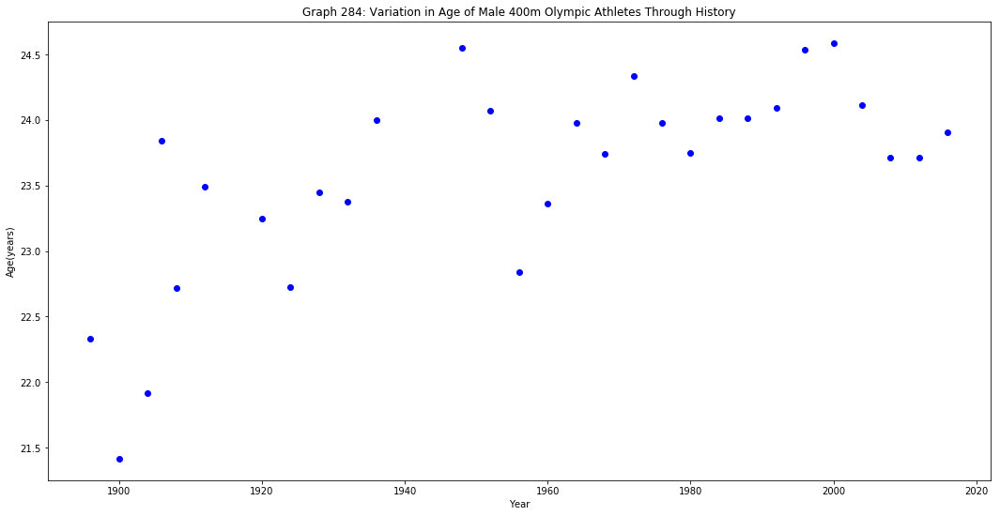

800
F


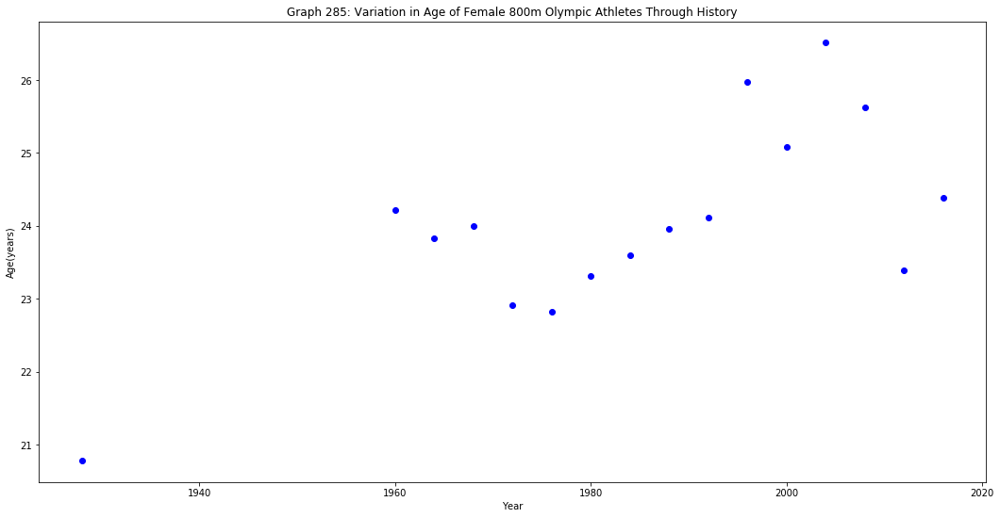

M


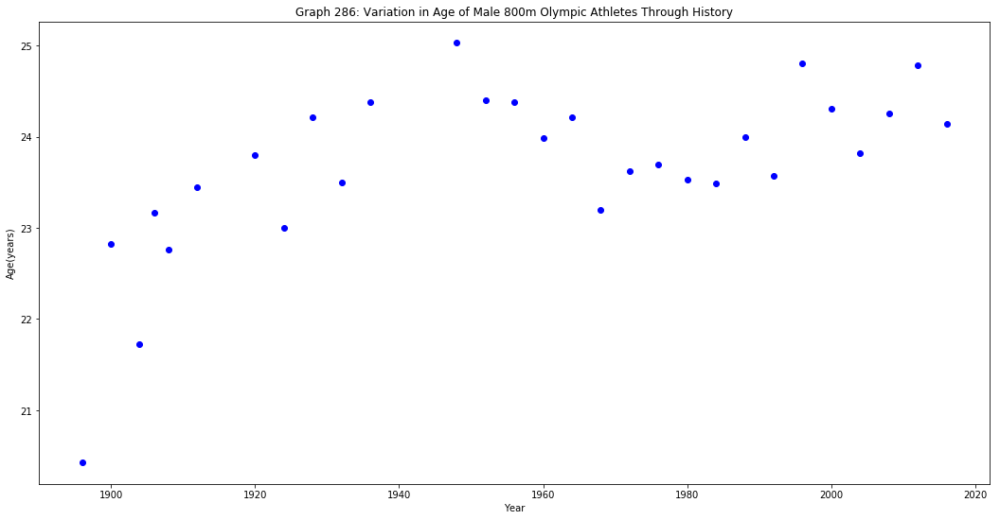

10000
F


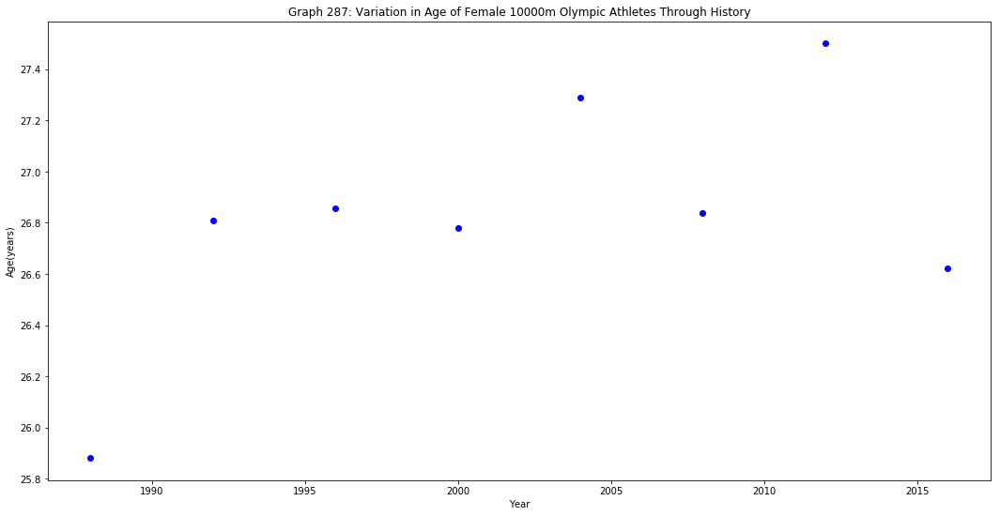

M


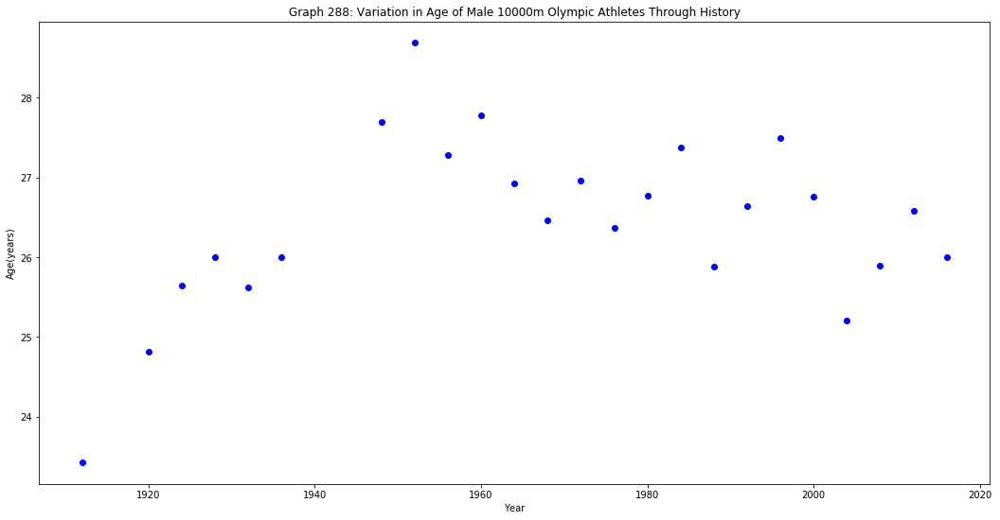

200
F


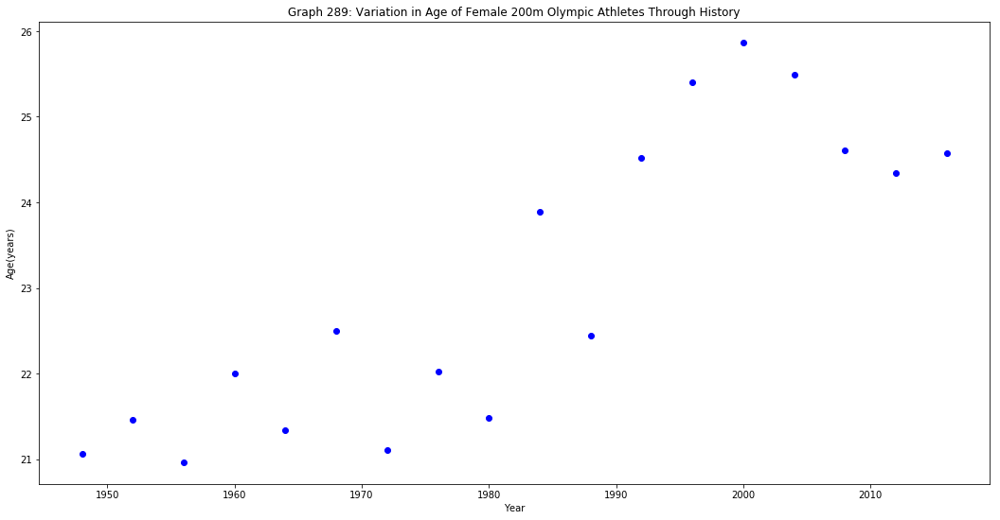

M


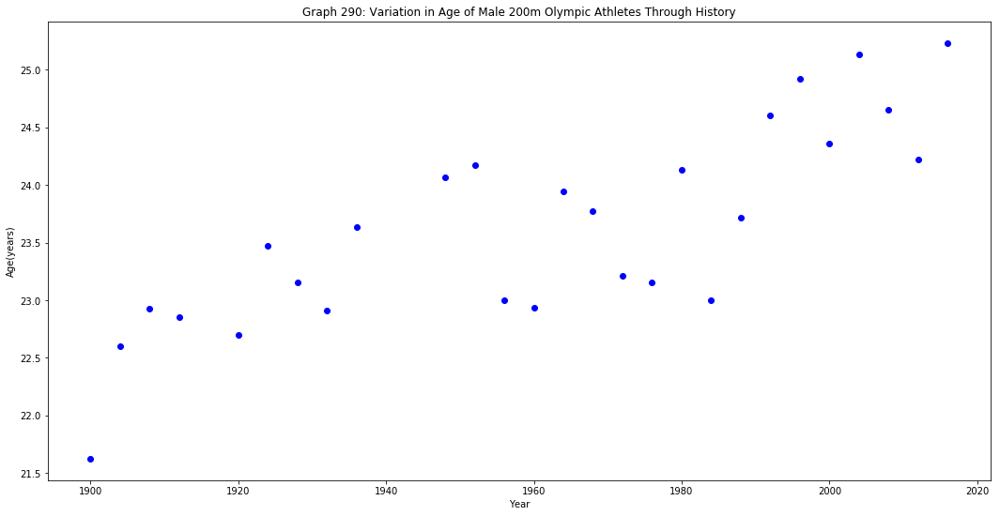

Steeplechase
3000
F


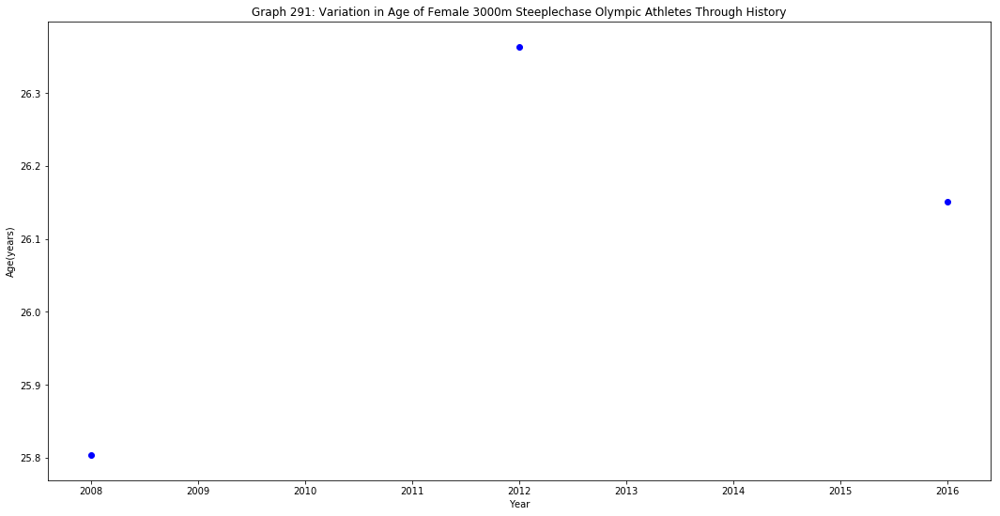

M


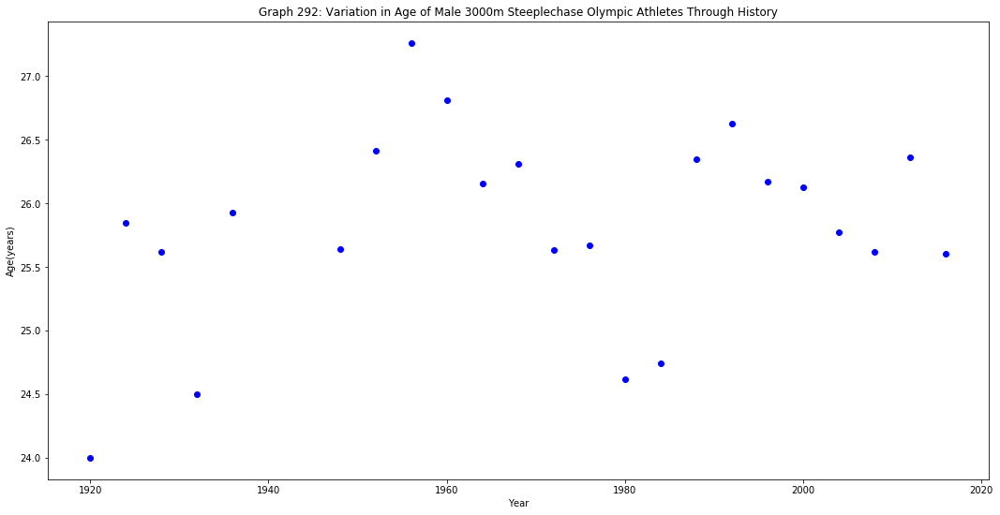

Hurdles
110
F
No results for this combination in ol_running_groups
M


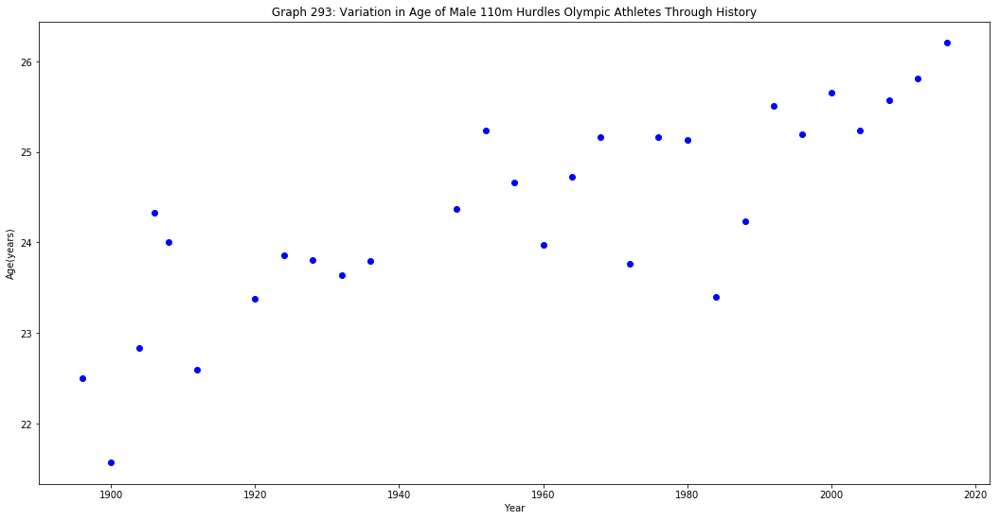

400
F


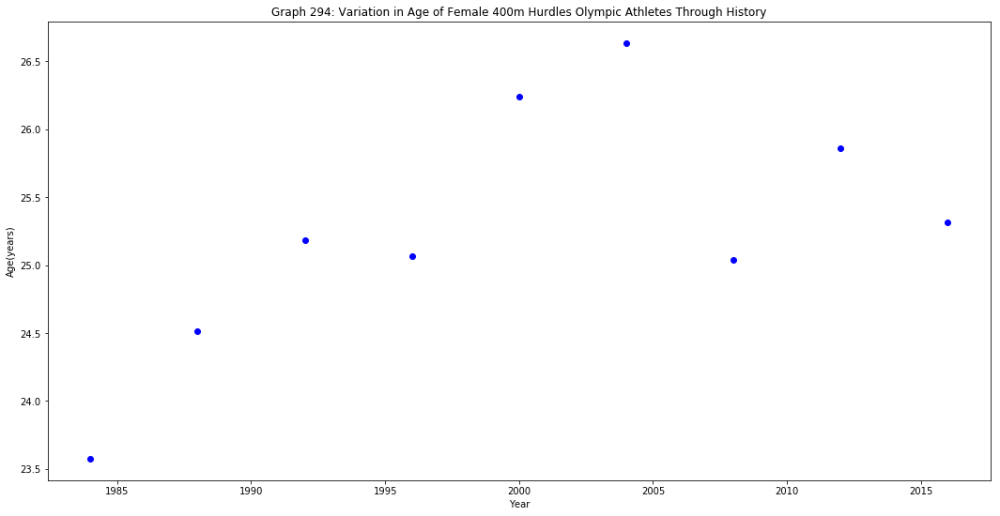

M


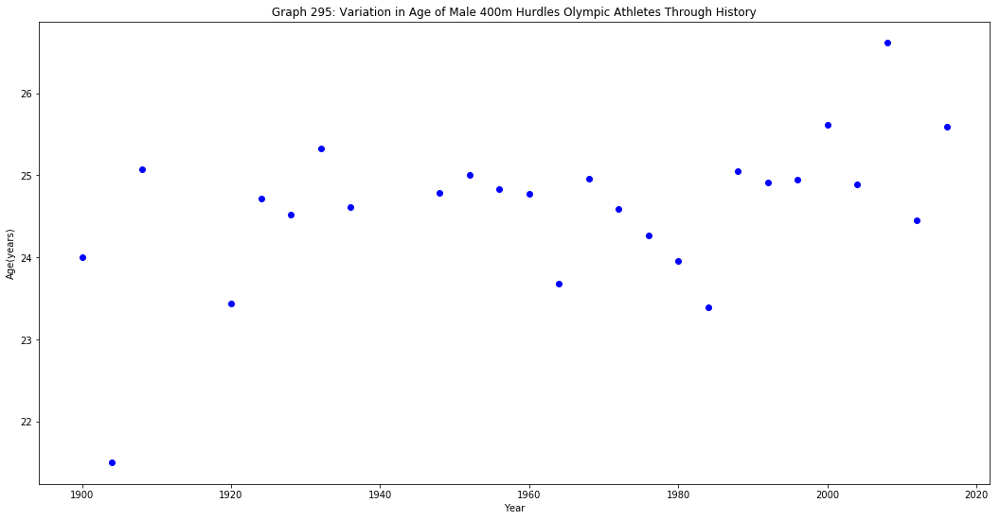

100
F


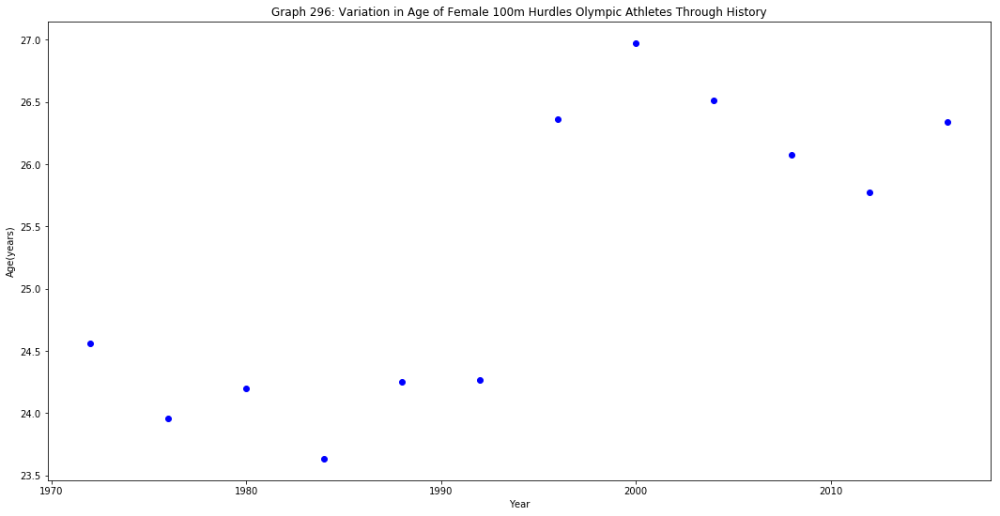

M
No results for this combination in ol_running_groups
Road
42195
F


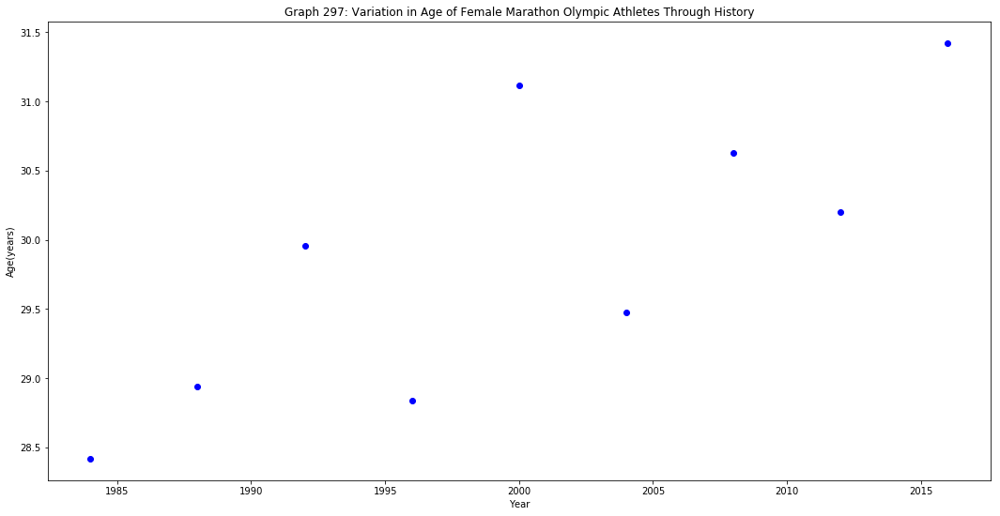

M


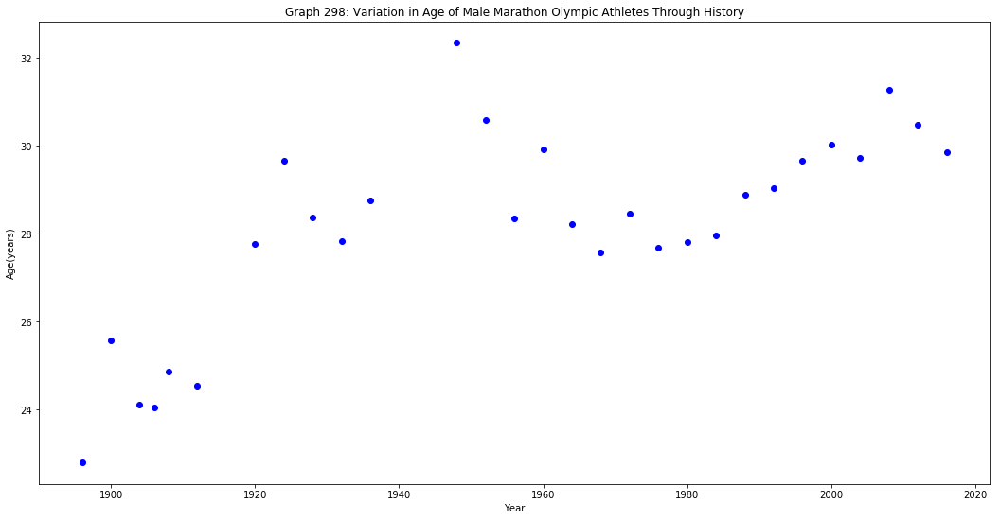

Track_Flat
100
F


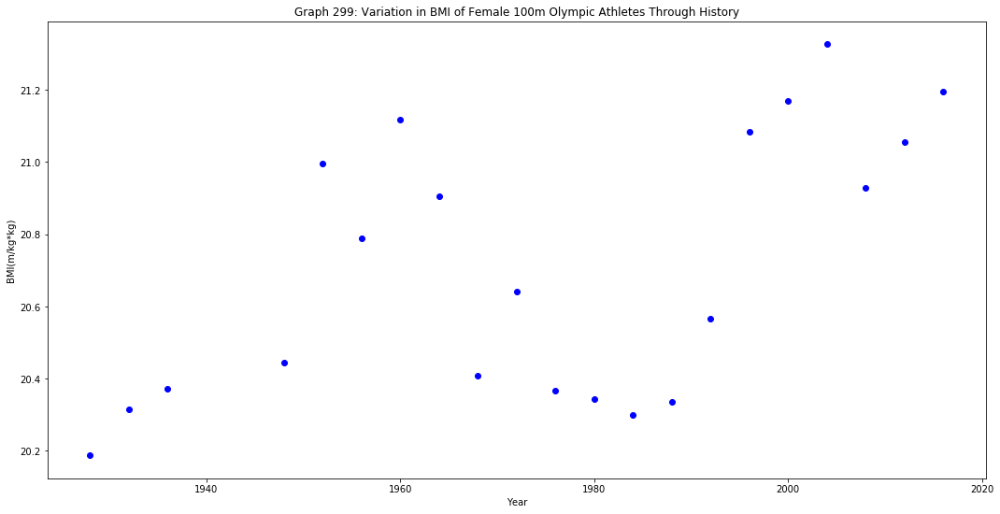

M


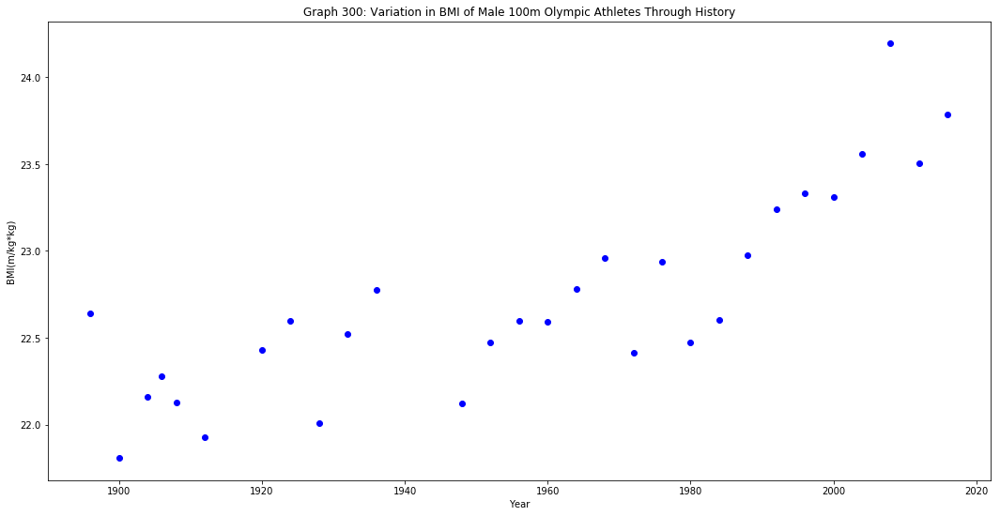

1500
F


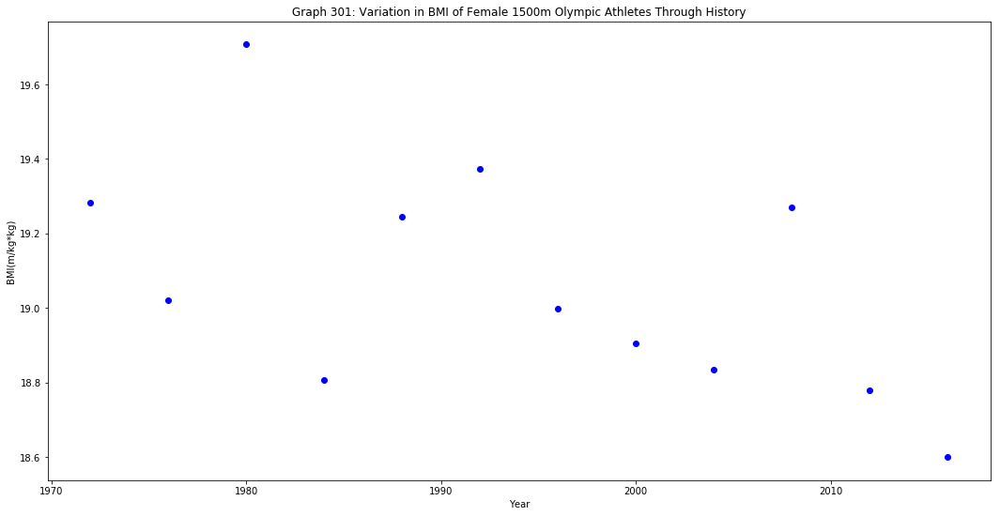

M


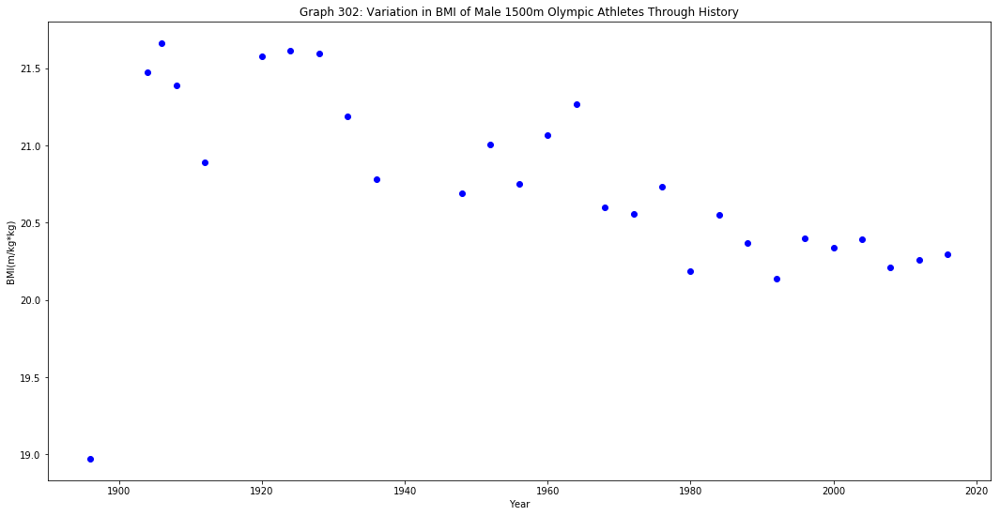

5000
F


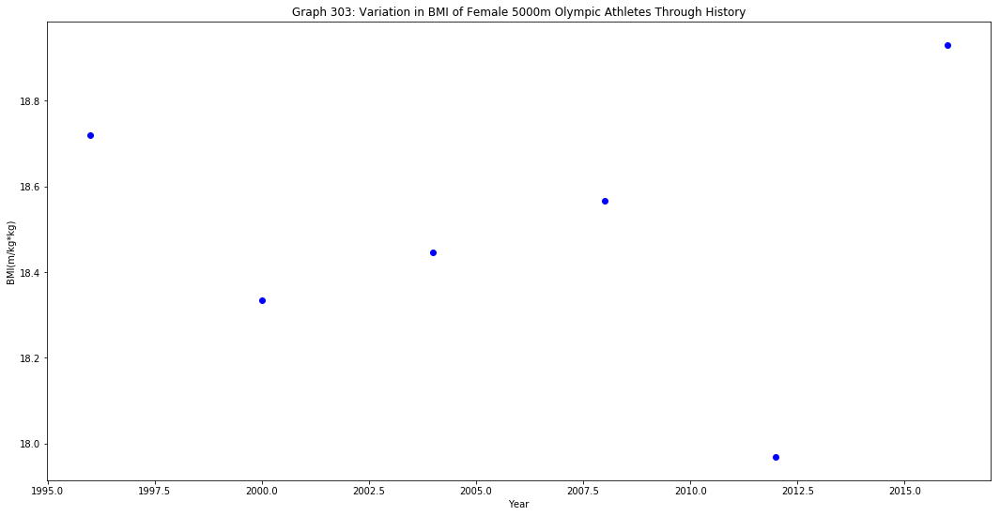

M


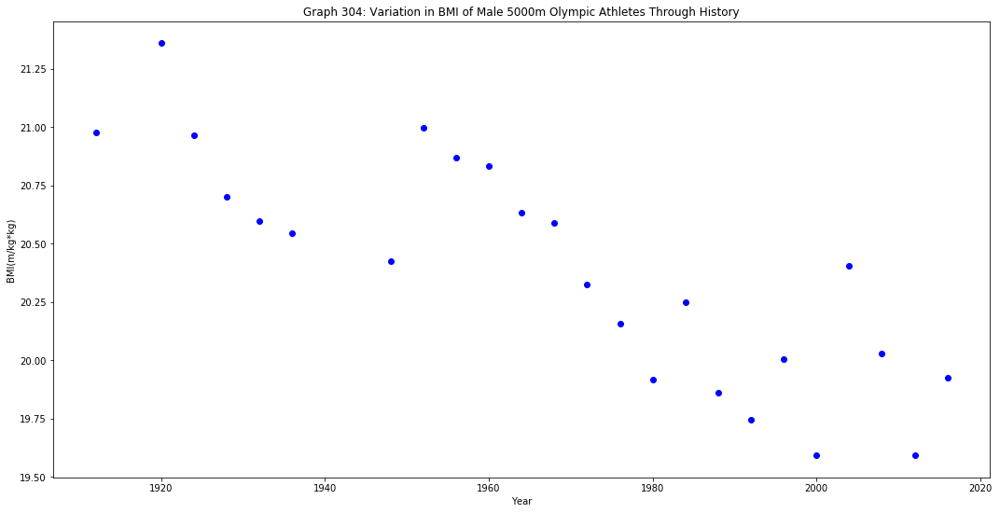

400
F


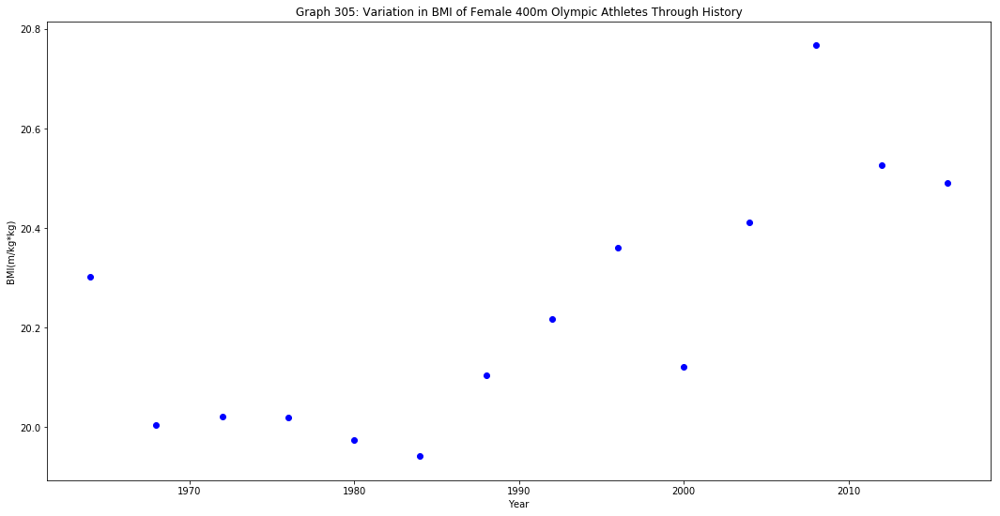

M


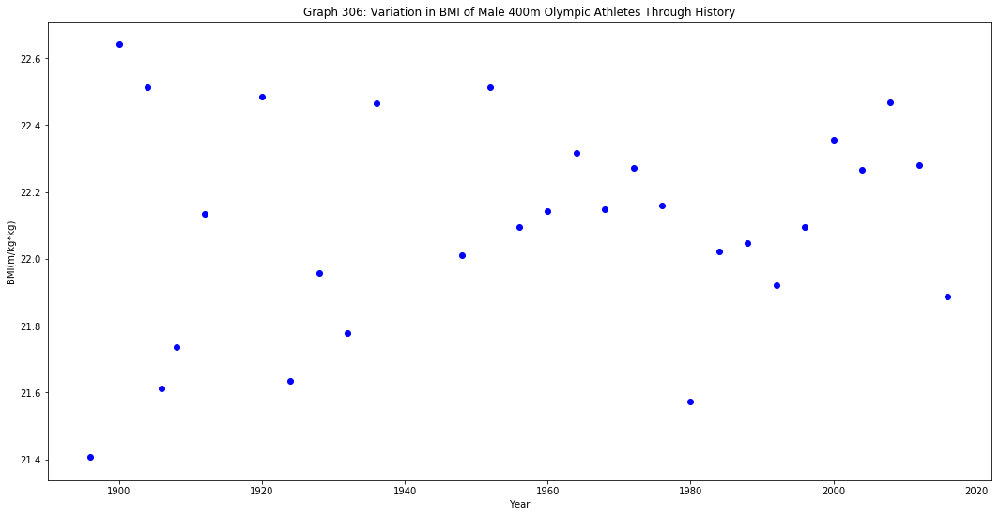

800
F


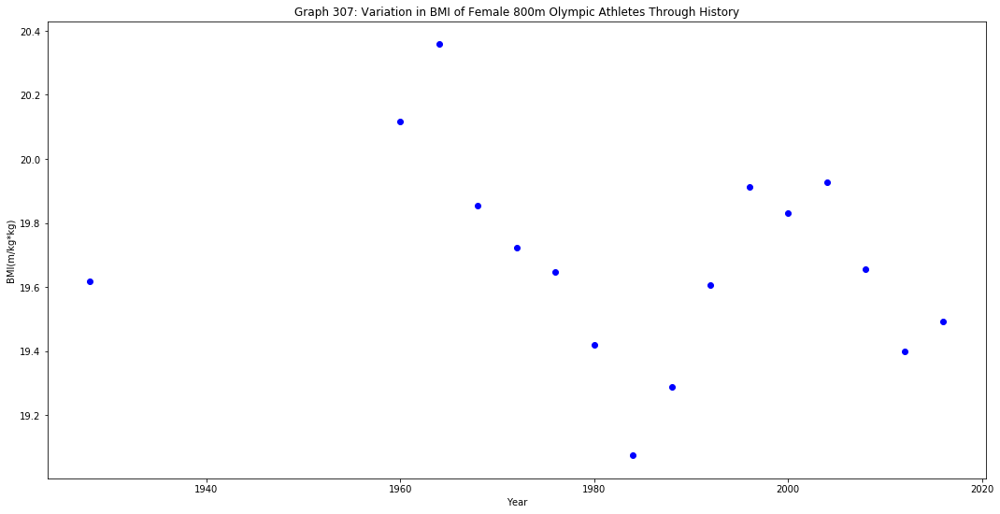

M


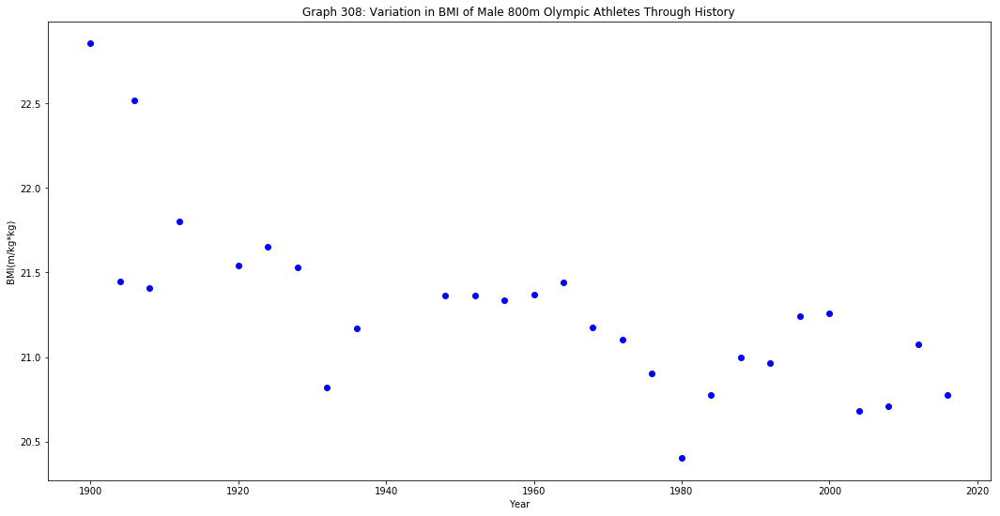

10000
F


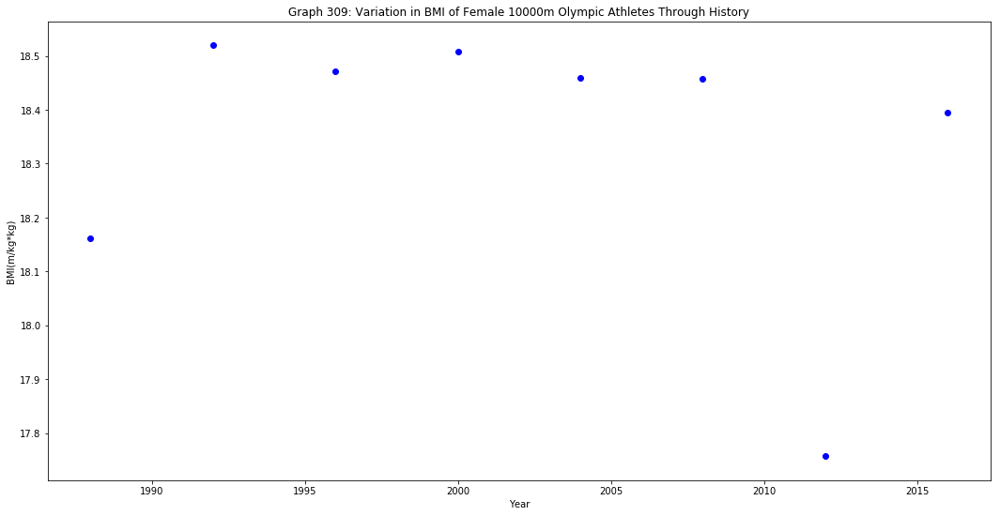

M


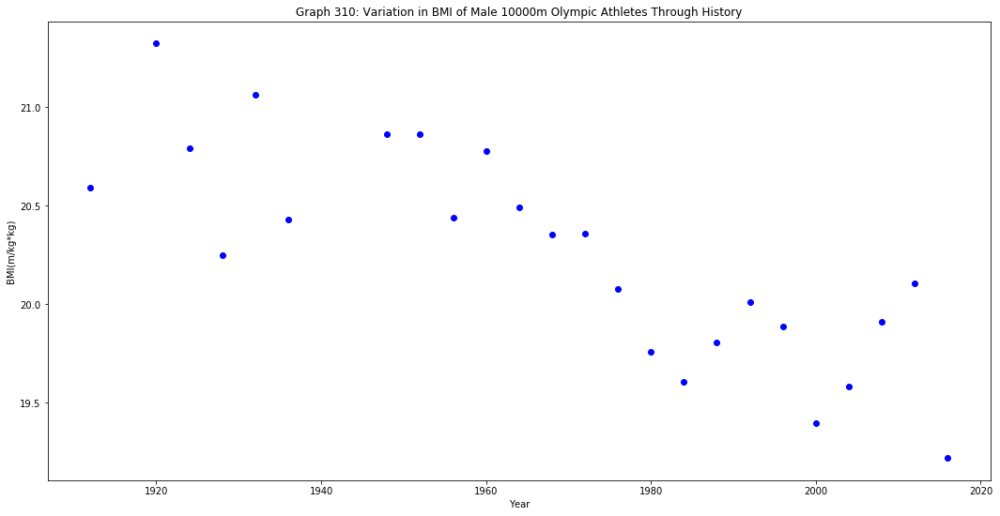

200
F


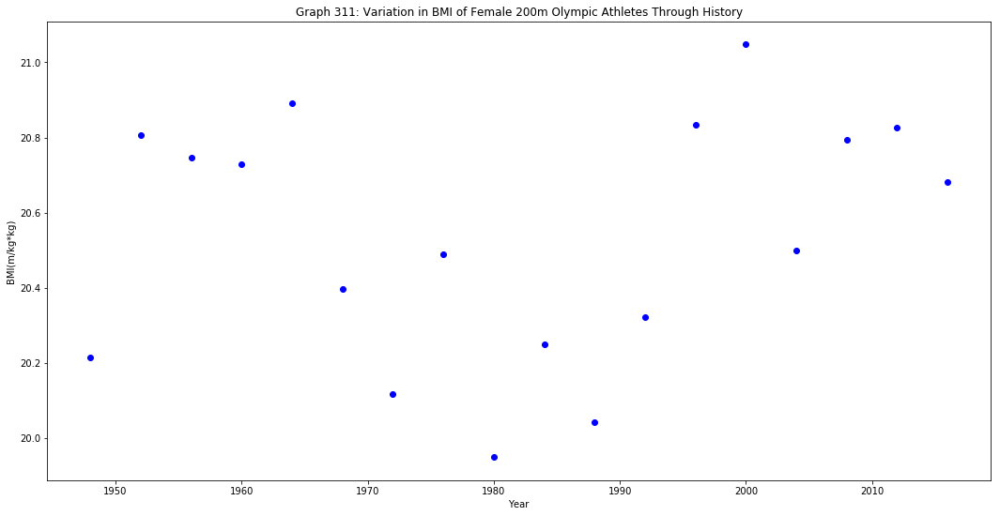

M


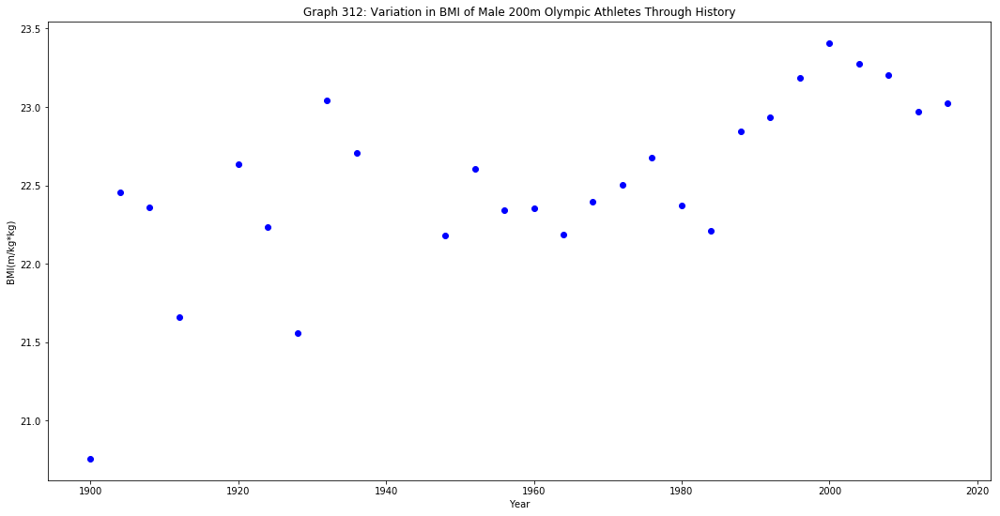

Steeplechase
3000
F


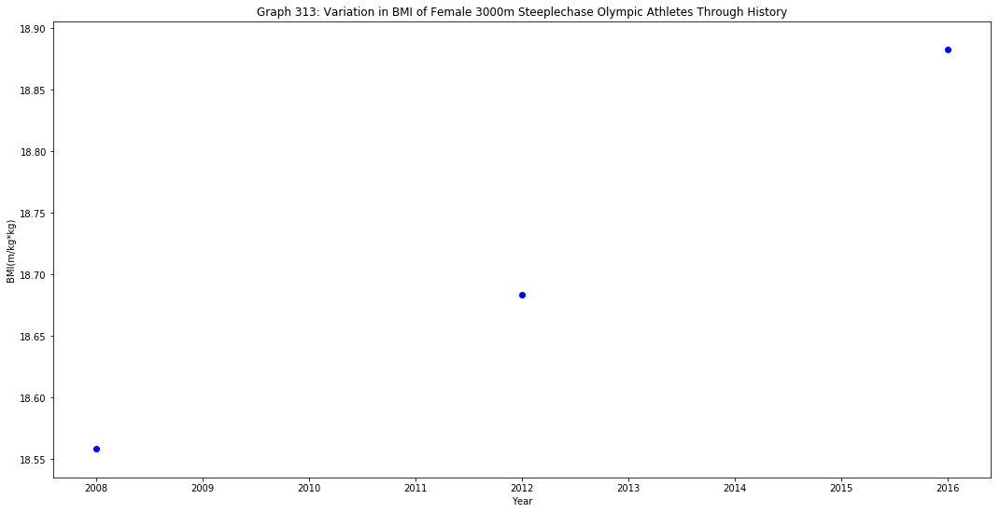

M


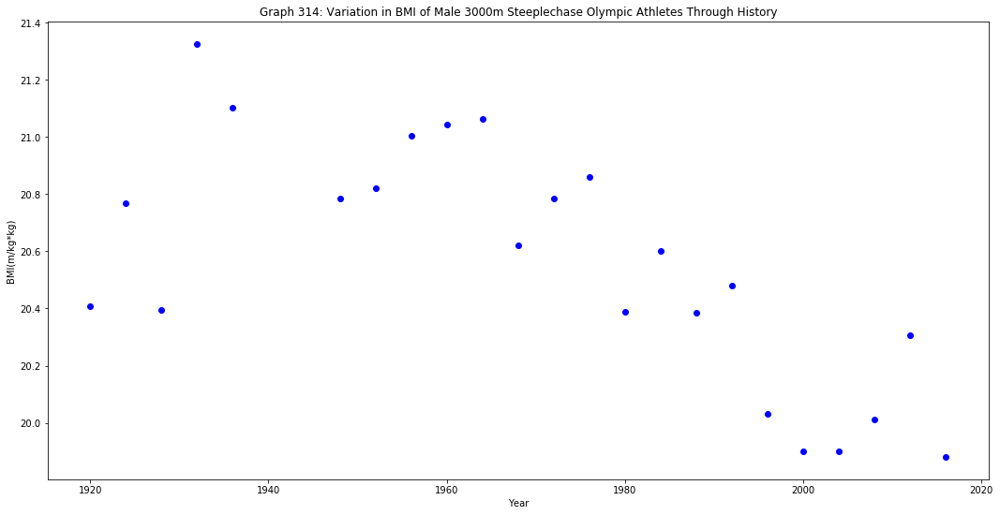

Hurdles
110
F
No results for this combination in ol_running_groups
M


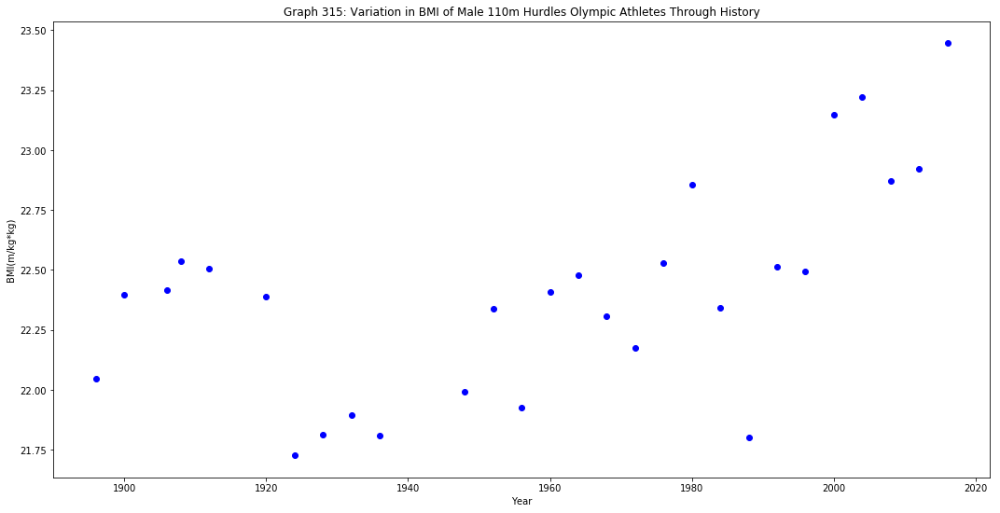

400
F


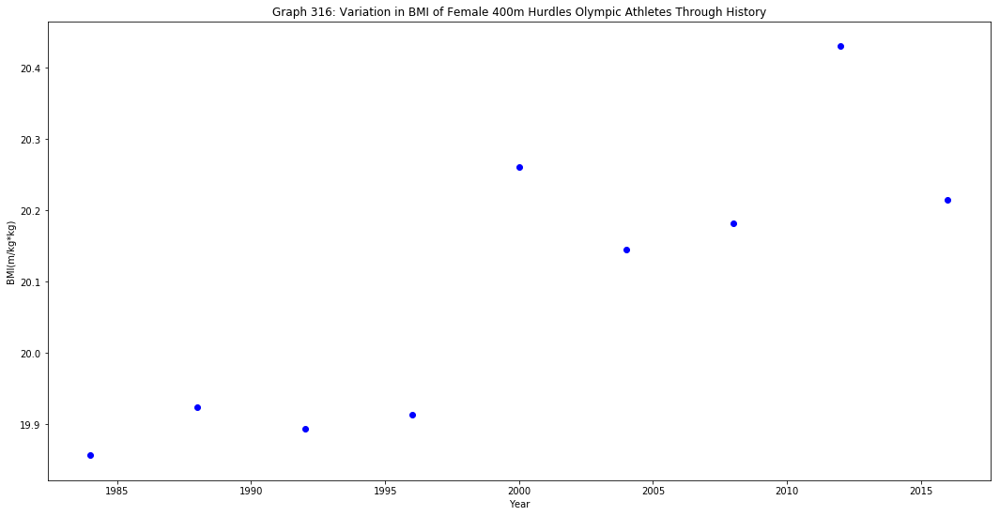

M


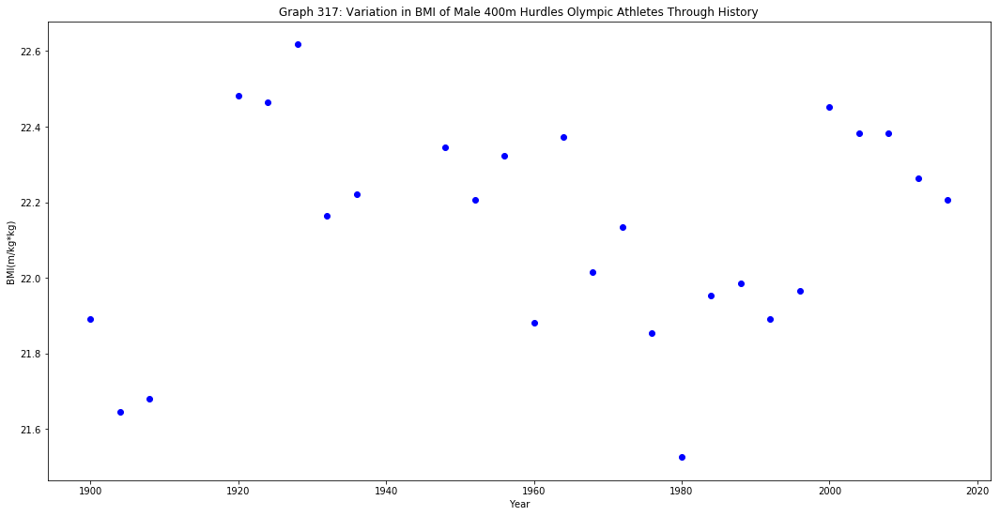

100
F


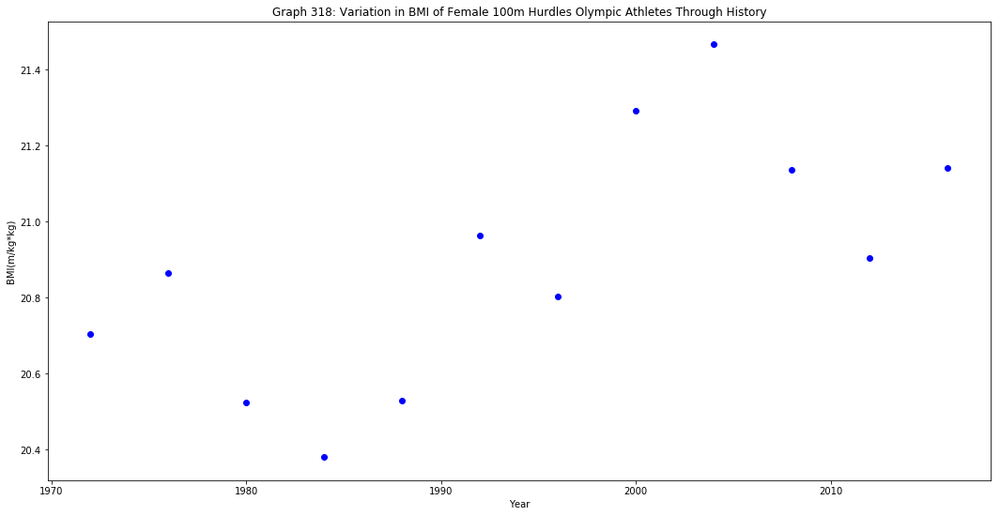

M
No results for this combination in ol_running_groups
Road
42195
F


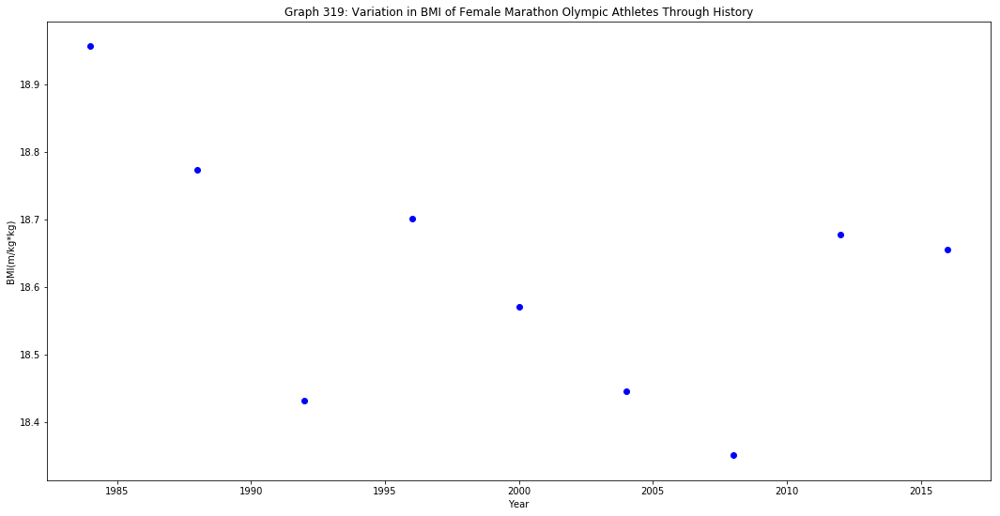

M


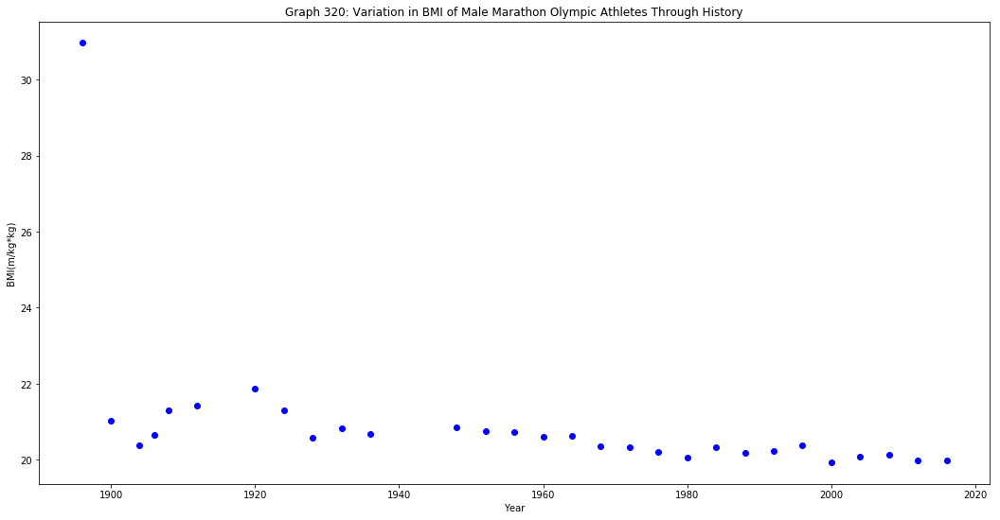

In [134]:
plot_athlete_data(event_categories, characteristics)

### 3.2. Modelling and Making Predictions

# Notes Below This Heading

/home/matt/anaconda3/envs/clustering/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


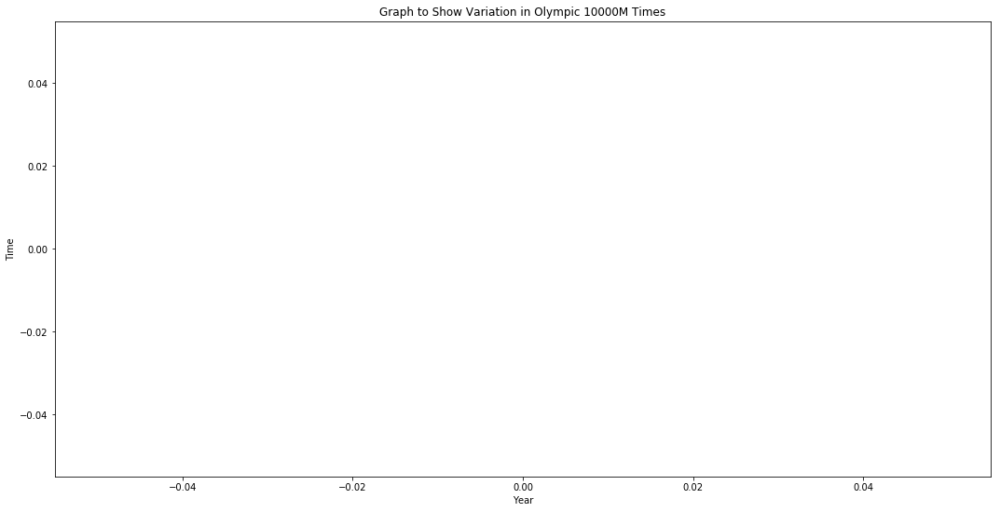

In [135]:
# Plotting marathon times vs year for ol_tf_running data

#times = ol_tf_running[ol_tf_running['Road'] == '42195 ']['Time'].tolist()
#racetimes = list(map(datetime.time, ol_tf_running[ol_tf_running['Road'] == '42195 ']['Time']))
#years = ol_tf_running[ol_tf_running['Road'] == '42195 ']['Year']
years = list(map(int, ol_tf_running[ol_tf_running['Road'] == '42195 ']['Year'].values))
#wyears = list(map(int, tf_W10000['Year'].values))
#years = list(map(int, tf_M10000['Year'].values))
#times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]
#wtimes =[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]
plt.figure(figsize=(18, 9))
plt.scatter(years, list(ol_tf_running[ol_tf_running['Road'] == '42195 ']['Time']), color='b')
plt.xlabel('Year')
plt.ylabel('Time')
plt.title('Graph to Show Variation in Olympic 10000M Times')
plt.show()

### How have results changed over the years?
Is this the same across all sports?

### How have athletes changed over the years?
Does this correlate with improvements in performance?
Is it the same for men and women?

### Other Questions
- Is there a relationship between height, weight, age and performance (time?)
- Is there a relationship between characterisitics and event?
- Have performances improved at the same rate in each event?
- Has performance changed in the same way for women and men?
- Can we create a model that predicts how fast a runner would be at a different distance? Does it work? For fun: Who would win an a race between Mo and Usain at 400m? 800m?

### Clustering and PCA Analysis on Olympic Athletes
Can we cluster male and female athletes into groups based on Age, Physical characterisitics and Nationality?
What sports are similar/overlap? Is it the same for men and women?

### Business Understanding
The problem/questions we need to answer

### Data Understanding
Understanding Data

In [136]:
# Size and shape of data set 
# Check for missing values
# Check for unexpected/different data types
# Extract features of interest and visualise them

In [137]:
# Size and shape of data set
# See above

In [138]:
tfgroups = ol_tf.groupby(['Gender', 'Event'])
tf_M10000 = tfgroups.get_group(('M', '10000M Men'))
tf_W10000 = tfgroups.get_group(('W', '10000M Women'))
tf_M100 = tfgroups.get_group(('M', '100M Men'))

In [139]:
tf_M10000.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69 entries, 1 to 69
Data columns (total 8 columns):
Gender         69 non-null object
Event          69 non-null object
Location       69 non-null object
Year           69 non-null object
Medal          69 non-null object
Name           69 non-null object
Nationality    69 non-null object
Result         69 non-null object
dtypes: object(8)
memory usage: 4.9+ KB


In [140]:
wtimes = [datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]

In [141]:
times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]

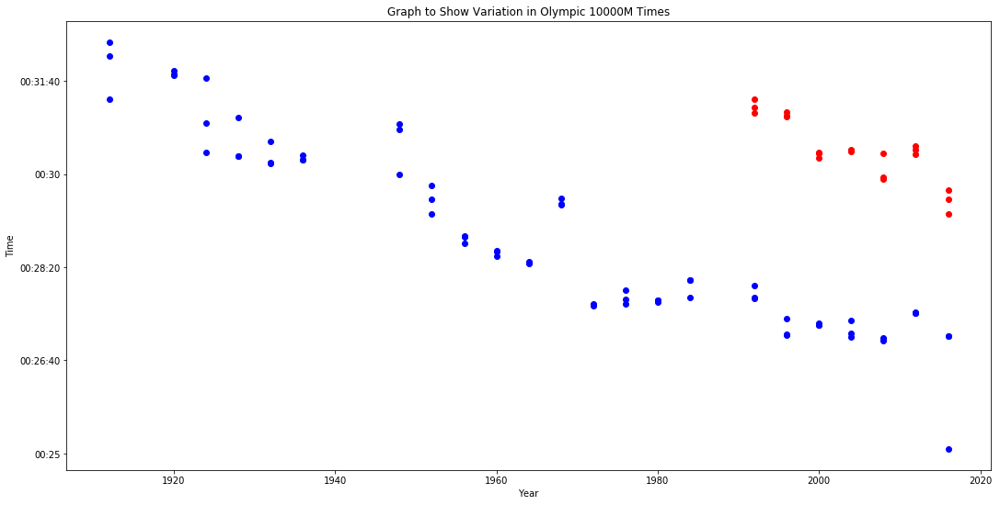

In [142]:
wyears = list(map(int, tf_W10000['Year'].values))
years = list(map(int, tf_M10000['Year'].values))
times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]
wtimes =[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]
plt.figure(figsize=(18, 9))
plt.scatter(wyears, wtimes, color='r')
plt.scatter(years, times, color='b')
plt.xlabel('Year')
plt.ylabel('Time')
plt.title('Graph to Show Variation in Olympic 10000M Times')
plt.show()


In [143]:
M10000 = modern_athletics[modern_athletics['Event'] == "Athletics Men's 10,000 metres"]
#M10000

In [144]:
M100 = modern_athletics[modern_athletics['Event'] == "Athletics Men's 100 metres"]

In [145]:
M10000_clean = M10000.dropna(axis=0, subset=['Age', 'Height', 'Weight'])

In [146]:
M100_clean = M100.dropna(axis=0, subset=['Age', 'Height', 'Weight'])

In [147]:
M100_clean

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
203,96,Carlos Rodolfo Abaunza Balladares,M,18.0,168.0,60.0,Nicaragua,NCA,2004 Summer,2004,Summer,Athina,Athletics,Athletics Men's 100 metres,NaN
257,129,Ruslan Abbasov,M,22.0,181.0,74.0,Azerbaijan,AZE,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Men's 100 metres,NaN
315,168,Younis Abdallah Rabee,M,23.0,169.0,68.0,Kuwait,KUW,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's 100 metres,NaN
544,313,"Lawal Kolawole ""Kola"" Abdulai",M,21.0,172.0,66.0,Nigeria,NGR,1968 Summer,1968,Summer,Mexico City,Athletics,Athletics Men's 100 metres,NaN
546,313,"Lawal Kolawole ""Kola"" Abdulai",M,25.0,172.0,66.0,Nigeria,NGR,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's 100 metres,NaN
907,517,Glen Abrahams Martnez,M,22.0,179.0,72.0,Costa Rica,CRC,1984 Summer,1984,Summer,Los Angeles,Athletics,Athletics Men's 100 metres,NaN
909,518,Guy A. Abrahams,M,23.0,173.0,65.0,Panama,PAN,1976 Summer,1976,Summer,Montreal,Athletics,Athletics Men's 100 metres,NaN
911,519,Harold Maurice Abrahams,M,20.0,183.0,75.0,Great Britain,GBR,1920 Summer,1920,Summer,Antwerpen,Athletics,Athletics Men's 100 metres,NaN
915,519,Harold Maurice Abrahams,M,24.0,183.0,75.0,Great Britain,GBR,1924 Summer,1924,Summer,Paris,Athletics,Athletics Men's 100 metres,Gold
1055,590,Mohamed Abu Abdullah,M,27.0,173.0,74.0,Bangladesh,BAN,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Men's 100 metres,NaN


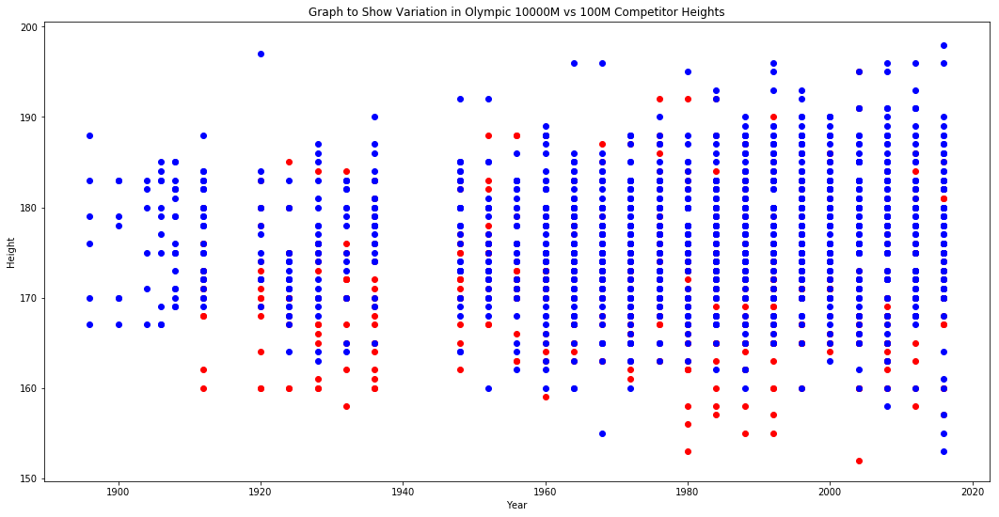

In [148]:
years = list(map(int, M10000_clean['Year'].values))
M100years = list(map(int, M100_clean['Year'].values))
#times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]
#wtimes =[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]
plt.figure(figsize=(18, 9))
plt.scatter(years, M10000_clean['Height'], color='r')
plt.scatter(M100years, M100_clean['Height'], color='b')
plt.xlabel('Year')
plt.ylabel('Height')
plt.title('Graph to Show Variation in Olympic 10000M vs 100M Competitor Heights')
plt.show()

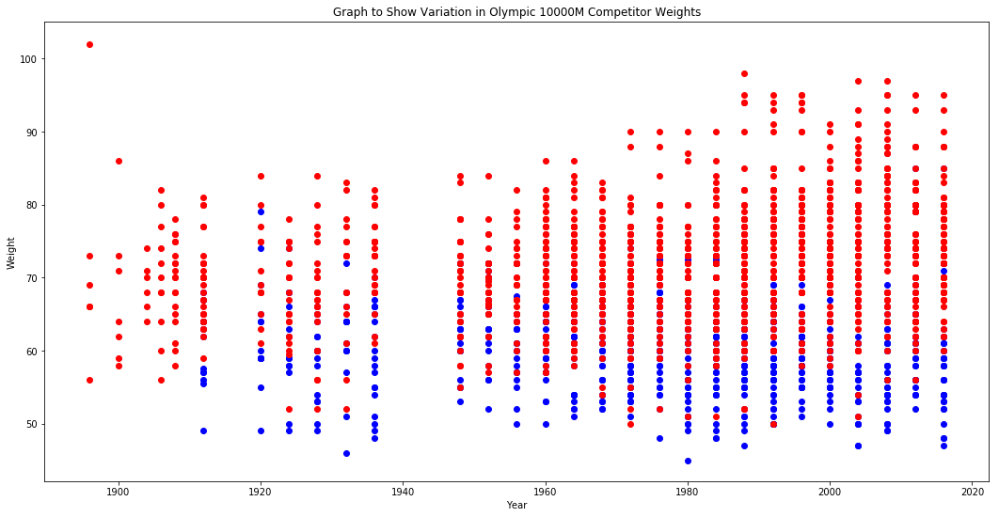

In [149]:
years = list(map(int, M10000_clean['Year'].values))
#times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]
#wtimes =[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]
plt.figure(figsize=(18, 9))
plt.scatter(years, M10000_clean['Weight'], color='b')
plt.scatter(M100years, M100_clean['Weight'], color='r')
plt.xlabel('Year')
plt.ylabel('Weight')
plt.title('Graph to Show Variation in Olympic 10000M Competitor Weights')
plt.show()


In [150]:
M10000_clean_medals = M10000_clean[M10000_clean['Medal'].notna()]

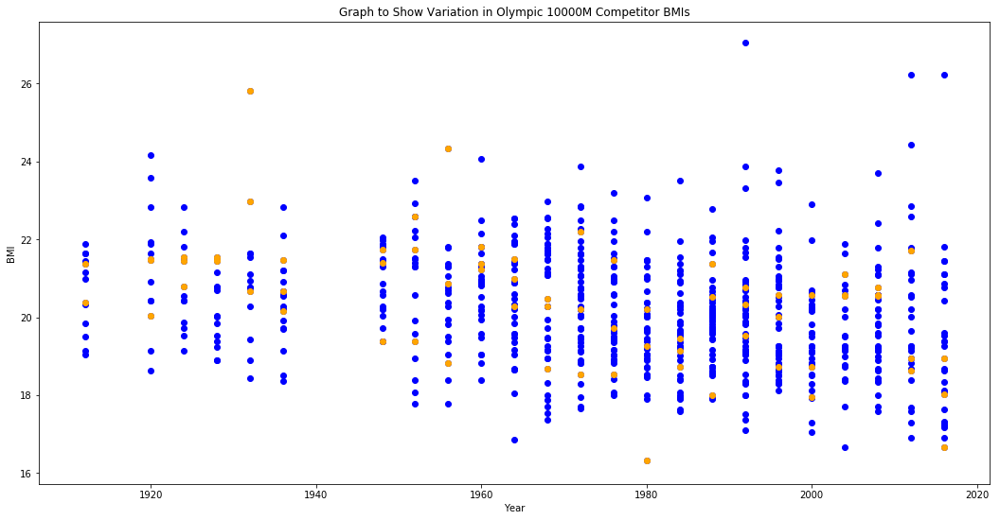

In [151]:
years = list(map(int, M10000_clean['Year'].values))
M10000_clean_medals = M10000_clean[M10000_clean['Medal'].notna()]
medalyears = list(map(int, M10000_clean_medals['Year'].values))
#times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]
#wtimes =[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]
plt.figure(figsize=(18, 9))
plt.scatter(years, (M10000_clean['Weight']/((M10000_clean['Height']/100)**2)), color='b')
plt.scatter(medalyears, (M10000_clean_medals['Weight']/((M10000_clean_medals['Height']/100)**2)), color='orange')
plt.xlabel('Year')
plt.ylabel('BMI')
plt.title('Graph to Show Variation in Olympic 10000M Competitor BMIs')
plt.show()


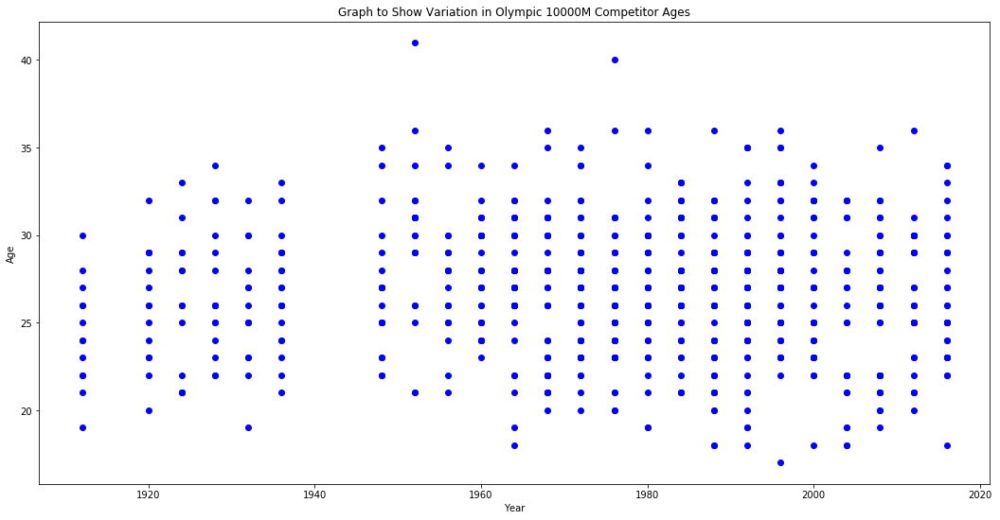

In [152]:
years = list(map(int, M10000_clean['Year'].values))
#times = [datetime.strptime(tf_M10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_M10000['Result'].values))]
#wtimes =[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]
plt.figure(figsize=(18, 9))
plt.scatter(years, M10000_clean['Age'], color='b')
#plt.scatter(years, M10000_clean['Weight'], color='b')
plt.xlabel('Year')
plt.ylabel('Age')
plt.title('Graph to Show Variation in Olympic 10000M Competitor Ages')
plt.show()

In [153]:
modern_athletics['Year'].unique()

array([1932, 2000, 1936, 1912, 2012, 1920, 1924, 1928, 2004, 2008, 1976,
       2016, 1980, 1984, 1972, 1996, 1992, 1988, 1964, 1952, 1960, 1968,
       1948, 1906, 1956, 1908, 1904, 1900, 1896])

In [154]:
ol_tf['Year'].unique()

array(['2016', '2008', '2000', '1992', '1984', '1976', '1968', '1960',
       '1952', '1936', '1928', '1920', '2012', '2004', '1996', '1980',
       '1972', '1964', '1956', '1948', '1932', '1924', '1912', '1908',
       '1900', '1904', '1896', '1988'], dtype=object)

In [155]:
top_running['Date']

0       2012-09-08
1       2010-08-29
2       2010-08-22
3       1997-08-24
4       1997-08-13
5       2011-10-09
6       2010-10-07
7       2012-06-07
8       1981-10-06
9       1997-07-07
10      2012-09-08
11      2012-09-06
12      1984-08-26
13      1996-01-09
14      2009-06-09
15      2010-04-06
16      2012-06-23
17      2016-08-15
18      1996-09-16
19      1997-08-22
20      2010-04-06
21      1999-03-09
22      1984-08-26
23      2002-08-09
24      1979-05-07
25      1984-08-22
26      2002-08-09
27      2013-06-09
28      1984-08-24
29      2014-07-18
           ...    
18214   1999-07-28
18215   2001-07-13
18216   2004-05-31
18217   2006-07-11
18218   2010-08-29
18219   2013-07-06
18220   2014-07-12
18221   1997-08-13
18222   1997-08-24
18223   2013-09-08
18224   1996-06-07
18225   1999-07-03
18226   1999-08-04
18227   2004-07-31
18228   2011-07-08
18229   2012-08-23
18230   2012-09-07
18231   2014-09-05
18232   1987-09-08
18233   2005-08-26
18234   2006-07-03
18235   2013

In [156]:
running_dates = [datetime.strptime(top_running['Date'].values[i], "%Y-%m-%d").date() for i in range(len(top_running['Date'].values))]
#running
#running['Date'].values
#[datetime.strptime(tf_W10000['Result'].values[i], "%M:%S.%f").time() for i in range(len(tf_W10000['Result'].values))]

TypeError: strptime() argument 1 must be str, not numpy.datetime64

In [ ]:
list_of_years = [running_dates[i].year for i in range(len(running_dates))]

In [ ]:
max(list_of_years)

In [ ]:
#tf_M10000['Result'].values[0]
#result_to_time(tf_M10000['Result'].values[0])
t = datetime.strptime(tf_M10000['Result'].values[0], "%M:%S.%f")
t.time()

In [ ]:
years = list(map(int, tf_M10000['Year'].values))

In [ ]:
events_groups = all_olympics.groupby(['Event'])
#events_groups.groups
#events = grouped.get_group('')

### Prepare Data
Data already available

In [ ]:
# Given the questions of interest - clean the data
# Consider dropping missing values (justify)
# Look for outlying values
# handle categorical values - one hot encoding and feature engineering (justify)
# Merge data if needed
# Scaling/normalization
# Visualise cleaned data

### Modelling
Modelling to make predictions.
This step isn't needed for all questions. Many questions can be answered with descriptive or inferrential statistics.

In [ ]:
# Create Model - sklearn?
# For models to work, we'll need to handle missing values. 
# This might mean dropping rows/columns or using imputation.
# Need to think carefully before dropping values and justify and document the decision making process.
# We'll also need to handle categorical values - one hot encoding and feature engineering.
# Make predictions
# What factors correlate well to outcomes of interest?

### Evaluate Results
Drawing conclusions from results.

In [ ]:
# What do the visualisations and data tell us? Does this answer the question?
# Are any values difficult to predict?
# Are we over/under fitting?
# Can we re-select our data set to optimise the model?

### Deploy
This can mean:
 - Automated systems to send data to the web or other medium
 - Communication through blogs, e.g. Medium
 - Communication to others in the company, possibly a non-technical audience